<a href="https://colab.research.google.com/github/pnjha/NLP-Assignments/blob/master/nlp_q4_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install tensorflow-gpu==2.0.0-alpha0

     |████████████████████████████████| 332.1MB 49kB/s 
     |████████████████████████████████| 3.0MB 56.7MB/s 
     |████████████████████████████████| 419kB 76.7MB/s 


In [2]:
import unicodedata
import pandas as pd
import numpy as np
import tensorflow as tf
import dill
import pickle
import weakref
from matplotlib.pyplot import *
import string
from string import digits
import matplotlib.pyplot as plt
%matplotlib inline
import re
import copy
import math
import seaborn as sns; sns.set()
import keras as keras
from keras.optimizers import SGD
from keras.initializers import RandomUniform
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Embedding, Dense, LSTM, Input, Embedding, TimeDistributed, Flatten, Dropout, Activation, dot, concatenate, Bidirectional
from keras.callbacks import ModelCheckpoint
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [3]:
tf.__version__

'2.0.0-alpha0'

In [4]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/My\ Drive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
/content/drive/My Drive


In [5]:
X = pd.read_table('./NLA S20 - Assignment 2 Data/enghin/train.en', names=['src'])
Y_in = pd.read_table('./NLA S20 - Assignment 2 Data/enghin/train.hi', names=['dest_in'])
Y_out = pd.read_table('./NLA S20 - Assignment 2 Data/enghin/train.hi', names=['dest_out'])
lines = pd.concat([X[:500],Y_in[:500],Y_out[:500]], axis=1)
print(len(lines))
# lines = shuffle(lines)
lines.sample(10)

500


,src,dest_in,dest_out
233,Disease and contraction of heart and blood ves...,ह्दय और रक्त वाहिनी की बीमारी एवं संक्रमण ।,ह्दय और रक्त वाहिनी की बीमारी एवं संक्रमण ।
274,Therefore the infected person can spread the d...,अतः संक्रमित व्यक्ति विकसित होने से पूर्व ही ब...,अतः संक्रमित व्यक्ति विकसित होने से पूर्व ही ब...
317,About one fourth of the women give birth to th...,लगभग एक चौथाई महिलाएँ पहले जन्मे बच्चे के बाद ...,लगभग एक चौथाई महिलाएँ पहले जन्मे बच्चे के बाद ...
344,5 Safe Maternity Counsellors -LRB- Women Medic...,ई.ए.जी. कार्यक्रम के अन्तर्गत भारत सरकार से 5 ...,ई.ए.जी. कार्यक्रम के अन्तर्गत भारत सरकार से 5 ...
36,Pupil getting gray or white .,भूरा ( Gray ) या सफेद पुतली ( प्यूपिल ) होना ।,भूरा ( Gray ) या सफेद पुतली ( प्यूपिल ) होना ।
114,With annual test any irregular or abnormal are...,वार्षिक जाँच से अवश्य पुरस्थ ग्रंथी में अनियमि...,वार्षिक जाँच से अवश्य पुरस्थ ग्रंथी में अनियमि...
98,Lymph nodes are connected to lymph arteries an...,लसीका ग्रन्थियाँ लसीका धमनियों द्वारा एक दूसरे...,लसीका ग्रन्थियाँ लसीका धमनियों द्वारा एक दूसरे...
19,The lack of vitamin-A is even more imminent in...,विटामिन-ए की कमी खसरे तथा कुपोषण की स्थिति में...,विटामिन-ए की कमी खसरे तथा कुपोषण की स्थिति में...
31,For conjunctival cataract caused by rubella va...,रूबेला के कारण होने वाले कन्जानाईटल कैटरेक्ट क...,रूबेला के कारण होने वाले कन्जानाईटल कैटरेक्ट क...
399,"Besides this , mouth also starts drying up due...","इसके अलावा , मम्पस बीमारी , के कारण मुँह भी सू...","इसके अलावा , मम्पस बीमारी , के कारण मुँह भी सू..."


In [0]:
def process_data(data,append_char):
    data = data.apply(lambda x: x.lower())
    data = data.apply(lambda x: x.strip())
    data = data.apply(lambda x: re.sub("'", '', x))
    exclude = set(string.punctuation) # Set of all special characters
    data = data.apply(lambda x: ''.join(ch for ch in x if ch not in exclude))
    remove_digits = str.maketrans('', '', digits)
    data = data.apply(lambda x: x.translate(remove_digits))
    if append_char == 1:
        data = data.apply(lambda x : '<sos> '+ x)
    elif append_char == 2:
        data = data.apply(lambda x : x + ' <eos>')
    return data

In [7]:
lines.src = process_data(lines.src,0)
lines.dest_in = process_data(lines.dest_in,1)
lines.dest_out = process_data(lines.dest_out,2)
lines.src.sample(10),lines.dest_in.sample(10),lines.dest_out.sample(10)

(412    therefore now it is recommended by both w    a...
 88     show these to the doctor if these symptoms sta...
 307    reproductive and child health programme is bei...
 217    nonsteroidal drugs should not be taken in deng...
 51           cylindrical glasses have to be worn always 
 485    diphtheria is such a contagion that affects th...
 176    encouraging reforms in rural and urban lifesty...
 99     the web of lymph arteries is spread throughout...
 274    therefore the infected person can spread the d...
 245    the chances of bringing the situation back to ...
 Name: src, dtype: object,
 342    <sos> गर्भवती माताओं को सुरक्षित प्रसव की सेवा...
 399    <sos> इसके अलावा  मम्पस बीमारी  के कारण मुँह भ...
 83     <sos> खाना निगलने या शौच में कष्ट होना  लगातार...
 497    <sos> जनन अंगों के आसपास घाव  सूजन अथवा मुँह म...
 408    <sos> एमएमआर द्वारा मिलने वाली रोगप्रतिकारक शक...
 316    <sos> सामान्य रूप से मैदानी क्षेत्रों की तुलना...
 250    <sos> डायबिटीज रोग से ग्रसित रोगी में

In [0]:
X, y_in, y_out = lines.src.values, lines.dest_in.values, lines.dest_out.values 
X_train, X_test, y_in_train, y_in_test, y_out_train, y_out_test = train_test_split(X, y_in, y_out, test_size = 0.2,shuffle=False)

In [0]:
src_tokenizer = tf.keras.preprocessing.text.Tokenizer(filters='')
src_tokenizer.fit_on_texts(X_train)

data_src = src_tokenizer.texts_to_sequences(X_train)
data_src = tf.keras.preprocessing.sequence.pad_sequences(data_src,padding='post')

In [10]:
dest_tokenizer = tf.keras.preprocessing.text.Tokenizer(filters='')

dest_tokenizer.fit_on_texts(y_in_train)
dest_tokenizer.fit_on_texts(y_out_train)

data_dest_in = dest_tokenizer.texts_to_sequences(y_in_train)
data_dest_in = tf.keras.preprocessing.sequence.pad_sequences(data_dest_in,padding='post')

data_dest_out = dest_tokenizer.texts_to_sequences(y_out_train)
data_dest_out = tf.keras.preprocessing.sequence.pad_sequences(data_dest_out,padding='post')

print(data_dest_in.shape)
print(data_dest_out.shape)

(400, 58)
(400, 58)


In [0]:
class Encoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_size, lstm_size):
        super(Encoder, self).__init__()
        self.lstm_size = lstm_size
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_size)
        self.lstm_1 = tf.keras.layers.LSTM(lstm_size, return_sequences=True, return_state=True)
        self.lstm_2 = tf.keras.layers.LSTM(lstm_size, return_sequences=True, return_state=True)

    def call(self, sequence, states):
        embed = self.embedding(sequence)
        output, state_h, state_c = self.lstm_1(embed, initial_state=states)
        output, state_h, state_c = self.lstm_2(output, initial_state=[state_h,state_c])
        return output, state_h, state_c

    def init_states(self, batch_size):
        return (tf.zeros([batch_size, self.lstm_size]),
                tf.zeros([batch_size, self.lstm_size]))

In [0]:
class LuongAttention(tf.keras.Model):
    def __init__(self, lstm_size):
        super(LuongAttention, self).__init__()
        self.wa = tf.keras.layers.Dense(lstm_size)

    def call(self, decoder_output, encoder_output):
        score = tf.matmul(decoder_output, self.wa(encoder_output), transpose_b=True)
        attention_weights = tf.nn.softmax(score, axis=2)
        context_vector = tf.matmul(attention_weights, encoder_output)
        return context_vector, attention_weights

In [0]:
class LuongAttentionDot(tf.keras.Model):
    def __init__(self, lstm_size):
        super(LuongAttentionDot, self).__init__()
        self.wa = tf.keras.layers.Dense(lstm_size)

    def call(self, decoder_output, encoder_output):
        score = tf.matmul(decoder_output, encoder_output, transpose_b=True)
        attention_weights = tf.nn.softmax(score, axis=2)
        context_vector = tf.matmul(attention_weights, encoder_output)
        return context_vector, attention_weights

In [0]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, lstm_size):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(lstm_size)
    self.W2 = tf.keras.layers.Dense(lstm_size)
    self.V = tf.keras.layers.Dense(1)

  def call(self, decoder_output, encoder_output):
    
    score = self.V(tf.nn.tanh(self.W1(decoder_output) + self.W2(encoder_output)))
    score = tf.transpose(score,perm=[0,2,1])
    
    attention_weights = tf.nn.softmax(score, axis=2)
    context_vector = tf.matmul(attention_weights, encoder_output)
    return context_vector, attention_weights

In [0]:
class BahdanauAttentionCoverage(tf.keras.Model):
  def __init__(self, lstm_size):
    super(BahdanauAttentionCoverage, self).__init__()
    self.coverage = None
    self.W1 = tf.keras.layers.Dense(lstm_size,name="W1")
    self.W2 = tf.keras.layers.Dense(lstm_size,name="W2")
    self.W3 = tf.keras.layers.Dense(lstm_size,name="W3")
    self.W4 = tf.keras.layers.Dense(lstm_size,name="W4")
    self.W5 = tf.keras.layers.Dense(lstm_size,name="W5")
    self.W6 = tf.keras.layers.Dense(lstm_size,name="W6")
    self.W7 = tf.keras.layers.Dense(lstm_size,name="W7")
    self.V1 = tf.keras.layers.Dense(1,name="V1")
    self.V2 = tf.keras.layers.Dense(1,name="V2")

  def call(self, decoder_output, encoder_output):
    
    if self.coverage is None: 
      self.coverage = decoder_output

    score = self.V1(tf.nn.tanh(self.W1(decoder_output) + self.W2(encoder_output) + self.W3(self.coverage)))
    score = tf.transpose(score,perm=[0,2,1])
    
    self.coverage = self.V1(tf.nn.tanh(self.W4(decoder_output) + self.W5(encoder_output) + self.W6(self.coverage)))
    self.coverage = tf.reshape(self.coverage, tf.shape(encoder_output).numpy())
    # print(self.coverage.shape, decoder_output.shape, encoder_output.shape)


    attention_weights = tf.nn.softmax(score, axis=2)
    context_vector = tf.matmul(attention_weights, encoder_output)
    # print(score.shape,decoder_output.shape,encoder_output.shape,attention_weights.shape,context_vector.shape)
    return context_vector, attention_weights


In [0]:
class Decoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_size, lstm_size, attn_type):
        super(Decoder, self).__init__()

        if attn_type == 'LuongAttention':
          self.attention = LuongAttention(lstm_size)
        elif attn_type == 'LuongAttentionDot':
          self.attention = LuongAttentionDot(lstm_size)
        elif attn_type == 'BahdanauAttention':
          self.attention = BahdanauAttention(lstm_size)
        elif attn_type == 'BahdanauAttentionCoverage':
          self.attention = BahdanauAttentionCoverage(lstm_size)
        
        self.lstm_size = lstm_size
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_size)
        self.lstm_1 = tf.keras.layers.LSTM(lstm_size, return_sequences=True, return_state=True)
        self.lstm_2 = tf.keras.layers.LSTM(lstm_size, return_sequences=True, return_state=True)
        self.wc = tf.keras.layers.Dense(lstm_size, activation='tanh')
        self.ws = tf.keras.layers.Dense(vocab_size)

    def call(self, sequence, state, encoder_output):

        embed = self.embedding(sequence)
        
        lstm_out, state_h, state_c = self.lstm_1(embed, initial_state=state)
        lstm_out, state_h, state_c = self.lstm_2(lstm_out, initial_state=[state_h,state_c])
        context, alignment = self.attention(lstm_out, encoder_output)

        lstm_out = tf.concat([tf.squeeze(context, 1), tf.squeeze(lstm_out, 1)], 1)
        lstm_out = self.wc(lstm_out)
        logits = self.ws(lstm_out)

        return logits, state_h, state_c, alignment

In [0]:
BATCH_SIZE = 50
EMBEDDING_SIZE = 256
LSTM_SIZE = 300

In [18]:
dataset = tf.data.Dataset.from_tensor_slices((data_src, data_dest_in, data_dest_out))
dataset = dataset.shuffle(20).batch(BATCH_SIZE)
print(dataset)

<BatchDataset shapes: ((None, 57), (None, 58), (None, 58)), types: (tf.int32, tf.int32, tf.int32)>


In [0]:
def get_model(attn_type):
  src_vocab_size = len(src_tokenizer.word_index) + 1
  dest_vocab_size = len(dest_tokenizer.word_index) + 1

  encoder = Encoder(src_vocab_size, EMBEDDING_SIZE, LSTM_SIZE)
  decoder = Decoder(dest_vocab_size, EMBEDDING_SIZE, LSTM_SIZE,attn_type)
  return encoder, decoder

In [0]:
def loss_func(targets, logits):
    crossentropy = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    mask = tf.math.logical_not(tf.math.equal(targets, 0))
    mask = tf.cast(mask, dtype=tf.int64)
    loss = crossentropy(targets, logits, sample_weight=mask)

    return loss

In [0]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02)
# optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.01,initial_accumulator_value=0.2)
# optimizer = tf.keras.optimizers.SGD(learning_rate=0.03)

In [0]:
def train_step(model,source_seq, target_seq_in, target_seq_out, en_initial_states):
    loss = 0
    encoder = model["encoder"]
    decoder = model["decoder"]
    with tf.GradientTape() as tape:
        en_outputs = encoder(source_seq, en_initial_states)
        en_states = en_outputs[1:]
        de_state_h, de_state_c = en_states
        
        for i in range(target_seq_out.shape[1]):          
            decoder_in = tf.expand_dims(target_seq_in[:, i], 1)
            logit, de_state_h, de_state_c, _ = decoder(decoder_in, (de_state_h, de_state_c), en_outputs[0])
            loss += loss_func(target_seq_out[:, i], logit)

    variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, variables)
    optimizer.apply_gradients(zip(gradients, variables))

    return loss / target_seq_out.shape[1]

In [0]:
def train_model(attn_type,NUM_EPOCHS):
  encoder, decoder = get_model(attn_type)
  model = {"encoder":encoder,"decoder":decoder}
  loss_list = []
  ep_list = []

  en_initial_states = encoder.init_states(BATCH_SIZE)
  for e in range(NUM_EPOCHS):
  
      for batch, (source_seq, target_seq_in, target_seq_out) in enumerate(dataset.take(-1)):
          loss = train_step(model, source_seq, target_seq_in,target_seq_out, en_initial_states)
      
      ep_list.append(e+1)
      loss_list.append(loss.numpy())
      print('Epoch {} Loss {:.8f}'.format(e + 1, loss.numpy()))
  return encoder, decoder, loss_list, ep_list

In [0]:
def predict(model,test_source_text):
    
    encoder = model["encoder"]
    decoder = model["decoder"]
    src_tokenizer = model["src_tokenizer"]
    dest_tokenizer = model["dest_tokenizer"]

    test_source_seq = src_tokenizer.texts_to_sequences([test_source_text])

    en_initial_states = encoder.init_states(1)
    en_outputs = encoder(tf.constant(test_source_seq), en_initial_states)

    de_input = tf.constant([[dest_tokenizer.word_index['<sos>']]])
    de_state_h, de_state_c = en_outputs[1:]
    out_words = []
    alignments = []

    while True:
        de_output, de_state_h, de_state_c, alignment = decoder(de_input, (de_state_h, de_state_c), en_outputs[0])
        de_input = tf.expand_dims(tf.argmax(de_output, -1), 0)
        try:
          out_words.append(dest_tokenizer.index_word[de_input.numpy()[0][0]])
        except:
          out_words.append('<unk>')
        alignments.append(alignment.numpy())

        if out_words[-1] == '<eos>' or len(out_words) >= 50:
            break

    out_words = ' '.join(out_words)
    return np.array(alignments), out_words

In [0]:
def calculate_bleu_score(actual_string, predicted_string):
    actual_string = copy.deepcopy(actual_string)
    predicted_string = copy.deepcopy(predicted_string)
    reference = re.split("\s",actual_string.strip())
    candidate = re.split("\s",predicted_string.strip())
    try:
      reference.remove('<eos>')
      candidate.remove('<sos>')
    except:
      pass
    smoothie = SmoothingFunction().method4
    score = sentence_bleu(reference, candidate, smoothing_function=smoothie)
    return score

In [0]:

def plot_graph(xlist,ylist,xname,yname):
  x = np.array(xlist)
  y = np.array(ylist)
  d = {xname: x, yname: y}
  data = pd.DataFrame(d)
  sns.lineplot(x=xname, y=yname,data = data)
  plt.show()

In [0]:
def get_prediction(X,y,model):
  for index,line in enumerate(X):
    alignment, output = predict(model,line)
    print("source: ",line)
    print("actual: ",y[index])
    print("predicted: ",output)
    print("BLEU Score: ",calculate_bleu_score(output,y[index]))
    ax = sns.heatmap(alignment[:,0,0,:],linewidths=.2,cmap="YlGnBu")
    plt.show()

Epoch 1 Loss 2.73181081
Epoch 2 Loss 2.57896614
Epoch 3 Loss 2.74645472
Epoch 4 Loss 2.37216806
Epoch 5 Loss 2.42702794
Epoch 6 Loss 2.17482662
Epoch 7 Loss 2.32290125
Epoch 8 Loss 2.18035579
Epoch 9 Loss 2.29962826
Epoch 10 Loss 2.11157155
Epoch 11 Loss 2.21450710
Epoch 12 Loss 2.09520054
Epoch 13 Loss 2.14540529
Epoch 14 Loss 2.06759858
Epoch 15 Loss 2.12091208
Epoch 16 Loss 2.08011889
Epoch 17 Loss 2.13274026
Epoch 18 Loss 2.06869841
Epoch 19 Loss 2.05688596
Epoch 20 Loss 1.98529804
Epoch 21 Loss 2.01276231
Epoch 22 Loss 1.90924072
Epoch 23 Loss 1.94094896
Epoch 24 Loss 1.87894773
Epoch 25 Loss 1.92654932
Epoch 26 Loss 1.86941266
Epoch 27 Loss 1.96734846
Epoch 28 Loss 1.86943591
Epoch 29 Loss 1.90235543
Epoch 30 Loss 1.82245135
Epoch 31 Loss 1.88159132
Epoch 32 Loss 1.80152106
Epoch 33 Loss 1.81435347
Epoch 34 Loss 1.75995624
Epoch 35 Loss 1.80302668
Epoch 36 Loss 1.76703727
Epoch 37 Loss 1.79271579
Epoch 38 Loss 1.74596190
Epoch 39 Loss 1.79551458
Epoch 40 Loss 1.74271953
Epoch 41 

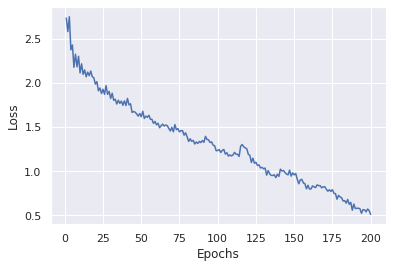

In [38]:
# attn_type = 'BahdanauAttention'
# attn_type = 'LuongAttentionDot'
attn_type = 'LuongAttention'
# attn_type = 'BahdanauAttentionCoverage'

NUM_EPOCHS = 200
encoder, decoder, loss_list,epoch_list = train_model(attn_type,NUM_EPOCHS)
model = {"encoder":encoder, "decoder":decoder, "attn_type":attn_type, "src_tokenizer":src_tokenizer, "dest_tokenizer":dest_tokenizer}

plot_graph(epoch_list,loss_list,"Epochs","Loss")

In [0]:
nameoffile = "q33"
with open(nameoffile, "wb") as dill_file:
    dill.dump(model, dill_file)

model = {}
with open(nameoffile, "rb") as dill_file:
  model = dill.load(dill_file)

source:  rubella or german measles is also extremely contagious which occurs in children  adolescents and youths 
actual:  <sos> रूबेला या जर्मन मीजल्स भी अत्यधिक छूत की बीमारी है  जो बच्चों  किशोरों और युवाओं को होती है ।
predicted:  कैंसर के बाद हर्निया दुबारा न rpneg हो सकती है और बनाता है । <eos>
BLEU Score:  0.18068537884315472


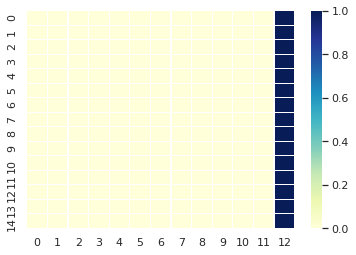

source:  rubella occurring immediately after birth is generally nominal and stays only for a while 
actual:  <sos> जन्म के तुरंत बाद होने वाली रूबेला बीमारी सामान्यतः नाममात्र के लिए और केवल कुछ समय के लिए होती है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18068537884315472


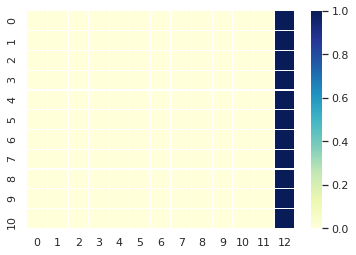

source:  the most clear symptoms of rubella disease light red papules  the most important problem of this disease is that its virus grows very fast as a result of which birth defects occur in children 
actual:  <sos> रूबेला बीमारी के सबसे स्पष्ट लक्षण हल्के से लाल दाने होते हैं इस बीमारी की सबसे मुख्य समस्या यह है कि इसके वायरस बहुत ही तेजी से बढ़ते हैं जिसके परिणामस्वरूप बच्चों मे जन्म दोष पैदा हो जाता है ।
predicted:  राज्य के सभी काटता है और कारण बनाता है । <eos>
BLEU Score:  0.1641621938493551


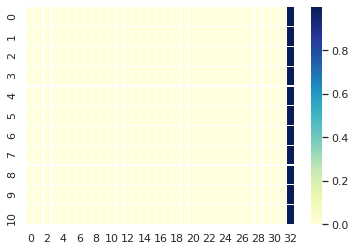

source:  about  to  percent of rubella contraction does not get known and when its symptoms emerge they are very light and shows up clearly 
actual:  <sos> लगभग  से  प्रतिशत रूबेला संक्रमण का पता नहीं चल पाता और जब इसके लक्षण पैदा होते है हैं तो वे बहुत ही हल्के होते हैं और साफ तौर पर नजर आते हैं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है । <eos>
BLEU Score:  0.1677077171881632


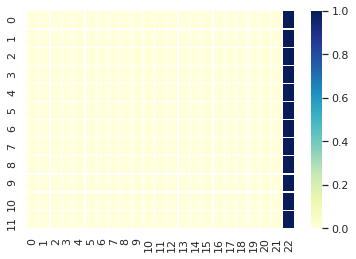

source:  when rubella occurs in adults then fever comes to them two days before the papules emerge and their hunger also gets lessened 
actual:  <sos> जब वयस्कों मे रूबेला बीमारी होती है तो दाने निकलने से लगभग दो दिन पहले इन्हें बुखार आता है और इनकी भूख कम हो जाती है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन लेता का प्रेषित पा प्रसव की जाँच करनी चाहिए । <eos>
BLEU Score:  0.17445211157624774


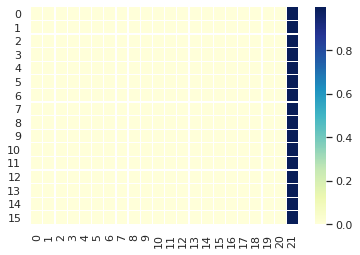

source:  live attenuated vaccines of measles  mumps and rubella are in the form an amalgamated single vaccine which is called mmr 
actual:  <sos> मीजल्स मम्पस और रूबेला के लाइव एटयुनुएटेड टीके एक मिलेजुले सिंगल टीके के रूप मे होते हैं  जिन्हे एमएमआर टीका कहते हैं ।
predicted:  घर में कूलर टीन निर्भर है । <eos>
BLEU Score:  0.17741926041310546


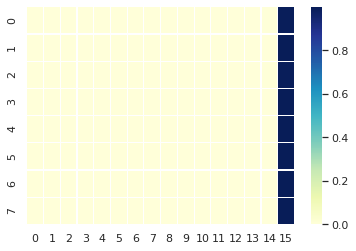

source:  mmr vaccines are more effective because there are different related breed in this single virus vaccine 
actual:  <sos> एमएमआर टीके ज्यादा प्रभावकारी होते हैं क्योंकि इस सिंगल वायरस टीके में अलगअलग संबंधित स्टेन नस्ल होती है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक जब जा सकती है । <eos>
BLEU Score:  0.18305025818318518


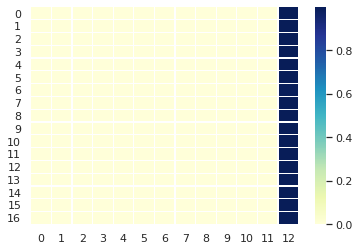

source:  the use of mmr vaccines has been extremely effective 
actual:  <sos> एमएमआर टीकों का उपयोग अत्यधिक असरदार साबित हुआ है ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज के प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.19552795980276136


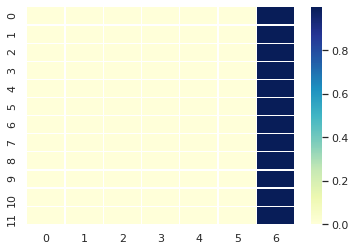

source:  immunisation power achieved with mmr stays for more time and almost throughout the life 
actual:  <sos> एमएमआर द्वारा मिलने वाली रोगप्रतिकारक शक्ति अधिक समय तक और लगभग जीवन भर बनी रहती है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0.18557819854739144


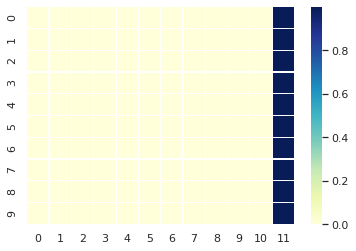

source:  start exercises three months after operation to keep muscles of stomach healthy 
actual:  <sos> पेट की पेशियाँ चुस्तदुरुस्त बनाने के लिए आपरेशन हुए  महीने बीत जाने पर व्यायाम शुरू कर दें ।
predicted:  लेकिन पैरों में शर्करा बढ़ जाने और प्रभावित कर धीरेधीरे टीकाकरण सकते हैं । <eos>
BLEU Score:  0.18305025818318518


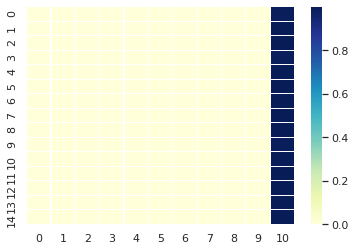

source:  however the goal of the first step taken for measles is execution of primary vaccination programme 
actual:  <sos> हालांकि मीजल्स के लिए उठाए गये पहले कदम का उद्देश्य प्राथमिक टीकाकरण कार्यक्रम का कार्यान्वयन है ।
predicted:  घर स्वंय तम्बाकू से जटिलताओं का निर्भर है । <eos>
BLEU Score:  0.18557819854739144


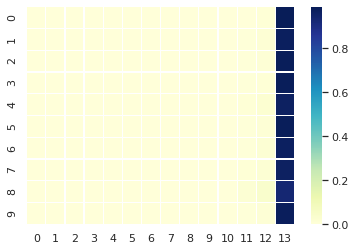

source:  the world health organisation believes that a single dose is not enough to eradicate measles 
actual:  <sos> विश्‍व स्वास्थ्य संगठन का मानना है कि मीजल्स या खसरा के पूरी तरह उन्मूलन के लिए इसकी एक सिंगल खुराक पर्याप्त नहीं है ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से जटिलताओं है और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.17741926041310546


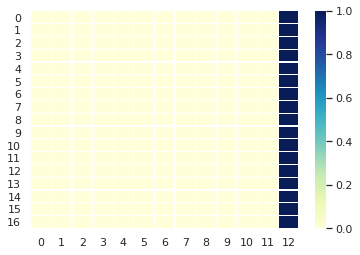

source:  therefore now it is recommended by both w    and the unicef that besides giving its first dose at  months administration of second vaccine is also very necessary to protect these children from measles 
actual:  <sos> इसलिए अब डब्लूएचओ और यूनिसेफ दोनों ही के द्वारा संयुक्त रूप से यह सिफारिश की जाती है कि  महीने में इसकी पहली खुराक देने के अलावा ऐसे बच्चों को मीजल्स से सुरक्षित बनाने के लिये दूसरा टीका लगवाना बहुत आवश्यक है ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिए । <eos>
BLEU Score:  0.16222855986147738


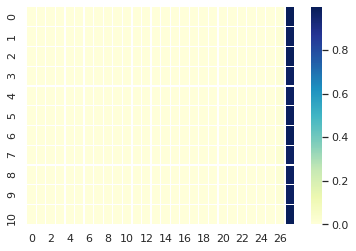

source:  disorder of the brain  that affects the capacity to think  understand  work or feel 
actual:  <sos> दिमाग या मस्तिष्क मे होने वाले अव्यवस्था  जो सोचने  समझने  कार्य करने या अनुभव करने की क्षमता को प्रभावित करती है ।
predicted:  हेपेटाइटिसए से बी दो व्यक्ति को पहले गुर्दों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.17639910709395284


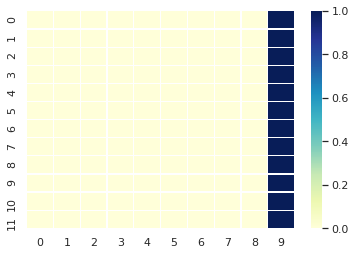

source:  such a system of brain is called mental disorder 
actual:  <sos> दिमाग की ऐसी व्यवस्था को मानसिक रोग कहते है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.19552795980276136


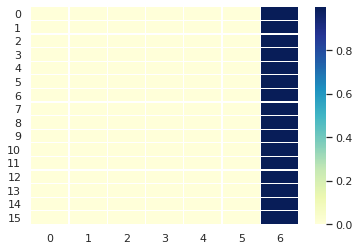

source:  it is estimated that  percent of the population are afflicted with serious mental disease and about  percent are victims of common mental disease 
actual:  <sos> यह अनुमान किया जाता है कि जनंसख्या का  प्रतिशत लोग गम्भीर मानसिक रोग से पीड़ित होते हैं और लगभग  प्रतिशत सामान्य मानसिक रोग से पीड़ित होते हैं ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति जीवन शैली से बीमारी से लगाने के लिए चिकित्सक से काफी कम करने के मुकाबले में वृद्धि हो रही है । <eos>
BLEU Score:  0.1717430532243771


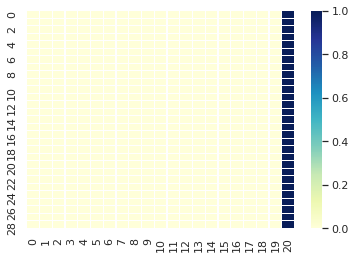

source:  it is estimated that out of the outdoor patients coming to the hospitals  percent are mentally ill 
actual:  <sos> यह अनुमान लगाया गया है कि अस्पताल में आने वाले वाह्य रोगियों में से  प्रतिशत मानसिक रूप से बीमार होते है हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17741926041310546


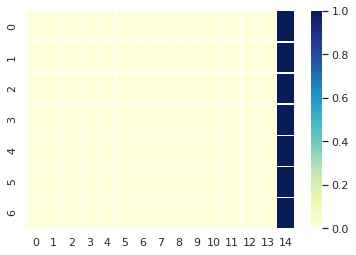

source:  mental disease can occur in several ways for as purblindness  epilepsy  sleeplessness  hypersomnia  change in copulation and copulation process  mood change  schizophrenia  dementia  delirium  change in personality 
actual:  <sos> मानसिक रोग कई तरह से हो सकते हैं जैसे मन्दबुद्धि  मिर्गी  नींद न आना  अत्यधिक नींद आना  सम्भोग एवं सम्भोग की प्रक्रिया में बदलाव  मूड ठीक न होना बदलाव  सिजोफेरनिया  जल्दी भूलना  कहीं खो जाना  व्यक्तित्व मे बदलाव आदि ।
predicted:  लेकिन पैरों में शर्करा बढ़ जाती है । <eos>
BLEU Score:  0.18875231816818241


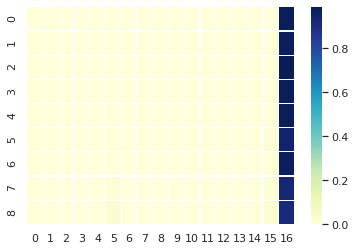

source:  yellow fever is an extreme virus generated disease 
actual:  <sos> पीतज्वर एक तीव्र विषाणु जनित रोग है
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग रूप से रूप से प्रा०स्वा०केन्द्र में रक्त दोनों की विधियों का उपयोग किया गया । <eos>
BLEU Score:  0


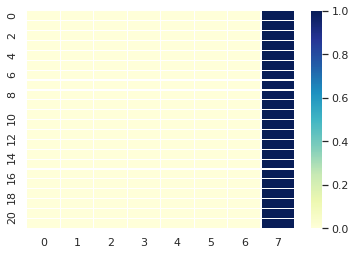

source:  yellow fever is a main disease is african and latin american countries 
actual:  <sos> पीतज्वर अफ्रीका तथा दक्षिण अमेरिकी देशों मे एक प्रमुख रोग है ।
predicted:  कैंसर के बाद हमें लग जाना क्षेत्र में प्रवेश कर जाना चाहिए । <eos>
BLEU Score:  0.19259074009082888


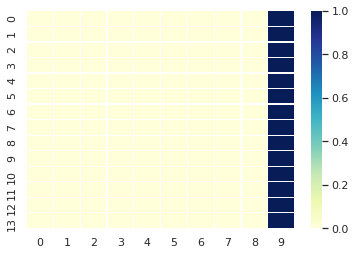

source:  it is called yellow fever because in many of its patients symptoms of jaundice shows up 
actual:  <sos> इसे पीतज्वर इसलिये कहते है क्योंकि इसके कई रोगियों मे पीलिया के लक्षण नजर आते है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18557819854739144


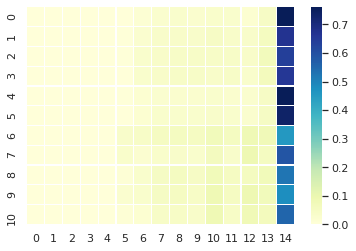

source:  not paying attention to any work 
actual:  <sos> किसी कार्य मे ध्यान न लगाना ।
predicted:  घर से उक्त चोट के श्वाँस रही है । <eos>
BLEU Score:  0.19913749124569236


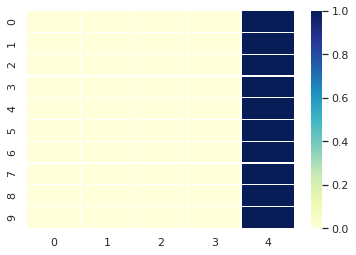

source:  being sad without any reason 
actual:  <sos> बिना किसी कारण के दुखी रहना ।
predicted:  पूरी नजदीक देखने के पूरी आस्तीन का देता है । <eos>
BLEU Score:  0.19913749124569236


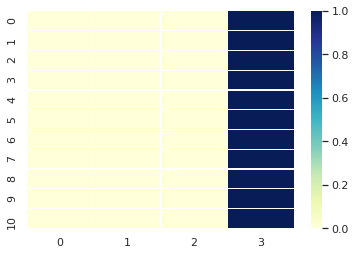

source:  getting angry very soon  very often 
actual:  <sos> बहुत जल्दी  ज्यादातर गुस्सा होना ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा लिंग के बनाता है । <eos>
BLEU Score:  0.19913749124569236


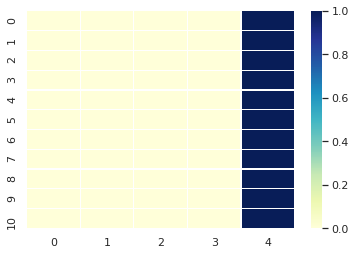

source:  change in mood very soon  being sorry from happiness and getting happy again 
actual:  <sos> मूड मे जल्दी  जल्दी बदलाव  खुशी से गमगीन रहना व फिर खुश हो जाना ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.22069091410194555


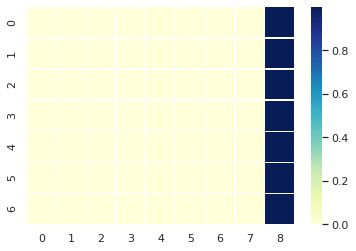

source:  getting disturbed soon by the small talk of children 
actual:  <sos> बच्चों की छोटी  छोटी बातों से जल्दी परेशान होना ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त करने हेतु यह रोगी के ग्रंथियों को स्वस्थ जलन हो सकती है । <eos>
BLEU Score:  0.1940679506664638


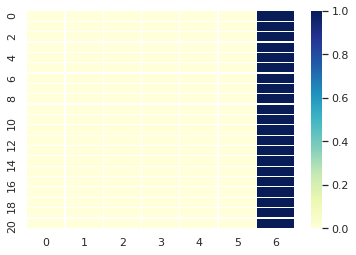

source:  thinking oneself as always correct and others wrong 
actual:  <sos> अपने आपको हमेशा सही समझना और दूसरो को गलत ।
predicted:  पूरी रूप से लड़ने के गाँठों के नीचे दिया गया कि यहाँ ट्यूमर है । <eos>
BLEU Score:  0.19552795980276136


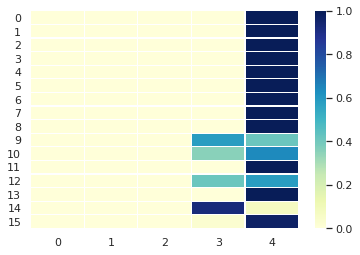

source:  emergence of desire to take tobacco  alcohol  cannabis  marijuana 
actual:  <sos> तम्बाकू  मदिरा  भांग  चरस लेने की इच्छा उत्पन्न होना ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय किये जाने या खुजली और अधिक किया जा रहा है । <eos>
BLEU Score:  0.19112328397109352


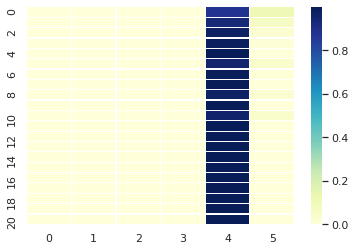

source:  problem in desire or the process of copulation 
actual:  <sos> सम्भोग की इच्छाशक्ति या प्रक्रिया मे तकलीफ होना ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.1969244213551724


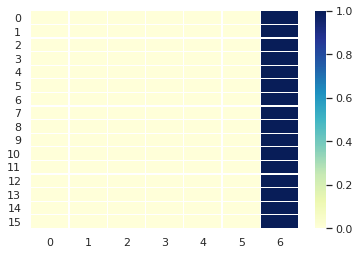

source:  before declaring mental disorder for any patient his total mental agony is seen lrb in which present problems  old and new problems  family or problems near him can be seen rrb and then his physical and mental test is done 
actual:  <sos> किसी भी रोगी को मानसिक रोग करार देने से पहले उसकी पूरी मानसिक व्यथा देखी जाती है  जिसमें वर्तमान तकलीफे  पुरानी एवं नवीन परेशानियाँ  पारिवारिक व उसके आसपास की व्यथा देखी जा सकती है  फिर उसकी शारीरिक व मानसिक जाँच की जाती है ।
predicted:  कैंसर रक्त कैंसर के कारण ऐसे काटता है और आसपास वातावरण को कम करने के लिए संक्रमण रोगियों के लिए संक्रमण से देखने के लिए वर्ष जैसे गुना ज्यादा किया गया । <eos>
BLEU Score:  0.20961864445996944


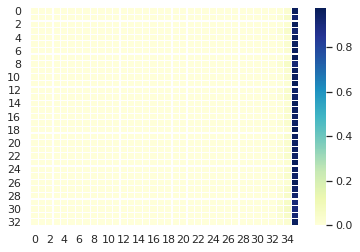

source:  if needed  lab tests of ecg  rft  lft  eeg and ct scan  diagnostic standardized intervenes and psychological test are done 
actual:  <sos> जरूरत पड़ने पर लैब जाँच में ईसीजी  आरएफटी  एलएफटी  ईईजी और सीटी स्कैन  डाइग्नोस्टिक स्टेण्डाइजड इन्टरवेन्स व साइक्लॉजिकल टेस्ट किया जाता है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक प्रभावी और पक्षाघात गिर बन्द कम और पक्षाघात और अधिक पाया गया है । <eos>
BLEU Score:  0.20745969231372235


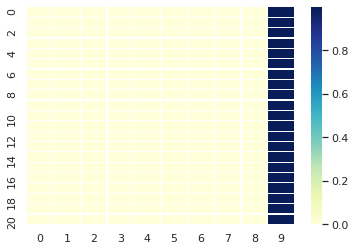

source:  treatment of mental diseases can be done through the following methods 
actual:  <sos> मानसिक रोग का इलाज निम्नलिखित पद्धतियों के द्वारा कराया जा सकता है ।
predicted:  हैपेटाइटिसबी रोग के बचाव के रक्त सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.19112328397109352


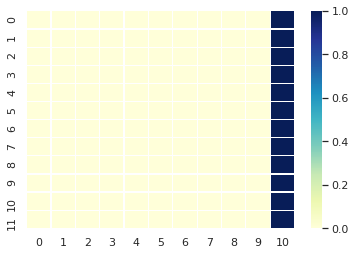

source:  listening to the patient and his family and providing information about his mental health 
actual:  <sos> रोगी व उसके परिवार को सुनना व उसके मानसिक स्वास्थ्य के बारे मे जानकारी उपलब्ध कराना ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र पूरी बीमारी होने से लगाने के रूप से ही ठंडा से यह प्रभावित सकते हैं । <eos>
BLEU Score:  0.22069091410194555


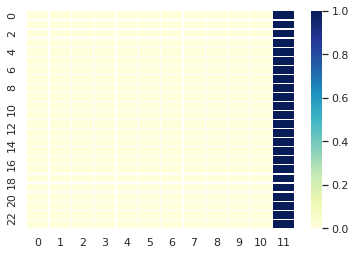

source:  encouraging the patient to change emotionally 
actual:  <sos> रोगी को अपने भावनात्मक रूप से बदलाव के लिऐ प्रेरित करना ।
predicted:  पूरी आस्तीन का उपयोग करें । <eos>
BLEU Score:  0.19259074009082888


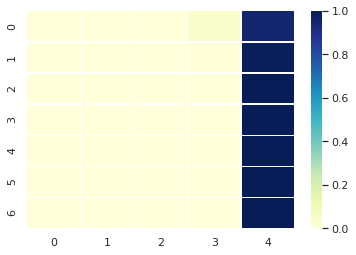

source:  making people aware by propagating for mental health through press    radio  health fairs  posters  banners etc in every district 
actual:  <sos> प्रत्येक जनपद में मानसिक स्वास्थ्य के लिये प्रचार  प्रसार करना  प्रेस  टीवी रेडियो  स्वास्थ्य मेले के द्वारा  पोस्टर  बैनर्स  आदि के द्वारा लोगों को जागरूक करना ।
predicted:  घर स्वंय टीके की परिवार कल्याण प्रजनन स्वास्थ्य सुरक्षा को परिवार कल्याण के दौरान वायरसों के पूरी विषाणु उस प्रभावित हो बन्द हो बन्द हो बन्द हो सकती है । <eos>
BLEU Score:  0.16847196522766442


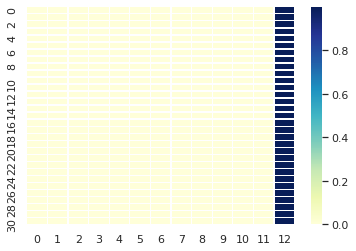

source:  making social environment better  encouraging participation and social relations among people in the society 
actual:  <sos> सामाजिक वातावरण को बेहतर बनाना  समाज के लोगों मे सामाजिक संबद्धता व सहभागिता को बढ़ावा देना ।
predicted:  घर स्वंय परिवार कल्याण कार्यक्रम के वायरल निम्न प्रकार के खेतों पोखरों सर्वाधिक प्रभावी और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.2191629412664327


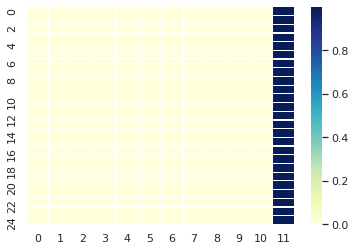

source:  finding out about the mental  social and personality change since the start 
actual:  <sos> मानसिक  सामजिक व व्यक्तित्व बदलाव का शुरू से ही पता लगाना ।
predicted:  घर बुखार समय या रक्त सर्वाधिक करनी चाहिए सकते हैं । <eos>
BLEU Score:  0.2272851691411099


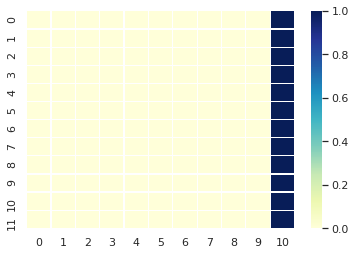

source:  running tests in schools  colleges  government and nongovernment institutes 
actual:  <sos> स्कूल  कॉलेजों  सरकारी व गैरसरकारी संस्थानों मे जाँच कराना ।
predicted:  राज्य में प्रत्येक ग्रामसभा स्तर पर पानी को कम हो सकता है । <eos>
BLEU Score:  0.19259074009082888


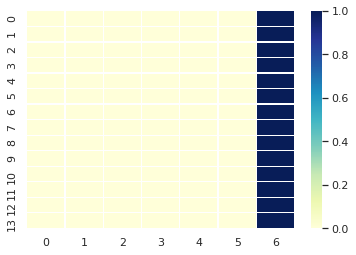

source:  treating emotional and mental disorders  enabling families to undergo difficult situations 
actual:  <sos> भावनात्मक व मानसिक रोग का उपचार करना  परिवार को कठिन परिस्थितियों से गुजरने की क्षमता प्रदान करना ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज हो सकती है । <eos>
BLEU Score:  0.18305025818318518


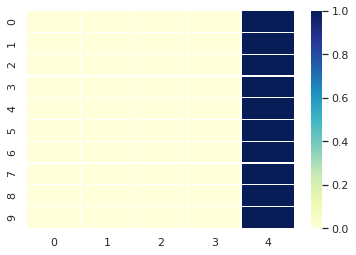

source:  solving the social and personal problems of the patient 
actual:  <sos> रोगी के सामाजिक व व्यक्ति विशेष की परेशानी को हल करना ।
predicted:  पुत्र की कमी से जटिलताओं के मूत्राशय और रक्त से आ सकती है । <eos>
BLEU Score:  0.19259074009082888


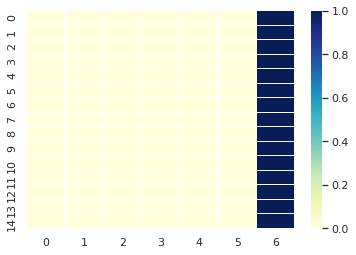

source:  treating the mental patient and lessening the difficulty of the family and society 
actual:  <sos> मानसिक रोगी को ठीक करना और परिवार व समाज की कठिनाई को कम करना ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र पूरी बीमारी ऐसे देखने के रूप से प्रभावित कर सकता है । <eos>
BLEU Score:  0.2238963393399538


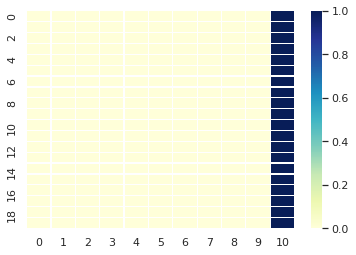

source:  saving a mental patient from falling ill again 
actual:  <sos> किसी मानसिक रोगी को दुबारा रोगी होने से बचाना ।
predicted:  डायबिटीज से बी दो निम्न शर्करा बढ़ गया सकते हैं । <eos>
BLEU Score:  0.19552795980276136


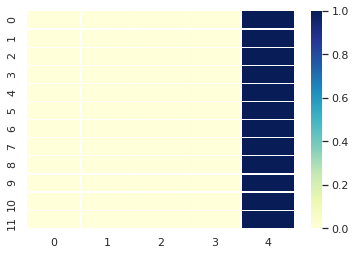

source:  the following is be executed in the state under the mental health program 
actual:  <sos> राज्य में मानसिक स्वास्थ्य कार्यक्रम के अन्तर्गत निम्न कार्यवाही की जा रही है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18968126713037053


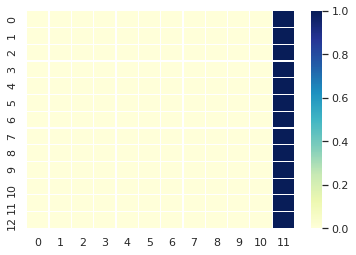

source:  state mental health authority has been constituted in the state since  april   
actual:  <sos> राज्य में  अप्रैल  से राज्य मानसिक स्वास्थ्य प्राधिकरण  state mental health authority  का गठन किया जा चुका है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17847260705223245


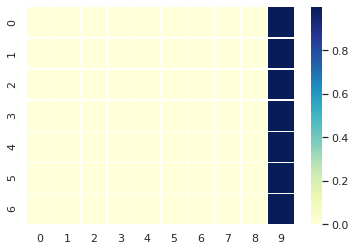

source:  a  bed state mental hospital is being constructed at dehradun under the mental health authority program 
actual:  <sos> मानसिक स्वास्थ्य प्राधिकरण कार्यक्रम के अन्तर्गत देहरादून में  शैय्या का राज्य मेन्टल अस्पताल बनाया जा रहा है ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से चकत्तों डायबिटीज सर्वाधिक देने सबसे कम और पक्षाघात जो होता । <eos>
BLEU Score:  0.18305025818318518


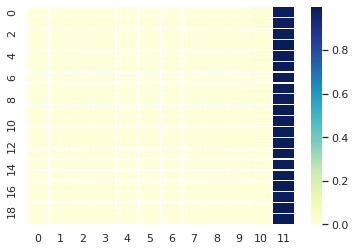

source:  two districts of uttarakhand have been chosen under the district mental health programme 
actual:  <sos> जिला मानसिक स्वास्थ्य कार्यक्रम के अन्तर्गत उत्तराखण्ड के दो जनपदों का चयन किया गया है
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक जब जा सकती है । <eos>
BLEU Score:  0


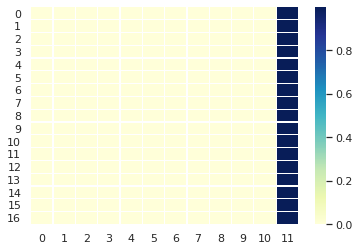

source:  dehradun in the garhwal division and nainital in the kumaun division 
actual:  <sos> गढ़वाल मण्डल में देहरादून व कुमाऊँ मण्डल में नैनीताल ।
predicted:  घर बुखार समय या कराया जा सकता है क्योंकि गीले आ सकती है और यह रोग गड्ढों नहीं है । <eos>
BLEU Score:  0.19552795980276136


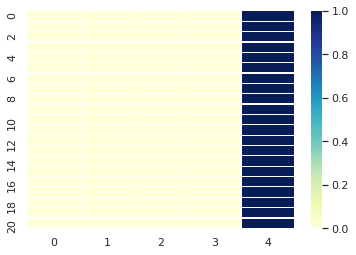

source:  for which a proposal of    lac has been sent to the government of india 
actual:  <sos> जिसके लिये भारत सरकार को  लाख का प्रस्ताव स्वीकृति हेतु भेजा गया है ।
predicted:  लगभग से दिन के बाद रंग में स्कूल और रूप से रूप से चकत्तों के रक्त सर्वाधिक किया गया । <eos>
BLEU Score:  0.18827362913939635


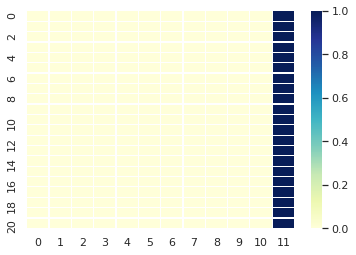

source:  this program will be implemented in both the districts of dehradun and nainital 
actual:  <sos> देहरादून व नैनीताल दोनों जनपदों में यह कार्यक्रम लागू किया जायेगा ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत प्रदान किया गया । <eos>
BLEU Score:  0.2290302783996535


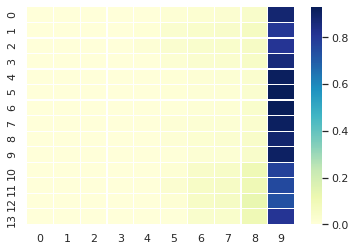

source:  the national maternity benefit scheme has been transferred from social welfare department to health welfare department since     by the government of india 
actual:  <sos> भारत सरकार द्वारा राष्ट्रीय मातृत्व लाभ योजना को दिनांक  से समाज कल्याण विभाग से स्वास्थ्य कल्याण विभाग को हस्तान्तरित कर दिया गया है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है । <eos>
BLEU Score:  0.17639910709395284


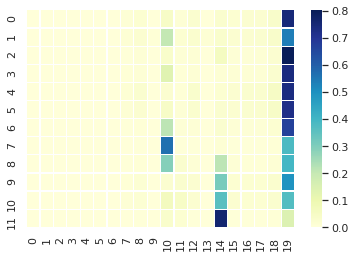

source:  the process of transfer is now complete 
actual:  <sos> हस्तान्तरण की प्रक्रिया अब पूर्ण हो चुकी है ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं है जो रूप से प्रभावित नहीं हो बन्द कम किया गया । <eos>
BLEU Score:  0.1969244213551724


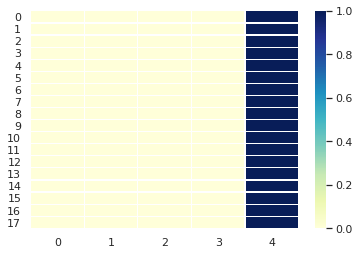

source:  the national maternity benefit scheme is being implemented by the health department in the state of uttarakhand 
actual:  <sos> उत्तराखण्ड राज्य में स्वास्थ्य विभाग द्वारा राष्ट्रीय मातृत्व लाभ योजना का कार्यान्वयन किया जा रहा है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में सामने लेता है । <eos>
BLEU Score:  0.18557819854739144


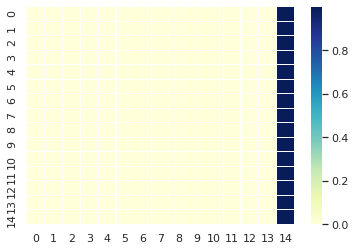

source:  under the national maternity benefit scheme above  year old women living below the poverty line are given an assistance of rs   on first live delivery for proper nutrition 
actual:  <sos> राष्ट्रीय मातृत्व लाभ योजना के अन्तर्गत गरीबी रेखा से नीचे जीवन यापन  बीपीएल  करने वाली  वर्ष से ऊपर की महिलाओं को प्रथम जीवित प्रसव पर उचित पोषण हेतु प्रति प्रसव  रू की सहायता दी जाती है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है और यह रोग है । <eos>
BLEU Score:  0.16350285370062975


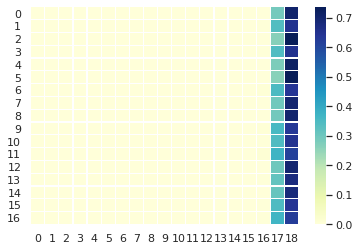

source:  the details of the capital received from the government of india and the intended beneficiaries in  and  under the national maternity benefit scheme are as follows 
actual:  <sos> राष्ट्रीय मातृत्व लाभ योजना के अन्तर्गत वर्ष  तथा  में भारत सरकार से प्राप्त धनराशि व लाभार्थियों का विवरण निम्नवत है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.21224089413959962


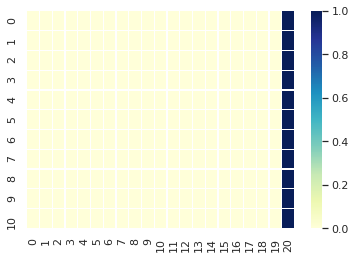

source:  the following programs are being run in the state of uttarakhand under the maternity and infant welfare services 
actual:  <sos> मातृ एवं शिशु कल्याण सेवाओं के अन्तर्गत उत्तराखण्ड राज्य में निम्न कार्यक्रम चलाये जा रहे हैं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का उद्देश्य से न नवजात शिशु प्राप्त हो सकती हैं तो पता लग जाए तथा इसका नही जाना जाता है । <eos>
BLEU Score:  0.18557819854739144


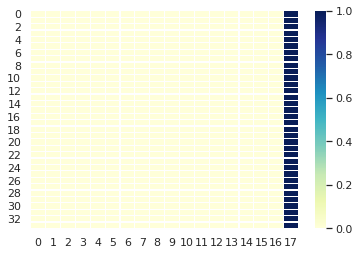

source:  a little less than half of the pregnant women are able to get predelivery tests done in uttarakhand while this is  percent at the national level 
actual:  <sos> उत्तराखण्ड में आधे से कुछ कम   प्रतिशत  गर्भवती महिलाएँ मात्र एक बार प्रसव पूर्व परीक्षण करा पाती हैं  जब कि राष्ट्रीय स्तर पर यह प्रतिशत  है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.1700626446369399


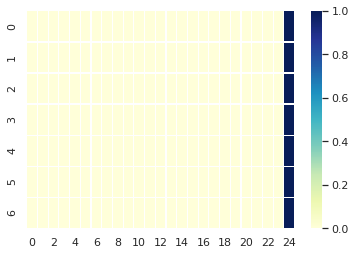

source:  the percentage of the women getting the predelivery test done thrice is only  
actual:  <sos> ऐसी गर्भवती महिलाएँ जो कम से कम तीन बार प्रसव पूर्व परीक्षण कराती हैं  उनका प्रतिशत केवल  है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


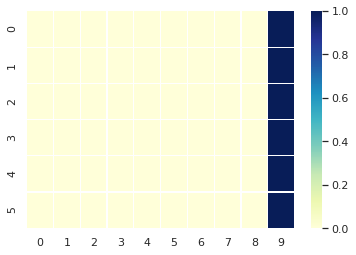

source:  there is a huge difference in view of the numbers of women getting the advantage of predelivery services in the urban and the rural areas 
actual:  <sos> प्रसव पूर्व सेवाओं का लाभ उठाने वाली महिलाओं की संख्या में शहरी व ग्रामीण क्षेत्रों की दृष्टि से व्यापक अन्तर है ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिए । <eos>
BLEU Score:  0.17956076853248887


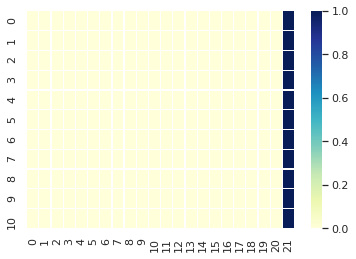

source:  more than three fourth of the women lrb  percent rrb in the urban areas gets the predelivery test done at least once while a little more than one third of rural pregnant women do so 
actual:  <sos> शहरी क्षेत्रों में तीन चौथाई से अधिक   प्रतिशत  गर्भवती महिलाएँ कम से कम एक प्रसव पूर्व परीक्षण कराती हैं जब कि एक तिहाई से कुछ अधिक  ग्रामीण गर्भवती महिलाएँ ऐसा कराती हैं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.1662368086417328


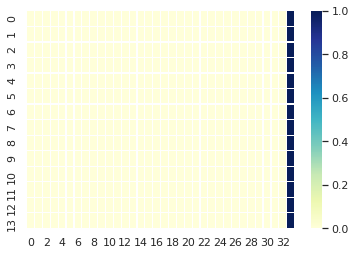

source:  a little more than one third lrb  percent rrb of the pregnant women take supplementary doses of iron folic acid pills 
actual:  <sos> एक तिहाई से कुछ अधिक   प्रतिशत  गर्भवती महिलाएँ आयरन फोलिक एसिड गोलियों की पूरक खुराकें लेती हैं ।
predicted:  कैंसर के काटने के पश्‍चात होता है । <eos>
BLEU Score:  0.18068537884315472


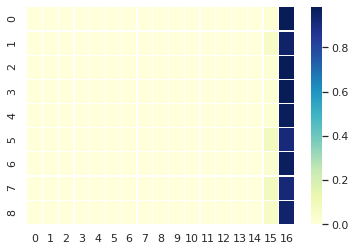

source:  in cases of tetanus toxide injection  percent of the pregnant women have got two or more than two injections of t   however such women in the rural areas are  percent and in the urban areas  percent 
actual:  <sos> टेटनेस टाक्साइड इन्जेंक्शन के मामले में  प्रतिशत गर्भवती महिलाओं को टीटी के इन्जेक्शन की दो या दो से अधिक खुराके प्राप्त हैं  हालांकि इन महिलओं की संख्या ग्रामीण क्षेत्रों में  प्रतिशत तथा शहरी क्षेत्रों में  प्रतिशत है ।
predicted:  कैंसर के से स्वच्छता पर विशेष जिला काटता है और यह रिर्पोट जाना चाहिए । <eos>
BLEU Score:  0.16285851084141847


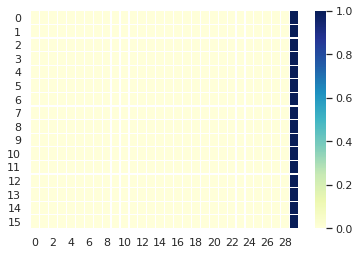

source:  generally there is much less vogue of predelivery services among uneducated mothers and in the families of low living standards  the following works are done mainly under this service 
actual:  <sos> सामान्यतः अशिक्षित माताओं एवं निम्न जीवन स्तर वाले परिवारों में प्रसव पूर्व सेवाओं का प्रचलन बहुत ही कम है  इस सेवा के अंतर्गत निम्न कार्य मुख्य रूप से किये जाते हैं 
predicted:  कैंसर के बाद हमें पूरी बाँह का पता लग सकता है और जाना जाते हैं जो हो जाता है । <eos>
BLEU Score:  0


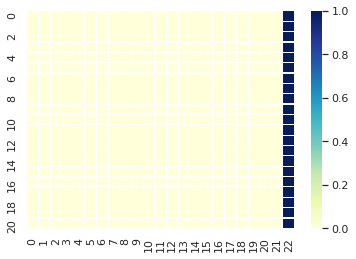

source:  indicating pregnant women 
actual:  <sos> गर्भवती माताओं की चिन्हित करना ।
predicted:  डायबिटीज स्नायुओं हेतु वर्ष तक प्रभावित नहीं हो सकती है । <eos>
BLEU Score:  0.19953087735062713


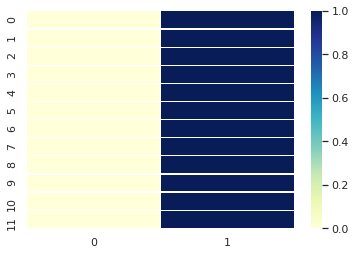

source:  distribution of pills to prevent anemia and referencing of proper cases of complex cases 
actual:  <sos> रक्त अल्पता हेतु बचाव के लिए गोलियों का वितरण तथा जटिल केसों के उचित केन्द्रों का सन्दर्भण ।
predicted:  पूरी आस्तीन समय व पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.18429333166740366


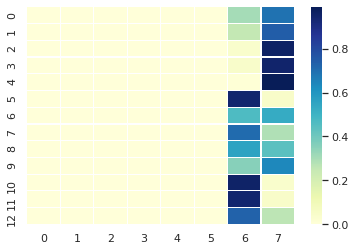

source:  there are only  percent of institutional delivery in uttarakhand 
actual:  <sos> उत्तराखण्ड में मात्र  प्रतिशत संस्थागत प्रसव होते हैं ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक चाहिए बन्द कम करने के संक्रामक ट्यूमर है नहीं हो बन्द कम है । <eos>
BLEU Score:  0.19552795980276136


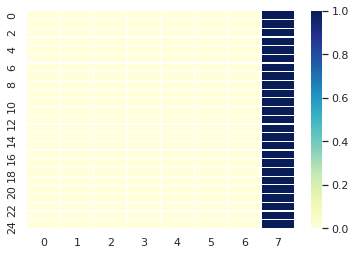

source:  this is  percent in cities while in rural areas more than  percent of labor occurs at home and out of these more than half of these conclude with the help of the midwives 
actual:  <sos> नगरों में यह प्रतिशत  है जबकि ग्रामीण क्षेत्रों में  प्रतिशत से अधिक प्रसव घरों में होते हैं और इनमें से आधे से अधिक प्रसव दाईयों की सहायता से सम्पन्न होते हैं ।
predicted:  कैंसर रक्त कैंसर के कारण शर्करा ग्लूकोज के प्रभावित किया गया तो जानलेवा हो सकती है । <eos>
BLEU Score:  0.16847196522766442


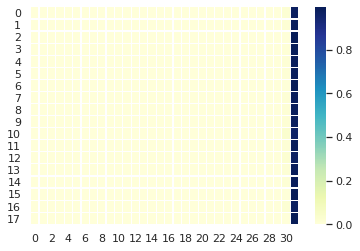

source:  even in urban areas more than half lrb  percent rrb of childbirths takes place at home 
actual:  <sos> शहरी क्षेत्रों में भी आधे से अधिक   प्रतिशत  प्रसव घरों में होते हैं ।
predicted:  कैंसर के बाद हमें पूरी बाँह का पता लग सकता है और देखने के पूरी गिलटी के पश्‍चात मुख्यालय रोग क्रम से पहुँचने की वजह व अपनी योगदान सूचना जाना चाहिए । <eos>
BLEU Score:  0.18557819854739144


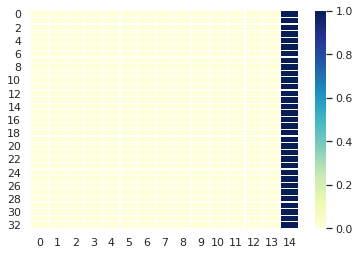

source:  in uttarakhand about one fourth of the childbirths conclude with the help of doctors and about  percent with trained maids  assistant health workers and midwives 
actual:  <sos> उत्तराखण्ड में एक चौथाई प्रसव चिकित्सकों तथा लगभग  प्रतिशत प्रसव प्रशिक्षित परिचारिकाओं  सहायक स्वास्थ्य परिचारिकाओं एवं दाईयों की सहायता से सम्पन्न होते हैं ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा लिंग के रक्त सर्वाधिक चाहिए क्योंकि घास व बचाव सबसे देखने के ध्यान रखने टीकाकरण होता है । <eos>
BLEU Score:  0.17541056564995905


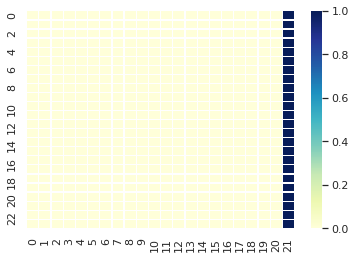

source:  out of seven childbirths completing outside the medical institutions only one childbirth lrb  percent rrb is benefitted with postlabour tests within two months 
actual:  <sos> चिकित्सा संस्था से परे सम्पन्न होने वाले प्रसवों में सात में से मात्र एक प्रसव   प्रतिशत  को दो माह के भीतर प्रसवोत्तर परीक्षण से लाभान्वित किया जाता है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक मल से जाँच करनी चाहिए । <eos>
BLEU Score:  0.1700626446369399


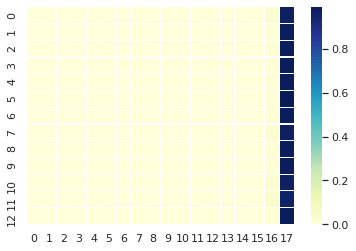

source:  safe childbirth and referencing of complex cases is mainly done under the postchildbirth services 
actual:  <sos> प्रसवोत्तर परीक्षण सेवा के अंतर्गत सुरक्षित प्रसव एवं जटिल केसों का सन्दर्भण मुख्य रूप से किया जाता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण डालना लेता है तो प्रभावित किया गया । <eos>
BLEU Score:  0.18305025818318518


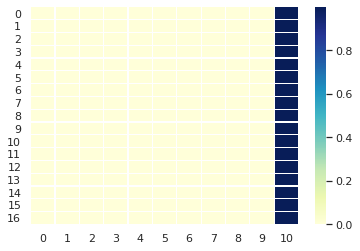

source:  care for mother and the newborn baby  referencing of complex cases  vaccination of babies  distribution of vitamina solution to protect children from blindness  proper advice and services for limited family and family planning and abortion 
actual:  <sos> माता एवं नवजात शिशु की देखभाल  जटिल केसों का सन्दर्भण  शिशुओं का टीकारण  बच्चों को अन्धता से बचाव हेतु विटामिनए के घोल का वितरण  सीमित परिवार हेतु परिवार नियोजन की उचित सलाह एवं सेवाएँ तथा गर्भ सामपन हेतु उचित सलाह एवं सेवाएँ ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी करनी चाहिए । <eos>
BLEU Score:  0.15984169750865687


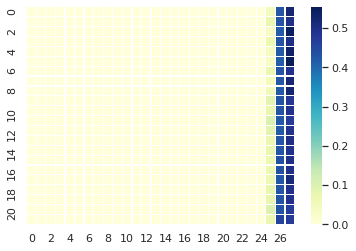

source:  a comparative detail of the achievements under maternity services till the year of    and  has been shown in the following table 
actual:  <sos> मातृ सेवाओं के अन्तर्गत वर्ष   वर्ष  तथा वर्ष  तक की उपलब्धियों का तुलनात्मक विवरण निम्न तालिका में दर्शाया गया है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17639910709395284


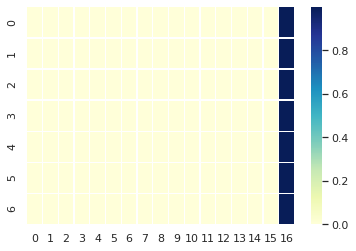

source:  the disease called poliomyelitis occurs due to an extremely contagious virus which attacks only humans 
actual:  <sos> पेलियोमायलीटिस नामक बीमारी एक अत्यधिक संक्रामक वायरस के कारण होती है  जो केवल मनुष्यों पर ही हमला करता है ।
predicted:  इसके अलावा लक्षण रोगियों में लिंग के कारण रूप से प्रभावित कर उन्हें यह फैल करें । <eos>
BLEU Score:  0.18068537884315472


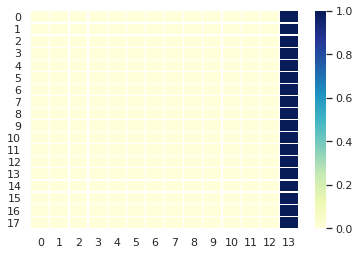

source:  this contagious virus spreads generally through the medium of water or on coming in contact with infected person 
actual:  <sos> यह संक्रामक वायरस आमतौर पर पानी या अन्य माध्यम के जरिये संक्रमित व्यक्ति के सम्पर्क में आने से फैलता है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18068537884315472


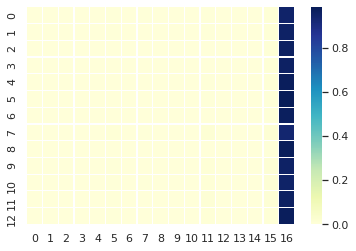

source:  however this disease can also spread through mouth to mouth 
actual:  <sos> हालाँकि मुँह से मुँह द्वारा भी यह बीमारी फैल सकती है ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक निम्न लक्षण टीकाकरण करनी चाहिए । <eos>
BLEU Score:  0.19259074009082888


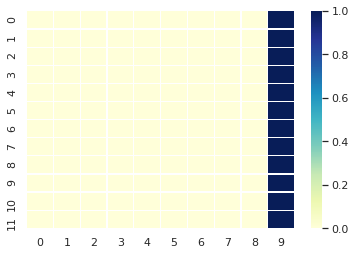

source:  polio disease particularly attacks young children 
actual:  <sos> पोलियो बीमारी खासतौर पर छोटे बच्चों पर हमला करती है ।
predicted:  घर बुखार या प्रभावित चाहिए । <eos>
BLEU Score:  0.1940679506664638


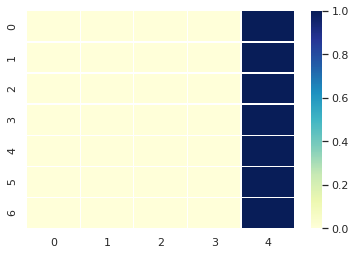

source:   to  percent of the cases of polio are often seen in children less than  years of age 
actual:  <sos> पोलियो के  प्रतिशत से  प्रतिशत मामले अक्सर  वर्ष से कम उम्र के बच्चों मे देखे जाते हैं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में सामने या कारणवस दिया जाना चाहिए । <eos>
BLEU Score:  0.18068537884315472


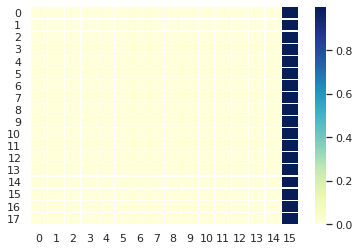

source:  polio is an extremely contagious disease 
actual:  <sos> पोलियो अत्यधिक छूत की बीमारी है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के केन्द्रित नही हो करें । <eos>
BLEU Score:  0.19913749124569236


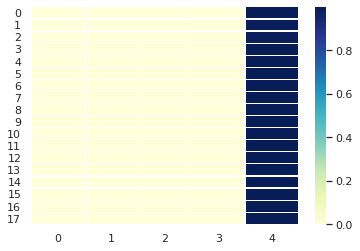

source:  till the infection of one person in the family is known the possibility of contraction to other members also arises because this infection spreads rapidly  this virus spreads faster because of crowded places clean toilet facilities 
actual:  <sos> परिवार में जब तक पोलियो ग्रसित एक सदस्य का पता चलता है  तब तक पोलियो का संक्रमण अन्य सदस्यों में भी होने की संभावना पैदा हो जाती है  क्योंकि यह इन्फैक्शन तेजी से फैलता है  ये वायरस भीड़भाड़ वाली जगह और स्वच्छ शौच सुविधाओं के कारण ज्यादा तेजी से फैलता है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण या उसके अजन्में या नवजात शिशु कैंसर व जाँच करवाना और कारणवस कारणवश सूचना जाना चाहिए । <eos>
BLEU Score:  0.15561123760153933


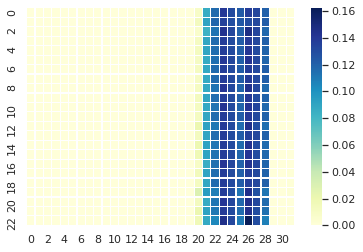

source:  oral poliovirus vaccine lrb opv rrb was first used in the contemporary soviet union 
actual:  <sos> ओरल पोलियोवायरस वैक्सीन  ओपीवी  का सबसे पहली बार उपयोग तत्कालीन सोवियत यूनियन में किया गया ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.18429333166740366


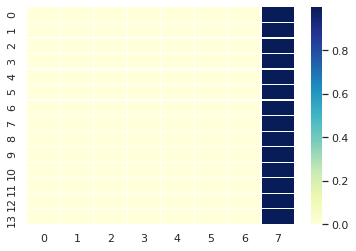

source:  as a result of the technique developed in this country new methods of controlling or eradicating polio was discovered in other countries 
actual:  <sos> इस देश में विकसित तकनीक के परिणामस्वरूप  अन्य देशों में पोलियो के नियंत्रण या इसे दूर करने के नये  नये तरीके खोजे गए ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो शीघ्र पूरी बीमारी के वयस्क प्रभावित करता है । <eos>
BLEU Score:  0.17541056564995905


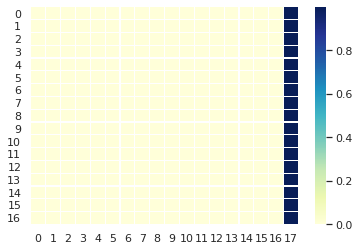

source:  the most relevant proof of the great success of opv is the polio eradication programme being run throughout the world 
actual:  <sos> ओपीवी की जबरदस्त सफलता का सबसे ज्वलंत प्रमाण दुनिया भर में चलाये जा रहे पोलियो उन्मूलन कार्यक्रम हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18305025818318518


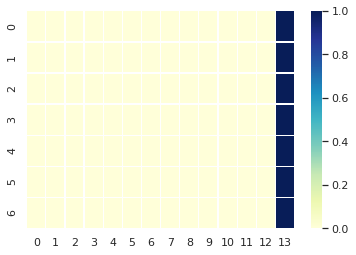

source:  the pulse polio programme run in india for polio eradication has also been very much successful 
actual:  <sos> पोलियो उन्मूलन के लिए भारत में चलाया गया पल्स पोलियो कार्यक्रम भी बहुत अधिक सफल साबित हुआ है ।
predicted:  घर स्वंय प्रतिशत तथा मीजल्स का खतरा रक्त सर्वाधिक प्रभावी और पक्षाघात से पायी जाना चाहिए । <eos>
BLEU Score:  0.18305025818318518


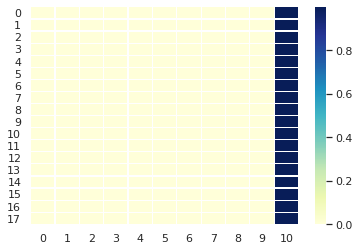

source:  combined dtp vaccines have been used the world over since  itself and great success has been achieved in lessening the clinical pertussis with its help 
actual:  <sos>  से ही दुनिया भर में मिले  जुले  कम्बाइन्ड  डीटीपी टीकों का इस्तेमाल किया जा रहा है  और इनकी सहायता से क्लिनिकल पर्टयुसिस को कम करने में काफी सफलता भी मिली है ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिए । <eos>
BLEU Score:  0.1662368086417328


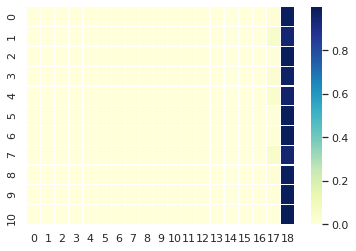

source:  by giving  doses of dtp vaccines to children they can be made protected against the disease like diphtheria  tetanus and pertussis 
actual:  <sos> डीटीपी टीकों की  खुराक बच्चों को देकर  घटसर्प  टेटनेस और पर्टयुसिस जैसी बीमारी से इन्हें सुरक्षित बनाया जा सकता है ।
predicted:  कैंसर के बाद हमें पूरी बाँह का पता लग सकता है और देखने के पूरी गिलटी के पश्‍चात मुख्यालय रोग क्रम से पहुँचने की वजह व अपनी योगदान सूचना गयी है । <eos>
BLEU Score:  0.17741926041310546


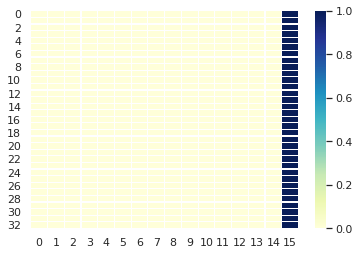

source:  diphtheria is such a contagion that affects throat  mouth and nose 
actual:  <sos> घटसर्प  डिप्थीरिया  एक ऐसा संक्रमण है जो गले  मुँह और नाक को प्रभावित करता है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों ऐसे मामले के खेतों पोखरों सर्वाधिक देने वाले उम्र में एकल बचाव टीकाकरण होता है । <eos>
BLEU Score:  0.18305025818318518


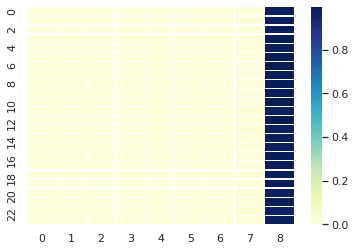

source:  diphtheria is a contagious disease  easily contractible  but after its vaccine being developed it is found less very less 
actual:  <sos> घटसर्प एक अत्यधिक संक्रामक बीमारी है  आसानी से होने वाली  लेकिन इसके टीके विकसित होने के बाद यह बहुत कम पायी जाती है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो शीघ्र पूरी बीमारी के वयस्क प्रभावित करता है । <eos>
BLEU Score:  0.17541056564995905


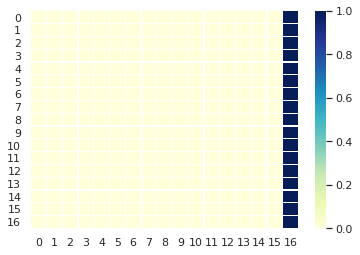

source:  sex related diseases are contagious diseases  this disease gets communicated from the infected patient to one s sex partner during sexual intercourse 
actual:  <sos> यौन जनित रोग संक्रमित रोग हैं  यह रोग संक्रमित रोगी से यौन सहवास के दौरान अपने यौन साथी में संचारित हो जाता है ।
predicted:  कैंसर में आसपास वातावरण में कम करने के लिए संक्रमण से रखें । <eos>
BLEU Score:  0.17639910709395284


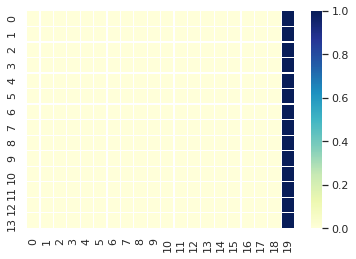

source:  this is the reason that these diseases are called sexually transmitted diseases  their contraction is easy 
actual:  <sos> यही कारण है कि इन रोगों को यौन जनित रोग कहा जाता है  इनका संक्रमण आसान है ।
predicted:  अतः संक्रमित व्यक्ति के लिए मिली की तुलना में पश्‍चात नहीं हो सकता है । <eos>
BLEU Score:  0.18305025818318518


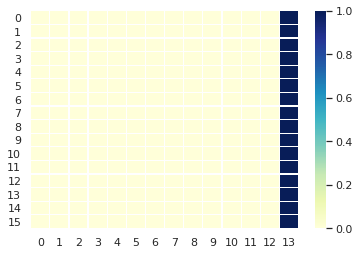

source:  contraction of sexually transmitted diseases is easy 
actual:  <sos> यौन जनित रोगों का संक्रमण आसान है ।
predicted:  घर से बी दो निम्न शर्करा बढ़ गया सकते हैं । <eos>
BLEU Score:  0.19817632389021378


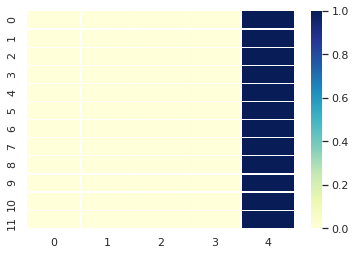

source:  sexually transmitted diseases are serious and painful 
actual:  <sos> यौन जनित रोग गंभीर एवं पीड़ायुक्त हैं ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत प्रदान करता है । <eos>
BLEU Score:  0.19817632389021378


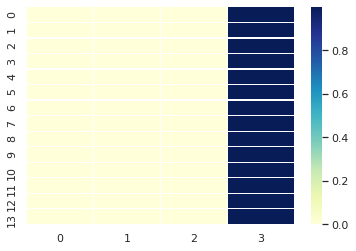

source:  the most found diseases of the sexually transmitted disease group are  gonorrhoea  herpes chlamydia 
actual:  <sos> यौन जनित रोगों के समूह की सबसे अधिक पायी जाने वाली बीमारियाँ हैं  सुजाक  गनोरिया  हरपीज क्लेमाइडिया ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति जीवन शैली या व्यक्ति से व्यक्ति से व्यक्ति से आना । <eos>
BLEU Score:  0.18068537884315472


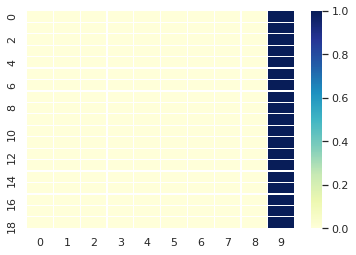

source:  many sexually transmitted diseases show some symptoms initially  these symptoms end without any treatment 
actual:  <sos> बहुत सी यौन संक्रमित बीमारियाँ प्रारम्भ में कुछ लक्षण दर्शाती हैं  यह लक्षण बिना किसी उपचार के समाप्त हो जाते हैं ।
predicted:  राज्य में प्रत्येक ग्रामसभा स्तर पर केन्द्रित नही हो सकती है । <eos>
BLEU Score:  0.17847260705223245


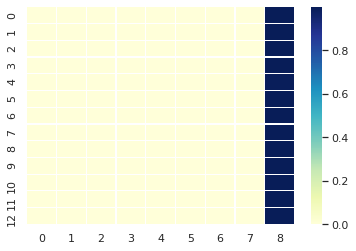

source:  some sexual diseases specially in women create either common symptoms or no symptoms at all 
actual:  <sos> कुछ यौन बीमारियाँ विशेषतः महिलाओं में या तो बहुत साधारण लक्षण अथवा कोई लक्षण उत्पन्न नहीं करती हैं ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य को दौरान निरोध का कुर्ता में उपरोक्त सामान्य प्रवेश कर सकता है । <eos>
BLEU Score:  0.18305025818318518


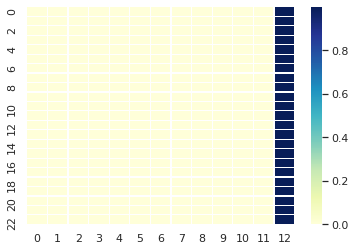

source:  person infected with sexual disease looks totally healthy but he can infect his sexual partner or unborn children 
actual:  <sos> यौन रोगों से संक्रमित व्यक्ति देखने में बिल्कुल स्वस्थ्य लगता है  किन्तु वह अपने यौन साथी अथवा बिना जन्में बच्चों को संक्रमित कर सकता है ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.17445211157624774


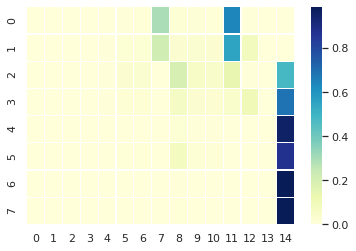

source:  uncommon oozing or stench  pain below abdomen lrb between naval and the reproductive organs rrb 
actual:  <sos> योनि में असामान्य स्त्राव अथवा दुर्गन्ध उदर के निचले भाग में दर्द  नाभि तथा जनन अंगों के बीच  ।
predicted:  कैंसर के जीवन शैली द्वारा जन्में होना । <eos>
BLEU Score:  0.18068537884315472


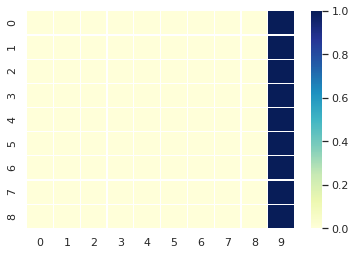

source:  inflammation near vagina or pain in the depths of the vagina  symptoms both is men and women 
actual:  <sos> योनि के आसपास जलन अथवा योनि की गहराई में दर्द होना पुरूष और महिला दोनों में लक्षण ।
predicted:  कैंसर के बाद हमें पूरी जाँच न जाना चाहिए । <eos>
BLEU Score:  0.18429333166740366


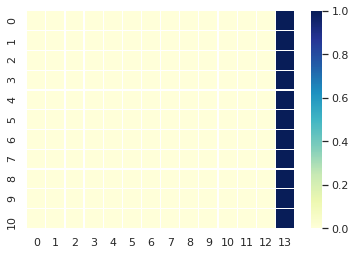

source:  wounds near reproductive organs  swelling or papules and crust in mouth  pain with inflammation in the urinary tract while urinating or excreting 
actual:  <sos> जनन अंगों के आसपास घाव  सूजन अथवा मुँह में दाने तथा छाले  पेशाब करने अथवा मल त्याग के समय मूत्रनली में जलन के साथ दर्द होना  गले मे लाली अथवा सूजन होना ।
predicted:  घर में टीके की रोग के निकलती है और कारण शर्करा ग्लूकोज के प्रभावित हो बन्द कर सकता है । <eos>
BLEU Score:  0.16696295306555614


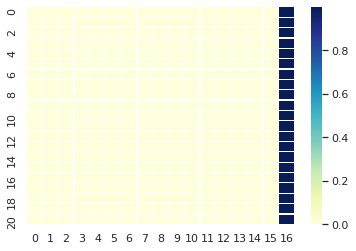

source:  fever  cold  body ache like in flu  swelling near reproductive organs 
actual:  <sos> बुखार सर्दी  बदन दर्द जैसे फ्लू में जनन अंग के आसपास की सूजन ।
predicted:  कैंसर के वयस्कों के कारण अधिक पहनायें । <eos>
BLEU Score:  0.18827362913939635


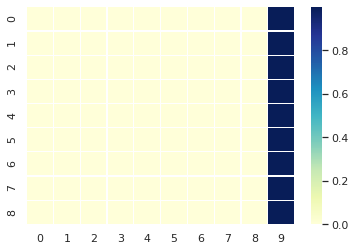

source:  if proper treatment of sexually infected diseases is not done then complexities may arise in them 
actual:  <sos> यदि यौन संक्रमित रोगों का उपयुक्त उपचार न किया गया तो उनमें जटिलताएँ उत्पन्न हो जाती हैं ।
predicted:  घर में टीके की रोग से बेस मामले के कारण देखने में बचाव या कराया जा सकती है । <eos>
BLEU Score:  0.2191629412664327


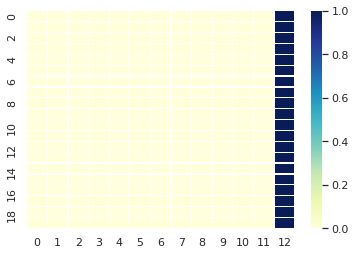

source:  the treatment of cataract is possible through surgery only 
actual:  <sos> मोतियाबिंद का उपचार केवल शल्यचिकित्सा द्वारा ही सम्भव है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम के अंतर्गत मुख्य प्रभावित कर सकता है । <eos>
BLEU Score:  0.19552795980276136


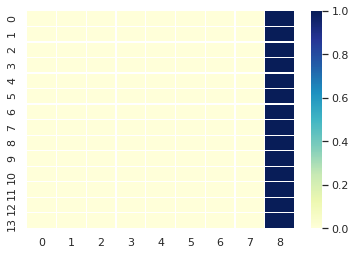

source:  complete lens capsule is taken out in the method of intra capsular cataract extraction  after the operation spectacles are used posttest 
actual:  <sos> इन्ट्रा कैनसूलर कैटरेक्ट एक्सट्रेक्शन  intra capsular cataract extraction  विधि में पूरा लैन्स कैपस्यूल निकाला जाता है  ऑपरेशन के बाद जाँच के उपरान्त चश्में का प्रयोग किया जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0.1700626446369399


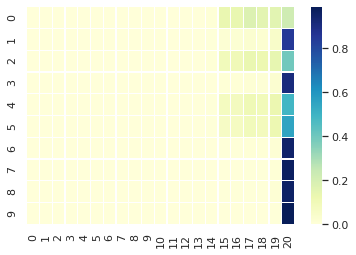

source:  during operation lens is implanted at front of the iris  the frontal part of the eye 
actual:  <sos> ऑपरेशन के दौरान लैन्स प्रत्यारोपण आँख के अगले भाग  आइरिस के आगे किया जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0.18557819854739144


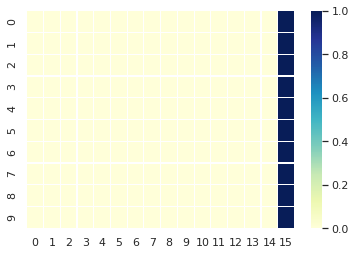

source:  in the extra capsular cataract method  the part of the frontal capsule and the whole of the lens matter is extracted and the posterior part of the capsule is left intact 
actual:  <sos> इक्स्ट्रा कैनसूलर कैटरेक्ट एक्सट्रेक्शन विधि में सामने वाला कैपस्यूल का हिस्सा तथा पूरा लैन्स मैटर निकाल लिया जाता है और पीछे वाला कैपस्यूल सुरक्षित छोड़ दिया जाता है ।
predicted:  घर में चोट के पीला नष्ट जाने जैसे रोग नेत्र तंत्रिका नष्ट होती है परन्तु गाजर पपीता आम ठीक शेष रेटिना के रेटिना के आगे काफी सास्वाकेन्द्र अगस्तमुनि जनपद रूदप्रयाग में ध्यान रेटिना के सूजन जाता है । <eos>
BLEU Score:  0.17261970532895454


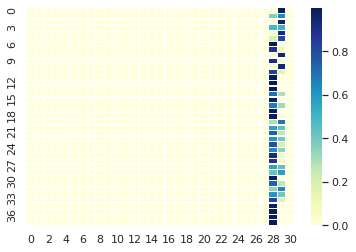

source:  lens is fitted in the capsular bag 
actual:  <sos> कैपस्यूलर बैग में लैन्स फिट किया जाता है ।
predicted:  पूरी नजदीक पूरी आस्तीन का करें । <eos>
BLEU Score:  0.1969244213551724


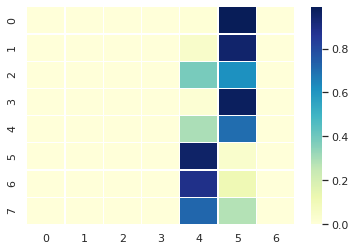

source:  in the s     lrb small incision cataract surgery rrb method   mm tunnel is formed while the rest of the method follows like that of the ecceiol 
actual:  <sos> sics  small incision cataract surgry  विधि में  मिमी की एक टनल बनाई जाती है शेष विधि ecce–iol की तरह होती है ।
predicted:  घर में आसपास वातावरण में जिला काटता है । <eos>
BLEU Score:  0.17639910709395284


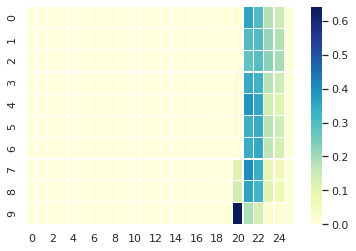

source:  no stitches are applied in the s     lrb small incision cataract surgery rrb method 
actual:  <sos> sics  small incision cataract surgry  विधि में टाँके नही लगाये जाते हैं ।
predicted:  घर से आस्तीन का परीक्षण या दर्द जाते समय पूरी विशेष रखें । <eos>
BLEU Score:  0.18827362913939635


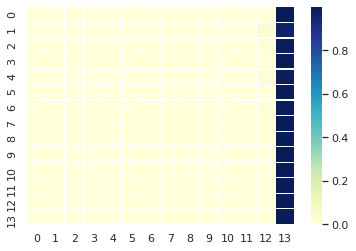

source:  in black cataract the eye nerves dilapidates gradually  it happens due to extra water pressure in the eye or because of not enough blood reaching in the eye nerves 
actual:  <sos> काला मोतियाबिंद में नेत्र तंत्रिका धीरे धीरे नष्ट होती है आँख में पानी का दबाव ज्यादा होने की वजह से या नेत्र तंत्रिका में रक्त पर्याप्त मात्रा में न पहुँचने की वजह से ऐसा होता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन पर निर्भर क्या हैं तो उन्हें संक्रमण के गाँठों के प्रभावित किया जाता है । <eos>
BLEU Score:  0.1976899956120945


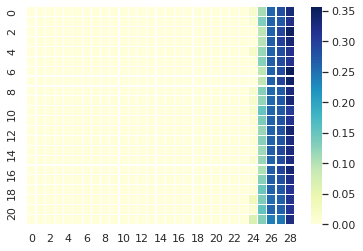

source:  the blindness caused by the black cataract can be prevented if it is identified soon and its regular treatment and tests continue 
actual:  <sos> काले मोतियाबिंद से होने वाली अधंता अंधता को रोका जा सकता है यदि इसका पता जल्दी लग जाए तथा इसका नियमित इलाज व जाँच होती रहे ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण या उसके अजन्में या नवजात शिशु होना । <eos>
BLEU Score:  0.20745969231372235


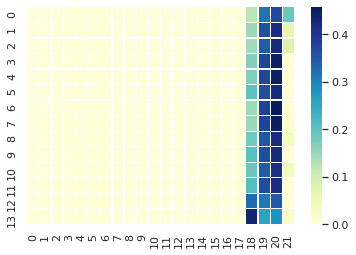

source:  when the extra pressure is more in the eyes 
actual:  <sos> जब आँखों में अतिरिक्त दबाव ज्यादा हो ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लगाने के बाद विधियों का कराया जा सकें । <eos>
BLEU Score:  0.19817632389021378


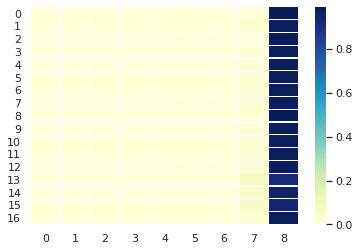

source:  if somebody suffers from black cataract in the family 
actual:  <sos> यदि परिवार में किसी को काला मोतियाबिंद हो ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1969244213551724


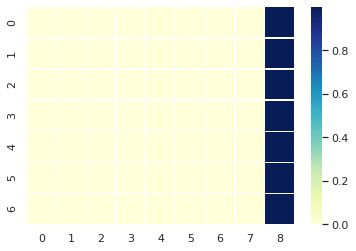

source:  in most of the patients the part of the water channel from the eyes are open yet for some reasons the water gets lessened 
actual:  <sos> अधिकांश मरीजों में आँख से पानी जाने का हिस्सा खुला होता है फिर भी कुछ कारणवस कारणवश पानी कम जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी हो जाने के संक्रामक । <eos>
BLEU Score:  0.17956076853248887


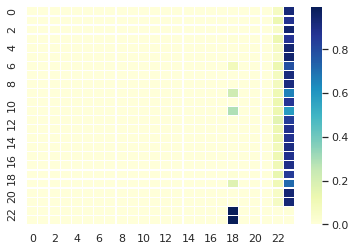

source:  internal pressure keeps on increasing and the eye nerves dilapidates  gradually the patient can not see things around  eyesight might also be lost if treatment is not done in time 
actual:  <sos> अंदर का दबाव बढ़ता जाता है और नेत्र तंत्रिका नष्ट होती है  धीरे  धीरे मरीज अगलबगल की चीजें नहीं देख पाता है  अगर समय पर इलाज न किया जाए तो नजर भी जा सकती है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक पीड़ा को रक्त विकलांगता है यदि यह रोग नहीं जलन सुन्न होता है । <eos>
BLEU Score:  0.19602553864933212


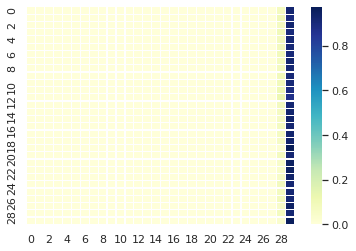

source:  main symptoms on appearance of which a patient should consult a doctor 
actual:  <sos> प्रमुख लक्षण जिनके प्रकट होने पर रोगी को डॉक्टर से जाँच करानी चाहिए ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18968126713037053


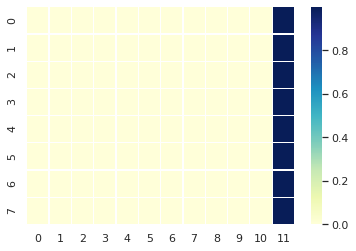

source:  seeing rainbow like colorful ovals in light 
actual:  <sos> रोशनी मे इंद्र धनुष के समान रंगीन गोले दिखाई देना ।
predicted:  अतः संक्रमित जीवाणु को तेल या प्रभावित चाहिए । <eos>
BLEU Score:  0.1940679506664638


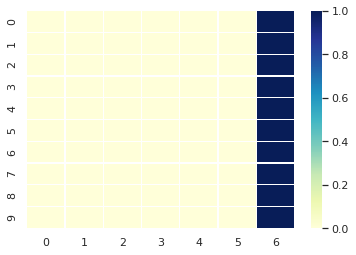

source:  we will check the eye nerves with special lens or equipment to find how much of damage has occurred 
actual:  <sos> विशेष लैन्स या यंत्र के द्वारा नेत्र तंत्रिका की जाँच करेंगे की कितनी क्षति पहुँची है ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य में लिए चिकित्सक से पूरी जाँच करवाना और कारणवस रेटिना के रेटिना के छूने से ठीक उन्हें वर्ष में भी गर्भनिरोधक की अवधि को लाख मुख के नहीं होता कि जानलेवा नहीं हो सकता । <eos>
BLEU Score:  0.18557819854739144


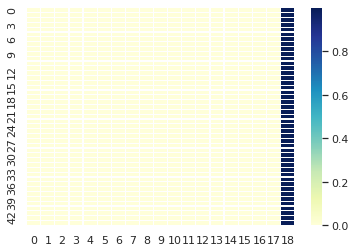

source:  field test  in which the capacity to see things on the sides while looking straight is tested 
actual:  <sos> फिल्ड टेस्ट जिसमें सामने देखते हुए साइड की चीजें देख सकने की क्षमता की जाँच होती है ।
predicted:  कैंसर के टीके की तरह से सबसे साफ पपीता सबसे साफ पपीता सबसे साफ पपीता सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे सबसे साफ पपीता सबसे
BLEU Score:  0


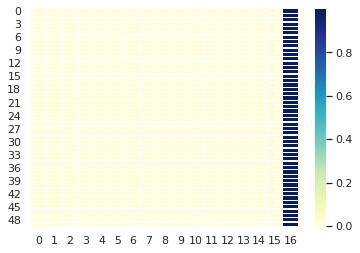

source:  the part lrb angle rrb from where the water passes out can be seen through a special lens 
actual:  <sos> एक विशेष लैन्स द्वारा पानी के बाहर जाने के हिस्से  एंगल  को देख सकते हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18429333166740366


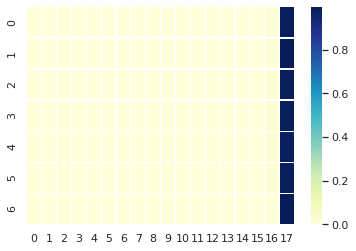

source:  with the lack of vitamina the cornea becomes weak and a wound appears through which at last causes blindness 
actual:  <sos> विटामिनए की कमी से कॉर्नियल कमजोर तथा घाव हो जाते हैं जिससे अन्त में अन्धापन होता है ।
predicted:  घर स्वंय पश्‍चात होता है । <eos>
BLEU Score:  0.18429333166740366


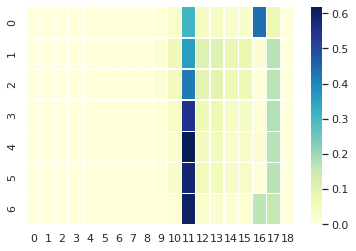

source:  the lack of vitamina is even more imminent in states of measles and malnutrition 
actual:  <sos> विटामिनए की कमी खसरे तथा कुपोषण की स्थिति में और अधिक होती है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से उल्टी नवजात शिशु सबसे साफ पपीता सबसे साफ पपीता आम ठीक तो रेटिना के आगे या रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के पता जाता है । <eos>
BLEU Score:  0.18968126713037053


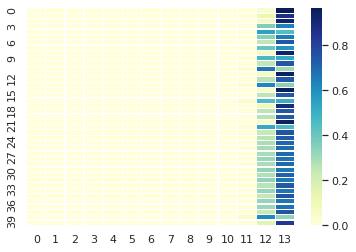

source:  nyctalopia may occur due to lack of vitamina 
actual:  <sos> विटामिनए की कमी से रतौंधी हो सकती है ।
predicted:  कैंसर के काटने के पश्‍चात मुख्यालय प्रत्येक जीवित विधियों का उपयोग चाहिए । <eos>
BLEU Score:  0.1969244213551724


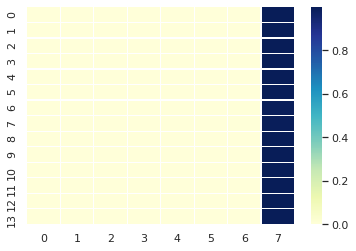

source:  absorption of vitamina during lack of vitamina in food  continuous diarrhoea and malnutrition 
actual:  <sos> खाने में विटामिनए की मात्रा की कमी लगातार दस्त तथा कुपोषण में विटामिनए का अवशोषण  absorption  कम होना ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी तरह पैरों में नीचे दिया जाता है । <eos>
BLEU Score:  0.18068537884315472


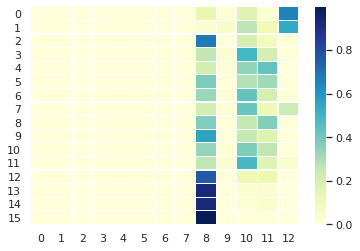

source:  demand of vitamina during and after measles 
actual:  <sos> खसरे के समय व बाद में विटामिनए की मांग का अधिक होना ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन पर निर्भर । <eos>
BLEU Score:  0.2272851691411099


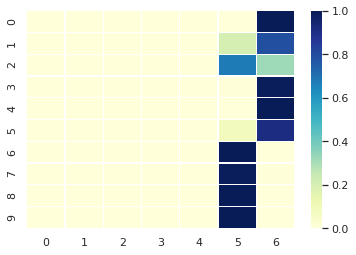

source:  it is visible in dim light 
actual:  <sos> कम रोशनी में दिखाई देता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन लेता है किया गया । <eos>
BLEU Score:  0.19913749124569236


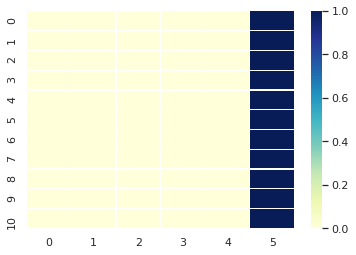

source:  white surface dries up 
actual:  <sos> स्वेत पटल सूखा हो जाता है ।
predicted:  पैदा <eos>
BLEU Score:  0


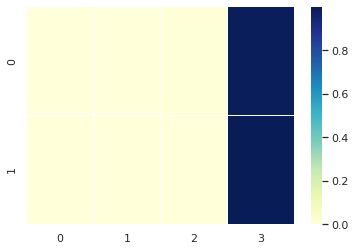

source:  bitot s spots  white spots shows up on white surface 
actual:  <sos> बिटोटस स्पॉट्स  श्वेत श्‍वेत पटल पर श्वेत श्‍वेत धब्बे दिखाई देते हैं ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कम है । <eos>
BLEU Score:  0.18968126713037053


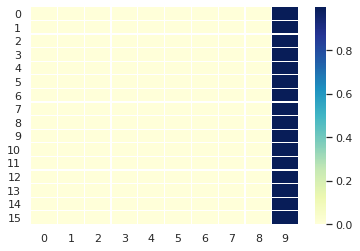

source:  use gram leaves  fenugreek or methi leaves  spinach  cabbage  coriander  papaya  mango in diet to prevent nyctalopia 
actual:  <sos> रतौंधी से बचने के लिए चौलाई  चने का साग  मैथी का साग  पालक  बन्दगोभी  धनिया  गाजर  पपीता  आम आदि का सेवन करें ।
predicted:  तकलीफ आँखों समय प्रकाश की किरणें रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के
BLEU Score:  0


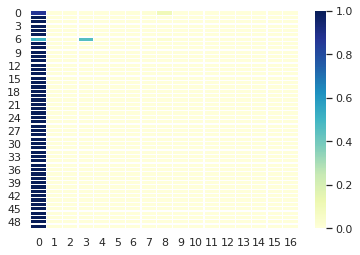

source:  encouraging mother for milk 
actual:  <sos> माँ को दूध के लिए प्रोत्साहित करना ।
predicted:  दो <eos>
BLEU Score:  0


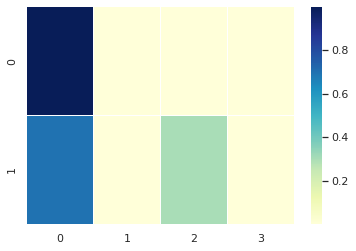

source:  applying vaccine at the time of measles 
actual:  <sos> खसरे का समय पर टीका लगाना ।
predicted:  कैंसर के लिए उपलब्ध कराने या रूप से चकत्तों के रक्त है । <eos>
BLEU Score:  0.19913749124569236


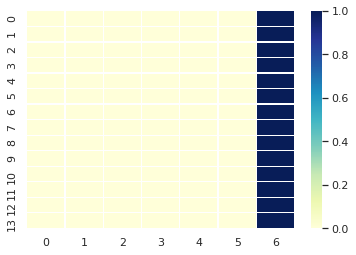

source:  giving doses of vitamina lrb  mn i   rrb during measles and at an interval of  months till  years lrb  mn i   rrb 
actual:  <sos> विटामिनए की खुराक   लाख आईयू   खसरे के टीके समय तथा  वर्ष तक   लाख आईयू   माह के अन्तराल पर देना ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत चलाये जा सकती हैं या यह आप नवजात कम किया जाता है । <eos>
BLEU Score:  0.17261970532895454


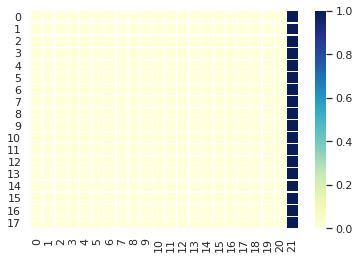

source:  it is necessary that children are given nutritious food so that they are saved from the malnutrition caused corneal blindness 
actual:  <sos> बच्चों को पौष्टिक आहार दिये जाने की आवश्यकता है ताकि कुपोषण से होने वाले कॉर्नियल ब्लाइन्डनेस से बचाया जा सकें ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय किये जाने आने से अधिक किया जा सकें । <eos>
BLEU Score:  0.18068537884315472


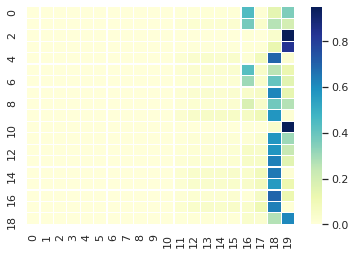

source:  for conjunctival cataract caused by rubella vaccination is required on time 
actual:  <sos> रूबेला के कारण होने वाले कन्जानाईटल कैटरेक्ट के लिये समय पर टीकाकरण किये जाने की आवश्यकता है ।
predicted:  कैंसर के बाद चमड़ी के सम्बन्ध में उपरोक्त त्वचा को पूरी बाँह का उपयोग और या उसके बचाव या कराया जा सकती है । <eos>
BLEU Score:  0.18429333166740366


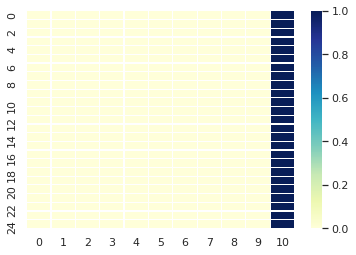

source:  about  to  percent of children become blind with one eye due to injuries in the eyes 
actual:  <sos> आँखों में चोट के लगने के कारण लगभग  से  प्रतिशत बच्चें एक आँख से अन्धे हो जाते हैं ।
predicted:  बुखार ग्रंथियाँ शरीर में गालों के पीला हेतु यहाँ नहीं कि रोग नहीं करना अब चाहिए । <eos>
BLEU Score:  0.18068537884315472


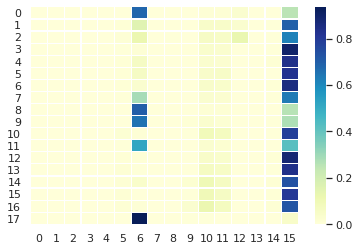

source:  it is required that people are educated about the safety of eyes so that blindness caused by crackers  industrial accidents and road traffic accidents could be escaped 
actual:  <sos> आँखों की सुरक्षा के बारे में लोगों को शिक्षित किये जाने की आवश्यकता है ताकि पटाखें औद्योगिक दुर्घटनायें एवं रोड ट्रेफिक दुर्घटनायों से होने वाली अन्धता को बचाया जा सके ।
predicted:  कैंसर के पूरी तरह से साफ खाना लेना चाहिए । <eos>
BLEU Score:  0.17089108973983766


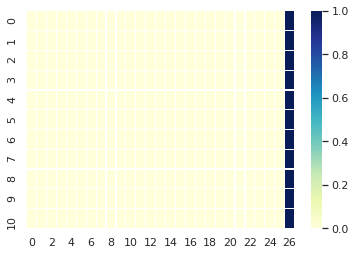

source:  to save eyes from diseases it is necessary to pay attention towards environmental sanitation and treatment is needed on time 
actual:  <sos> रोगों से आँखों के बचाव के लिये environmental senitation की ओर ध्यान दिये जाने की आवश्यकता है तथा उपचार समय पर किये जाने की जरूरत है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का उद्देश्य से दर्द इत्यादि । <eos>
BLEU Score:  0.17445211157624774


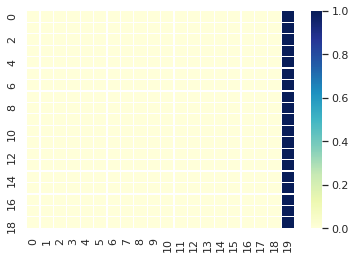

source:  gradual and painless lessening of vision in one or both of the eyes in a month or year 
actual:  <sos> धीरेधीरे तथा बिना दर्द के एक या दोनों आँखों में एक माह या वर्ष में दृष्टि में धीरेधीरे कमी आना ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग धुआँ छोड़ने में भीतर रक्त नहीं होता । <eos>
BLEU Score:  0.18068537884315472


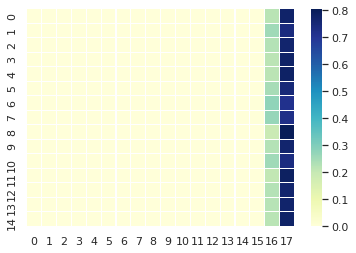

source:  pupil getting gray or white 
actual:  <sos> भूरा  gray  या सफेद पुतली  प्यूपिल  होना ।
predicted:  हैपेटाइटिसबी फिट पड़ती <eos>
BLEU Score:  0


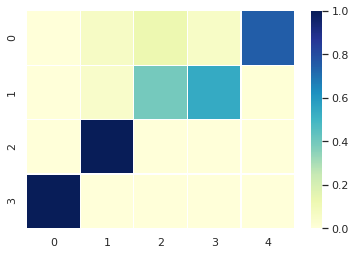

source:  when the rays of light do not fall on the retina or falls at the front or back of the retina 
actual:  <sos> जब प्रकाश की किरणें दृष्टि पटल  रेटिना  पर नही पड़ती हैं या तो रेटिना के आगे या रेटिना के पीछे पड़ती है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का माह व यह प्रभावित न नवजात शिशु प्रभावी करवाना चाहिए । <eos>
BLEU Score:  0.17639910709395284


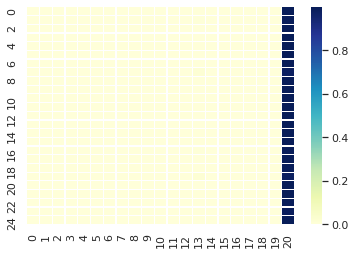

source:  when the rays of light gets collected before the retina 
actual:  <sos> जब प्रकाश की किरणें रेटिना से पहले एकत्रित हो जाती हैं ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का अथवा मौत के आसानी से पूरी जाँच करवाना कर सकता है । <eos>
BLEU Score:  0.19259074009082888


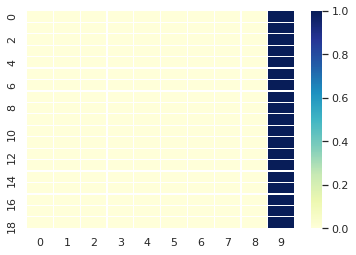

source:  fungus is also a kind of being that lives in our body and harms our body 
actual:  <sos> फंगस भी हमारे शरीर में रहने वाला ऐसा एक जीव है जो हमारे शरीर को नुकसान पहुँचाता है ।
predicted:  खसरे के समय समय समय समय समय महिला में रेटिना के पश्‍चात होता है । <eos>
BLEU Score:  0.18305025818318518


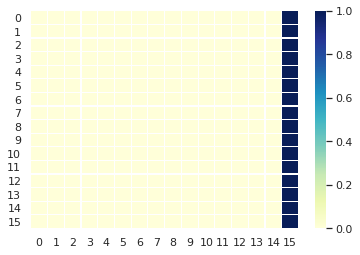

source:  fungus creates its abode in damped places like under the nail of our toe 
actual:  <sos> फंगस नमी वाली जगह जैसे हमारे पैर के अंगूठे के नाखून के नीचे अपना घर बना लेते हैं ।
predicted:  इसके आस्तीन की स्वंय परीक्षण के पास होना तो उन्हें वर्ष और किया गया । <eos>
BLEU Score:  0.18305025818318518


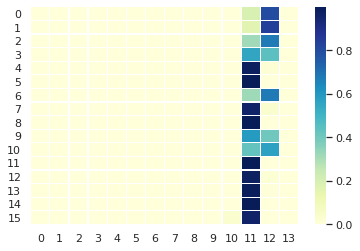

source:  it is called onikomysis 
actual:  <sos> जिसे ओनिकोमाइसिस कहते हैं ।
predicted:  डायबिटीज रोग से आना । <eos>
BLEU Score:  0.19879212680993805


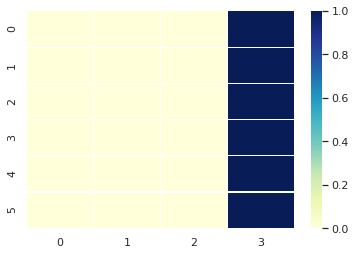

source:  the patient can see nearby things clearly but there occurs problem seeing things at a distance 
actual:  <sos> मरीज नजदीक की चीजें साफ देख सकता है परन्तु दूर की चीजें देखने में परेशानी होती है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी तरह कैंसर अधिक आ सकती है । <eos>
BLEU Score:  0.18429333166740366


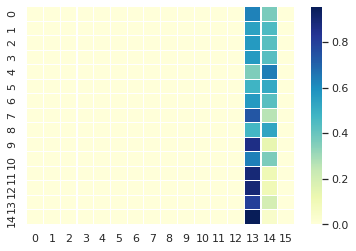

source:  the patient brings things near to the eyes to see things clearly 
actual:  <sos> मरीज चीजों को देखने के लिये आँख के पास लाता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण डालना लेता है जो जलन होता । <eos>
BLEU Score:  0.19259074009082888


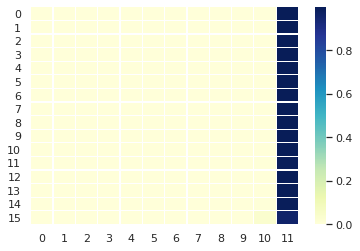

source:  student tries to sit very near to the blackboard in the classroom 
actual:  <sos> क्लास में विद्यार्थी श्यामपट के काफी नजदीक बैठने की कोशिश करता हैं ।
predicted:  घर आँखों में भारीपन का जलाया जाता है और जो न नवजात शिशु हटाये जाते हैं । <eos>
BLEU Score:  0.19112328397109352


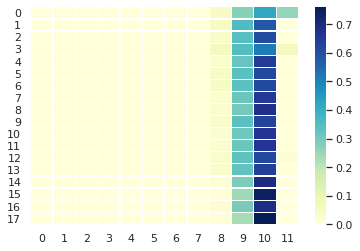

source:  when the rays of light collects at the back of the eye  this is seen mostly in the young children 
actual:  <sos> जब प्रकाश की किरणें रेटिना के पीछे एकत्रित होती है यह ज्यादातर जवान बच्चों में देखा जाता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का उद्देश्य से न नवजात शिशु प्राप्त हो सकती हैं तो पता लग जाए तथा इसका नही जाना तथा कारणवस रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के पता लग जाए तथा कारणवस कारणवश सूचना गया
BLEU Score:  0


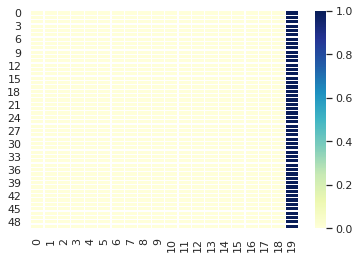

source:  headache  heaviness in the eyes  problem in reading 
actual:  <sos> सिर दर्द  आँखों में भारीपन  पढ़ने में परेशानी ।
predicted:  कैंसर के काटने के पश्‍चात मुख्यालय वॉल दागघब्बा रोका जा सकता है । <eos>
BLEU Score:  0.1940679506664638


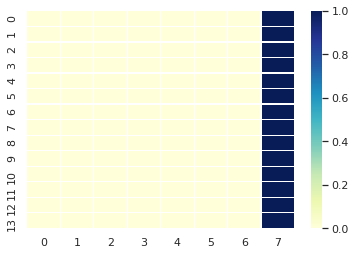

source:  due to weakness in the muscles of the eyes lens can not change its shape  the rays of light falls behind the retina while reading or doing things at a close distance  this is found at an age of  years or above 
actual:  <sos> आँख की मांसपेशियों की कमजोरी के कारण लैन्स अपना आकार नही बदल पाता पढ़ते या नजदीकी काम करते समय प्रकाश की किरणें रेटिना के पीछे पड़ती हैं यह  वर्ष और उससे ऊपर की उम्र में पाई जाती है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.1641621938493551


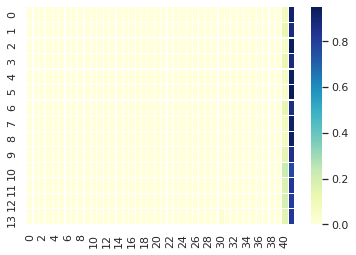

source:  shadowiness in readingwriting at a distance or doing things nearby 
actual:  <sos> दूर पढ़नेलिखने व कोई भी नजदीकी काम करने में धुंधलापन ।
predicted:  जैसे इसके रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के आगे या नही और प्रभावित । <eos>
BLEU Score:  0.2307869877265558


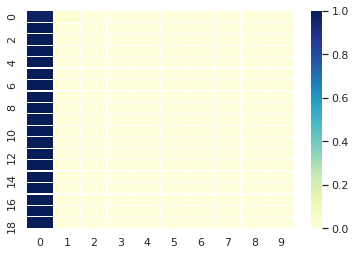

source:  if a ray of light can not concentrate at the front or back of the eye it causes shadowiness 
actual:  <sos> यदि कोई रोशनी की किरण आँख के पर्दे के आगे या पीछे किसी एक बिन्दु पर केन्द्रित नही हो पाती जिससे कि धुंधला दिखता है ।
predicted:  घर में टीके की रोग के निकलती है और कारण शर्करा ग्लूकोज के प्रभावित हो बन्द कर सकता है । <eos>
BLEU Score:  0.17541056564995905


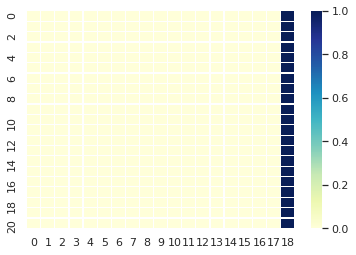

source:  shadowiness in seeing things nearby or at a distance  headache  reddening of eyes 
actual:  <sos> दूर अथवा नजदीक देखने में धुंधलापन सर में दर्द होना आँख का लाल होना ।
predicted:  घर भी मात्रा डालें । <eos>
BLEU Score:  0.18827362913939635


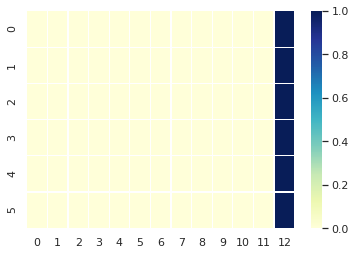

source:  cylindrical glasses have to be worn always 
actual:  <sos> सिलिंडरिकल ग्लासेस को हमेशा पहनना है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत व पाट उनमें ठीक कि जीवित एकल अधिक हो बन्द है । <eos>
BLEU Score:  0.19913749124569236


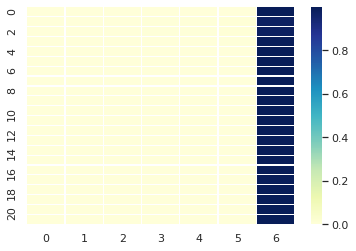

source:  cancer is a lifestyle generated disease 
actual:  <sos> कैंसर एक जीवन शैली से उत्पन्न होने वाली बीमारी है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.1940679506664638


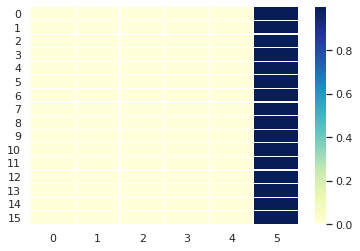

source:  cancer erupts by our wrong practices  thoughts  behavior and diet 
actual:  <sos> कैंसर हमारे गलत अचार  विचार व्यवहार और आहार से उत्पन्न होता है ।
predicted:  पपड़ी उपयोग चाहिए । <eos>
BLEU Score:  0.18968126713037053


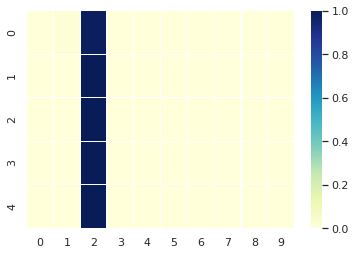

source:  smoking excessive cigarette causes more of windpipe cancer 
actual:  <sos> अधिक सिगरेट पीने से फेफड़ों  स्वॉस की नलियों का कैंसर अधिक होता है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक बार इलाज न रखें । <eos>
BLEU Score:  0.18827362913939635


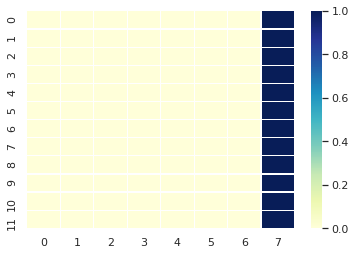

source:  we progress towards development and getting rid of diseases 
actual:  <sos> जैसेजैसे हम विकास की ओर अग्रसर हो रहे है एवं संक्रामक रोगों पर निजात पा रहे हैं ।
predicted:  घर व श्वाँस रही है तो उसे लगभग से जलाया जाता है । <eos>
BLEU Score:  0.18429333166740366


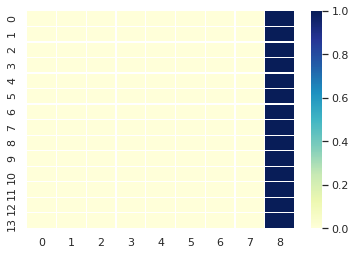

source:  due to changes in our lifestyle the number of cancer and heart patients are increasing 
actual:  <sos> वैसेवैसे अपने जीवन की शैली में बदलाव के कारण कैंसर व हदय रोगियों की संख्या में वृद्धि हो रही है ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.18068537884315472


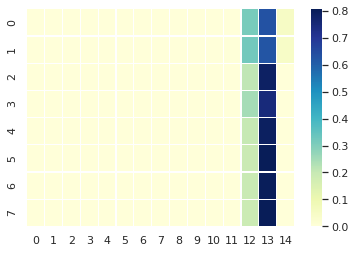

source:  this disease is number one in japan  in developed countries  this disease in at number  and in developing countries this disease is at number  
actual:  <sos> जापान में यह बीमारी नम्बर एक पर है विकसित देशों में यह बीमारी दूसरे नम्बर पर  और विकासशील देशों में यह तीसरे नम्बर पर है ।
predicted:  आरसीएच किट भारत सरकार से घरों से कम और वयस्क चकत्तों के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.17445211157624774


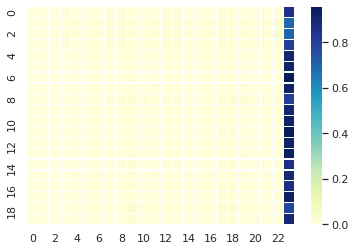

source:  one out of every eight persons can at any time become victim of cancer 
actual:  <sos> भारत में आठ में से एक व्यक्ति अपने उमर में कभी भी कैंसर से पीड़ित हो सकता है ।
predicted:  घर स्वंय पहले जटिलताओं का छिड़काव करवायें । <eos>
BLEU Score:  0.18305025818318518


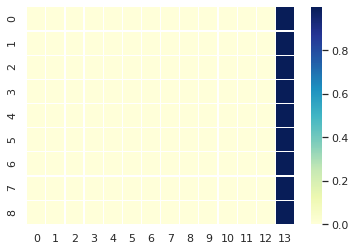

source:  this disease found in different types at different locations in our country due to difference in the lifestyle  customs and religion 
actual:  <sos> हमारे देश में जीवन शैली  रीतीरीवाज  धर्म भिन्न होने के कारण यह बीमारी अलगअलग जगह में विभिन्न प्रकार से पायी जाती है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


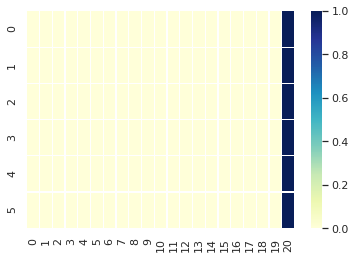

source:  all the data in the country has been calculated  ovarian cancer and breast cancer is found in  percent of the women in cities 
actual:  <sos> देश के सभी आंकडों का आंकलन कर देखा गया है शहरों में  प्रतिशत महिलाओं में बच्चेदानी के मुँह का कैंसर व स्तन कैंसर पाये जाते हैं ।
predicted:  घर के बर्तनों में सुरक्षा को जाँच के से सीधे मौजूद है । <eos>
BLEU Score:  0.17352228696404481


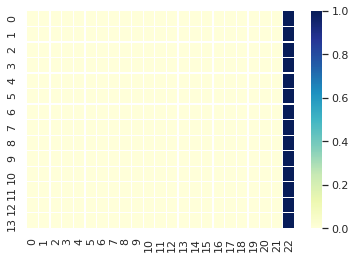

source:  it is between  and  percent among the rural women 
actual:  <sos> ग्रामीण महिलाओं में यह दोनों  से  प्रतिशत के बीच में है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों ऐसे मामले के खेतों पोखरों सर्वाधिक देने वाले उम्र वर्ष से प्रभावित हो बन्द कम हो । <eos>
BLEU Score:  0.18968126713037053


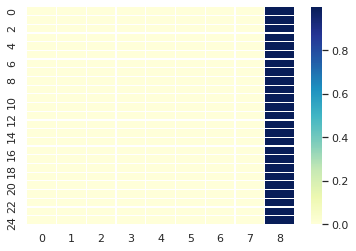

source:  lungs and breathing pipe cancer is found more due to smoking and pollution and the possibility of cancer of the mouth and stomach is more with gutkha  pan parag  tobacco and tobacco powder 
actual:  <sos> पुरूषों में धूम्रपान एवं प्रदूषण से फेफड़े व श्वाँस साँस की नली का कैंसर अधिक पाया जाता है तथा गुटका  पान पराग  खैनी  सुरती से मुँह व पेट का कैंसर होने की अधिक सम्भावना पायी गयी है ।
predicted:  घर में चोट के पीला नष्ट जाने में विशेष जिला काटता है लेकिन ये समाज के पूरी विशेष जिला काटता है । <eos>
BLEU Score:  0.1944387569440379


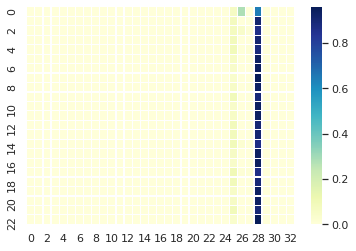

source:  what is cancer 
actual:  <sos> कैंसर क्या है 
predicted:  वर्ष को पश्‍चात मुख्यालय प्रत्येक जीवित सास्वाकेन्द्र जा सकता है । <eos>
BLEU Score:  0


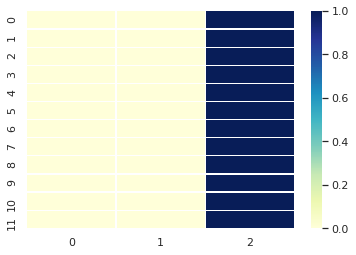

source:  cancer is name of a disease 
actual:  <sos> कैंसर एक बीमारी का नाम है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक सकते है । <eos>
BLEU Score:  0.19913749124569236


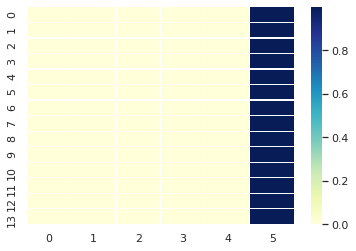

source:  in cancer cells multiply by itself and ignores the rules of the body 
actual:  <sos> कैंसर में शरीर में कोशिका अपने आप ही गुणात्मक तरीके से वृद्वि करती है और शरीर के नियमों को अनदेखा करती है ।
predicted:  कैंसर के साफ क्षमता पान पानमसाला पर पता लग जाए तथा कारणवस कारणवश पानी देखने में रोका जा सकती है । <eos>
BLEU Score:  0.17847260705223245


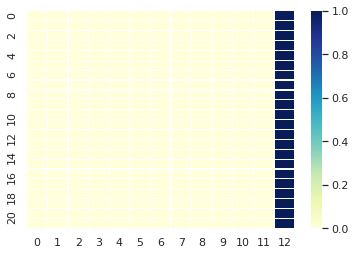

source:  cells also reach other parts of the body 
actual:  <sos> कोशिका शरीर के दूसरे भागों में भी पहुँच जाती है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.1940679506664638


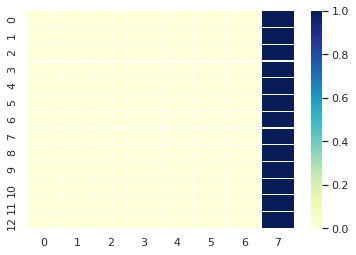

source:  cell takes the form of a cyst or wound  and destroys all the systems coming in contact with it 
actual:  <sos> कोशिका एक गिल्टी या घाव का रूप ले लेती है  और अपने सम्पर्क में आने वाली सभी तन्त्रों को नष्ट कर देती है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु कम होता है । <eos>
BLEU Score:  0.17639910709395284


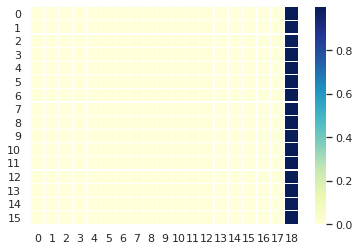

source:  cancer is a group of more than  diseases 
actual:  <sos> कैंसर  से अधिक बीमारीयों का एक समूह है ।
predicted:  कैंसर से अधिक बीमारीयों का पता लगाने के रक्त है । <eos>
BLEU Score:  0.19552795980276136


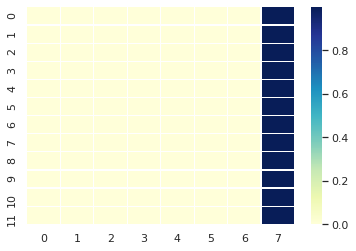

source:  although each of the disease is different from the other but basically all the types of cancers occurs as a result of anomaly in some cells 
actual:  <sos> हालांकि हर बीमारी एक दूसरे से काफी भिन्न होती है  परन्तु मूलतः सभी कैंसर शरीर की कुछ कोशिकाओं में अव्यवस्था के परिणामस्वरुप होते हैं ।
predicted:  घर में आसपास मामले के कारण अधिक कैंसर है और कारण अधिक पहनायें । <eos>
BLEU Score:  0.17541056564995905


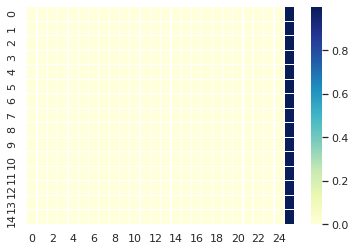

source:  generally  easy tumors can be weeded out through surgery and there is no possibility of its coming up again 
actual:  <sos> सामान्यतः सुसाध्य ट्यूमरों को शल्यचिकित्सा द्वारा निकाला जा सकता है और इनके फिर से होने की संभावना नही होती ।
predicted:  कैंसर के टीके की तरह से सबसे साफ लग सकता है । <eos>
BLEU Score:  0.18184804078107475


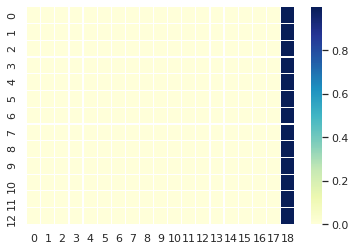

source:  difficult tumors are cancer 
actual:  <sos> असाध्य ट्यूमर कैंसर होते हैं ।
predicted:  आरसीएच किट भारत सरकार से आयु को चकत्तों टीन हो सकती है । <eos>
BLEU Score:  0.19953087735062713


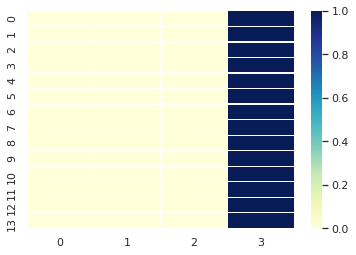

source:  difficult tumors can destroy nearby tissues and parts 
actual:  <sos> असाध्य ट्यूमर निकट के ऊतकों और अंगों को नष्ट कर सकते हैं ।
predicted:  घर बुखार समय उभरने टंकियों मामले के प्रभावित चाहिए । <eos>
BLEU Score:  0.19112328397109352


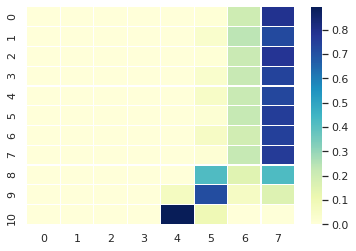

source:  cancer cells can spread into other areas through which new tumors can get born 
actual:  <sos> कैंसर की कोशिकाएँ शरीर के अन्य भागों में फैल सकती हैं या रोगव्यापि कर सकती हैं  जिससे नए ट्यूमर पैदा हो सकते हैं ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.17639910709395284


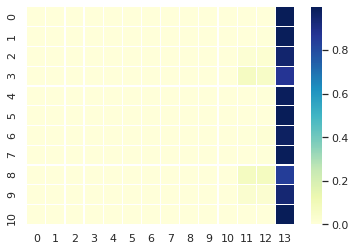

source:  as cancer can spread  it is necessary that the doctor should immediately find whether the tumor is formed and that it is cancer 
actual:  <sos> कैंसर चूँकि फैल सकता है  अतः आवश्यक है कि चिकित्सक तुरन्त यह पता कर लें कि क्या ट्यूमर बन गया है  और यह कैंसर है ।
predicted:  अतः प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष विशेष परिणामस्वरूप संक्रामक है और कारण होता है । <eos>
BLEU Score:  0.17352228696404481


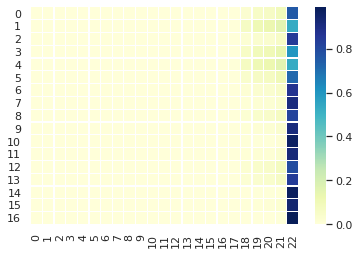

source:  the treatment of cancer can start as soon as it is found 
actual:  <sos> कैंसर का पता चलते ही इसका इलाज आरम्भ किया जा सकता है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.19112328397109352


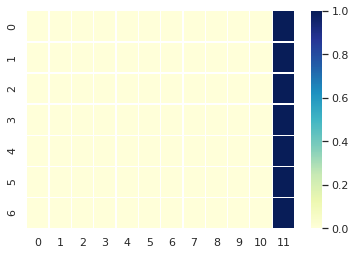

source:  several symptoms shows up due to cancer that gives the impressions of cancer 
actual:  <sos> कैंसर के कारण ऐसे अनेक लक्षण दिखलाई पड़ने लगते हैं जो कैंसर होने का आभास देते हैं ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18429333166740366


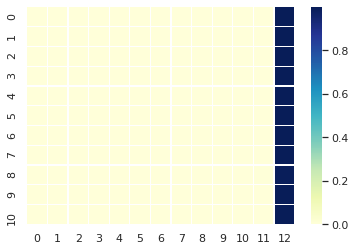

source:  details of some important symptoms are given below 
actual:  <sos> कुछ महत्वपूर्ण लक्षणों का विवरण नीचे दिया जा रहा है ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.1940679506664638


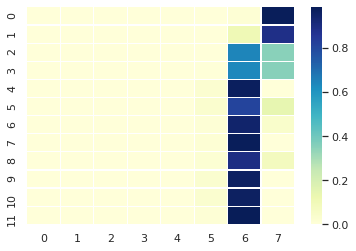

source:  if there is an oxalate stone in the kidney what preventions could be advantageous 
actual:  <sos> गुर्दे में ऑक्जेलेट पत्थरी रही हो तो आगे किनकिन चीजों से परहेज बरतना फायदेमंद हो सकता है 
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0


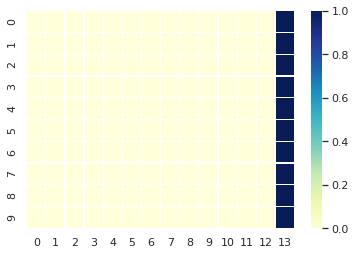

source:  any wound that do not heal in enough time 
actual:  <sos> कोई भी घाव जो काफी समय से भरता नहीं हो ।
predicted:  बुखार ओनिकोमाइसिस लोगों को माह के चकत्तों के अधिक किया गया । <eos>
BLEU Score:  0.1940679506664638


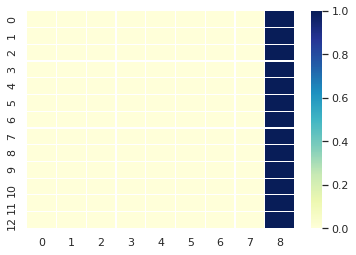

source:  cyst or swelling on breast or any other part of the body 
actual:  <sos> स्तन पर या शरीर में अन्य कहीं गाँठ या सूजन ।
predicted:  आरसीएच किट भारत सरकार से घरों वाले मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं जो हेपेटाइटिसबी कि जीवित एकल अधिक नवजात किट शिशु प्राप्त हो सकती अनुमानतः आना । <eos>
BLEU Score:  0.17720358476097886


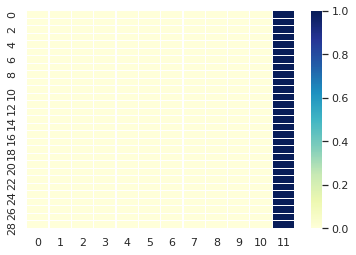

source:  abnormal passing of blood or pus from any part or organ of body 
actual:  <sos> शरीर के किसी भाग या अंग से असामान्य रूप से रक्त या मवाद आना ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक जीवन शैली या भाग आने माह पाये जाते हैं लेकिन रोग नहीं होता है । <eos>
BLEU Score:  0.18827362913939635


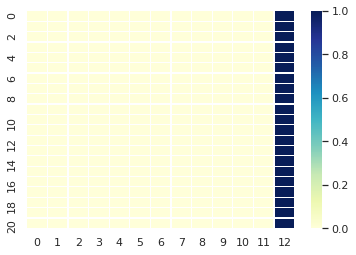

source:  continuous prolonged bouts of cough or occurrence of heaviness in speech 
actual:  <sos> लगातार काफी समय तक खाँसी आना या आवाज भारी होना ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.1940679506664638


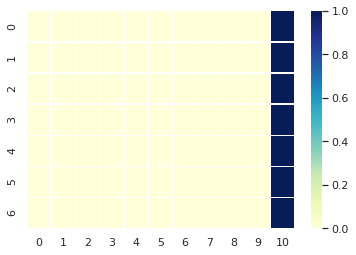

source:  pain in swallowing food or during toilet  continuous indigestion or constipation 
actual:  <sos> खाना निगलने या शौच में कष्ट होना  लगातार अपच या कब्ज रहना ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त हो सकती है । <eos>
BLEU Score:  0.18968126713037053


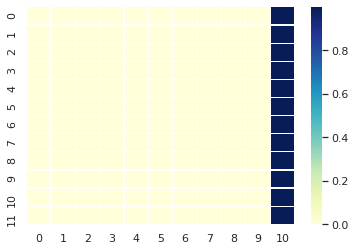

source:  change in general habits of bowels 
actual:  <sos> आँतों की सामान्य आदतों में परिवर्तन ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19913749124569236


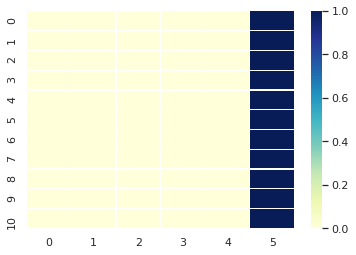

source:  sudden change in the size  color or shape of moles or warts 
actual:  <sos> तिल या मस्से के आकार  रंग या रुप में अचानक परिवर्तन ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.19112328397109352


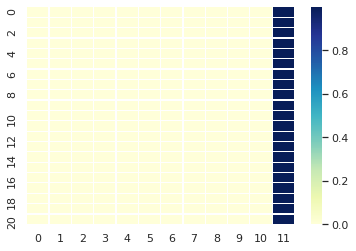

source:  however  such symptoms erupts not just because of cancer  there can be other reasons as well for these 
actual:  <sos> वैसे  ऐसे लक्षण केवल कैंसर के कारण ही पैदा नहीं होते  इनके और कारण भी हो सकते हैं ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18068537884315472


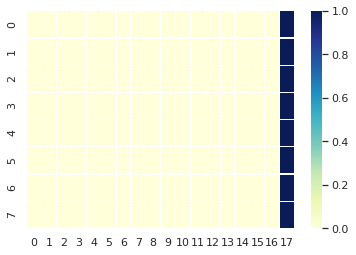

source:  therefore one should not take it as cancer just on its appearance 
actual:  <sos> अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिये ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.19552795980276136


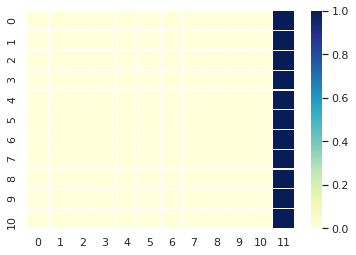

source:  show these to the doctor if these symptoms stay for two weeks 
actual:  <sos> दो सप्ताह तक इन लक्षणों के बने रहने पर इन्हें चिकित्सक को दिखलाएँ ।
predicted:  पूरी किसी वायरल हो जाना करें । <eos>
BLEU Score:  0.18968126713037053


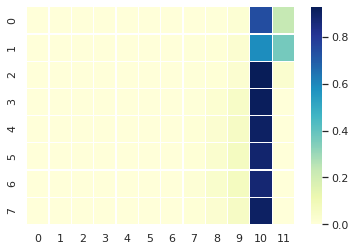

source:  there is no doubt that immediate identification of most of the cancer diseases lrb  percent rrb is possible 
actual:  <sos> इसमें कोई शक नहीं कि भारत में पाए जाने वाले अधिकतर कैंसर     प्रतिशत  रोगों की शीघ्र पहचान संभव है ।
predicted:  अतः इन्हें जाय तो कर काफी भी लगा सकता है । <eos>
BLEU Score:  0.17639910709395284


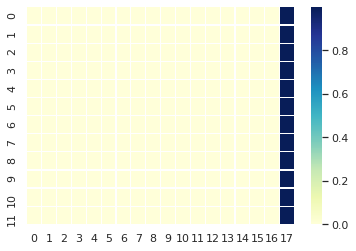

source:  the need is to increase the knowledge about it and for every one to take care of oneself 
actual:  <sos> आवश्यकता है  इसके बारे में जानकारी बढ़ाने तथा हर व्यक्ति को अपना स्वंय ध्यान रखने की ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.18429333166740366


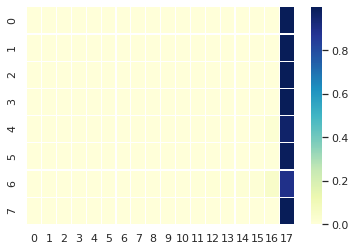

source:  after identifying cancer early  total treatment is now possible for  percent of cancer patients 
actual:  <sos> कैंसर को शीघ्र पहचानकर     प्रतिशत कैंसर रोगियों को जड़ से ठीक करना अब संभव है ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग धुआँ छोड़ने में भीतर रक्त हो सकती है । <eos>
BLEU Score:  0.18184804078107475


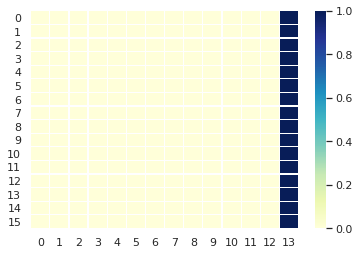

source:  not only this  the cost of early identification and immediate treatment is also much lower than late treatment 
actual:  <sos> यही नहीं शीघ्र पहचान और तुरन्त उपचार की लागत भी देर से उपचार के मुकाबले में बहुत कम है ।
predicted:  कैंसर रक्त छिड़काव करवायें । <eos>
BLEU Score:  0.18184804078107475


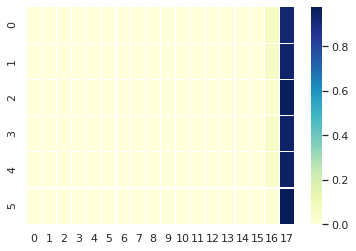

source:  besides being aware of the symptoms of cancer  all the men and the women should get themselves tested regularly 
actual:  <sos> कैंसर के लक्षणों से सचेत होने के अतिरिक्त सभी महिलाओं एवं पुरूषों को नियमित रुप से अपनी जाँच करवानी चाहिए ।
predicted:  घर में आसपास वातावरण में जिला काटता है । <eos>
BLEU Score:  0.18068537884315472


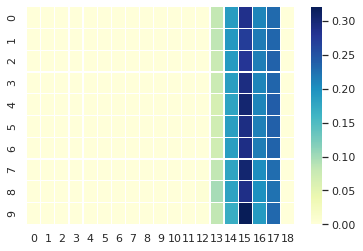

source:  some types of cancers can be identified by general tests before any symptoms appear 
actual:  <sos> सामान्य परीक्षणों द्वारा कुछ प्रकार के कैंसर रोगों का पता किसी चिन्ह के प्रकट होने के पहले ही किया जा सकता है ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.17847260705223245


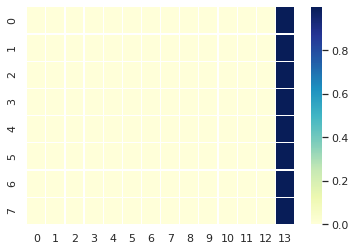

source:  doctors can find out cancer diseases of mouth  breast  cervix  skin  large intestine  rectum  prostate gland  testicle etc  even before any signs appear 
actual:  <sos> किसी चिन्ह के प्रकट होने के पहले ही चिकित्सक मुख  स्तन  गर्भाशयग्रीवा  सर्विक्स   त्वचा  बड़ी आंत  मलाशय  पुरस्थग्रंथी  प्रोटेस्ट   अण्डकोश  टेस्टिकल  आदि कैंसर रोगों का पता लगा सकते हैं ।
predicted:  घर में आसपास मामले के स्तन में वीजेडवी से प्रभावित अंगों में मदद मिलती है । <eos>
BLEU Score:  0.16222855986147738


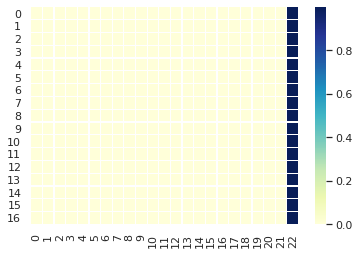

source:  cancer of the cervix is a common cancer of occurring among women 
actual:  <sos> ग्रीवा का कैंसर स्त्रियों में होने वाला एक आम कैंसर हैं ।
predicted:  डायबिटीज अथवा मच्छररोधी अगरबत्ती का सर्वाधिक बढ़ जाना चाहिए । <eos>
BLEU Score:  0.19259074009082888


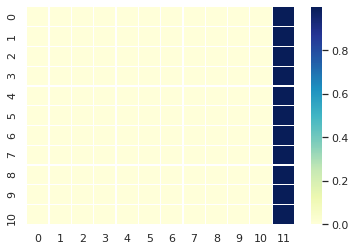

source:  among all the cancers occurring in india  percent is that of cervix 
actual:  <sos> भारत में औरतों में होने वाले कुल कैंसर रोगों में  प्रतिशत कैंसर गर्भाशयग्रीवा के होते हैं ।
predicted:  घर स्वंय भी शीशे में अपना स्वंय प्रेषित चिकित्सक से जाँच करनी चाहिए । <eos>
BLEU Score:  0.18429333166740366


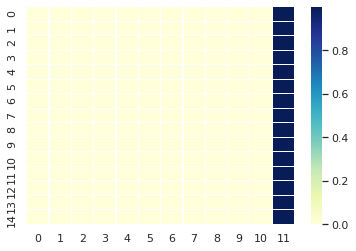

source:  lymph nodes are connected to lymph arteries and form a white liquid that is called lymph 
actual:  <sos> लसीका ग्रन्थियाँ लसीका धमनियों द्वारा एक दूसरे से जुड़ी हुई होती हैं और एक सफेद तरल द्रव बनाती हैं जिसे लसीका कहते हैं ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु उपलब्ध होगा । <eos>
BLEU Score:  0.17741926041310546


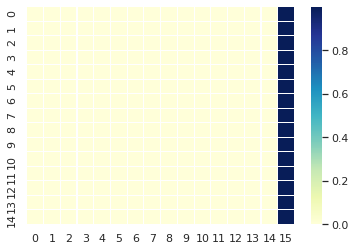

source:  the web of lymph arteries is spread throughout the body like blood arteries 
actual:  <sos> लसीका धमनियों का जाल रक्त धमनियों की तरह पूरे शरीर में फैला होता है ।
predicted:  कैंसर से अधिक बीमारीयों का बार पर सर्वाधिक तथा सिस्टर्नों को कम किया जा सकता है । <eos>
BLEU Score:  0.18827362913939635


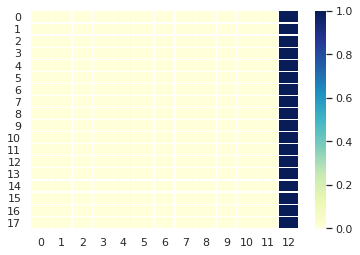

source:  lymph nodes try to keep cancer cells to itself by filtering them 
actual:  <sos> लसीका ग्रंथियाँ कैंसर कोशिकाओं को छानकर अपने तक सीमित रखने का प्रयत्‍न करती हैं ।
predicted:  कैंसर रक्त हेपेटाइटिसबी से बचाव या उसके बचाव या पास लाता है । <eos>
BLEU Score:  0.18827362913939635


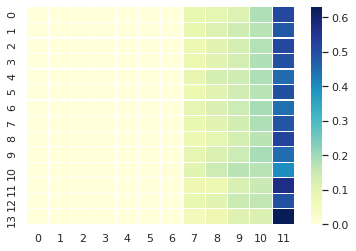

source:  on advancement of the cancer it is not able to do this and cancer spreads from one part of the body to other part by lymph 
actual:  <sos> कैंसर बढ़ जाने पर वह ऐसा नहीं कर पातीं और लसीका द्वारा कैंसर शरीर के एक भाग से दूसरे भाग तक फैलने लगता है ।
predicted:  लेकिन अथवा मच्छररोधी अगरबत्ती का सर्वाधिक व्यापक बीमारी है । <eos>
BLEU Score:  0.17639910709395284


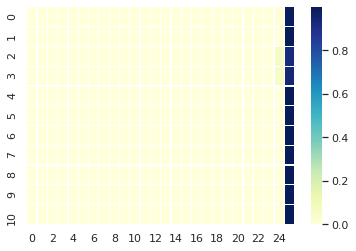

source:  that is why surgeons usually weed out the lymph nodes nearby the cervix also 
actual:  <sos> इसी कारण शल्य चिकित्सक आमतौर पर गर्भाशयग्रीवा के आसपास की लसीका ग्रंथियों को भी निकाल लेते हैं ।
predicted:  कैंसर के काटने के पश्‍चात होता है । <eos>
BLEU Score:  0.18429333166740366


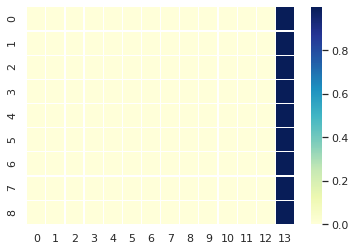

source:  cervical cancer can spread through blood circulation 
actual:  <sos> गर्भाशयग्रीवा का कैंसर रक्त प्रवाह के द्वारा भी फैल सकता है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक चाहिए बन्द कम कि यहाँ ट्यूमर है । <eos>
BLEU Score:  0.19259074009082888


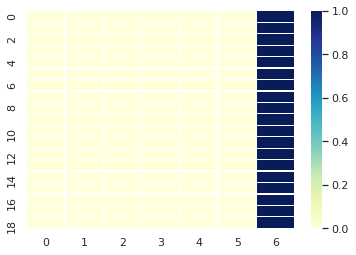

source:  for changes in skin  particularly any kind of growth in moles or warts  you should get tested regularly 
actual:  <sos> त्वचा में खासकर तिल या मस्से किसी प्रकार की नई वृद्वि या परिवर्तन के लिए आप नियमित रुप से जाँच करवाए ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी तरह पैरों में नीचे दिया जाता है । <eos>
BLEU Score:  0.17956076853248887


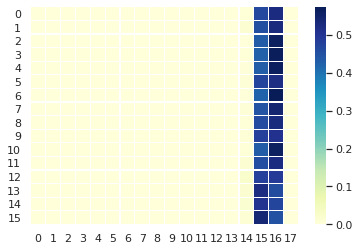

source:  any kind of changes should be shown to the doctor immediately 
actual:  <sos> किसी भी परिवर्तन को तुरंत चिकित्सक को दिखलाएँ ।
predicted:  घर स्वंय प्रकार के तुरंत धनिया नही । <eos>
BLEU Score:  0.1969244213551724


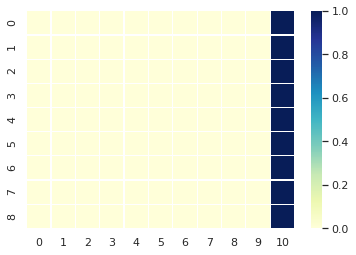

source:  a doctor should also test the skin during general medical checkup 
actual:  <sos> सामान्य डॉक्टरी जाँच के दौरान डॉक्टर को त्वचा की भी जाँच करनी चाहिए ।
predicted:  घर स्वंय भी शीशे में अपना स्वंय प्रेषित चिकित्सक से जाँच करनी चाहिए । <eos>
BLEU Score:  0.18968126713037053


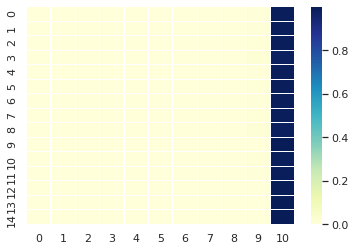

source:  regular medical checkup is important for early detection of cancer of the large intestine and the rectum 
actual:  <sos> बडी आंत और मलाशय के कैंसर का शीघ्र पता लगाने के लिए नियमित डॉक्टरी जाँच करवाना महत्वपूर्ण है ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18305025818318518


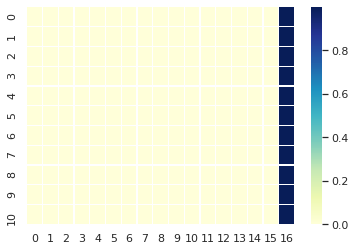

source:  a doctor can find out about the disease by inserting gloved finger in the rectum 
actual:  <sos> मलाशय की जाँच करने के लिए चिकित्सक दस्ताना चढ़ी हुई अंगुली मलाशय में डालकर  रोग का पता लगा सकता है ।
predicted:  घर में टीके की रोग के निकलती है जो बाद पाट दें । <eos>
BLEU Score:  0.17956076853248887


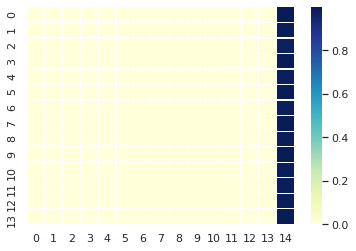

source:  annual test of everybody after the age of  years is necessary 
actual:  <sos>  वर्ष की आयु के बाद  हर व्यक्ति की वार्षिक जाँच आवश्यक है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में संक्रामक है । <eos>
BLEU Score:  0.18827362913939635


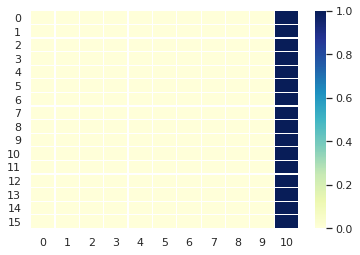

source:  blood can occur with the faeces due to cancer of the large intestine 
actual:  <sos> बड़ी आंत के कैंसर के कारण मल के साथ रक्त आ सकता है ।
predicted:  आरसीएच किट भारत सरकार की सूची जहाँ से पूरी जाँच करवाना गया तो जानलेवा लगभग दो नहीं कि कार्यक्रम नहीं दर पर उपलब्ध । <eos>
BLEU Score:  0.22557031245416842


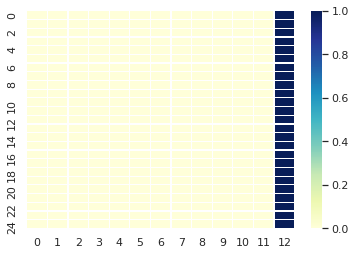

source:  a comprehensive test is mandatory for confirmed diagnosis  the doctor should do a sigmoidoscopy lrb telescopic test of the rectum rrb of the rectum and the large intestine in a period of  to  years for persons crossing the age of  years 
actual:  <sos> निश्‍चित निदान के लिए विस्तृत जाँच आवश्यक है  वर्ष की आयु पार कर लेने वाले व्यक्ति के मलाशय और बड़ी आंत की जाँच करने के लिए डॉक्टर को  से  वर्ष की अवधि में सिग्माइडोस्कोपी  मलाशय की दूरबीन जाँच  करनी चाहिए ।
predicted:  घर में आसपास मामले के टीके की परिवार नियोजन सेवाओं में यह सुझाया जा सकता है कि रोगी फिर से अधिक पाया गया है । <eos>
BLEU Score:  0.16041949523345567


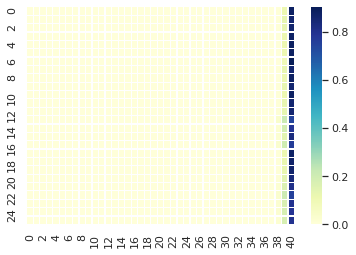

source:  the most credible method of finding out the prostate cancer in its initial stage is the test of gloved finger by the doctor 
actual:  <sos> डॉक्टर द्वारा पुरस्थ ग्रंथी के कैंसर का आंरभिक स्थिति में पता लगाने का अत्यंत विश्‍वसनीय तरीका चढ़ी हुई उंगली का परीक्षण है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष से प्रतिशत वर्ष से बचाव या पास लाता है । <eos>
BLEU Score:  0.17847260705223245


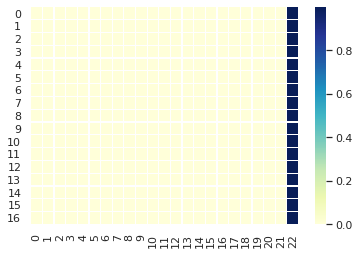

source:  an annual checkup of everybody above the age of  years must be done 
actual:  <sos>  साल से अधिक आयु के सभी व्यक्तियों की वार्षिक जाँच अवश्य की जानी चाहिए ।
predicted:  घर स्वंय परिवार कल्याण कार्यक्रम के वायरल निम्न प्रकार के खेतों पोखरों सर्वाधिक प्रभावी और सुविधाजनक उपाय है टीकाकरण । <eos>
BLEU Score:  0.18690518620528904


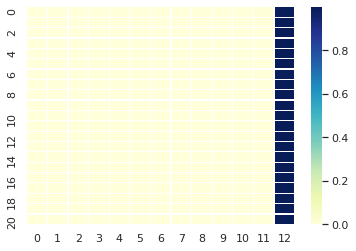

source:  with annual test any irregular or abnormal areas can be found out and it can be known whether there is a tumor or not 
actual:  <sos> वार्षिक जाँच से अवश्य पुरस्थ ग्रंथी में अनियमित या असामान्य सख्त क्षेत्र का पता लग सकता है और जाना जा सकता है कि यहाँ ट्यूमर है या नहीं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी करनी चाहिए । <eos>
BLEU Score:  0.17261970532895454


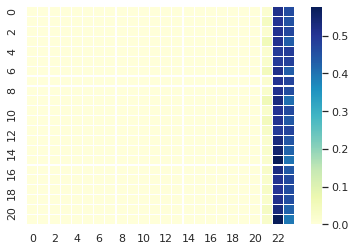

source:  testicular gland cancer could be found out by most of the men themselves 
actual:  <sos> अण्ड ग्रंथीय कैंसर का पता अधिकतर आदमी स्वंय कर सकता है ।
predicted:  घर बुखार समय या रक्त टंकियों वातावरण को बढ़ता किया जाता है । <eos>
BLEU Score:  0.19259074009082888


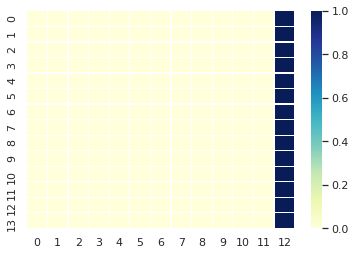

source:  men can find out any changes in the testicular gland by testing themselves every month 
actual:  <sos> प्रत्येक मास स्वंय जाँच करके पुरूष अपनी अण्ड ग्रंथियों में परिवर्तन का पता लगा सकते हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18557819854739144


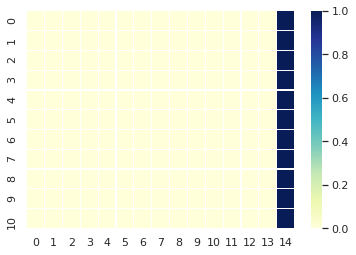

source:  the best time to test it is during the time of bathing with hot water or after  when the testicle is flaccid  as in this situation any changes can be easily figured out 
actual:  <sos> गरम जल से स्नान करते समय या उसके बाद  जब अण्डकोष शिथिल होता है  इसकी जाँच का सबसे अच्छा समय होता है  क्योंकि इस स्थिति में किसी भी परिवर्तन का सुगमता से पता लगाया जा सकता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक पीड़ा को रक्त विकलांगता है यदि यह रोग नहीं जलन सुन्न होता है । <eos>
BLEU Score:  0.16350285370062975


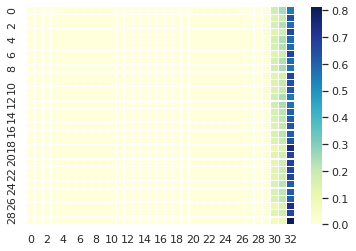

source:  while testing the testicular gland by oneself  if one finds a swelling  cyst or any other kind of defect  particularly an abnormal pain on touching the testicular gland  pain or heaviness  then the doctor should consulted 
actual:  <sos> अण्ड ग्रंथी के स्वंय परीक्षण से यदि सूजन  गाँठ या किसी अन्य प्रकार के दोष का  खासकर अण्ड ग्रंथी को छूने से असामान्य दर्द  या भारीपन का पता चलता है तो डॉक्टर को दिखलाना चाहिए ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.16483717274840187


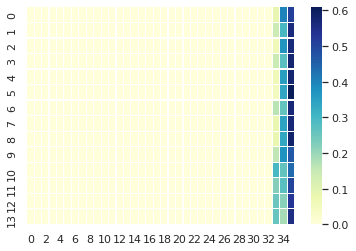

source:  testicular gland test should also be a part of the regular annual medical test of the humans by the doctors 
actual:  <sos> डॉक्टर द्वारा अण्ड ग्रंथियों की जाँच भी मनुष्य की नियमित वार्षिक डॉक्टरी जाँच का अंग होना चाहिए ।
predicted:  कैंसर के बाद हमें पूरी बाँह का पता लग सकता है और देखने के पूरी आस्तीन का करें । <eos>
BLEU Score:  0.18429333166740366


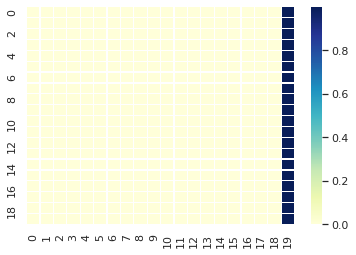

source:  regular test of mouth is required for the signs of mouth cancer 
actual:  <sos> मुख के कैंसर के चिन्हों के लिए मुख की नियमित रूप से जाँच आवश्यक है ।
predicted:  कैंसर से अधिक आयु के वयस्कों के रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में उनकी शारीरिक रेटिना के मृत्यु दर काफी अधिक किया जा सकें । <eos>
BLEU Score:  0.18690518620528904


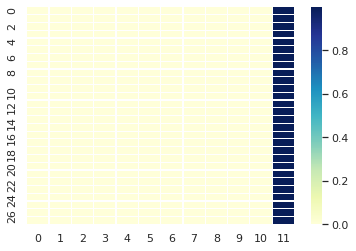

source:  change of tissues of mouth can be the initial stage of cancer 
actual:  <sos> मुख के ऊतकों का परिवर्तन कैंसर की आरम्भिक स्थिति हो सकती है ।
predicted:  घर स्वंय टीके की परिवार कल्याण प्रजनन स्वास्थ्य कार्यकर्मी से शारीरिक मृत्यु दर एवं बच्चों तथा प्रत्येक जीवित एकल के कारण लगभग दो चाहिए । <eos>
BLEU Score:  0.19112328397109352


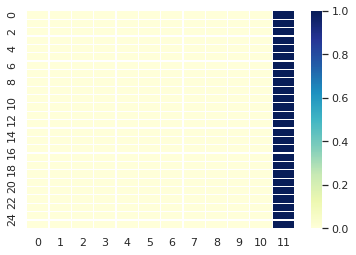

source:  change of tissues of mouth can be easily seen and experienced 
actual:  <sos> मुख के ऊतकों के परिवर्तन को आसानी से देखा और अनुभव किया जा सकता है ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक चाहिए बन्द कर सकता है । <eos>
BLEU Score:  0.18690518620528904


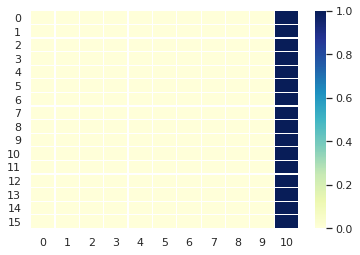

source:  a dentist should test the mouth of every patient in every form 
actual:  <sos> दंत चिकित्सक को चाहिए कि वह हर रूप से हर रोगी की मुख की पूरी जाँच करें ।
predicted:  कैंसर के टीके की अथवा उसके अजन्में या नवजात शिशु वाली अधंता पपीता आम अधिक किया गया । <eos>
BLEU Score:  0.18429333166740366


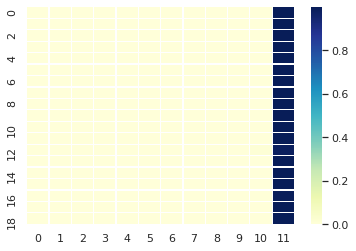

source:  changes occurring in gum  lips and cheek should be paid attention 
actual:  <sos> मसूड़ों  होठों और गालों के रंग में होने वाले परिवर्तन पर ध्यान दिया जाना चाहिए ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.18557819854739144


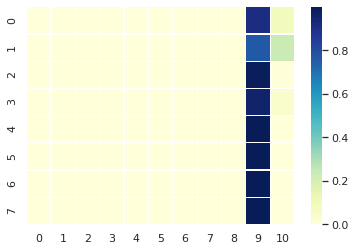

source:  scab cracks  swelling  bleeding or cyst or tumor in any part of the mouth should be paid special attention 
actual:  <sos> खुरण्ड  पपड़ी  दरार  सूजन  रक्त स्राव या मुख के किसी भी भाग में गाँठ अथवा गिलटी के बारे में विशेष ध्यान दिया जाना चाहिए ।
predicted:  घर तथा आसपास वातावरण को वातावरण को बढ़ता उभरती है । <eos>
BLEU Score:  0.17261970532895454


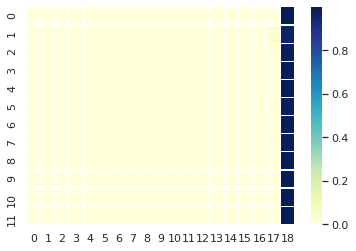

source:  you must get tested by a doctor or a dentist 
actual:  <sos> चिकित्सक या दंतचिकित्सक के पास जाकर जाँच अवश्य करवा लें ।
predicted:  पूरी आस्तीन की स्वंय उपयोग करें । <eos>
BLEU Score:  0.1940679506664638


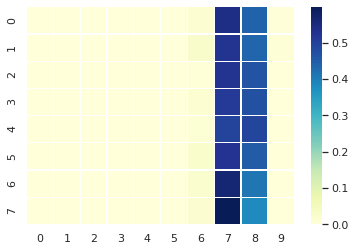

source:  if you are eating tobacco  betel  pan masala or zarda then the test is even more essential 
actual:  <sos> यदि आप तम्बाकू  पान  पानमसाला या जर्दे का सेवन करते हैं तो जाँच करवाना और भी आवश्यक है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है और यह रोग से दर्द होने के संक्रामक बन जाते हैं । <eos>
BLEU Score:  0.18068537884315472


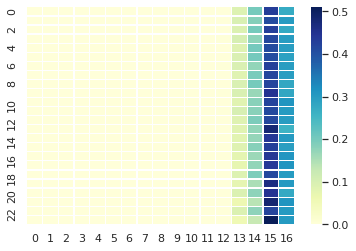

source:  you can also view your mouth in the mirror and in case of any changes  you can take advice of the doctor 
actual:  <sos> आप स्वंय भी शीशे में अपना मुख देख सकते हैं और कोई परिवर्तन दिखाई देने पर डॉक्टर की सलाह ले सकते हैं ।
predicted:  कैंसर रक्त छिड़काव करवायें । <eos>
BLEU Score:  0.17847260705223245


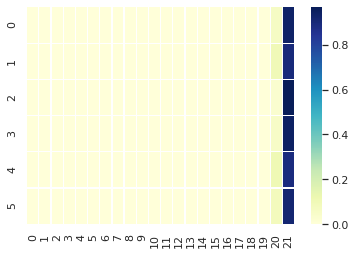

source:  all the women should know how to test their own breasts and each month they should test their breasts themselves 
actual:  <sos> सभी महिलाओं को स्तन के स्वंय परीक्षण का ढंग जान लेना चाहिए और हर महिने अपने स्तनों का स्वंय परीक्षण कर लेना चाहिए ।
predicted:  घर में कूलर टीन जान नुकसान स्वस्थ्य टंकियों कम आवश्यक है । <eos>
BLEU Score:  0.17741926041310546


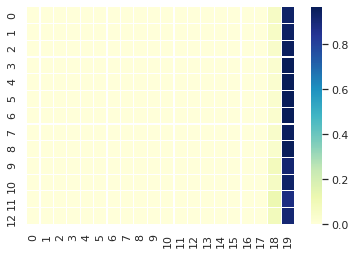

source:  it is good to test the breasts a few days after the menstruation period when there is no possibility of breasts becoming large or any pains at all 
actual:  <sos> रजोधर्म अवधि के कुछ दिनों बाद स्तनों का परीक्षण करना ठीक होता है जब स्तनों के बड़े होने या दर्द होने की संभावना बिल्कुल नहीं होती ।
predicted:  घर में आसपास मामले के कारण अधिक कैंसर है और कारण अधिक पहनायें । <eos>
BLEU Score:  0.17445211157624774


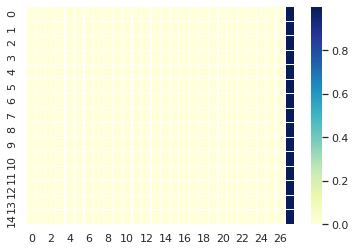

source:  even if the menstruation period has stopped  women should appoint a day lrb whenever rrb each month for test 
actual:  <sos> मासिक धर्म बंद हो जाने पर भी महिलाओं को हर महिने स्वंय परीक्षण के लिए एक दिन  कभी भी  नियुक्त कर लेना चाहिए ।
predicted:  घर में आसपास मामले के प्रभावित और गाँठों के पश्‍चात मुख्यालय रोग क्रम से अधिक लाता है । <eos>
BLEU Score:  0.17541056564995905


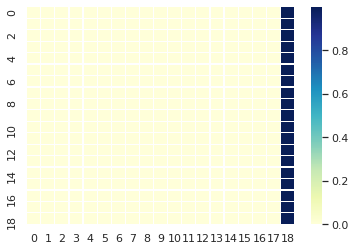

source:  this test is specially important for women above the age of  years 
actual:  <sos>  वर्ष से अधिक आयु की महिलाओं के लिए यह परीक्षण विशेष रूप से महत्वपूर्ण होता है ।
predicted:  घर स्वंय बचाव का निर्भर है । <eos>
BLEU Score:  0.18429333166740366


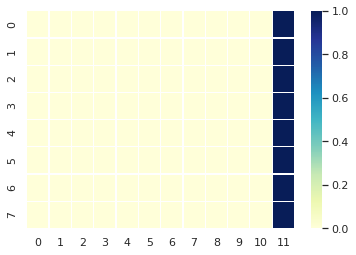

source:  the danger of breast cancer increases in age above  years 
actual:  <sos>  वर्ष से अधिक आयु में स्तन कैंसर का खतरा बढ़ जाता है ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति जीवन शैली या व्यक्ति से व्यक्ति से जाँच प्रभावी रहा है । <eos>
BLEU Score:  0.18968126713037053


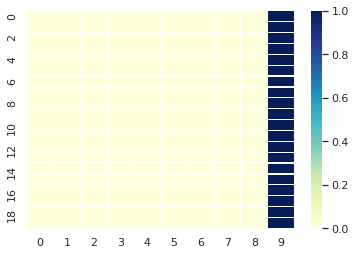

source:  if a woman feels a cyst or any kind of change in the breasts she should consult a doctor 
actual:  <sos> यदि किसी महिला के स्तन में गाँठ या किसी प्रकार के परिवर्तन का आभास होता है तो उसे चिकित्सक से सम्पर्क करना चाहिए ।
predicted:  घर में टीके की रोग के निकलती है और कारण शर्करा ग्लूकोज के प्रभावित हो बन्द कर सकता है । <eos>
BLEU Score:  0.17741926041310546


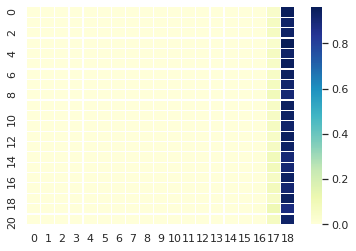

source:  about  percent of the cysts of the breasts are not cancer but only a doctor can correctly find it out 
actual:  <sos> स्तन की लगभग  प्रतिशत गाँठें कैंसर नही होती परन्तु एक चिकित्सक ही इसकी सही पहचान कर सकता है ।
predicted:  घर में आसपास मामले के पश्‍चात लगना गले में रक्त रोग नहीं फैल सकती हैं और यह रोग नहीं होता । <eos>
BLEU Score:  0.18184804078107475


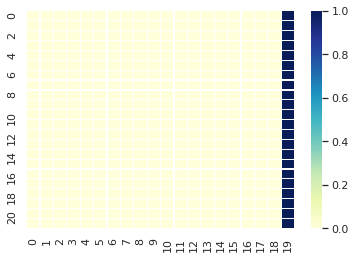

source:  any abnormal situations like cyst in the breasts or breasts becoming very large must be tested during the medical test of women 
actual:  <sos> महिला की डॉक्टरी जाँच करते समय स्तन में गाँठ या स्तनों के बहुत बड़े हो जाने जैसे किसी असामान्य परिवर्तन की जाँच अवश्य की जानी चाहिए ।
predicted:  घर में टीके की रोग के निकलती है और कारण ऐसे पूरी बाँह का उपयोग घुंधला होता कि जानलेवा हो सकती है । <eos>
BLEU Score:  0.17445211157624774


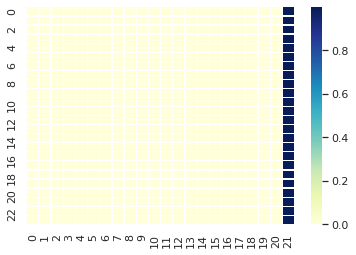

source:  after the age of  years every women must get mammogram done in  to  years 
actual:  <sos>  साल की आयु के बाद हर महिला को  से  वर्ष में मैमोग्राम करवाना चाहिए ।
predicted:  घर में टीके की रोग के काटता है और बनाता है । <eos>
BLEU Score:  0.18429333166740366


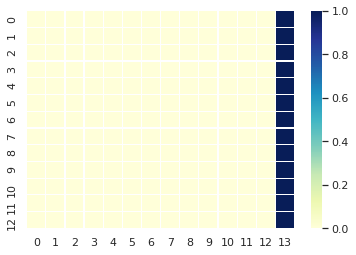

source:  if the age of women goes up to  years then mammogram should be done every year 
actual:  <sos> महिला की उम्र  वर्ष हो जाय तो प्रत्येक वर्ष मैमोग्राम करवाना आवश्यक है ।
predicted:  घर में टीके की रोग से बेस मामले के कारण देखने में बचाव या नवजात शिशु प्राप्त करने वाले एकल अधिक कैंसर है । <eos>
BLEU Score:  0.18827362913939635


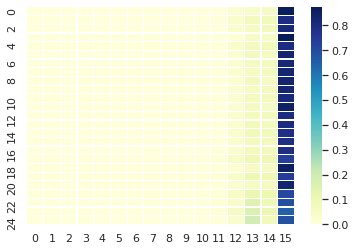

source:  the women whose mothers  sister  blood aunts etc  have cancer should start getting mammography done since  years 
actual:  <sos> जिन महिलाओं की माताओं  बहनों  मौसियों आदि को कैंसर है उन्हें  वर्ष की आयु से ही वार्षिक स्तन जाँच तथा मैमोग्राफी करवानी चाहिये ।
predicted:  घर स्वंय टीके की परिवार नियोजन सेवाओं में रखा जाय । <eos>
BLEU Score:  0.17445211157624774


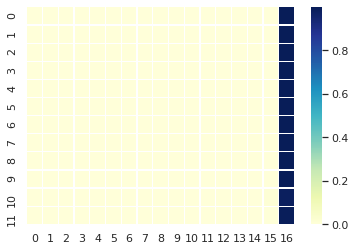

source:  cancer is tested through pathology 
actual:  <sos> कैंसर की जाँच पैथोलोजी परीक्षण के द्वारा की जाती है ।
predicted:  कैंसर से अधिक बीमारीयों का टनल स्तर पर टिप्पणी अंधापन हो सकती हैं । <eos>
BLEU Score:  0.1940679506664638


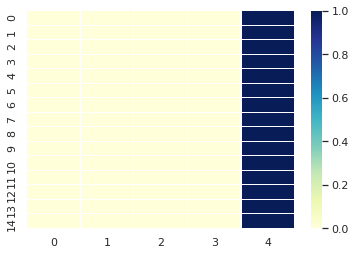

source:  it is seen in microscope 
actual:  <sos> एफएनएसी  बायोप्सी के द्वारा इन कोशिकाओं को सूक्ष्मदर्शी में देखा जाता है ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज हो सकती है । <eos>
BLEU Score:  0.18968126713037053


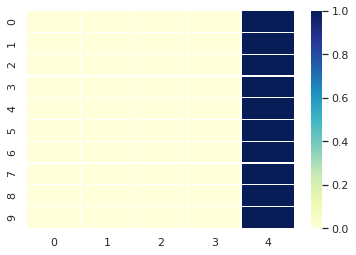

source:  cancer can be found out through other tests like xray    scan     ultrasound also 
actual:  <sos> अन्य जाँच से भी कैंसर का पता लगाया जा सकता है जैसे  सीटी स्केन  एमएमआर  अल्ट्रासाउंड ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन लेता है तथा विभाग निर्भर । <eos>
BLEU Score:  0.18184804078107475


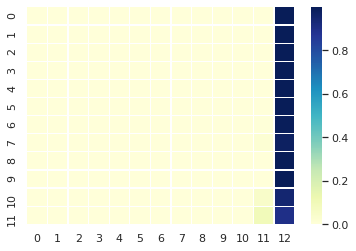

source:  list of training test centres where cancer can be tested 
actual:  <sos> प्रशिक्षण जाँच केन्द्र की सूची जहाँ कैंसर का परीक्षण कराया जा सकता है ।rdpunc
predicted:  कैंसर में आसपास वातावरण में कम करने के लिए संक्रमण जिससे मूत्राशय कि यहाँ । <eos>
BLEU Score:  0


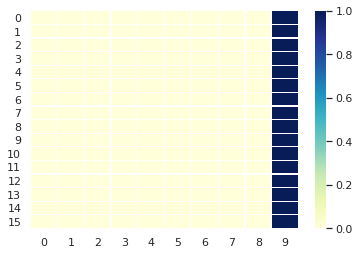

source:  surgery depends on the stage of the cancer 
actual:  <sos> शल्यचिकित्सा कैंसर के चरण पर निर्भर करता है ।
predicted:  घर व जानकारी दी गयी है । <eos>
BLEU Score:  0.1969244213551724


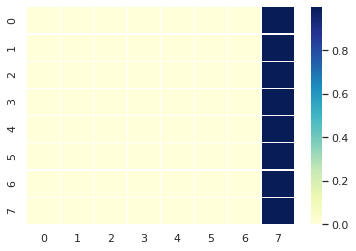

source:  if cancer is in a limited area and in initial stage then along with the affected area some normal areas are also extracted 
actual:  <sos> अगर कैंसर सीमित क्षेत्र में और प्रारम्भिक चरण में है तो प्रभावित क्षेत्र के साथसाथ कुछ सामान्य क्षेत्र में भी हटाये जाते हैं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17741926041310546


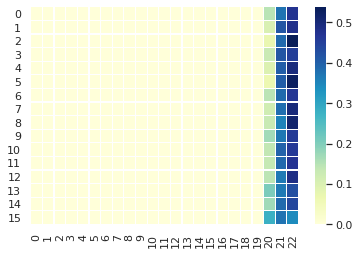

source:  it is attempted that no particle of cancer is left out 
actual:  <sos> कोशिश की जाती है कि कैंसर का कोई भी कण न रह जाए ।
predicted:  घर दरार अथवा गिलटी के पीला पैर नेत्र तंत्रिका सूजन जलन किया गया । <eos>
BLEU Score:  0.22557031245416842


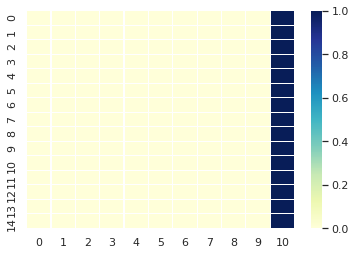

source:  if cancer has also entered other areas then surgery is done to lessen the size of the cancer 
actual:  <sos> अगर कैंसर अन्य क्षेत्र में भी प्रवेश कर चुका है तो कैंसर का आकार कम करने के लिए उससे उत्पन्न होने वाली कठिनाई को कम करने के लिए शल्यचिकित्सा की जाती है ।
predicted:  घर में टीके की रोग के निकलती है जो बाद पाट दें । <eos>
BLEU Score:  0.16925661563897607


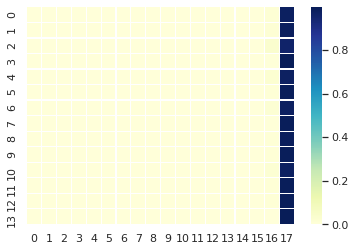

source:  cancer cells are burnt through laser 
actual:  <sos> विकिरण द्वारा कैंसर कोशिकाओं को जलाया जाता है ।
predicted:  इसके लक्षण तम्बाकू से जटिलताओं का कुर्ता या पश्‍चात मुख्यालय भी ही ठंडा से वजह से लेना चाहिए । <eos>
BLEU Score:  0.1969244213551724


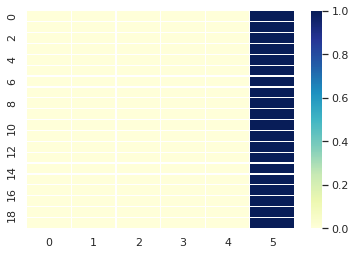

source:  before laser  calculation of area of cancer  spread  capacity of the patient  time of laser based on the cancer  stage  area strength is done 
actual:  <sos> रेडियोधर्मी से पहले कैंसर का क्षेत्र  फैलाव  रोगी की क्षमता  कैंसर के आधार पर विकिरण का समय  चरण  क्षेत्र शक्ति का आंकलन किया जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17089108973983766


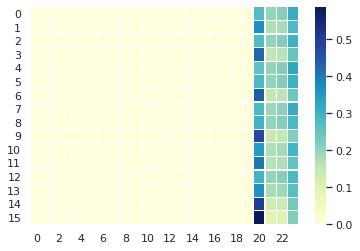

source:  then a mark applied on the skin 
actual:  <sos> फिर त्वचा पर निशान लगाया जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात मुख्यालय ज्यादा किया गया । <eos>
BLEU Score:  0.19817632389021378


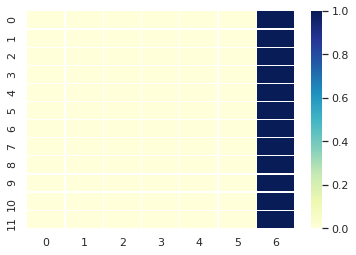

source:  entry for any other person is prohibited in that room during the laser 
actual:  <sos> विकिरण के दौरान किसी दूसरे व्यक्ति का उस कमरे में प्रवेश वर्जित होता है ।
predicted:  लगभग से विद्यार्थी capsular cataract अपना सकल वर्ष तक सास्वाकेन्द्र रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के
BLEU Score:  0


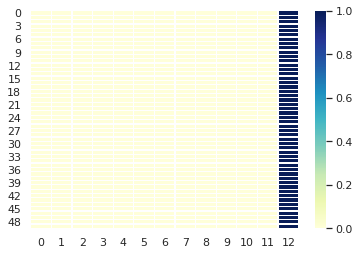

source:  there is no pain in radioactive rays 
actual:  <sos> रेडियोधर्मी विकिरण से किसी प्रकार की कोई तकलीफ नही होती ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.1940679506664638


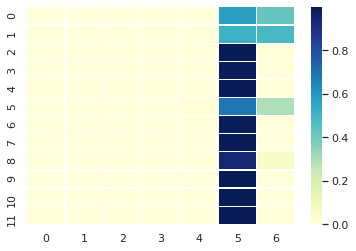

source:  sometimes the skin may become red or patient may feel like vomiting 
actual:  <sos> कभीकभी त्वचा लाल हो सकती है या रोगी को उल्टी आ सकती है ।
predicted:  घर स्वंय तम्बाकू से सम्बन्धित भोजन रेटिना के पश्‍चात मुख्यालय स्तर पर गठित क्रय किया जा सकती हैं और गाँठों के ही ठंडा से होना सकते हैं । <eos>
BLEU Score:  0.18968126713037053


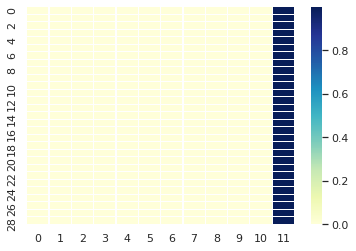

source:  some cancers like blood cancer and the cancer of the cysts can be fully treated with medicine 
actual:  <sos> दवाओं द्वारा कुछ कैंसर को पूरी तरह से ठीक किया जा सकता है जैसे रक्त कैंसर और गाँठों का कैंसर ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.18068537884315472


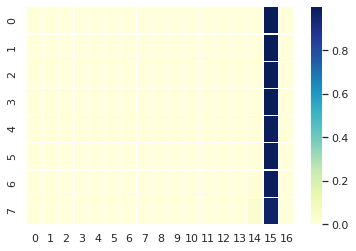

source:  these medicines destroy the cancer cells 
actual:  <sos> ये दवाईयाँ कैंसर कोशिकाओं को समाप्त कर देती हैं ।
predicted:  अतः संक्रमित जीवाणु को तेल से भरता किया गया तो रोग क्रम कमी सकती है । <eos>
BLEU Score:  0.19552795980276136


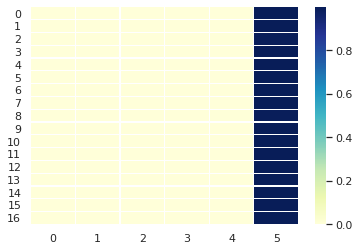

source:  general cells may also be affected with these medicines 
actual:  <sos> सामान्य कोशिकायें भी इन दवाओं से प्रभावित हो सकती हैं ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1940679506664638


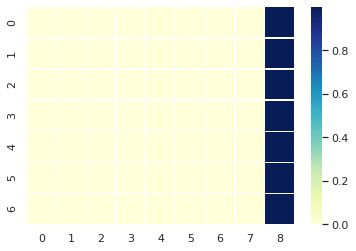

source:  nails may fall 
actual:  <sos> कोशिकाओं के प्रभावित होने की वजह से रोगी के बाल  नाखून  गिर सकते हैं ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती है । <eos>
BLEU Score:  0.18557819854739144


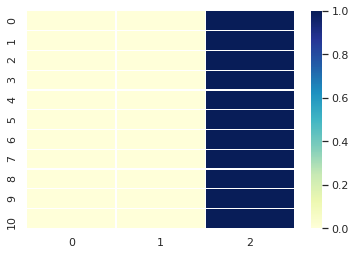

source:  there might occur a decrement in blood which may cause tiredness 
actual:  <sos> खून में कमी आ सकती है जिसकी वजह से थकान लगती है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में संक्रामक है । <eos>
BLEU Score:  0.19112328397109352


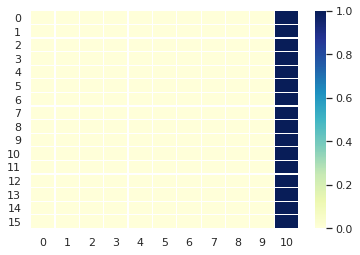

source:  if the patient takes medicine in regular cycle and eats healthy food he can recover fully 
actual:  <sos> अगर रोगी नियमित साइकल से  सही मात्रा में दवाई ले और स्वस्थ भोजन खाये तो बिल्कुल ठीक हो जाता है ।
predicted:  पूरी आस्तीन समय पर परीक्षण कराया जाये तो रोग बढ़ता ही जाता है । <eos>
BLEU Score:  0.17956076853248887


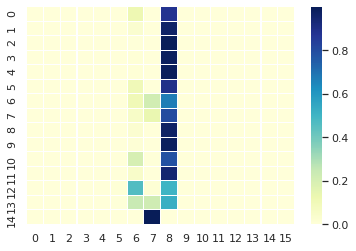

source:  during the treatment blood should be tested regularly  one should have clean water and clean food 
actual:  <sos> इलाज के दौरान निरन्तर खून की जाँच करनी चाहिए  साफ पानी व साफ खाना लेना चाहिए ।
predicted:  घर में अपना दूध के गाँठों के पश्‍चात मुख्यालय रोग क्रम से पहुँचने की होना सकते हैं । <eos>
BLEU Score:  0.18429333166740366


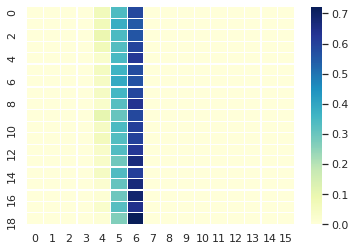

source:  one should not sit with a sick person because the immune strength gets very lessened with medicines 
actual:  <sos> किसी बीमार व्यक्ति के साथ नहीं बैठना चाहिये क्योंकि दवाओं से प्रतिरोधक शक्ति काफी कम हो जाती है ।
predicted:  घर में टीके की रोग के निकलती है और कारण देखने में प्रवेश कर रूप से जाँच करनी चाहिए । <eos>
BLEU Score:  0.18305025818318518


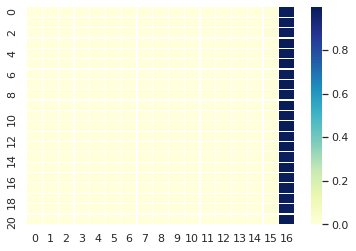

source:  incurable cancer patients are kept in palliative care so that their physical  mental pain could be lessened 
actual:  <sos> कैंसर के लाईलाज रोगियों को पेलियेटिव केयर में रखा जाता है जिससे उनकी शारीरिक  मानसिक  पीड़ा को कम किया जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0.17741926041310546


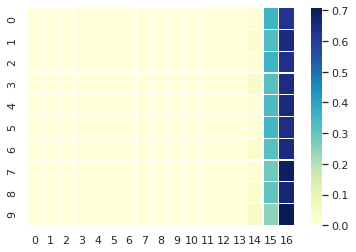

source:  list of hospitals where the treatment of cancer is available 
actual:  <sos> अस्पताल की सूची जहाँ कैंसर के इलाज की सुविधा है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक बार लार परिवर्तनों से रूप से चकत्तों के पुराने माह के कम किया जा सकता है । <eos>
BLEU Score:  0.1940679506664638


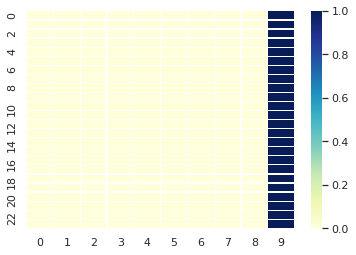

source:  awareness and prevention from cancer 
actual:  <sos> कैंसर से बचाव एवं जागरूकता ।
predicted:  आरसीएच किट भारत सरकार से अधिक रोगियों के वयस्कों के रक्त सर्वाधिक सकते हैं । <eos>
BLEU Score:  0.19953087735062713


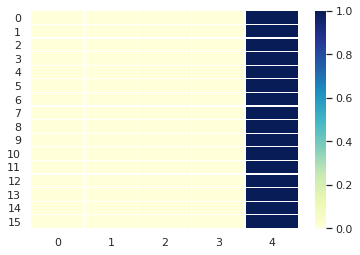

source:  prevention from tobacco and tobacco related products and quitting control 
actual:  <sos> तम्बाकू व तम्बाकूओं से सम्बन्धित वस्तुओं से बचाव व परित्याग प्रदूषण नियत्रंण ।
predicted:  एडिस उल्टी रतौंधी हो सकती हैं । <eos>
BLEU Score:  0.19112328397109352


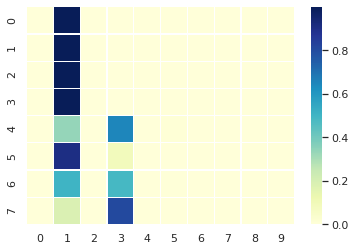

source:  eating fresh fruits and green vegetables  clean normal vegetarian food 
actual:  <sos> स्वच्छ सामान्य शाकाहारी भोजन  प्रत्येक दिन ताजी हरी पत्तीदार सब्जी व ताजे फल का सेवन करना ।
predicted:  गुर्दे absorption दुर्घटनायों दिन के साफ पपीता उपलब्ध करायी जा रही हैं । <eos>
BLEU Score:  0.18429333166740366


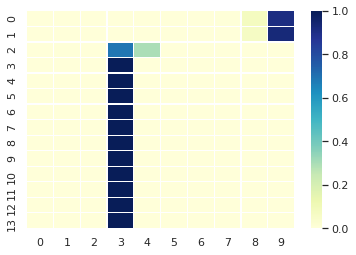

source:  exercise fast for at least half an hour everyday 
actual:  <sos> प्रत्येक दिन कम से कम आधे घन्टे का व्यायाम तेजी से चलना खेलना ।
predicted:  घर बुखार समय या रक्त सर्वाधिक प्रभावी और पक्षाघात गिर बन्द कम हो । <eos>
BLEU Score:  0.18968126713037053


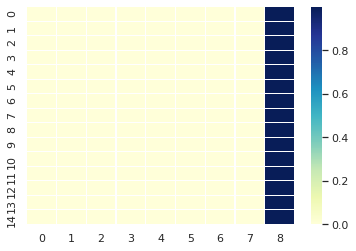

source:  lessening the use of excessive chilly  fried  roasted meat  ghee  wine 
actual:  <sos> अधिक मिर्च  तला  भूना  मांस  घी  मदिरा में कमी करना ।
predicted:  शक्ति बदन absorption कैनसूलर गाजर पपीता इसका उपलब्ध करायी जा रही हैं । <eos>
BLEU Score:  0.18690518620528904


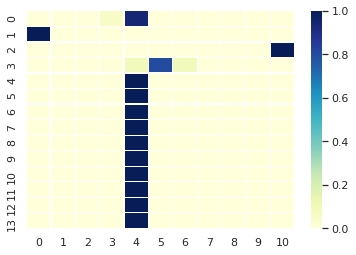

source:  not making any physical relationship before the age of  years 
actual:  <sos>  वर्ष से पहले शारीरिक सम्बन्ध न बनाना ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक निम्न लक्षण टीकाकरण करनी चाहिए । <eos>
BLEU Score:  0.23418392299336482


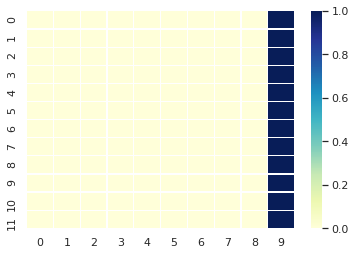

source:  staying faithful to one s partner productive organs clean 
actual:  <sos> अपने साथी के प्रति वफादार रहना जनन अगों को साफ रखना ।
predicted:  घाव एवं बाल नाखून से पूरा रूप से लग सकता है । <eos>
BLEU Score:  0.19259074009082888


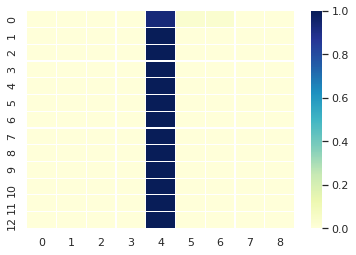

source:  feeding children one s own milk for a long time 
actual:  <sos> बच्चों को लम्बे समय तक अपना दूध पिलाना ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.1969244213551724


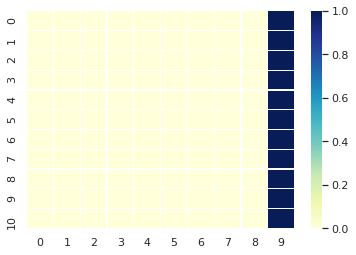

source:  using condoms during the copulation 
actual:  <sos> सम्भोग के दौरान निरोध का इस्तेमाल करना ।
predicted:  घर बुखार समय या होने से प्रभावित कर चकत्तों के रक्त है । <eos>
BLEU Score:  0.19817632389021378


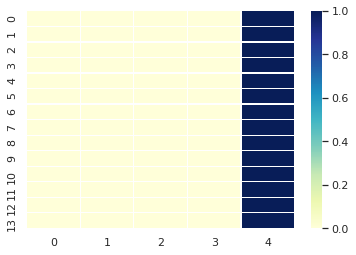

source:  bringing awareness in society 
actual:  <sos> समाज में जागरुकता लाना ।
predicted:  घर बुखार या प्रभावित चाहिए । <eos>
BLEU Score:  0.19879212680993805


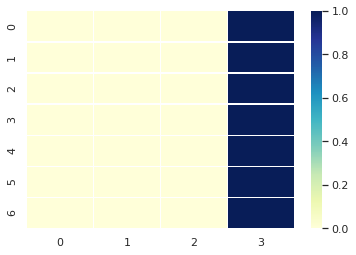

source:  giving information about the harms of smoking and tobacco 
actual:  <sos> धूम्रपान व तम्बाकू से होने वाले नुकसान की जानकारी देना ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय प्रत्येक जीवित सास्वाकेन्द्र अन्त में आगे मलाशय और दर्द करवाना करता हैं । <eos>
BLEU Score:  0.19241932447079674


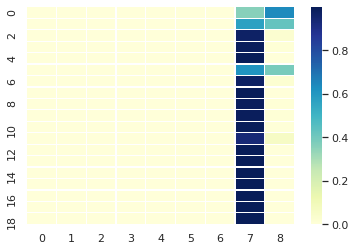

source:  keeping oneself clean and staying away from bad habits 
actual:  <sos> अपने आप को स्वच्छ रखना एवं बुरी आदतों से दूर रहना ।
predicted:  सामान्य रूप बुखार प्रभावित न किया गया तो उन्हें वर्ष के रक्त रोग लगभग से से होने सबसे दर्द होने के खुजली तथा जरिये दूर होती । <eos>
BLEU Score:  0.19259074009082888


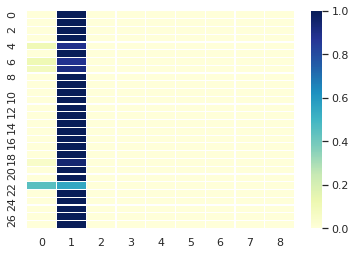

source:  encouraging reforms in rural and urban lifestyle through government and nongovernment department and social organizations 
actual:  <sos> सरकारी व गैरसरकारी विभाग समाजिक संस्थाएँ ग्रामीण व शहरी जीवन शैली को सुधारने के लिए प्रेरित करना ।
predicted:  कैंसर के साफ क्षमता साफ पानी को काटता है और बनाता है । <eos>
BLEU Score:  0.18429333166740366


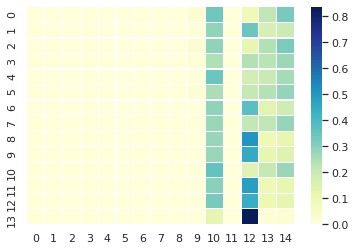

source:  giving information about breasts and mouth tests and getting an annual medical checkup of one s health after  years 
actual:  <sos> स्तन व मुख की जाँच करने की जानकारी देना और  वर्ष के बाद साल में एक बार अपने स्वास्थ्य की पूरी जाँच कराना ।
predicted:  घर में टीके की किरण आँख के पश्‍चात केयर में रखा जाता है । <eos>
BLEU Score:  0.17639910709395284


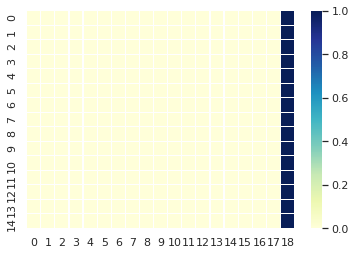

source:  anganwadi workers have been given the information related to cancerous symptoms  selfbreast tests  mouth test and prevention 
actual:  <sos> आंगनवाड़ी कार्यकर्त्ताओं को कैंसर सम्बन्धी लक्षण व स्व स्तन परीक्षण  मुख परीक्षण व बचाव से सम्बन्धित जानकारी दी गयी है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के आगे सामान्य मृत्यु दर काफी अधिक किया जा सकें । <eos>
BLEU Score:  0.21353494351419244


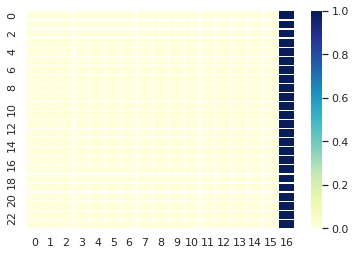

source:  information related to cancer  its symptoms  harms of tobacco  selfbreast test and prevention has been given in junior high schools 
actual:  <sos> जूनियर हाईस्कूल में कैंसर  उसके लक्षण  तम्बाकू से नुकसान  स्व स्तन परीक्षण व बचाव से सम्बन्धित जानकारी दी गयी है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण के उल्टी श्‍वासोच्छवास ताजे जाता है । <eos>
BLEU Score:  0.2109882468217856


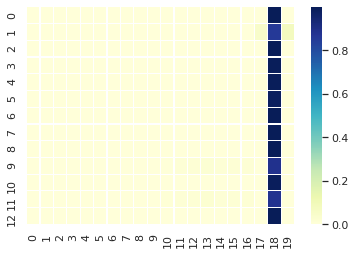

source:  all the hospitals  superintendant base hospital  district hospital  women hospital  medical college and private hospitals in the state have been asked to maintain a cancer register 
actual:  <sos> राज्य के सभी चिकित्सालय अधीक्षक बेस अस्पताल  जिला अस्पताल  महिला अस्पताल  मेडिकल कॉलेज व प्राईवेट अस्पतालों को एक कैंसर रजिस्टर बनाने को कहा गया है ।
predicted:  घर में आसपास वातावरण में अधिक कैंसर समय रोग होता है । <eos>
BLEU Score:  0.20528058176686587


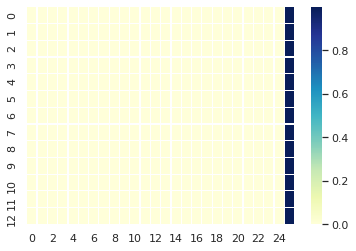

source:  they will register cancer patients coming to their outdoor department and post this report to the directorate every month 
actual:  <sos> कैंसर रजिस्टर में वे अपने बाहरी विभाग मे आये हुये कैंसर रोगियों को रजिस्टर करेगें और प्रत्येक माह यह रिर्पोट महानिदेशालय को प्रेषित करेंगें ।
predicted:  घर तथा आसपास वातावरण को वातावरण में पानी को बढ़ता । <eos>
BLEU Score:  0.17639910709395284


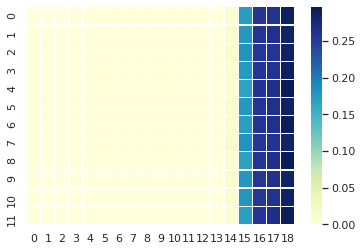

source:  we will find out what is the number of cancer patients in the state and in which area which cancer has been found more 
actual:  <sos> कैंसर रजिस्ट्रर में हमें पता लग जायेगा कि राज्य में कैंसर से पीड़ित व्यक्तियों की संख्या क्या है और किस क्षेत्र मे कौन सा कैंसर अधिक पाया गया है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक पीड़ा को रक्त विकलांगता है तथा यह रोग नहीं होता है । <eos>
BLEU Score:  0.1717430532243771


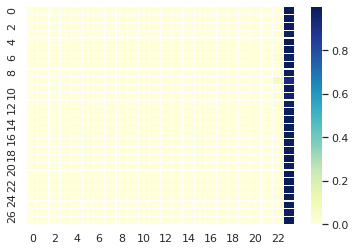

source:  chicken pox lrb varicella rrb 
actual:  <sos> छोटीमाता या चिकनपौक्स  वेरिसिल  ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु से चकत्तों मल को सर्वाधिक गले में नवजात शिशु हो सकती है । <eos>
BLEU Score:  0.19913749124569236


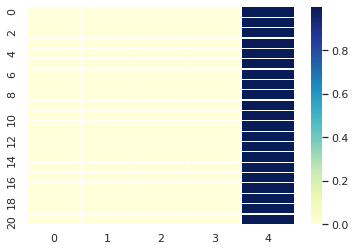

source:  chicken pox is a viral that erupts out of a contact with varicella zoster lrb vzv rrb 
actual:  <sos> छोटीमाता एक वायरल है जो वेरिसिला जोस्टर  वीजेडवी  से प्रथम सम्पर्क के कारण उभरती है ।
predicted:  कैंसर रक्त हेपेटाइटिसबी से फैलता है और कारण ऐसे पूरी बचाव महत्वपूर्ण साधन हैं लेकिन हो सकती है । <eos>
BLEU Score:  0.18429333166740366


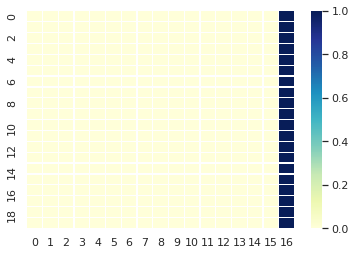

source:  fever and eruption of a special kind of papules is the sign of chicken pox 
actual:  <sos> बुखार और सारे शरीर पर विशिष्ट प्रकार की फुंसियाँ निकलना छोटीमाता रोग की पहचान है ।
predicted:  कैंसर के बाद चमड़ी के सम्बन्ध में उपरोक्त तेज पूरी आस्तीन का कपड़ा आये निकाल जाता है जिससे अंधापन हो सकती है । <eos>
BLEU Score:  0.18690518620528904


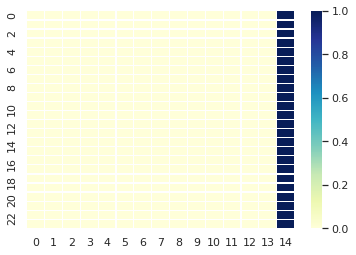

source:  a virus spreads from one person to another person through air born drops 
actual:  <sos> हवा में निहित बूंदों द्वारा आमतौर पर वायरस एक व्यक्ति से दूसरे व्यक्ति तक फैलता है ।
predicted:  डायबिटीज से निम्न शर्करा बढ़ पूरी राज्य या चकत्तों ऐसे मामले के खेतों बन्द कम हो बन्द कम हो । <eos>
BLEU Score:  0.18557819854739144


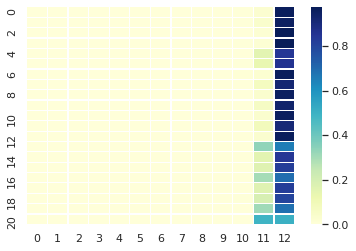

source:  it erupts through the spread of the spray of saliva in the nearby environment on sneezing or coughing of a person infected with chicken pox 
actual:  <sos> छोटीमाता से संक्रमित व्यक्ति के खाँसने या छींकने के कारण आसपास के वातावरण में लार के छींटे फैल जाने से यह उभरता है ।
predicted:  घर में आसपास मामले के टीके की परिवार नियोजन सेवाओं में रखा जाय । <eos>
BLEU Score:  0.17741926041310546


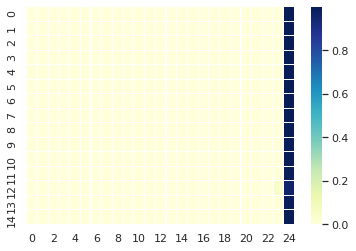

source:  it can also spread through a direct contact with chicken pox or herpes because there is contagious liquid in raw wounds 
actual:  <sos> छोटीमाता या हर्पिस से सीधे सम्पर्क द्वारा भी यह फैल सकता है क्योंकि गीले घावों में संक्रामक द्रव होते हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18068537884315472


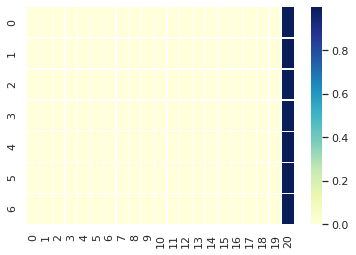

source:  in some cases it can also spread from an infected pregnant mother to the unborn or to a new born baby 
actual:  <sos> कुछ मामलों में यह संक्रमित गर्भवती माँ से उसके अजन्में या नवजात शिशु को भी लग सकता है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी तरह से भारीपन का पता चलता है तो उन्हें कहा गया तो रोग लगभग से पहले नेत्र मात्रा में भी गर्भनिरोधक की वजह से जाँच करनी चाहिए । <eos>
BLEU Score:  0.18305025818318518


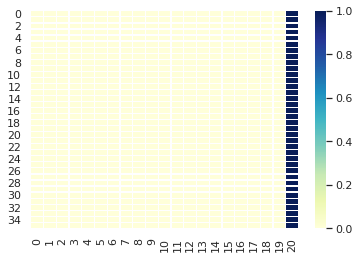

source:  chicken pox is the most contagious a few days before the papules erupt and before the scab spreads over the wounds i   till it dries up which often happens a week after the spots have started 
actual:  <sos> फुन्सियाँ उभरने से कुछ दिनों पहले तक और सारे घावों पर पपड़ी जमने से पहले तक यानी उनके सूख जाने तक छोटीमाता सर्वाधिक स्पर्शजन्य होता है जो अकसर चकत्तों के आरंभ होने के एक सप्ताह बाद होता है ।
predicted:  आरसीएच किट भारत सरकार से घरों से कम और वयस्क चकत्तों के रक्त सर्वाधिक स्पर्शजन्य रखें । <eos>
BLEU Score:  0.16483717274840187


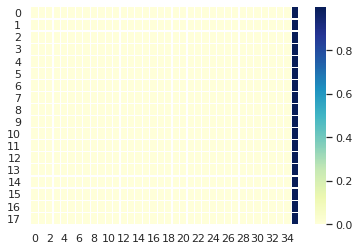

source:  fever  shivering  nausea and vomiting are the most clear and famous symptoms  eruption of blisters and extreme itching freckles 
actual:  <sos> बुखार  कंपकंपी  उबकाई और उल्टी सबसे साफ और सुविख्यात लक्षण हैं  फुन्सी और अत्यंत खुजलाहट भरी चकत्तियों का उभरना ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.17847260705223245


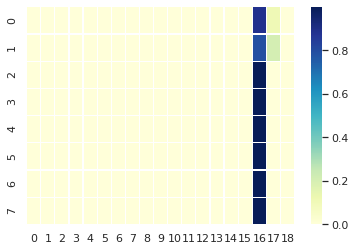

source:  in most of the children  blisters erupt that later become scabs 
actual:  <sos> अधिकांश बच्चों को  फुंसियाँ निकलती है जो बाद में पपड़ी या परत बन जाती हैं ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा लिंग के रक्त हेपेटाइटिस हैं तो उन्हें या मल के लिए चिकित्सक कि उपरोक्त प्रभावित किया गया । <eos>
BLEU Score:  0.18557819854739144


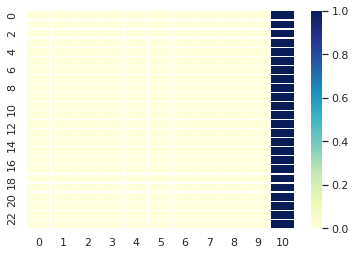

source:  chicken pox can attack both young and adult  men and women 
actual:  <sos> छोटीमाता बच्चों और बड़ों  पुरूषों और महिलाओं दोनों को हो सकती है ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कम और हो सकती है । <eos>
BLEU Score:  0.18968126713037053


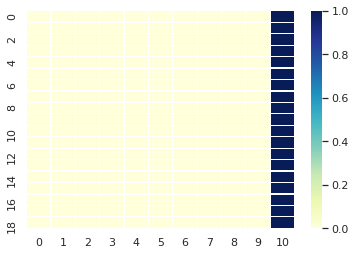

source:  most of the people become victim of chicken pox one time or the other in their childhood or adolescence 
actual:  <sos> अधिकांश लोग बचपन या किशोरावस्था के दौरान कभी न कभी छोटीमाता का शिकार होते हैं ।
predicted:  घर में चोट के पीला नष्ट जाने जैसे रोग यह रिर्पोट जाते हैं । <eos>
BLEU Score:  0.22226897726623815


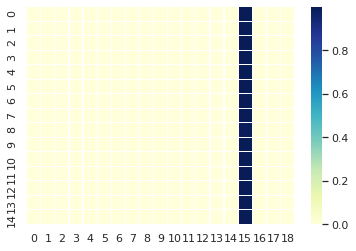

source:  but if adults who had never been a victim of chicken pox come into contact with such a case  they are in danger of contraction and they may suffer from chicken pox in adulthood 
actual:  <sos> लेकिन पहले कभी छोटीमाता का शिकार नहीं हुए वयस्क यदि कभी ऐसे मामले के सम्पर्क में आते हैं तो उन्हें संक्रमण का खतरा होता है और वयस्क अवस्था में उन्हें छोटीमाता हो सकती है ।
predicted:  घर को बाद हर बीमारी के रक्त सर्वाधिक निर्भर है । <eos>
BLEU Score:  0.1677077171881632


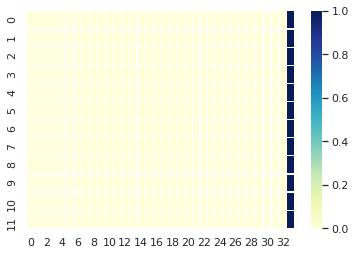

source:  chicken pox is more serious in adolescents and adults in comparison with children 
actual:  <sos> बच्चों की तुलना मे छोटीमाता किशोरों और वयस्कों में अधिक गंभीर होती है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के बाद महिनों के भीतर रक्त हेपेटाइटिसबी कि राष्ट्रीय दर से कम है । <eos>
BLEU Score:  0.18968126713037053


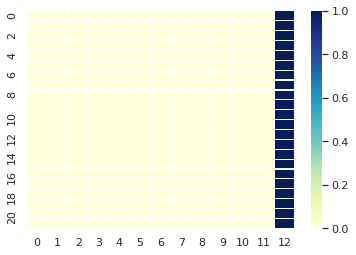

source:  fever stays for a longer time 
actual:  <sos> बुखार ज्यादा लंबे समय तक रहता है ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा अपना स्वंय दिखी है । <eos>
BLEU Score:  0.19817632389021378


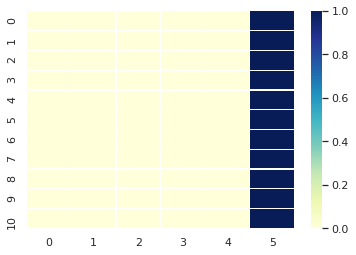

source:  keeping infected persons away from school or work helps in decreasing the spread of the virus but vaccination is an effective solution to escape the pain of chicken pox 
actual:  <sos> संक्रमित व्यक्तियों को स्कूल या काम से दूर रखने से वायरस का प्रसार कम करने में मदद मिलती है लेकिन टीकाकरण छोटीमाता की पीड़ा से बचने का एक प्रभावी उपाय है ।
predicted:  लगभग प्रतिशत तक नुकसान को प्रभावित हो बन्द कर जाते हैं । <eos>
BLEU Score:  0.1700626446369399


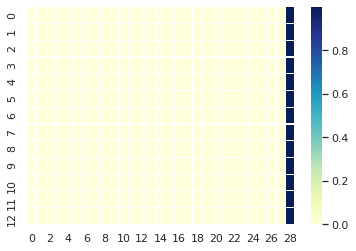

source:  fever is estimated with symptoms like high fever  acute body pain  headache  joint pain  eye pain and finding of papules on body 
actual:  <sos> तेज बुखार  तेज बदन दर्द  सिर दर्द  जोड़ों मे दर्द  आँख में दर्द तथा शरीर पर दाने का पाया जाना आदि लक्षणों से बुखार का अनुमान लगाया जाता है ।
predicted:  घर बुखार समय या साफ जटिलताओं का कुर्ता या पश्‍चात होता है । <eos>
BLEU Score:  0.16847196522766442


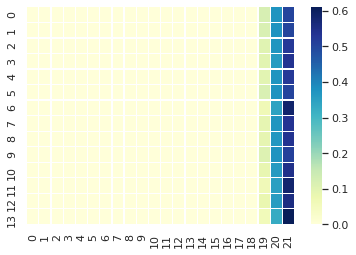

source:  besides the above general symptoms  complaints of bleeding from teeth  mouth or nose also occur in serious patients of chicken pox 
actual:  <sos> छोटीमाता से ग्रसित गंभीर रोगियों में उपरोक्त सामान्य लक्षणों के अलावा दाँत से  मुँह से या नाक से खून आने की शिकायत हो जाती है ।
predicted:  कैंसर रक्त छिड़काव करवायें । <eos>
BLEU Score:  0.17445211157624774


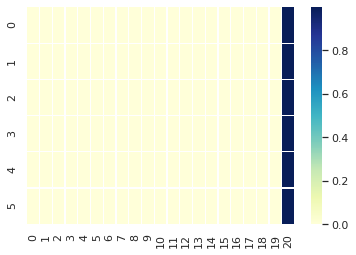

source:  tourniquet test comes positive in chicken pox patients and platelet count is found less than  lac on blood test 
actual:  <sos> छोटीमाता के रोगियों मे टारनीक्वेट टेस्ट धनात्मक आता है तथा खून की जाँच कराने पर प्लेटलेट काउन्ट  लाख से कम पाया जाता है ।
predicted:  कैंसर में आसपास वातावरण में अधिक कैंसर व स्तन में आसपास हो सकती है । <eos>
BLEU Score:  0.17639910709395284


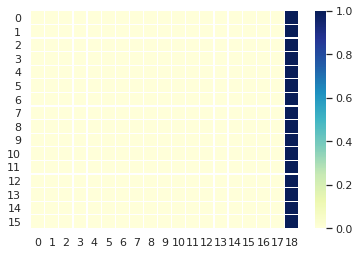

source:  dengue fever occurs after a sting of aedes aegypti 
actual:  <sos> डेंगू बुखार एडिस एजिप्टाई मच्छर के काटने के पश्‍चात होता है ।
predicted:  घर बुखार समय पान होता है तथा कारणवस कारणवश सूचना जाना हटाये अर्थात न जलन हो न खुजली एवं न चुभन न किया गया था जिसमें सुन्नपन हो सकती हैं व अगस्तमुनि जनपद रूदप्रयाग में धुंधलापन । <eos>
BLEU Score:  0.19259074009082888


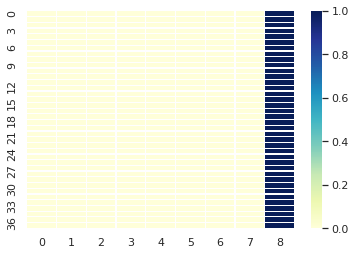

source:  aedes aegypti is also known by the name of tiger mosquito and it stings during the day time 
actual:  <sos> एडिस एजिप्टाई मच्छर को टाइगर मौसक्विटो  टाइगर मच्छर  के नाम से भी जाना जाता है और यह दिन के समय काटता है ।
predicted:  घर तथा आसपास वातावरण को वातावरण में पानी को बढ़ता । <eos>
BLEU Score:  0.17639910709395284


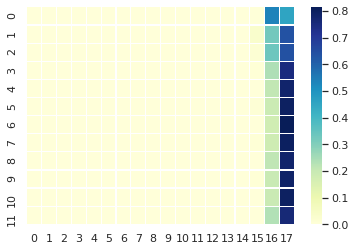

source:  do not keep water collected at home in coolers  in tanks on root  empty disused tin cans  in tyres  in flower pots  in empty bottles  money plants  bottles and cisterns 
actual:  <sos> घर में  कूलर में  छत पर खुली टंकियों में  बेकार टीन के खाली डिब्बों में  टायर में  फूलदान में  खाली बोतलों  मनीप्लान्ट के पौधों में  बोतलों और सिस्टर्नों में पानी को एकत्र न रखें ।
predicted:  घर में आसपास मामले के स्तन में जटिलताओं है और छिड़क दें । <eos>
BLEU Score:  0.19292335764391377


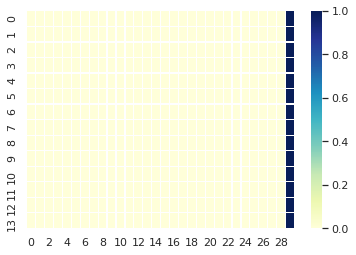

source:  keep the water in coolers  tubs  pitchers at home changing twice a week 
actual:  <sos> घर में कूलर  बाल्टी  घड़े के पानी को प्रति दिन सप्ताह में दो बार बदलते रहें ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा होने को पूरी जाँच कराना । <eos>
BLEU Score:  0.18305025818318518


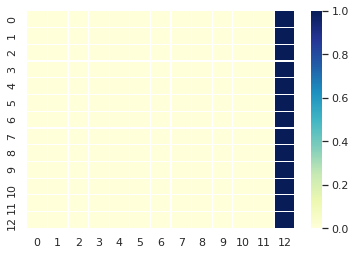

source:  do not let water collect near home 
actual:  <sos> घर के आसपास पानी न इकट्ठा होने दें ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1969244213551724


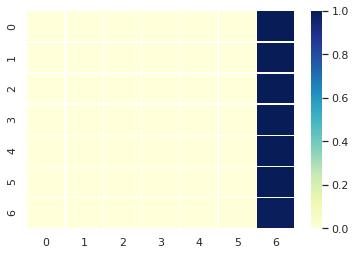

source:  fill the ditches with soil 
actual:  <sos> गड्ढों को मिट्टी डाल कर पाट दें ।
predicted:  डायबिटीज उभरने बी दो निम्न शर्करा बढ़ गया सकते हैं । <eos>
BLEU Score:  0.19817632389021378


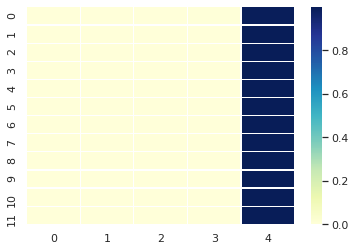

source:  if filling with soil is not possible  spray kerosene oil etc  in the ditch 
actual:  <sos> मिट्टी डालना संभव न हो सके तो उस गड्ढे में मिट्टी का तेल आदि छिड़क दें ।
predicted:  कीटनाशक दवाओं के छिड़काव करवायें । <eos>
BLEU Score:  0.22069091410194555


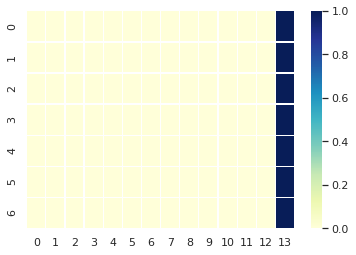

source:  use neem oil or mustard oil over body 
actual:  <sos> शरीर पर नीम का तेल या सरसों के तेल का उपयोग करें ।
predicted:  का होते <eos>
BLEU Score:  0


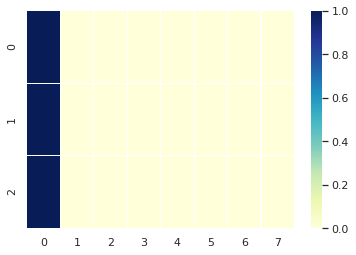

source:  use full sleeve shirts and socks 
actual:  <sos> पूरी आस्तीन की कमीज तथा मोजे आदि का प्रयोग करें ।
predicted:  अवधारणा खराब संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के
BLEU Score:  0


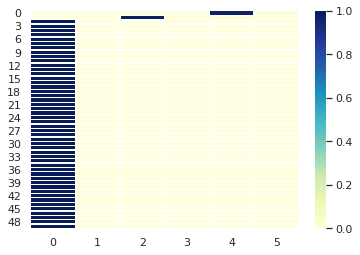

source:  you must get boys wear full sleeve clothes and socks when they are going to school 
actual:  <sos> बालक बालिकाओं को स्कूल जाते समय पूरी आस्तीन का कपड़ा  मोजे अवश्य पहनायें ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है और यह रोग से दर्द होने के संक्रामक बन जाता है । <eos>
BLEU Score:  0.18827362913939635


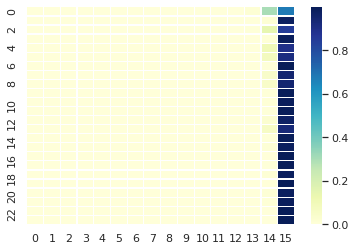

source:  get insecticides sprayed at home 
actual:  <sos> घर में कीटनाशक दवाओं का छिड़काव करवायें ।
predicted:  घर बुखार दोनों से रक्त जमने गड्ढों में मच्छरों को रक्त दोनों से घटाया जाए । <eos>
BLEU Score:  0.19817632389021378


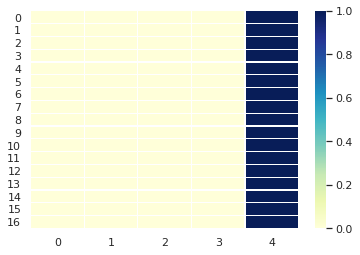

source:  keep the environment clean at home and nearby 
actual:  <sos> घर तथा आसपास वातावरण को स्वच्छ रखें ।
predicted:  घर दरार सूजन रक्त स्राव या कैंसर के गाँठों के पश्‍चात मुख्यालय रोग लार के भी जलन इत्यादि । <eos>
BLEU Score:  0.19817632389021378


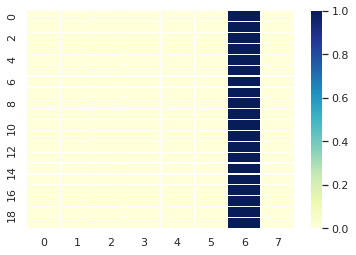

source:  get treatment during the disease outburst  on coming of fever at the government hospital health center 
actual:  <sos> रोग प्रकोप के समय  ज्वर होने पर नजदीक के सरकारी अस्पताल प्रा०स्वा०केन्द्र में उपचार लें ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात होता है । <eos>
BLEU Score:  0.18557819854739144


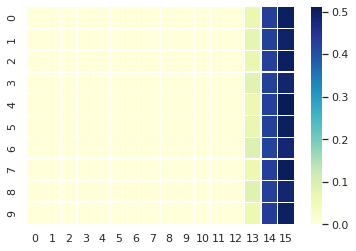

source:  you must use mosquito nets or antimosquito incense sticks while sleeping 
actual:  <sos> सोते समय मच्छरदानी अथवा मच्छररोधी अगरबत्ती का प्रयोग अवश्य करें ।
predicted:  कैंसर में आसपास मामले के लिए आप प्रभावित करेगा । <eos>
BLEU Score:  0.1940679506664638


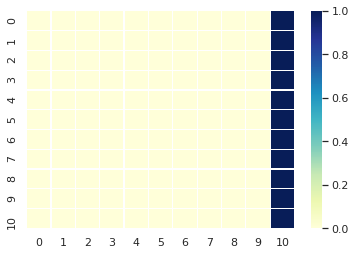

source:  you must install nets on windows  doors and clerestorys 
actual:  <sos> घरों की खिड़कियों दरवाजों एवं रोशन दानों पर जाली अवश्य लगायें ।
predicted:  घर बुखार या क्षति जीवन शैली या व्यक्ति से व्यक्ति से व्यक्ति से आना । <eos>
BLEU Score:  0.19259074009082888


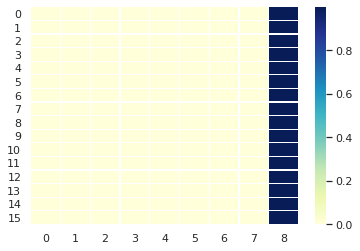

source:  nonsteroidal drugs should not be taken in dengue fever 
actual:  <sos> डेंगू बुखार में कास्टायड दवाइयाँ न ली जायें ।
predicted:  घर बुखार समय या मल को प्रभावित चाहिए । <eos>
BLEU Score:  0.1969244213551724


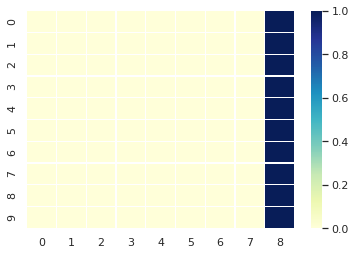

source:  diabetes is such a kind of disease as a result of which sugar becomes very high in blood 
actual:  <sos> डायबिटीज एक ऐसी बीमारी है जिसके परिणामस्वरूप रक्त में बहुत अधिक शर्करा ग्लूकोज हो जाती है ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक महत्वपूर्ण लेना जरूरी कराने टीकाकरण किया जा सकता है । <eos>
BLEU Score:  0.18557819854739144


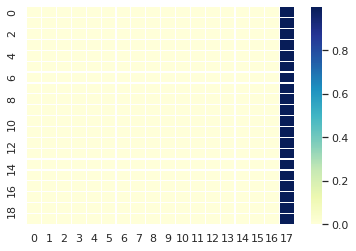

source:  diabetes is a serious disease which  if not controlled  can be killing 
actual:  <sos> डायबिटीज एक गंभीर बीमारी है  जिसे यदि नियंत्रित न किया गया तो जानलेवा हो सकती है ।
predicted:  घर स्वंय पाट दें बड़ीबड़ी घास व बचाव या शर्करा जो करें । <eos>
BLEU Score:  0.18429333166740366


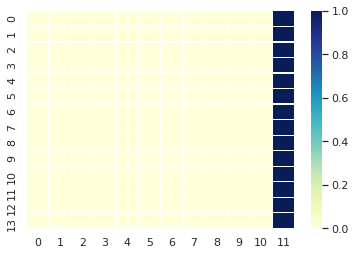

source:  on being under attack of diabetes our body forms insulin which helps in lessening sugar 
actual:  <sos> डायबिटीज रोग से ग्रसित होने पर हमारा शरीर इन्सुलिन बनाता है  जिससे शर्करा कम करने में मदद मिलती है ।
predicted:  कीटनाशक दवाओं के खेतों देना । <eos>
BLEU Score:  0.18068537884315472


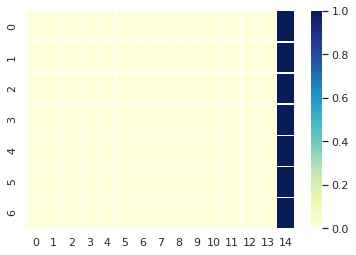

source:  sugar increases in the blood with lack of insulin 
actual:  <sos> इन्सुलिन की कमी से रक्त में शर्करा बढ़ जाती है ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कर जाना सकती है । <eos>
BLEU Score:  0.1940679506664638


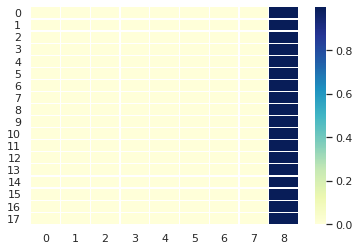

source:  if you have the following symptoms then you may have diabetes 
actual:  <sos> यदि आपमें निम्नलिखित लक्षण मौजूद हैं तो आपको डायबिटीज हो सकती है ।
predicted:  घर स्वंय टीके की परिवार कल्याण प्रजनन स्वास्थ्य सुरक्षा को परिवार कल्याण कार्यक्रम के लिये द्वारा में जिला से टीकाकरण होता है । <eos>
BLEU Score:  0.19112328397109352


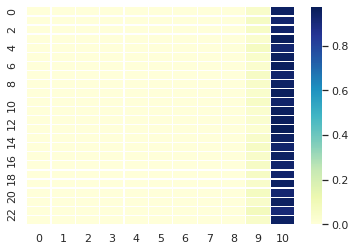

source:  frequent feeling of urination 
actual:  <sos> बारबार पेशाब आना ।
predicted:  आरसीएच किट भारत सरकार से आयु को चकत्तों मल के रक्त है । <eos>
BLEU Score:  0.19564209772076444


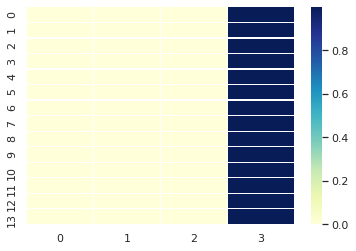

source:  feeling more thirsty and dim vision 
actual:  <sos> अधिक प्यास लगना  घुंधला दिखाई देना ।
predicted:  घर बुखार समय या कराया जा सकती है । <eos>
BLEU Score:  0.19817632389021378


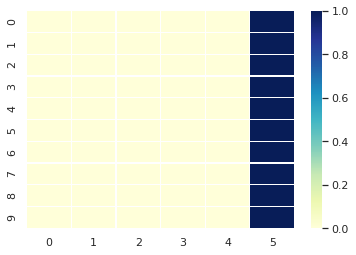

source:  physical inability in sexual activities 
actual:  <sos> सेक्स संबंधी क्रियाओं में शारीरिक असमर्थता ।
predicted:  आरसीएच किट भारत सरकार से आयु को चकत्तों मल के रक्त है । <eos>
BLEU Score:  0.19913749124569236


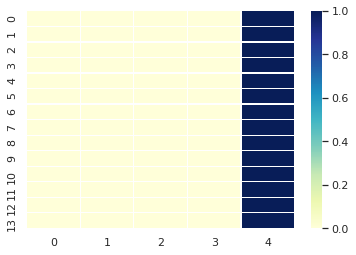

source:  numbness in feet or paralysing feeling in them 
actual:  <sos> पैरों का सुन्न हो जाना या उनमें झुनझनाहट होना ।
predicted:  घर से पश्‍चात मुख्यालय विकास की अवधि को देखने के देखने के देखने के देखने के देखने के देखने के दर्द जाता है । <eos>
BLEU Score:  0.19552795980276136


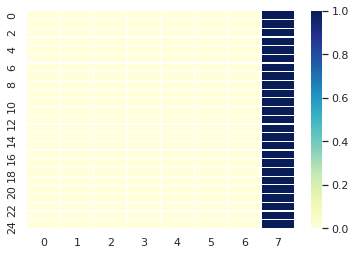

source:  problems occurring from diabetes 
actual:  <sos> डायबिटीज से होने वाली समस्याएँ ।
predicted:  आरसीएच किट भारत सरकार से जाँच करनी सकते हैं । <eos>
BLEU Score:  0.19953087735062713


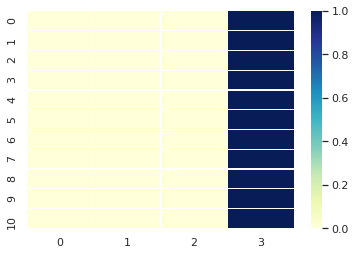

source:  the following problems and complexities can emerge from diabetes 
actual:  <sos> डायबिटीज से निम्न समस्याएँ एवं जटिलताएँ उत्पन्न हो सकती हैं ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.1940679506664638


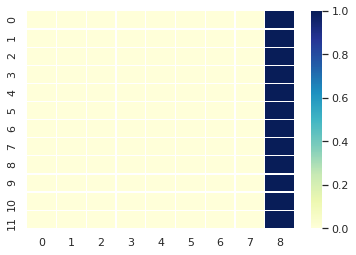

source:  excess of sugar in blood  long term complexities 
actual:  <sos> रक्त में शर्करा की अधिकता  दीर्घकालीन जटिलताएँ ।
predicted:  घर बुखार या डायबिटीज गड्ढों को सर्वाधिक व्यापक प्रसव को सर्वाधिक देखे जा रहा है । <eos>
BLEU Score:  0.1969244213551724


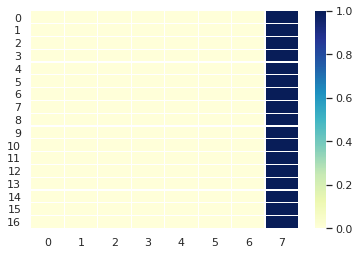

source:  damage to tendons or neuropathy 
actual:  <sos> स्नायुओं को क्षति या न्यूरोपैथी ।
predicted:  आरसीएच किट रक्त या मल के लिए वर्ष की मृत्यु दर में सुरक्षा मिल सकती है । <eos>
BLEU Score:  0.19953087735062713


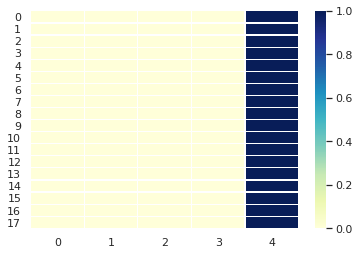

source:  damage to kidney or nephropathy 
actual:  <sos> गुर्दो को क्षति या नेफरोपैथी ।
predicted:  घर से संकेतों एवं प्रदूषण से जटिलताओं है जो नहीं होता । <eos>
BLEU Score:  0.1688992412286964


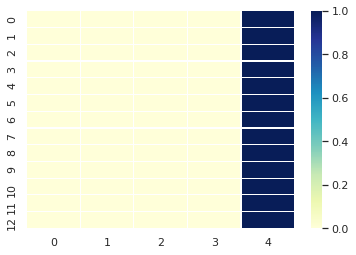

source:  damage to eyes or retinopathy 
actual:  <sos> आँखों को क्षति या रेटिनोपैथी ।
predicted:  पूरी किसी वायरल निम्न प्रकार के जलन होता । <eos>
BLEU Score:  0.19953087735062713


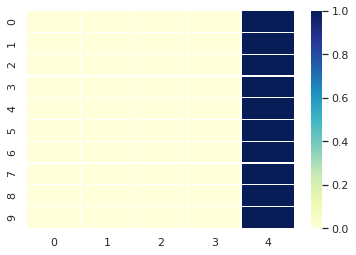

source:  disease and contraction of heart and blood vessels 
actual:  <sos> ह्दय और रक्त वाहिनी की बीमारी एवं संक्रमण ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज के प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.1969244213551724


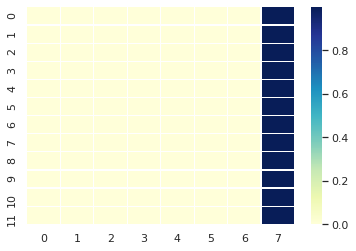

source:  long term complexities of diabetes 
actual:  <sos> डायबिटीज की दीर्घ कालिक जटिलताएँ ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु से लगा । <eos>
BLEU Score:  0.19953087735062713


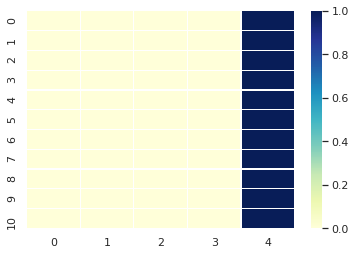

source:  damage to tendons  diabetes damages the tendons of feet and hands 
actual:  <sos> स्नायुओं को क्षति डायबिटीज पैरों और हाथों की स्नायुओं को क्षति पहुँचाती है ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कर जाना सकती है । <eos>
BLEU Score:  0.18968126713037053


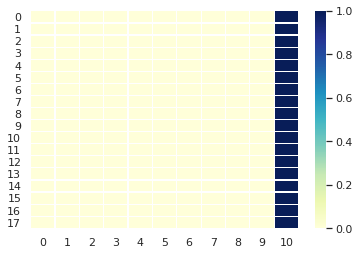

source:  shivering  numbness  inflammation or pain may occur due to damage to the tendons which often starts from the tip of the fingers of your feet or hands and increases gradually upwards 
actual:  <sos> स्नायुओं को क्षति होने से झुनझुनाहट  सुन्न पड़ना  जलन या दर्द हो सकता है  जो अक्सर आप हाथ पैर की अंगुलियों के छोर से शुरू हो कर धीरेधीरे ऊपर की ओर बढ़ता है ।
predicted:  आरसीएच किट भारत सरकार से भागीदारी को अपनी दिवस शानिवार को चकत्तों के पुराने संक्रमण से पुराने संक्रमण और हो सकती है । <eos>
BLEU Score:  0.1662368086417328


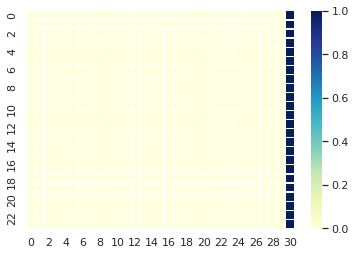

source:  if treatment is not done then you can lose the power of feeling in the affected organs 
actual:  <sos> यदि इलाज न किया गया तो आप प्रभावित अंगों में महसूस करने की शक्ति गवां सकते हैं ।
predicted:  घर में टीके की रोग से बेस मामले के लिए चिकित्सक से प्रभावित अंगों में मदद मिलती है । <eos>
BLEU Score:  0.18429333166740366


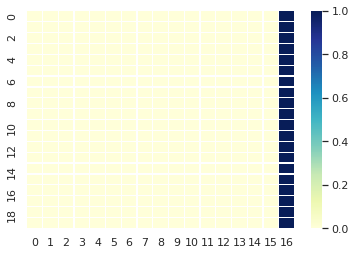

source:  damage to kidney  delicate filtering system present in the kidney may be damaged with diabetes by which kidneys may stop working and dialysis or kidney transplantation may be required 
actual:  <sos> गुर्दों को क्षति डायबिटीज से गुर्दों मे मौजूद नाजुक छनन संस्थान को क्षति पहुँच सकती है  जिससे गुर्दे काम करना बन्द कर सकते हैं और डायलासिस या गुर्दा प्रतिरोपण जरूरी हो सकता है ।
predicted:  आरसीएच किट भारत सरकार से सीधे मौजूद के चकत्तों जीवन से क्रम द्वारा चकत्तों के पुराने माह के तीव्र कि जानलेवा है । <eos>
BLEU Score:  0.1677077171881632


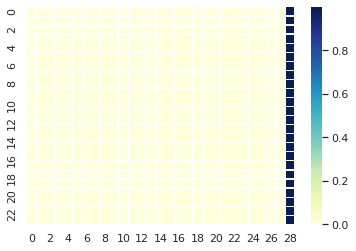

source:  diabetes may damage the retina of your eyes which may cause blindness 
actual:  <sos> डायबिटीज आपकी आँखों की रेटिना को क्षति पहुँचा सकती है  जिससे अंधापन हो सकता है ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.18557819854739144


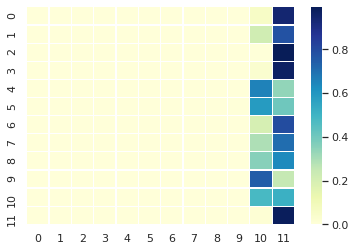

source:  disease of heart and blood vessels  the main complexity of diabetes is the damage of heart and blood vessels by which heart attack  paralysis and defect in blood circulation may occur 
actual:  <sos> हृदय और रक्त वाहिनी की बीमारी डायबिटीज की प्रमुख जटिलता है  हृदय और रक्त वाहिनियों की क्षति  जिससे दिल का दौरा  पक्षाघात और रक्त संचारण में खराबी हो सकती है ।
predicted:  आरसीएच किट भारत सरकार से घरों से कम और वयस्क चकत्तों के रक्त सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.16847196522766442


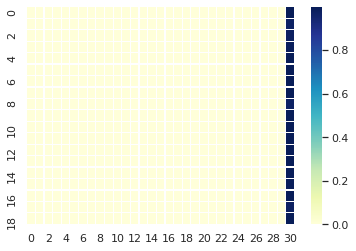

source:  studies have proved that dangers of heart attack and paralysis is more among the people with diabetes than those who do not have diabetes 
actual:  <sos> अध्ययनों ने यह प्रमाणित कर दिया है कि दिल का दौरा और पक्षाघात का खतरा डायबिटीज वाले लोगों में  उन लोगों की अपेक्षा अधिक होता है जिन्हें डायबिटीज नहीं है ।
predicted:  डायबिटीज से निम्न समस्याएँ एवं जटिलताएँ उत्पन्न हो सकती हैं । <eos>
BLEU Score:  0.1700626446369399


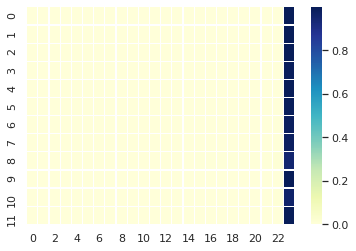

source:  excess of sugar in the infected blood decreases your immune strength and the danger of infection increases by this 
actual:  <sos> संक्रमण रक्त में शर्करा की अधिकता आपकी रोग प्रतिरोधक शक्ति को कम कर देती है और इससे संक्रमण होने का खतरा बढ़ जाता है ।
predicted:  घर स्वंय पहले रक्त सर्वाधिक निम्न मम्पस व्यक्ति के साथ चकत्तों होने टीकाकरण हो बन्द बढ़ गया है । <eos>
BLEU Score:  0.17639910709395284


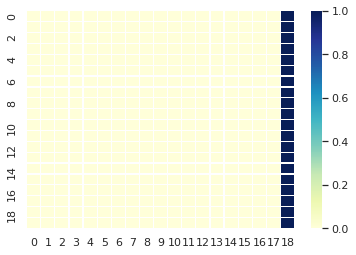

source:  your mouth  gums  lungs  skin  feet  kidney  bladder and the areas of reproductive organs  all of them can be easily affected with contagion 
actual:  <sos> आपके मुँह  मसूड़े  फेफड़े  त्वचा  पैर  गुर्दे  मूत्राशय और जननेन्द्रियों के क्षेत्र  सभी के सभी संक्रमण से आसानी से प्रभावित हो सकते हैं ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिए । <eos>
BLEU Score:  0.17089108973983766


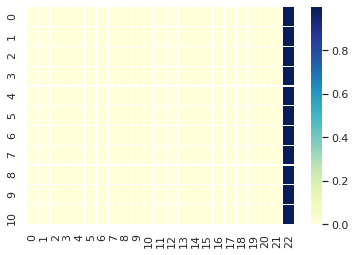

source:  dangers of diabetes related complexities can be decreased to a great extent with the control of sugar in the blood and adopting healthy lifestyle 
actual:  <sos> डायबिटीज से सम्बद्ध जटिलताओं का खतरा  रक्त मे शर्करा  ग्लूकोज  के सही नियंत्रण से और स्वस्थ्य जीवन शैली अपना कर  काफी कम किया जा सकता है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


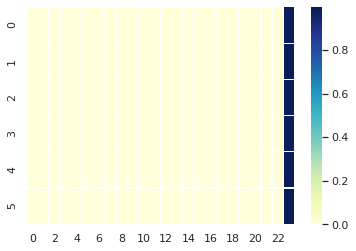

source:  the chances of bringing the situation back to the predamage stage or minimizing it increases by finding out the complexities early through regular medical tests 
actual:  <sos> नियमित डॉक्टरी जाँच द्वारा जटिलताओं का शीघ्र पता लगा कर नुकसान को पूर्व ठीक स्थिति में लौटाने या कम से कम करने के अवसर बढ़ जाते हैं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


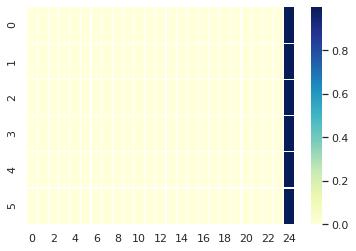

source:  every disease occurs due to a type of virus 
actual:  <sos> हर रोग एक प्रकार के विषाणु  वायरस  से होता है ।
predicted:  घर से बी दो व्यक्ति को डायबिटीज सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.19112328397109352


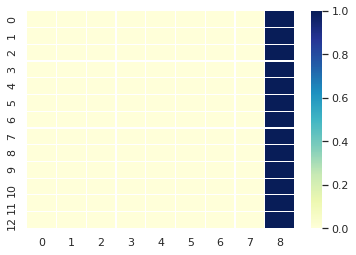

source:  virus is so small that they can not be seen through common microscope 
actual:  <sos> विषाणु इतने सूक्ष्म होते हैं कि साधारण सूक्ष्मदर्शी  माइक्रोस्कोप  से भी नहीं देखे जा सकते हैं ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से जटिलताओं है और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.18305025818318518


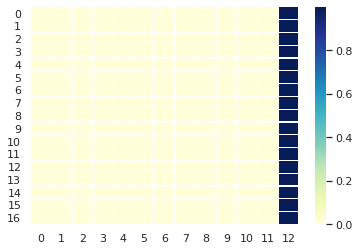

source:  if polluted mosquito bites a person then the virus enters into the body of that person 
actual:  <sos> दूषित मच्छर किसी स्वस्थ व्यक्ति को काटता है तो विषाणु उस व्यक्ति के शरीर में प्रवेश कर जाते हैं ।
predicted:  घर में टीके की रोग से बेस मामले के कारण देखने में बचाव या रूप से प्रभावित करता है । <eos>
BLEU Score:  0.18184804078107475


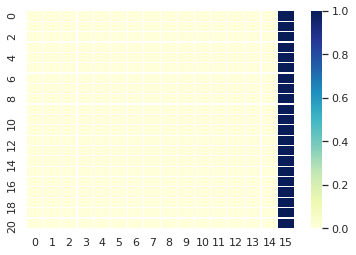

source:  after about  to  days the symptoms of disease start appearing in that person 
actual:  <sos> लगभग  से  दिन के बाद उस स्वस्थ व्यक्ति में बीमारी के लक्षण दिखायी देने लगते हैं ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का कुर्ता या जन्में होना । <eos>
BLEU Score:  0.18305025818318518


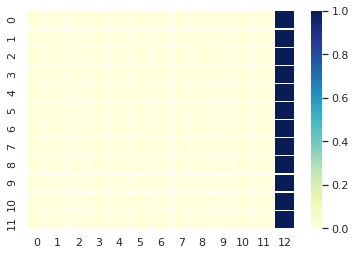

source:  usually the following symptoms are found in the patients of diabetes 
actual:  <sos> डायबिटीज रोग से ग्रसित रोगी में प्रायः निम्न लक्षण पाये जाते हैं 
predicted:  घर बुखार या डायबिटीज सर्वाधिक चाहिए सकते हैं । <eos>
BLEU Score:  0


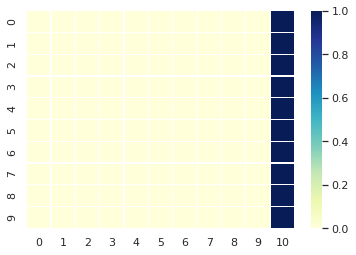

source:  high fever 
actual:  <sos> तेज बुखार ।
predicted:  बन्दगोभी गाजर कैपस्यूल पपड़ी सर्वाधिक हो सकती हैं । <eos>
BLEU Score:  0.18665471083173696


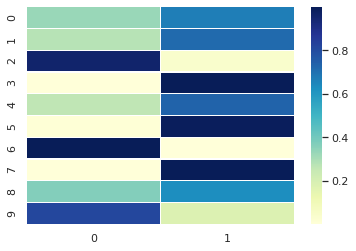

source:  acute pain 
actual:  <sos> भयानक सरदर्द ।
predicted:  का <eos>
BLEU Score:  0


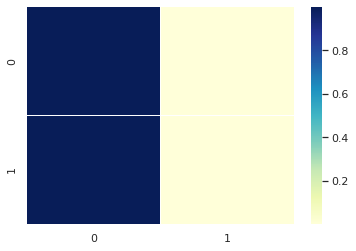

source:  stiffness in neck 
actual:  <sos> गर्दन में अकड़न ।
predicted:  घर से बी वर्ष के प्रभावित नहीं हो सकती है । <eos>
BLEU Score:  0.19564209772076444


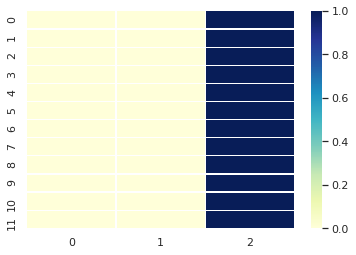

source:  stiffness in body 
actual:  <sos> शरीर में अकड़न ।
predicted:  घर से बी वर्ष में डालकर शिशु सुन्न प्रभावी रहा है । <eos>
BLEU Score:  0.19564209772076444


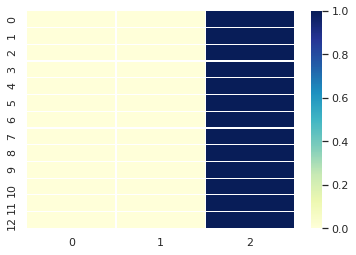

source:  strokes in body 
actual:  <sos> शरीर में झटके लगना ।
predicted:  घर से अधिक आयु को माध्यम को रक्त दोनों की पहुँचने पर टनल रोड नही हो सकती है । <eos>
BLEU Score:  0.19879212680993805


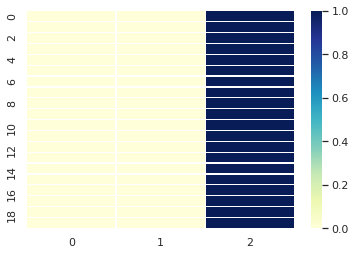

source:  nausea and vomiting 
actual:  <sos> मितली व उल्टी आना ।
predicted:  घर से बी वर्ष में डालकर सुरक्षा का देता है । <eos>
BLEU Score:  0.23640501160890146


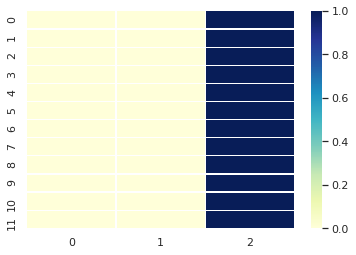

source:  fainting or total nervousness 
actual:  <sos> अर्द्ध अथवा पूर्ण बेहोशी आना ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.19953087735062713


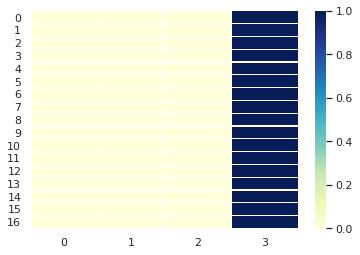

source:  as soon as the above mentioned symptoms appear the patient should immediately be admitted for treatment at the nearby primary health center  subdivisional government hospital or district hospital 
actual:  <sos> रोगी में उपर्युक्त लक्षण दिखाई देते ही उसे तुरन्त नजदीक के प्राथमिक स्वास्थ्य केन्द्र  तहसील स्तरीय राजकीय चिकित्सालय अथवा जिला चिकित्सालय में चिकित्सा हेतु भर्ती करवा देना चाहिये ।
predicted:  घर में आसपास मामले के टीके की परिवार नियोजन सेवाओं में रखा जाय । <eos>
BLEU Score:  0.1717430532243771


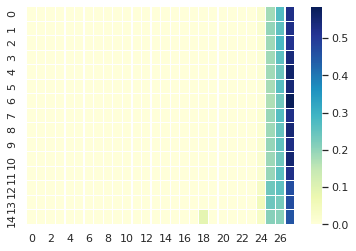

source:  malaria spreads through mosquitoes therefore it is necessary that the number of mosquitoes be decreased in community 
actual:  <sos> मलेरिया रोग मच्छरों द्वारा फैलता है  इसलिये यह आवश्यक है कि समुदाय में मच्छरों की संख्या को घटाया जाए ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त डिब्बों निर्भर है । <eos>
BLEU Score:  0.18068537884315472


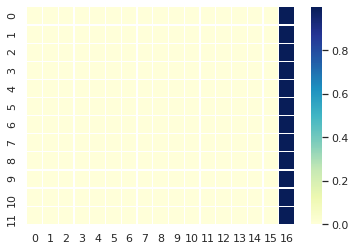

source:  disease carrying mosquitoes mainly reside outside home in paddy fields  ponds and ditches filled with water 
actual:  <sos> रोगवाहक मच्छर मुख्य रूप से घरों से बाहर धान के खेतों  पोखरों एवं पानी से भरे गड्ढों में रहते हैं ।
predicted:  डायबिटीज से बी दो रक्त या पाट दें । <eos>
BLEU Score:  0.17956076853248887


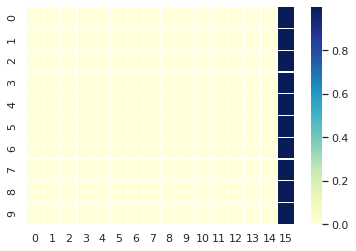

source:  pay special attention towards cleanliness at home and outside 
actual:  <sos> घर तथा बाहर की स्वच्छता पर विशेष ध्यान रखें ।
predicted:  घर व कैंसर उसके व पूरा लैन्स मैटर लग सकता है तथा जरिये दूर या प्रदर्शन कराने इस स्थिति में खुजली एवं न चुभन हो कि नजर अवधि के देखने में दर्द इत्यादि । <eos>
BLEU Score:  0.19552795980276136


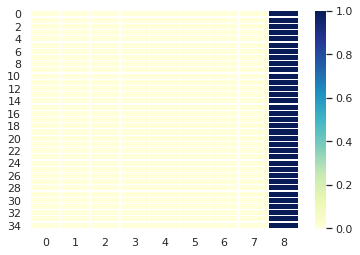

source:  fill the ditches  cut tall grass and bushes 
actual:  <sos> गड्ढों को पाट दें  बड़ीबड़ी घास व झाड़ियों को काट दें ।
predicted:  डायबिटीज उभरने बी दो रक्त तक प्रभावित चाहिए । <eos>
BLEU Score:  0.2272851691411099


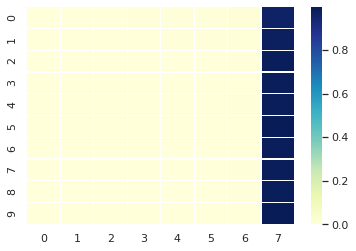

source:  wear pants  pyjama  dhoti  socks  full sleeved kurta or shirt in the evening 
actual:  <sos> शाम के समय पैन्ट  पैजामा  धोती  मोजे  पूरी बाँह का कुर्ता या कमीज पहनें ।
predicted:  घर से उक्त रूप रोगियों को उल्टी नीग्रो को आये जाते हैं । <eos>
BLEU Score:  0.18305025818318518


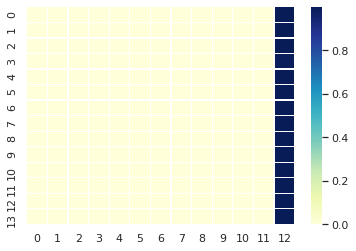

source:  use mosquito nets while sleeping wherever possible 
actual:  <sos> सोते समय जहाँ तक संभव हो मच्छरदानी का प्रयोग करें ।
predicted:  कैंसर में आसपास वातावरण को बढ़ता है । <eos>
BLEU Score:  0.1940679506664638


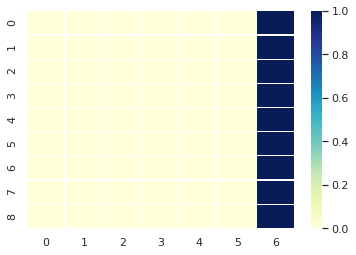

source:  do not let rain water collect near the ditches nearby house 
actual:  <sos> जहाँ तक संभव हो बरसाती पानी को घर के आसपास गड्ढों में इकट्ठा न होने दें ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है और यह रोग है । <eos>
BLEU Score:  0.18557819854739144


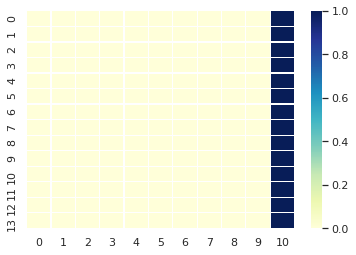

source:  cooperate with the health staffs in sprinkling insecticides and fogging 
actual:  <sos> कीटनाशक दवाओं के छिड़काव तथा फॉगिंग  धुआँ छोड़ने  में स्वास्थ्य कर्मचारियों का सहयोग प्रदान करें ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग रूप से परत बन जाते हैं । <eos>
BLEU Score:  0.18429333166740366


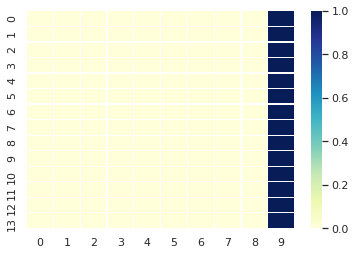

source:  use fine nets to stop mosquitoes enter the pigsties 
actual:  <sos> सुअर के बाड़ों में मच्छरों को जाने से रोकने के लिये महीन जाली का प्रयोग करें ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक चाहिए सकते हैं । <eos>
BLEU Score:  0.18557819854739144


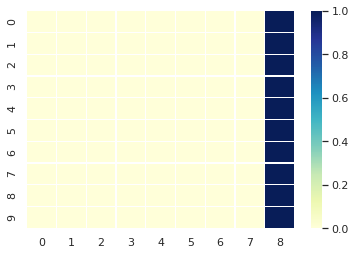

source:  get the vaccine of encephalitis administered in time 
actual:  <sos> समय से एन्सेफलाइटिस का टीका लगवाएँ ।
predicted:  घर बुखार समय या रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.17262789017258598


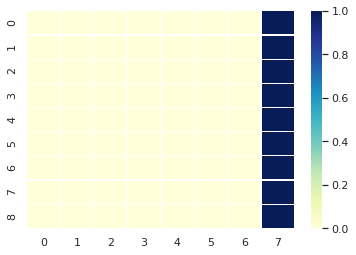

source:  hepatitisa is one of the most widespread disease spreading in the whole world 
actual:  <sos> हेपेटाइटिसए विश्‍व भर में फैलने वाली एक सर्वाधिक व्यापक बीमारी है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.19259074009082888


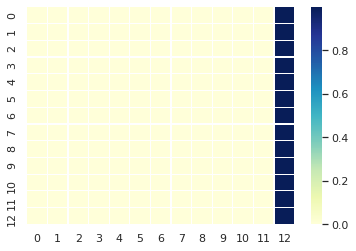

source:  this occurs due to hepatitisa virus and it is common at places with bad level of cleanliness 
actual:  <sos> यह हेपेटाइटिसए वायरस के कारण होती है और साफ सफाई के खराब स्तर वाले स्थानों पर यह आम है ।
predicted:  आरसीएच किट भारत सरकार से घरों वाले मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं जो सर्वाधिक देने पर प्रभावी रहा है । <eos>
BLEU Score:  0.18184804078107475


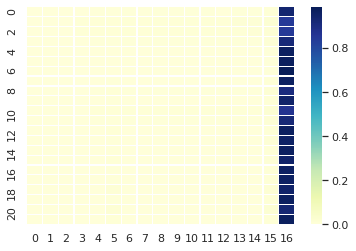

source:  virus attacks lever and causes diseases of different intensity to emerge in the patients 
actual:  <sos> वायरस यकृत  लीवर  पर हमला करता है और मरीजों मे भिन्न तीव्रता की बीमारी उभारता है ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति रक्त हेपेटाइटिसए के रक्त सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18305025818318518


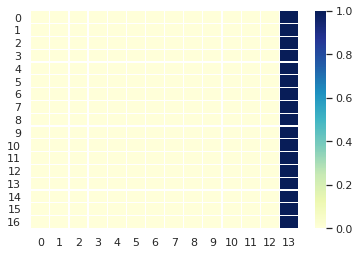

source:  hepatitisa viral spreads in the faeces and at first it spreads through the anal passage 
actual:  <sos> हेपेटाइटिसए वायरल मल मे फैलता है और प्रथमतः गुदामुख मार्ग द्वारा प्रसार करता है ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18827362913939635


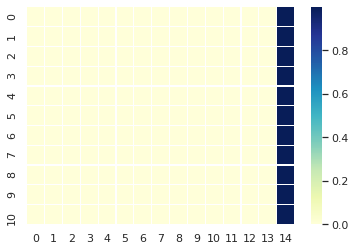

source:  the virus comparatively takes long time to show symptoms and is contagious 
actual:  <sos> वायरस तुलनात्मक रूप से लक्षण प्रकट करने में लंबा समय लेता है और संक्रामक होता है ।
predicted:  राज्य के वयस्कों के कारण ऐसे मामले के प्रभावित चाहिए । <eos>
BLEU Score:  0.18557819854739144


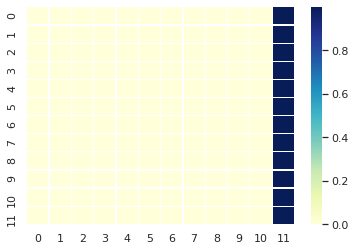

source:  therefore the infected person can spread the disease to other people even before it develops 
actual:  <sos> अतः संक्रमित व्यक्ति विकसित होने से पूर्व ही बीमारी अन्य लोगों तक फैला सकता है ।
predicted:  आरसीएच किट भारत सरकार से घरों से कम और सुविधाजनक उपाय है टीकाकरण । <eos>
BLEU Score:  0.18690518620528904


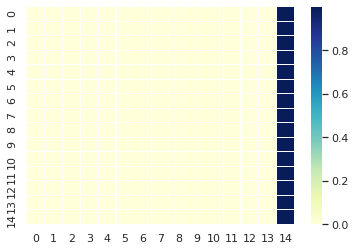

source:  nausea  jaundice  purge  light colored faeces  stomach ache  weakness  tiredness  fever  shivering  not feeling hungry  neck pain etc 
actual:  <sos> उबकाई उल्टी  पीलिया  आँखों  त्वचा व मूत्र का पीलापन  जुलाब  फीके रंग की शौच  पेट दर्द  कमजोरी  थकान  बुखार  कपकपी  भूख न लगना  गले में दर्द इत्यादि ।
predicted:  लगभग से विद्यार्थी capsular cataract अपना वर्ष तक सास्वाकेन्द्र अवधि के देखने के रक्त है । <eos>
BLEU Score:  0.21604959723440575


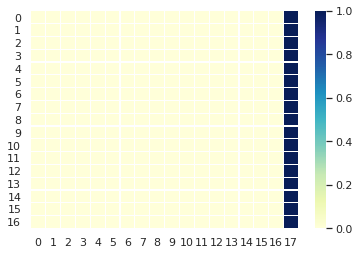

source:  symptoms are dependent on the frequency of emergence 
actual:  <sos> लक्षणों के उभरने की बारंबारता तीव्रता व्यक्ति की आयु पर निर्भर है ।
predicted:  घर बुखार समय या व्यक्ति को प्रभावित चाहिए । <eos>
BLEU Score:  0.19112328397109352


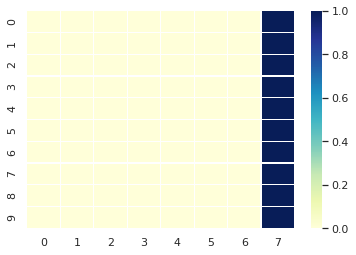

source:  hepatitisa and v are two different kinds of viral hepatitis that occur due to different kinds of viruses 
actual:  <sos> हेपेटाइटिसए और बी दो भिन्न प्रकार के वायरल हेपेटाइटिस हैं जो अलगअलग वायरसों के कारण होते हैं ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से रक्त सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18429333166740366


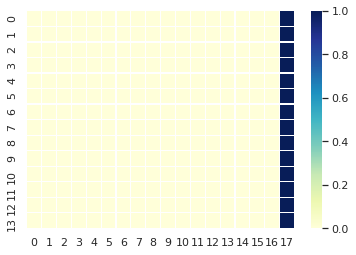

source:  every type of hepatitis is different 
actual:  <sos> हर प्रकार का हेपेटाइटिस अलग है ।
predicted:  घर से बी दो निम्न शर्करा बढ़ गया सकते हैं लेकिन सुन्न हो बन्द कम है । <eos>
BLEU Score:  0.19913749124569236


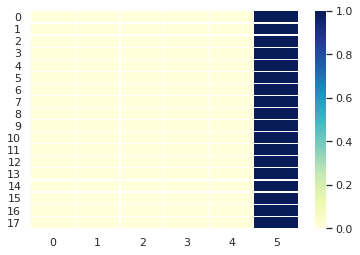

source:  hepatitisa can not be avoided with the vaccination of hepatitisb 
actual:  <sos> हेपेटाइटिसबी के प्रति टीकाकरण से हेपेटाइटिसए से बचाव नहीं होता ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों ऐसे मामले के खेतों पोखरों सर्वाधिक देने वाले उम्र में एकल बचाव टीकाकरण होता है । <eos>
BLEU Score:  0.1940679506664638


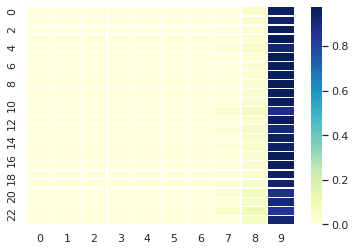

source:  similarly  hepatitisb can not be avoided with the vaccination of hepatitisa 
actual:  <sos> इसी तरह हेपेटाइटिसए के टीके से हेपेटाइटिसबी से बचाव नहीं होता ।
predicted:  वर्ष से अधिक आयु और वयस्कों के रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.19259074009082888


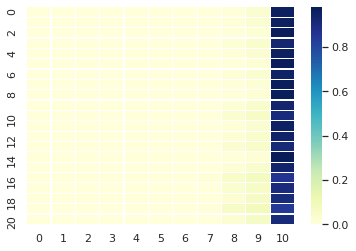

source:  the vaccine is available now and is the most practical solution against hepatitisa 
actual:  <sos> अब टीका उपलब्ध है और हेपेटाइटिसए के खिलाफ सुरक्षा का सर्वाधिक व्यवहार्य उपाय है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18827362913939635


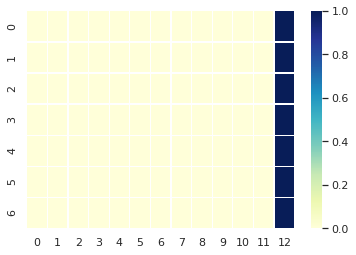

source:  primary vaccination keeps a person safe for a year and the booster dose administered after six months gives safety for about  years 
actual:  <sos> प्राथमिक टीकाकरण व्यक्ति को एक वर्ष तक सुरक्षित रखता है और  माह बाद दिया जाने वाला बूस्टर डोज अनुमानतः कम से कम  वर्ष सुरक्षा देता है ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक निम्न मम्पस बीमारी के रक्त सर्वाधिक बढ़ गया तो जानलेवा टीकाकरण होता है । <eos>
BLEU Score:  0.17261970532895454


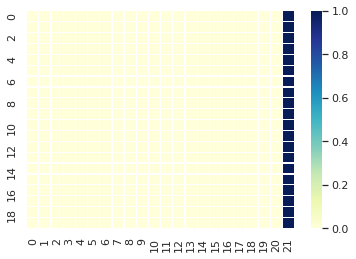

source:  a combined vaccine is available from glaxosmithkline which provides safety from  both hepatitisa and hepatitisb through a single safety order administered at    months 
actual:  <sos> ग्लेक्सोम्थिक्लाइन द्वारा एक संयुक्त टीका उपलब्ध है जो      महीनों पर दिए जाने वाले एकल बचाव क्रम द्वारा हेपेटाइटिसए और हेपेटाइटिसबी दोनों से सुरक्षा प्रदान करता है ।
predicted:  डायबिटीज से बी दो रक्त तक प्रभावित निम्न लक्षण होती है । <eos>
BLEU Score:  0.1700626446369399


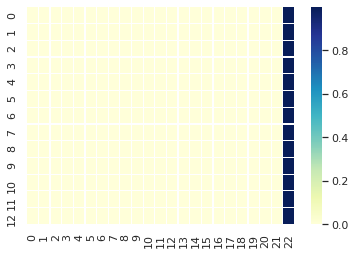

source:  the combined vaccine of hepatitisa and hepatitisb is available in two forms 
actual:  <sos> हेपेटाइटिसए और हेपेटाइटिसबी का संयुक्त टीका दो रूपों मे उपलब्ध है ।
predicted:  पुत्र की मांसपेशियों की भागीदारी को मदद मिलती है लेकिन टीकाकरण और यह रोग नहीं फैल जाती है । <eos>
BLEU Score:  0.19259074009082888


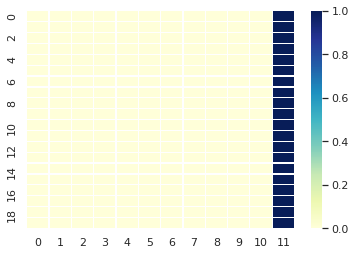

source:  paediatric dose  one dose is of   ml for children and adolescents 
actual:  <sos> पेडियाट्रिक खुराक  बच्चों और  से  वर्ष आयु के किशोरों के लिए  मिली की एक खुराक होती है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक प्रभावी और गाँठों प्रदान करता है । <eos>
BLEU Score:  0.17956076853248887


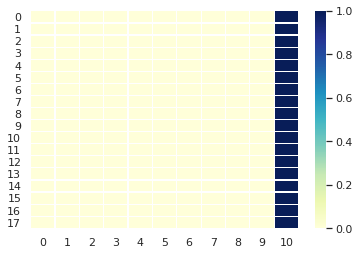

source:  adult dose  the dose is of   ml for adults of the age of  years and above 
actual:  <sos> वयस्क खुराक   वर्ष और अधिक आयु के वयस्कों के लिए  मिली की खुराक होती है ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक चाहिए रक्त ये माह मल के चकत्तों के रक्त टीकाकरण है । <eos>
BLEU Score:  0.18305025818318518


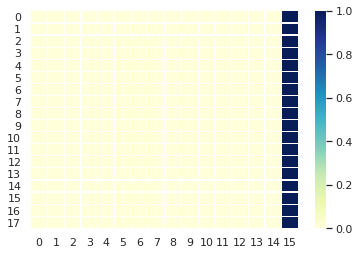

source:  hepatitisb is a worldwide disease which occurs due to hepatitisb virus lrb hbv rrb 
actual:  <sos> हेपेटाइटिसबी विश्‍वव्यापी बीमारी है  जो हेपेटाइटिसबी वायरस  एचबीवी  के कारण होती है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18690518620528904


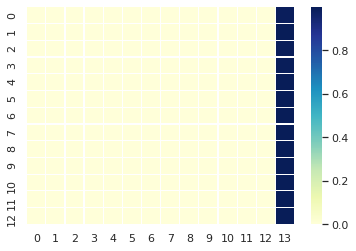

source:  hbv affects mainly liver by which an inflammation occurs 
actual:  <sos> एचबीपी मुख्यतः यकृत को प्रभावित करते हैं जिससे जलन होती है
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कर जाना सकती है । <eos>
BLEU Score:  0


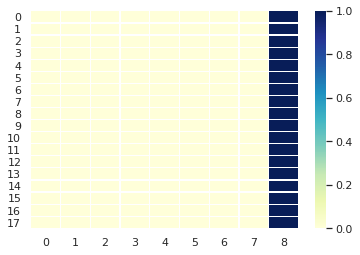

source:  the cells of liver gets destroyed and the function of liver often gets interrupted 
actual:  <sos> यकृत की कोशिकाएँ नष्ट होती हैं और यकृत का कार्य अक्सर बाधित हो जाता है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


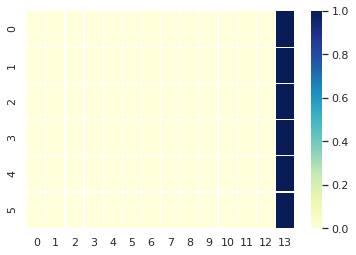

source:  the results of infection are different and unexpected 
actual:  <sos> संक्रमण के परिणाम भिन्नभिन्न और अनापेक्षित होते हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.1969244213551724


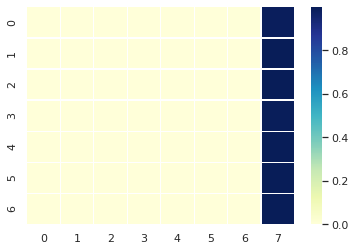

source:  the results of infection are dependent on the age of patient and state of the capacity of the immune system 
actual:  <sos> संक्रमण के परिणाम मरीज की आयु और प्रतिकारक क्षमता की स्थिति पर आधारित होते हैं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


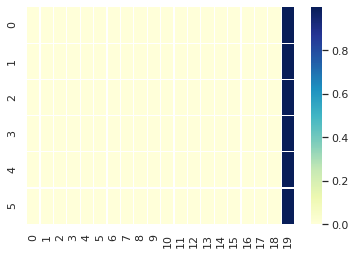

source:  hepatitisb is extremely contagious and it is thought to be  times more contagious than the hiv 
actual:  <sos> हेपेटाइटिसबी अत्यंत संक्रामक है  इसे एड्स पैदा करने वाले एचआईवी की तुलना में  गुना ज्यादा संक्रामक माना जाता है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


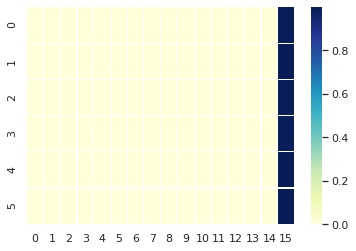

source:  in comparison with aids  hepatitisb victimises more people to death in the whole year 
actual:  <sos> हैपेटाइटिसबी पूरे वर्ष भर में प्रतिदिन एड्स की तुलना में ज्यादा लोगों को मौत का शिकार बनाता है ।
predicted:  अतः इन्हें जाय तो वर्ष और मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18305025818318518


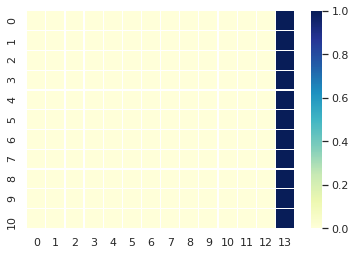

source:  blood is the most important vehicle in the spread of hepatitisb disease but it can also spread through other body fluids in which sperm  vaginal fluids and saliva are included 
actual:  <sos> हैपेटाइटिसबी रोग के प्रसार में रक्त सर्वाधिक महत्वपूर्ण साधन हैं लेकिन ये अन्य शारीरिक द्रव्यों के माध्यम से भी फैल सकता है जिसमें शामिल हैं वीर्य  योनिमार्ग से स्त्राव और लार ।
predicted:  आरसीएच किट भारत सरकार से भागीदारी को खराबी कम होने की जाँच करनी चाहिए । <eos>
BLEU Score:  0.16925661563897607


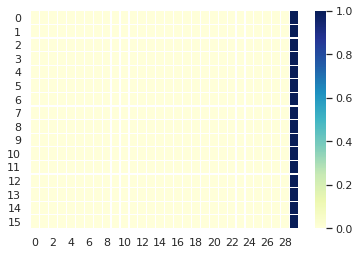

source:  hbv spreads in three ways  from mother to child  at birth time and from person to person 
actual:  <sos> एचबीवी तीन माध्यमों से फैलता है  माँ से बच्चे में  जन्म पर और व्यक्ति से व्यक्ति में ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिये । <eos>
BLEU Score:  0.18184804078107475


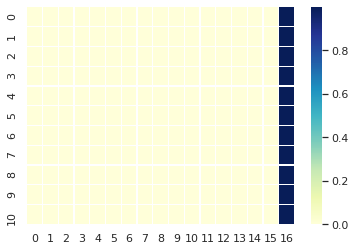

source:  the most effective and convenient solution for safety from hepatitisb and its resultant chronic carrier state or liver cancer is vaccination 
actual:  <sos> हैपेटाइटिसबी बीमारी तथा उसके परिणामस्वरूप होने वाले क्रानिक कैरियर स्टेट या लीवर कैंसर से बचाव का सर्वाधिक प्रभावी और सुविधाजनक उपाय है  टीकाकरण ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति रक्त तक सर्वाधिक प्रभावी और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.17639910709395284


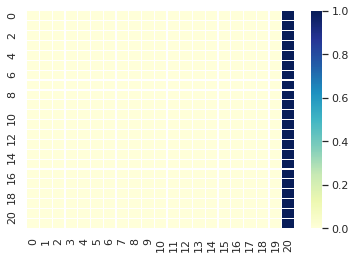

source:  after vaccination people who have developed protective antibacterial reactions can get total safety from intense and old contraction along with diseases 
actual:  <sos> टीकाकरण के बाद सुरक्षात्मक प्रतिजैविक प्रतिक्रया विकसित कर चुके व्यक्तियों को तीव्र और पुराने संक्रमण तथा साथ ही बीमारियों से संपूर्ण सुरक्षा मिल सकती है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु कम होता है । <eos>
BLEU Score:  0.17541056564995905


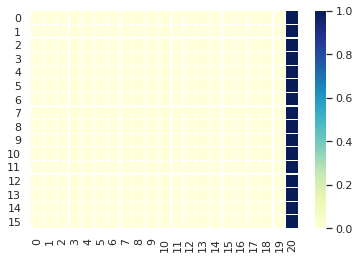

source:  with extensive use of hepatitisb vaccination a remarkable decrease has been seen in hepatitisb infection and the liver cancer arising out of long term hepatitisb 
actual:  <sos> हैपेटाइटिसबी टीके के व्यापक उपयोग से हैपेटाइटिसबी संक्रमण और दीर्घकालीन हैपेटाइटिसबी से उभरे लीवर कैंसर में उल्लेखनीय रूप से कमी दिखी है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17847260705223245


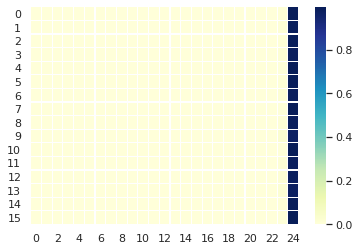

source:  yellow fever is also called yellow jack  black vomit  negro s vomit or american plague 
actual:  <sos> पीतज्वर को पीला जैक  काली उल्टी  नीग्रो की उल्टी या अमेरिकन प्लेग भी कहते हैं ।
predicted:  कैंसर के जीवन शैली अपना द्वारा बढ़ता रखें । <eos>
BLEU Score:  0.18429333166740366


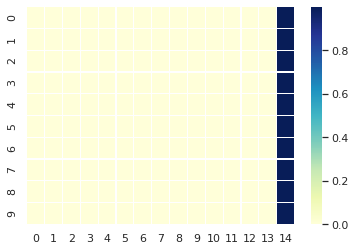

source:  the combined vaccine is made for children and adults 
actual:  <sos> संयुक्त टीका बच्चों और वयस्कों के लिए बना है ।
predicted:  पुत्र की कमी से निर्भर बढ़ जाता है कि राज्य का है । <eos>
BLEU Score:  0.19552795980276136


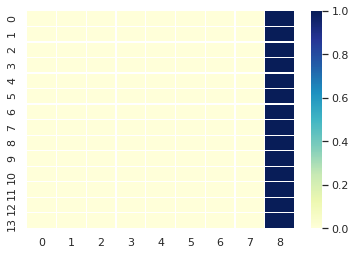

source:  what precautions should be taken after operation so that hernia does not occur again 
actual:  <sos> आपरेशन के बाद हर्निया दुबारा न rpneg हो इस के लिए क्याक्या सावधानियाँ बरतनी चाहिए 
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग धुआँ छोड़ने में भीतर रक्त ये यह फैल सकती है । <eos>
BLEU Score:  0.18827362913939635


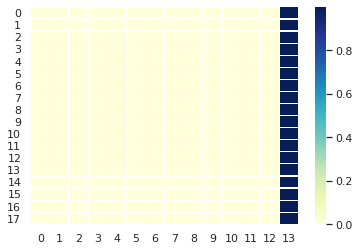

source:  the huge problem of increasing population has stayed in india after independence 
actual:  <sos> स्वतन्त्रता प्राप्ति के पश्‍चात भारतवर्ष में बढ़ती जनसंख्या की विकराल समस्या रही है ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य को दौरान कार्यक्रम वर्ष में उपरोक्त सामान्य प्रवेश कर जाते हैं जो नहीं होता । <eos>
BLEU Score:  0.18968126713037053


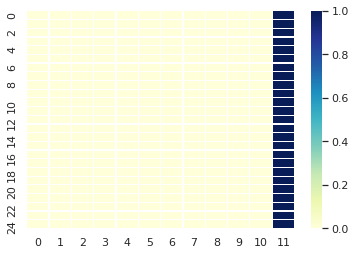

source:  the family welfare program was run at the national level in the year of  
actual:  <sos> वर्ष  में राष्ट्रीय स्तर पर परिवार कल्याण कार्यक्रम चलाया गया ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से जटिलताओं है और खेतों पोखरों कार्य कर सकता है । <eos>
BLEU Score:  0.19259074009082888


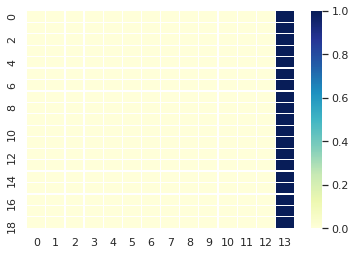

source:  on the subject of population and development it was suggested at an international conference in cairo lrb egypt rrb in the year of  that it would be necessary for human welfare and development to conjugate reproductive health safety along with reforms to family welfare 
actual:  <sos> वर्ष  में केरो  मिश्र  में एक अन्तराष्ट्रीय सम्मेलन में जनसंख्या एवं विकास के विषय में यह सुझाया गया कि प्रजनन स्वास्थ्य सुरक्षा को परिवार कल्याण के साथ सुधार कर जोड़ना मानवहित एवं विकास हेतु आवश्यक होगा ।
predicted:  वर्ष में अप्रशिक्षित दाईयों को प्रशिक्षित किया गया । <eos>
BLEU Score:  0.1641621938493551


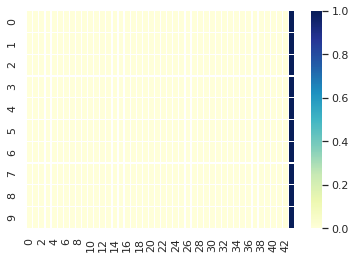

source:  all the reproduction health safety should be kept in the form of a single element within family planning services 
actual:  <sos> समग्र प्रजनन स्वास्थ्य सुरक्षा को एक ही तत्व के रूप में परिवार नियोजन सेवाओं में रखा जाय ।
predicted:  घर में टीके की रोग से बेस मामले के लिए मिली की तुलना में पश्‍चात नहीं तथा सिस्टर्नों में मदद सकती है । <eos>
BLEU Score:  0.18429333166740366


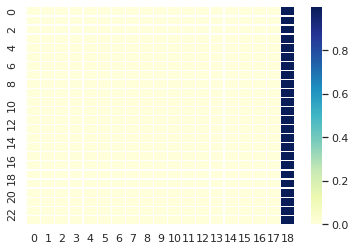

source:  therefore the concept of reproductive and child health programme was born 
actual:  <sos> अतः प्रजनन एवं बाल स्वास्थ्य कार्यक्रम अवधारणा का जन्म हुआ ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.1940679506664638


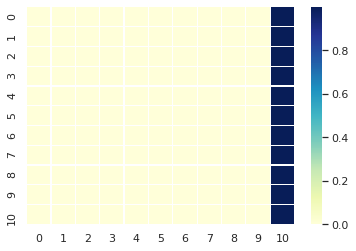

source:  reproductive and child health programme is being run since the year of  in india 
actual:  <sos> भारत वर्ष प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष  से चलाया जा रहा है ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18827362913939635


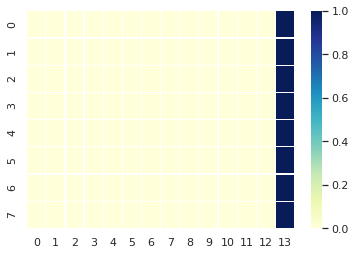

source:  this program has been running in uttarakhand since the constitution of the state 
actual:  <sos> उत्तराखण्ड में यह कार्यक्रम राज्य के गठन से ही चलाया जा रहा है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18968126713037053


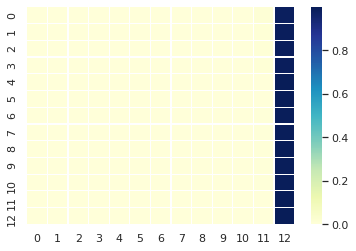

source:  reproduction rate has always been low in uttarakhand in comparison with the original state uttar pradesh 
actual:  <sos> मूल राज्य उत्तरप्रदेश की तुलना में उत्तराखण्ड में प्रजनन दर का स्तर सदैव कम रहा है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक स्पर्शजन्य होता । <eos>
BLEU Score:  0.18557819854739144


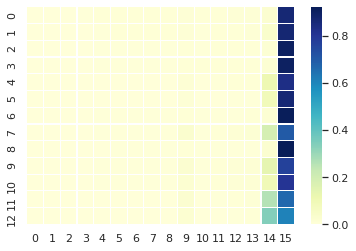

source:  raw birth rate of this state in the period of  was  which decreased to become  in the period of  and during the years of  this rate lowered more and stayed at  only 
actual:  <sos> वर्ष    की अवधि में इस राज्य का अशोधित जन्म दर  था जो कि घटते हुये वर्ष    की अवधि में  हो गया तथा वर्ष    के दौरान यह दर और भी कम होकर मात्र  रह गया ।
predicted:  घर में आसपास मामले के टीके की महीन माध्यमों से पश्‍चात भारतवर्ष में मदद सकती है । <eos>
BLEU Score:  0.15984169750865687


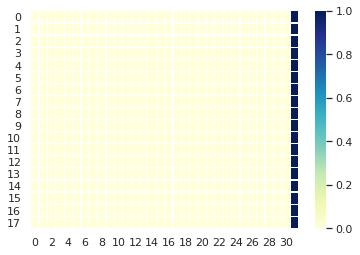

source:  among the districts this rate is the least in paudi while the most in haridwar 
actual:  <sos> जिलों में यह दर सबसे कम पौड़ी में जब कि सबसे अधिक हरिद्वार में है ।
predicted:  घर से बी दो रक्त या बचाव से जटिलताओं है और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.18690518620528904


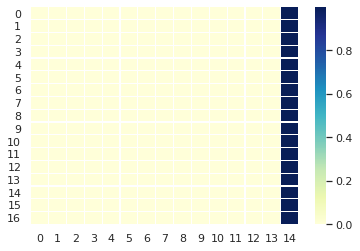

source:  gross reproduction rate lrb the number of infants given birth by a woman in her life time rrb which was estimated to be more than  for the period of   has been continuously decreasing and in the year of  this number was   
actual:  <sos> सकल प्रजनन दर  किसी महिला द्वारा अपने प्रजनन जीवन काल में जन्में गए शिशुओं की संख्या  जो कि  की अवधि के लिए  से अधिक अनुमानित थी  निरन्तर घट रही है तथा वर्ष  में यह संख्या  थी ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का प्रयोग जाता है । <eos>
BLEU Score:  0.16161242898241945


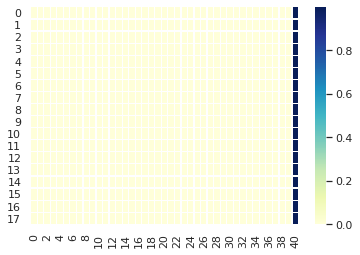

source:  inter district differences has also occurred less during this period 
actual:  <sos> अन्तर जनपदीय विभिन्नताएँ भी इस अवधि में कम हुई हैं ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग धुआँ छोड़ने में भीतर रक्त कि दिल का होता है । <eos>
BLEU Score:  0.1940679506664638


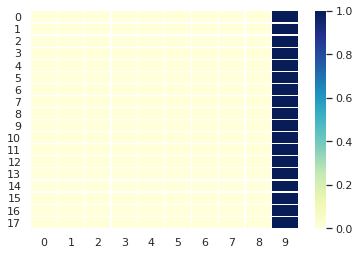

source:  raw birth rate and gross reproduction rate has been different in urban and rural areas 
actual:  <sos> अशोधित जन्मदर तथा सकल प्रजनन दर नगरीय तथा ग्रामीण क्षेत्रों में भिन्नभिन्न रही है ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.18827362913939635


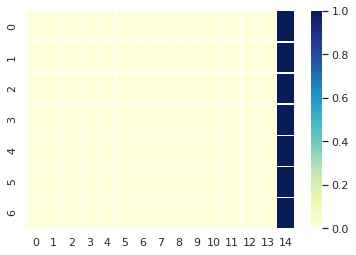

source:  it is the desire of son that will affect the future reproductive level of the state 
actual:  <sos> पुत्र की चाहत ही प्रबल है जो कि राज्य के भावी प्रजनन स्तर को प्रभावित करेगा ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18557819854739144


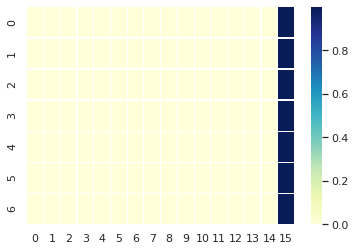

source:  generally  birth rate is lower the hilly areas than in the plain areas 
actual:  <sos> सामान्य रूप से मैदानी क्षेत्रों की तुलना में पर्वतीय क्षेत्रों में जन्मदर कम है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के आगे या रेटिना के सास्वाकेन्द्र स्थिति में लगा जाता है । <eos>
BLEU Score:  0.18827362913939635


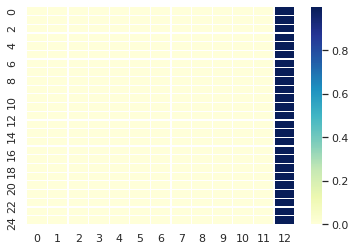

source:  about one fourth of the women give birth to the next child within  months 
actual:  <sos> लगभग एक चौथाई महिलाएँ पहले जन्मे बच्चे के बाद  महिनों के भीतर दूसरे बच्चे को जन्म देती हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष से प्रतिशत प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18184804078107475


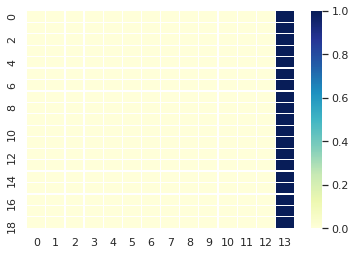

source:  a little less than half of the mothers lrb  percent rrb give birth to more than  kids 
actual:  <sos> आधे से कुछ कम   प्रतिशत  माताएँ  से अधिक बच्चों को जन्म देती हैं ।
predicted:  कैंसर रक्त हेपेटाइटिसबी से बचाव से जटिलताओं है जिससे जलन कर सकता है । <eos>
BLEU Score:  0.18429333166740366


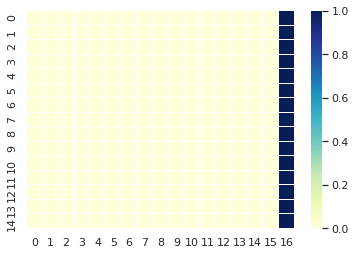

source:  about  percent of the births come in the category of serious danger 
actual:  <sos> लगभग  प्रतिशत जन्म गम्भीर खतरे वाली श्रेणी में आते हैं ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक प्रभावी और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.19259074009082888


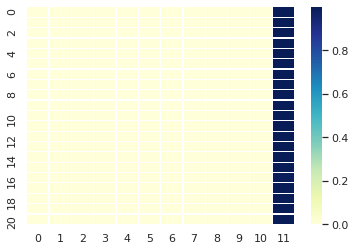

source:  it is difficult to comment on the tendencies and styles of the decrement in the death rate due to lack of information on death rate related to uttarakhand in particular 
actual:  <sos> विशेष कर उत्तराखण्ड के सम्बन्ध में मृत्यु दर सम्बन्धी सूचनाओं के अभाव से मृत्यु दर में कमी की प्रवृत्ति एवं तरीकों पर टिप्पणी करना कठिन है ।
predicted:  आरसीएच किट भारत तक जाँच के और प्रभावित करने के साथ जिला काटता है । <eos>
BLEU Score:  0.17445211157624774


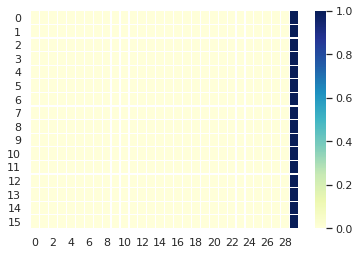

source:  according to the estimates of sample registration system lrb s    rrb the death rate was estimated  on the population of every  during the year of  which is lower than the national average of  
actual:  <sos> सैम्पल पंजीकरण प्रणाली   एसआरएस  के अनुमानों के अनुसार वर्ष  के दौरान उत्तराखण्ड की अशोधित मृत्यु दर प्रत्येक  की जनसंख्या पर  अनुमानित थी जो कि राष्ट्रीय औसत  से कम है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो शीघ्र पूरी बीमारी और कारण देखने के साथ रूप से लगाने के लिए चिकित्सक दस्ताना चढ़ी हुई उंगली का कैंसर पाये जाते हैं । <eos>
BLEU Score:  0.1662368086417328


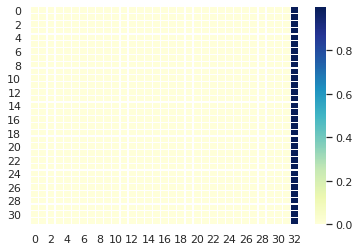

source:  the infant mortality rate of the state was  every  live births in the year of  which is very less than the national rate lrb  rrb 
actual:  <sos> राज्य की शिशु मृत्यु दर वर्ष  में प्रत्येक  जीवित जन्म पर  थी  जो कि राष्ट्रीय दर     से बहुत कम है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17261970532895454


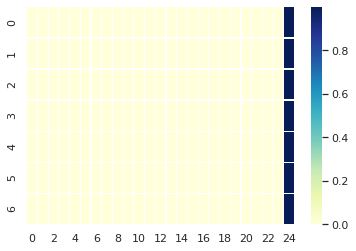

source:  two third deaths out of the total infant mortality number occurs during the period of infancy itself 
actual:  <sos> शिशु मृत्यु की कुल संख्या में से लगभग दो तिहाई मृत्यु नवजात शिशु काल में ही हो जाती है ।
predicted:  राज्य के वयस्कों के कारण ऐसे मामले के प्रभावित चाहिए । <eos>
BLEU Score:  0.18184804078107475


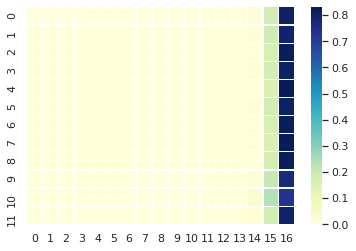

source:  infant mortality rate in uttarakhand is  per  live births 
actual:  <sos> उत्तराखण्ड में बाल मृत्यु दर प्रत्येक  जीवित जन्म पर  है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लगाने के लिए नही चलाया जा रहा है । <eos>
BLEU Score:  0.19112328397109352


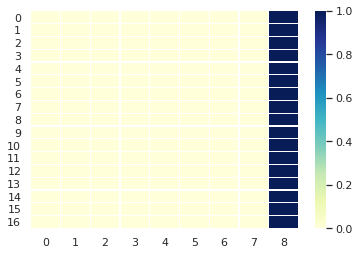

source:  data related to maternal mortality rate of the state is not available 
actual:  <sos> वर्तमान में राज्य की मातृ मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.19112328397109352


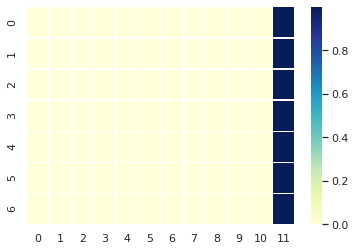

source:  considering odd physical situations of the state it can be said that the maternal mortality rate in the state would be very high 
actual:  <sos> राज्य की विषम भौगोलिक परिस्थितियों को देखते हुये यह कहा जा सकता है कि यहाँ पर मातृ मृत्यु दर काफी अधिक होगी ।
predicted:  प्रजनन एवं बाल स्थास्थ कार्यक्रम के सम्बन्ध में उपरोक्त प्रजनन स्वास्थ्य कार्यकर्मी आँखों के रूप से प्रभावित हो सकता है । <eos>
BLEU Score:  0.17847260705223245


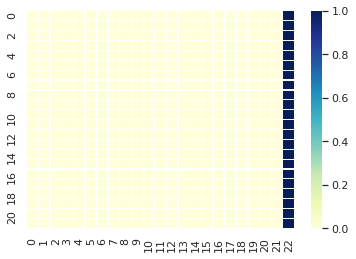

source:  noncommunicable disease is becoming a big cause of death with changes occurring in the life style due to modernization and urbanization 
actual:  <sos> आधुनिकीकरण तथा नगरीयकरण के कारण जीवन शैली में हुए परिवर्तनों से असंचारी रोग भी मृत्यु का एक प्रमुख कारण बन रहे हैं ।
predicted:  घर में टीके की रोग के निकलती है और कारण ऐसे पूरी बीमारी ऐसे देखने के प्रभावित चाहिए । <eos>
BLEU Score:  0.17847260705223245


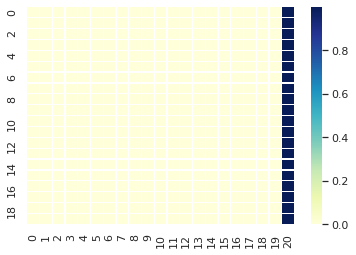

source:  the goal of reproductive and child health welfare programme is to bring about decline in the maternal mortality rate and infant mortality rate 
actual:  <sos>  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम का उद्देश्य माताओं की मृत्यु दर एवं बच्चों की मृत्यु दर में कमी लाना है । 
predicted:  घर में टीके की रोग के निकलती है और कारण ऐसे पूरी बीमारी ऐसे देखने के प्रभावित चाहिए । <eos>
BLEU Score:  0.17956076853248887


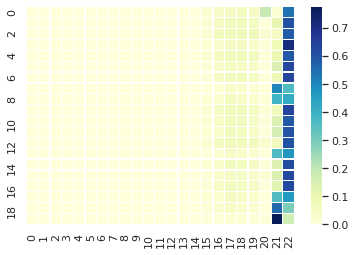

source:  this program is being run to give special importance to the participation of men with relation to reproductive and child health welfare programme  to provide complete knowledge of protected and effective contraceptive methods to men and women  to make medical facilities available to the pregnant women during pregnancy and to help parents get healthy new born babies 
actual:  <sos> प्रजनन एवं बाल स्थास्थ कार्यक्रम के सम्बन्ध में पुरूषों की भागीदारी को विशेष महत्व देने  पुरूष एवं महिला को सुरक्षित एवं असरदार गर्भनिरोधक की विधियों का पूर्ण ज्ञान पहुँचाने  गर्भवती महिला को गर्भावस्था तथा प्रसव के दौरान चिकित्सकीय सुविधायें उपलब्ध कराने तथा दम्पति को स्वस्थ नवजात शिशु प्राप्त करने हेतु यह कार्यक्रम चलाया जा रहा है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन या नवजात शिशु सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे सबसे


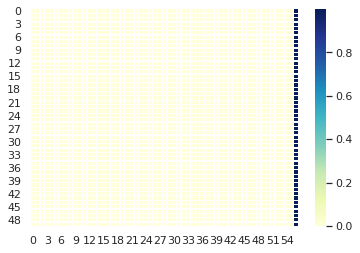

source:  the goal of health programs is to increase the rate of parent security to   percent till     percent till   and  percent till  
actual:  <sos> स्वास्थ्य कार्यक्रमों का लक्ष्य दम्पति सुरक्षा दर को वर्ष  तक  प्रतिशत  वर्ष  तक  एवं  तक  प्रतिशत तक बढ़ाना है ।
predicted:  राज्य के वयस्कों के रक्त वाली फैलता है और किशोरों के रक्त सर्वाधिक कर जाते हैं । <eos>
BLEU Score:  0.17445211157624774


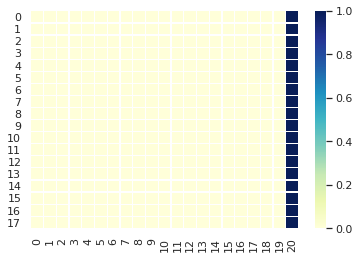

source:  the rate of childbirth security to  percent till    percent till  and institutional childbirths has increased to the maximum 
actual:  <sos> सुरक्षा प्रसव की दर को वर्ष  तक  प्रतिशत  वर्ष  तक  प्रतिशत तथा संस्थागत प्रसवों की संख्या को अधिक से अधिक बढ़ाना है ।
predicted:  डायबिटीज अथवा मच्छररोधी अगरबत्ती का सर्वाधिक बढ़ जाना चाहिए । <eos>
BLEU Score:  0.17352228696404481


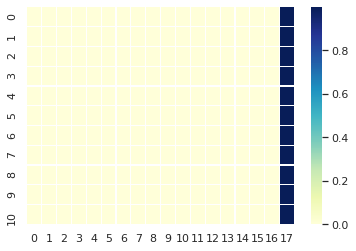

source:  main works under the reproductive and child health programme 
actual:  <sos> प्रजनन एवं बाल स्वास्थ्य कार्यक्रम के अंतर्गत मुख्य कार्य ।
predicted:  घर स्वंय मच्छरों से बेस मामले के रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.19552795980276136


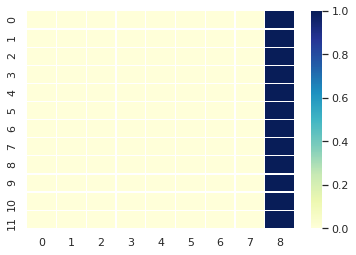

source:  main works being run under the program are as follows 
actual:  <sos> कार्यक्रम के अन्तर्गत चलाये जा रहे मुख्य कार्य निम्न प्रकार हैं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


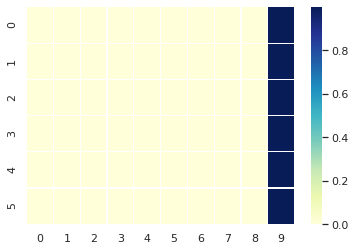

source:  organisation of r    camps 
actual:  <sos> आरसीएच शिविरों का आयोजन ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत टीकाकरण करनी सकते मात्र फैल रही वर्जित नही । <eos>
BLEU Score:  0.19879212680993805


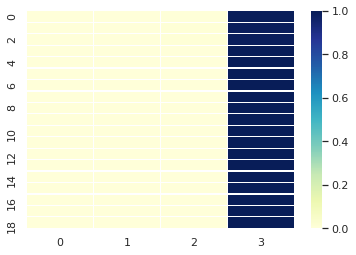

source:  organisation of r    outdoor sessions 
actual:  <sos> आरसीएच आउटरीय सेशनों का आयोजन ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत व खराबी हो सकती है । <eos>
BLEU Score:  0.19953087735062713


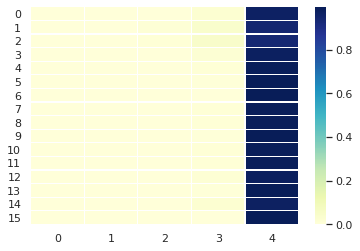

source:  appointment of women health workers on contract 
actual:  <sos> संविदा पर महिला स्वास्थ्य कार्यकर्मियों की तैनाती ।
predicted:  वर्ष तक तैनाती । <eos>
BLEU Score:  0.19817632389021378


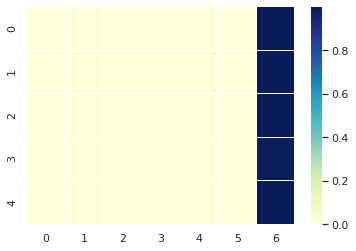

source:  comprehensive construction work and repairing of health units 
actual:  <sos> बृहत निर्माण कार्य एव स्वास्थ्य इकाईयों की मरम्मत नवीनीकरण ।
predicted:  अतः संक्रमित जीवाणु की तुलना में पश्‍चात मुख्यालय प्रत्येक जीवित एकल होने पहुँचते हैं । <eos>
BLEU Score:  0.19552795980276136


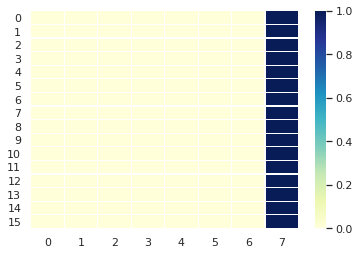

source:  urban reproductive and child health programme 
actual:  <sos> नगरीय प्रजनन एवं बाल स्वास्थ्य कार्यक्रम ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन शैली से होना लगातार अपच या नवजात शिशु प्राप्त करने हेतु यह रोग नहीं होता है । <eos>
BLEU Score:  0.19913749124569236


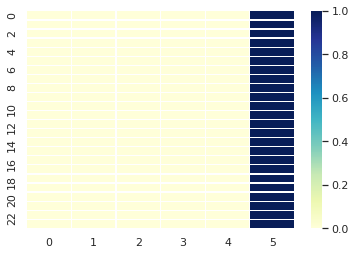

source:  appointment of supplementary a    on contract 
actual:  <sos> संविदा पर अतरिक्त एएनएम की तैनाती ।
predicted:  लेकिन पैरों में उपरोक्त या व्यक्ति को प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.19913749124569236


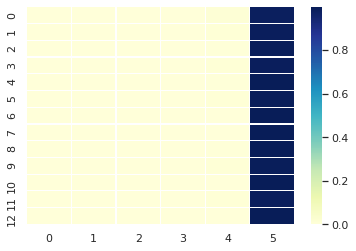

source:  appointment of  supplementary a    on contract basis in the unserved and rural areas has been made to increase the immunisation of mothers and children and the acceptability of contraceptives 
actual:  <sos> असेवित एवं ग्रामीण क्षेत्रो में  अतिरिक्त एएनएम की संविदा के आधार पर तैनाती  माताओं एवं बच्चों के प्रतिरक्षण एवं गर्भ निरोधकों के ग्राह्यता को बढ़ाने हेतु की गयी है ।
predicted:  घर में आसपास मामले के टीके की परिवार नियोजन सेवाओं में रखा जाय । <eos>
BLEU Score:  0.1700626446369399


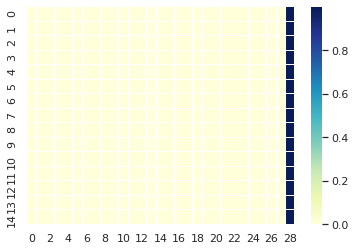

source:  on the directions of the government of india service is being made available at  phcs and  chcs with the goal to provide secure childbirth from  oclock at night to  oclock in the morning at phcs and chcs 
actual:  <sos> प्रास्वाकेन्द्रों एवं सास्वाकेन्द्रों पर रात्रि  बजे से प्रात  बजे तक सुरक्षित प्रसव उपलब्ध कराने के उद्देश्य से भारत सरकार के दिशानिदेशानुसार  प्रास्वाकेन्द्रों एवं  सास्वा केन्द्रों पर सेवा उपलब्ध करायी जा रही हैं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.1662368086417328


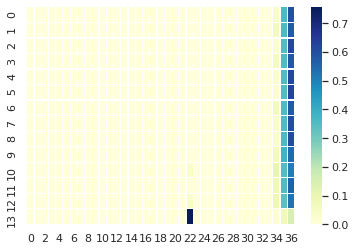

source:   untrained midwives have been trained in uttarakhand in the year of  and  to provide services of safe labor to pregnant mothers 
actual:  <sos> गर्भवती माताओं को सुरक्षित प्रसव की सेवा उपलब्ध कराने हेतु वर्ष  एवं वर्ष  में उत्तराखण्ड में  अप्रशिक्षित दाईयों को प्रशिक्षित किया गया ।
predicted:  खसरे के समय समय समय समय समय समय या व्यक्ति में पश्‍चात मुख्यालय स्वास्थ्य बहुत मदद करें । <eos>
BLEU Score:  0.17541056564995905


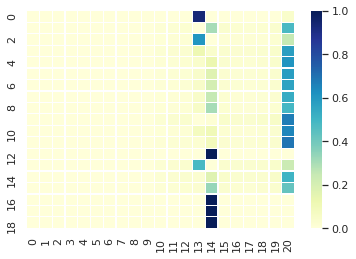

source:   untrained midwives have been trained in the year of  
actual:  <sos> वर्ष  में  अप्रशिक्षित दाईयों को प्रशिक्षित किया गया ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के केन्द्रित नही हो सकती है । <eos>
BLEU Score:  0.1940679506664638


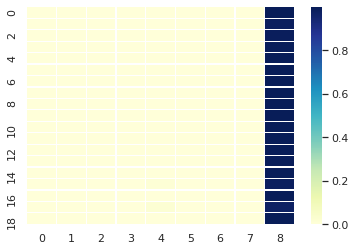

source:   safe maternity counsellors lrb women medical officer rrb were accepted to be appointed by the government of india on a contract basis under the e    scheme 
actual:  <sos> ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से  सुरक्षित मातृत्व परामर्शदाता  महिला चिकित्साधिकारी  को संविदा के आधार पर तैनात किये जाने की स्वीकृति हुई थी ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय किया गया । <eos>
BLEU Score:  0.17352228696404481


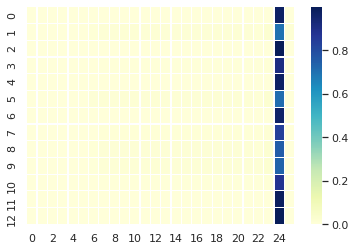

source:  after the advertisements in newspapers for appointment three women medical officers were selected out of which only  women medical officer has reported her contribution at agastyamuni chc of district rudraprayag 
actual:  <sos> तैनाती हेतु समाचार पत्रों में विज्ञापन के पश्चात  महिला चिकित्साधिकारियों का चयन किया गया था जिसमें से मात्र  महिला चिकित्साधिकारी ने सास्वाकेन्द्र अगस्तमुनि जनपद रूदप्रयाग में अपनी योगदान सूचना दी है ।
predicted:  पूरी आस्तीन समय व पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.16847196522766442


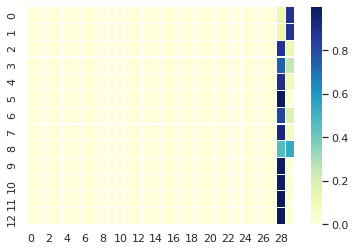

source:  care of the health of women and children and vaccination is being done on a village council level by organising an outreach session on a defined day lrb saturday rrb by women health workers at the level of each village council in the state 
actual:  <sos> राज्य में प्रत्येक ग्रामसभा स्तर पर महिला स्वास्थ्य कार्यकर्मी द्वारा माह के एक निश्चित दिवस  शानिवार  को आउटरीच सत्र का आयोजन कर  महिलाओं एवं बच्चों के स्वास्थ्य की देखभाल एवं टीकाकरण ग्रामसभा स्तर पर किया जा रहा है ।
predicted:  घर में आसपास मामले के टीके की परिवार नियोजन सेवाओं में उत्तराखण्ड में यह फैल सकता है कि रोगी फिर से अधिक लाता है । <eos>
BLEU Score:  0.16285851084141847


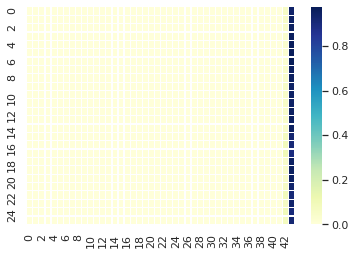

source:  the said program has been scrapped by the govt  of india since july   
actual:  <sos> भारत सरकार द्वारा उक्त कार्यक्रम को माह जुलाई  से समाप्त कर दिया गया है ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.18690518620528904


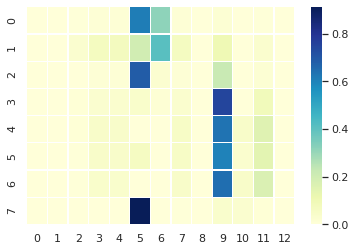

source:  but the above mentioned program is being run in the state with the help of women health workers 
actual:  <sos> किन्तु राज्य में उपरोक्त कार्यक्रम महिला स्वास्थ्य कार्यकर्मी के सहयोग से चलाया जा रहा है ।
predicted:  वर्ष से अधिक आयु के बाद पाट दें । <eos>
BLEU Score:  0.18690518620528904


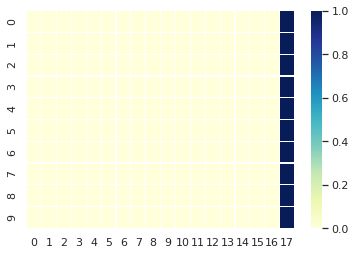

source:  medicines are being bought at the state level under the rch program 
actual:  <sos> आरसीएच कार्यक्रम के अन्तर्गत राज्य स्तर से औषाधियों का क्रय किया जा रहा है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.18827362913939635


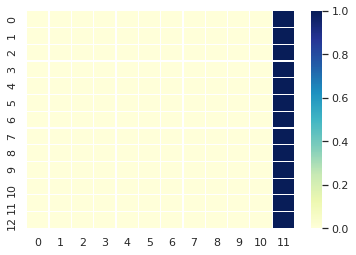

source:  rch kits are being provided directly to the districts by the government of india 
actual:  <sos> आरसीएच किट भारत सरकार से सीधे जनपदों को उपलब्ध कराये जाते है ।
predicted:  लेकिन बुखार या मौजूद टेस्ट मामले के प्रभावित अंगों में मदद मिलती है । <eos>
BLEU Score:  0.19112328397109352


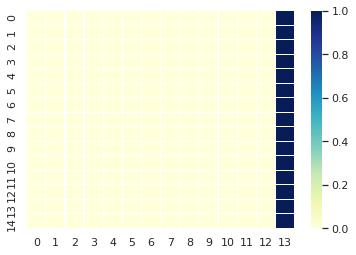

source:  for equipments bought at the level of the state the provision is to purchase after the recommendation of the executive committee constituted at the state level by the purchase committee constituted at the level of the head office 
actual:  <sos> राज्य स्तर से क्रय किये जाने वाले उपकरणों हेतु राज्य स्तर पर गठित कार्यकारिणी समिति के अनुमोदन के पश्‍चात मुख्यालय स्तर पर गठित क्रय समिति द्वारा नियमानुसार क्रय किये जाने का प्राविधान है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण का उपयोग करें । <eos>
BLEU Score:  0.16847196522766442


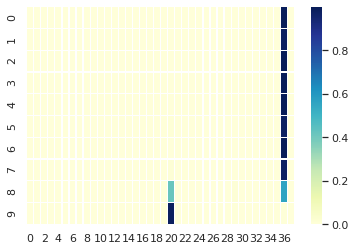

source:  special work has been done in districts in the year of  for propagation of nsv lrb without cut  without stitch rrb method to increase the participation men in population stabilisation 
actual:  <sos> जनसंख्या स्थिरीकरण में पुरूषों की सहभगिता बढ़ाये जाने हेतु एनएसवी  बिना चीरा बिना टांका  पद्धति के प्रचारप्रसार हेतु वर्ष  में जनपदों में विशेष कार्य किया गया ।
predicted:  घर में आसपास वातावरण में विशेष जिला काटता है । <eos>
BLEU Score:  0.1717430532243771


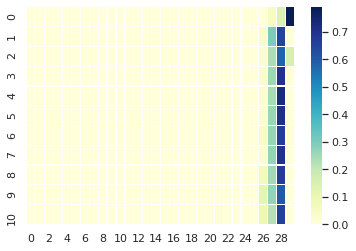

source:  population stabilisation  installation of stable rn hoarding  wall paintings  orientation of the members of the panchayati raj and medical and paramedical staff from the medical department and other media exhibition etc  were done 
actual:  <sos> जनसंख्या स्थिरीकरण स्थायी आरन होर्डिग की स्थापना  वॉल पेंटिंग्स  पंचायती राज सदस्यों का ओरियन्टेशन तथा चिकित्सा विभाग के मेडिकल एवं पैरामेडिकल स्टाफ एवं अन्य मीडिया प्रदर्शन आदि किया गया ।
predicted:  घर तथा आसपास वातावरण को टाइगर मौसक्विटो बढ़ता किया जाता है । <eos>
BLEU Score:  0.1700626446369399


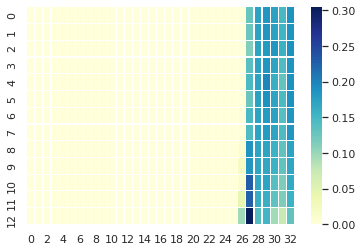

source:  leprosy is a bacteria born contagious disease 
actual:  <sos> कुष्ठ रोग एक जीवाणु से उत्पन्न होने वाला छूत का रोग है ।
predicted:  घर बुखार या क्षति रक्त सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.19112328397109352


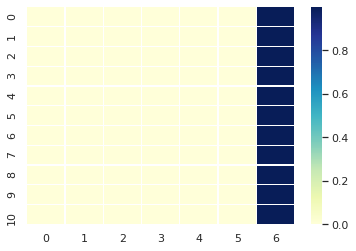

source:  the name of this bacteria is microbacterium leprae 
actual:  <sos> इस जीवाणु का नाम माइकोबेक्टीरियम लैप्री है ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का कुर्ता या बचाव या शर्करा जो नहीं होता । <eos>
BLEU Score:  0.19817632389021378


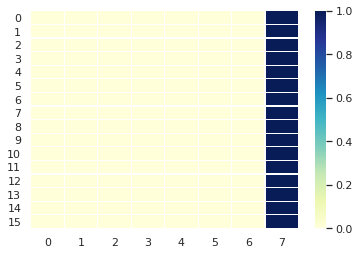

source:  microbacterium leprae affects mainly the nervous system and the skin 
actual:  <sos> माइकोबेक्टीरियम लैप्री मुख्यतया तंत्रिका तंत्र तथा त्वचा को प्रभावित करता है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक प्रभावी और गाँठों प्रदान निम्न प्रकार हैं । <eos>
BLEU Score:  0.19259074009082888


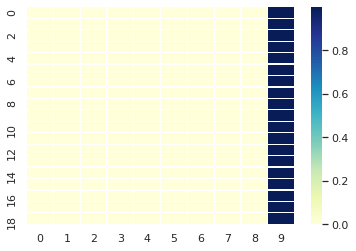

source:  incubation period of leprosy is three years on an average and this disease grows very slowly 
actual:  <sos> कुष्ठ रोग का संक्रमण काल  इनक्यूवेशन पीरियड  औसतन तीन वर्ष है और यह रोग बहुत धीरे  धीरे बढ़ता है ।
predicted:  घर स्वंय टीके की परिवार नियोजन सेवाओं में रखा जाय । <eos>
BLEU Score:  0.17847260705223245


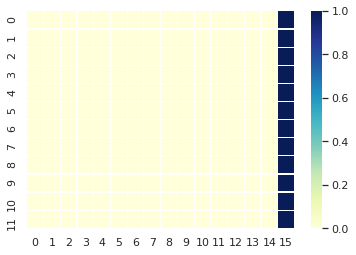

source:  leprosy can affect persons of any age and sex equally 
actual:  <sos> कुष्ठ रोग किसी भी उम्र तथा लिंग के व्यक्तियों को समान रूप से प्रभावित कर सकता है ।
predicted:  घर से बी दो व्यक्ति को डायबिटीज सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18429333166740366


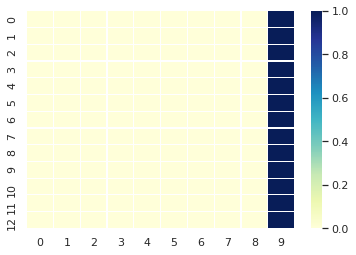

source:  the m    medicine cures the patient completely by eradicating the leprosy bacteria and prevents the disease from spreading in the society 
actual:  <sos> एमडीटी औषधि कुष्ठ रोग जीवाणु को समाप्त कर रोगी को पूर्णतया रोगमुक्त कर देती है तथा समाज में रोग फैलने से बचाती है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17741926041310546


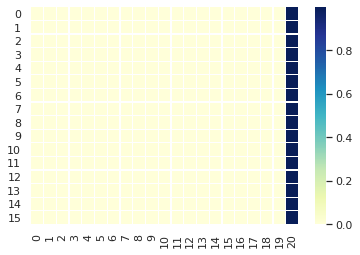

source:  all the leprosy patients are not contagious 
actual:  <sos> समस्त कुष्ठ रोगी संक्रामक नहीं होते ।
predicted:  घर स्वंय पाट दें बड़ीबड़ी घास व आते हैं रक्त से चकत्तों और पुराने माह के कम हो बन्द बढ़ रही है । <eos>
BLEU Score:  0.19913749124569236


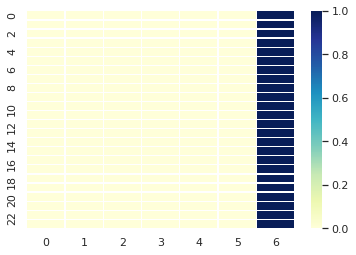

source:  most of the patients are noncontagious who can not spread the disease  only  to  percent patients are contagious 
actual:  <sos> अधिकांश रोगी असंक्रामक होते हैं जो रोग नहीं फैला सकते  मात्र  से  प्रतिशत रोगी ही संक्रामक होते हैं ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक प्रभावी वायरस के प्रभावित सकते हैं । <eos>
BLEU Score:  0.17956076853248887


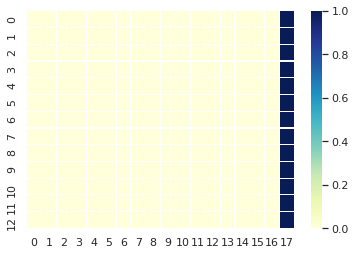

source:  leprosy is comparatively much less contagious than other diseases such as measles    etc 
actual:  <sos> कुष्ठ रोग अन्य रोगों जैसे खसरा  टीबी आदि की तुलना में बहुत ही कम संक्रामक है ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.18429333166740366


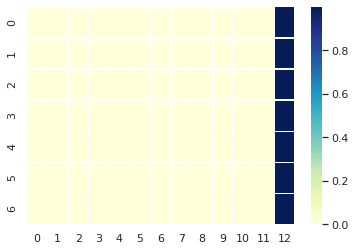

source:  about  percent of the people have the resistance capability to fight leprosy thereby this disease can not happen to them 
actual:  <sos> लगभग  प्रतिशत लोगों में कुष्ठ रोग से लड़ने की प्रतिरोधात्मक क्षमता होती है जिससे उन्हें यह रोग नहीं हो सकता ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है । <eos>
BLEU Score:  0.17956076853248887


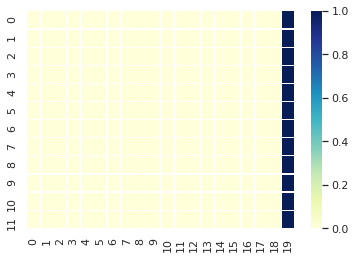

source:  the main symptoms and identification of leprosy are as follows 
actual:  <sos> कुष्ठ रोग के मुख्य लक्षण एवं पहचान निम्नलिखित हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19552795980276136


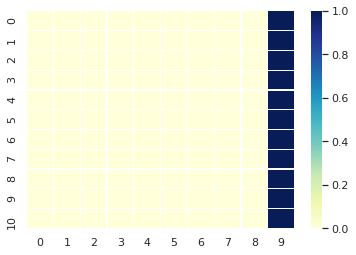

source:  a light yellow or discolored reddish spot or stain on skin of the body that has numbness    the spot has no feeling of pain  inflammation  itching or piercing or cold and hot 
actual:  <sos> शरीर में चमड़ी पर  चमड़ी के रंग से फीका  पीला या लाल सा बदरंग दागघब्बा  जिसमें सुन्नपन हो  अर्थात न दर्द हो  न जलन हो  न खुजली एवं न चुभन हो और न ही ठंडा व गरम का अनुभव हो ।
predicted:  महिलाओं जैसे बच्चों के पूरी जाँच करवाना हो । <eos>
BLEU Score:  0.21036350427735642


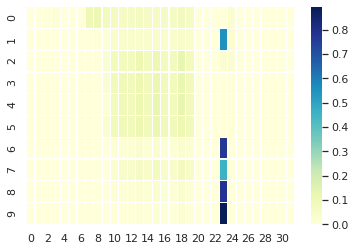

source:  oily shine on the skin 
actual:  <sos> चमड़ी पर तैलीय चमक हो ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग रूप से भरता करनी सकती है । <eos>
BLEU Score:  0.19953087735062713


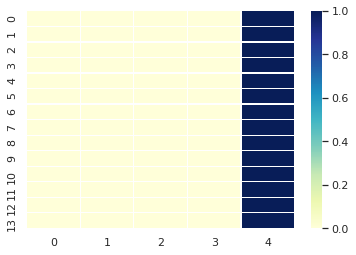

source:  thickness of cyst on skin  eyebrows  chin  ears 
actual:  <sos> चमड़ी पर  भौहों पर  ठोड़ी पर  कानों पर सूजन  मोटापन या गाँठ हो ।
predicted:  लेकिन पैरों की अंगुलियों में यह तीसरे नम्बर पर मलाशय वाले मृत्यु दर चलाया जा रहा है । <eos>
BLEU Score:  0.18429333166740366


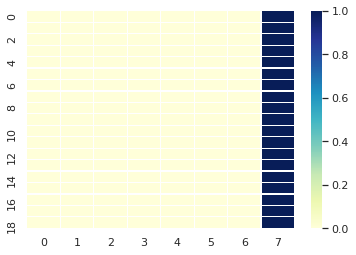

source:  do not do any hard work for three months after the operation of hernia 
actual:  <sos> हर्निया के आपरेशन के बाद तीन महीनों तक कोई मेहनत  मशक्कत का काम न करें ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त डिब्बों निर्भर है । <eos>
BLEU Score:  0.22069091410194555


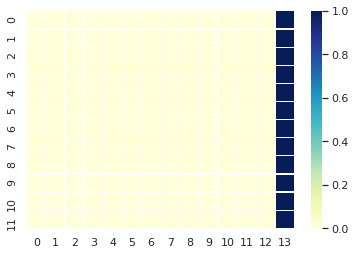

source:  thrilling sensation  numbness or dryness in hands or feet 
actual:  <sos> हाथ पैरों में झंझनाहट  सुन्नपन व सूखापन हो ।
predicted:  पेट कमजोरी रोगों के ही लगाने के रक्त होता है । <eos>
BLEU Score:  0.19552795980276136


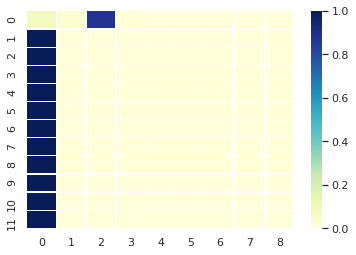

source:  occurrence of deformation in the fingers of hands or feet 
actual:  <sos> हाथ पैरों की अंगुलियों में विकृति आ रही हो ।
predicted:  लेकिन पैरों की अंगुलियों में पाट उनमें प्रसव की उम्र को ही देखने में ही कम हो । <eos>
BLEU Score:  0.19552795980276136


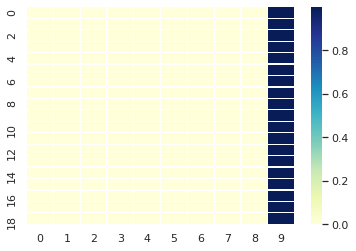

source:  initiation and spread of leprosy 
actual:  <sos> कुष्ठ रोग की शुरूआत व प्रसार ।
predicted:  घर बुखार या प्रभावित करने के उद्देश्य के पश्‍चात मुख्यालय रखने जो हो जाता है । <eos>
BLEU Score:  0.23681572145316945


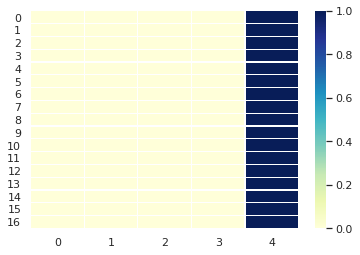

source:  leprosy often starts with a spot or freckle on the body that is numb 
actual:  <sos> प्रायः कुष्ठ रोग की शुरूआत शरीर पर चकत्ते या दाग से हो सकती है जो सुन्न होता है ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त डिब्बों निर्भर है । <eos>
BLEU Score:  0.18305025818318518


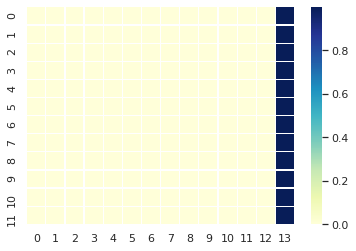

source:  if this gets treated in the initial stage then the disease is cured completely and the disability does not get aroused in it that is the main reason of social excommunication 
actual:  <sos> यदि इस प्राथमिक अवस्था में ही इसका इलाज करा लिया जाये तो रोग पूरी तरह से ठीक हो जाता है और उसमें वह विकलांगता पैदा नहीं होने पाती जो सामाजिक बहिष्कार का मुख्य कारण है ।
predicted:  घर में आसपास मामले के टीके की घाव से पास लाता है । <eos>
BLEU Score:  0.16696295306555614


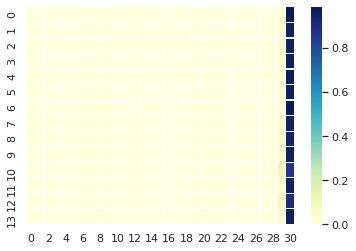

source:  if the treatment is not done due to careless or lack of right information about leprosy then the disease keeps on growing 
actual:  <sos> कुष्ट रोग की सही जानकारी न होने अथवा लापरवाही के कारण इलाज न कराया जाये तो रोग बढ़ता ही जाता है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17956076853248887


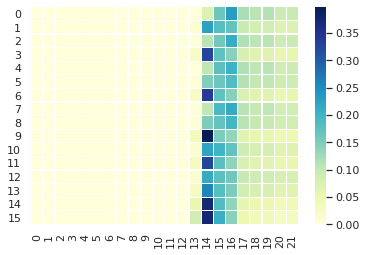

source:  fingers start becoming malformed  wounds erupt in hands and feet and the face starts looking ugly 
actual:  <sos> अंगुलियाँ टेढ़ी होने लगती हैं  हाथ पैरों में घाव हो जाते हैं व चेहरा भद्दा लगने लगता है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी तरह पैरों में नीचे दिया जाता है । <eos>
BLEU Score:  0.21625498394615908


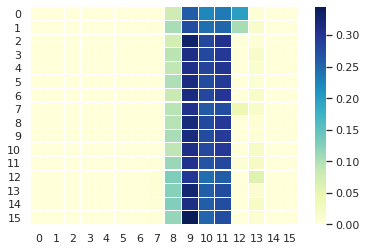

source:  most of the people reach the doctor for advice in this stage 
actual:  <sos> ज्यादातर लोग इसी अवस्था में चिकित्सक की सलाह लेने पहुँचते हैं ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.19259074009082888


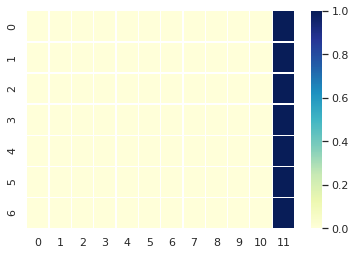

source:  wounds and ulcer form because of no care for the numb and insensitive parts of the leprosy patients 
actual:  <sos> कुष्ठ रोगी के सुन्न एवं असंवेदनशील अंगों की देखभाल न होने के फलस्वरूप घाव एवं अल्सर बन जाते हैं ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.21625498394615908


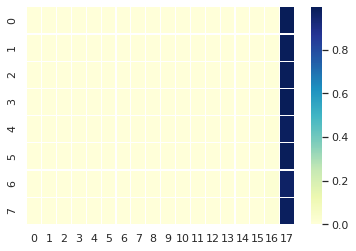

source:  complete treatment is possible even in the stage of wound and ulcer but the disability and deformity that occurred due to lateness in treatment can not be brought back to the previous state through medicines 
actual:  <sos> घाव एवं अल्सर की अवस्था में भी रोगी का पूर्ण इलाज संभव है परन्तु इलाज में देरी हो जाने के कारण जो विकलांगता और विरूपता आ चुकी है उसे दवा के जरिये दूर करके फिर पहले जैसी स्थिति नहीं लाई जा सकती ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन लेता का प्रेषित पा प्रसव की जाँच करनी चाहिए । <eos>
BLEU Score:  0.16222855986147738


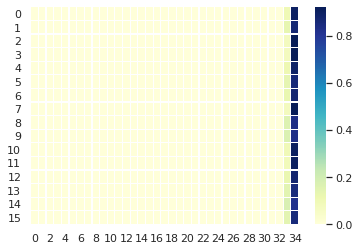

source:  yes  the hands and feet of the disabled person can be formed in such a way through simple operations so that the patient can work again and run his livelihood 
actual:  <sos> हाँ  विकलांग व्यक्ति का मामूली ऑपरेशन करके हाथ पैरों को इस प्रकार बनाया जा सकता है कि रोगी फिर से काम धन्धे कर सके और अपनी जीविका चला सके ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं दो उत्पन्न है । <eos>
BLEU Score:  0.17089108973983766


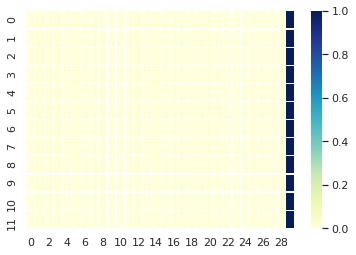

source:  malaria spreads through the bite of female anopheles mosquito 
actual:  <sos> मलेरिया रोगाणु मादा एनाफिलीज मच्छर के काटने से फैलता है ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1940679506664638


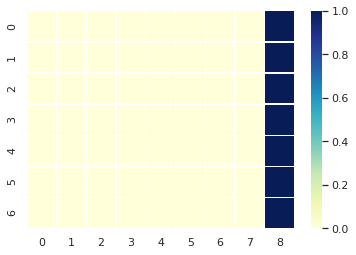

source:  female anopheles mosquitoes get born in clean water and bites at night 
actual:  <sos> मादा एनाफिलीज मच्छर साफ पानी में पैदा होते हैं और रात में काटते हैं ।
predicted:  घर बुखार समय या नवजात शिशु निर्भर कराने सबसे साफ पपीता सबसे साफ पपीता सबसे सबसे साफ पपीता उपलब्ध करायी जा रही । <eos>
BLEU Score:  0.18827362913939635


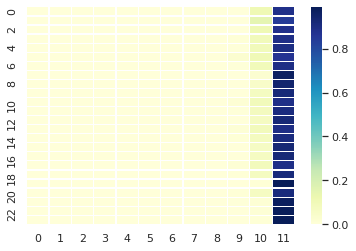

source:  fever along with shivering and cold comes often the third day 
actual:  <sos> कंपकपी एवं जाड़े के साथ प्रायः तीसरे दिन बुखार आता है ।
predicted:  घर तम्बाकू या आये मात्रा के सही मात्रा डालें । <eos>
BLEU Score:  0.19259074009082888


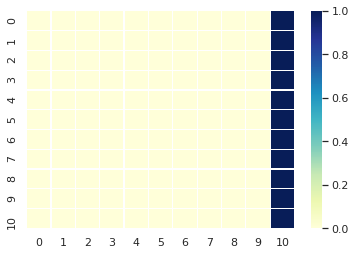

source:  you must change water collected in pots at home once a week 
actual:  <sos> घर के बर्तनों में एकत्रित पानी को सप्ताह में psp एक बार अवश्य बदलें ।
predicted:  घर बुखार समय या रक्त में भरता करनी सकते हैं । <eos>
BLEU Score:  0.18827362913939635


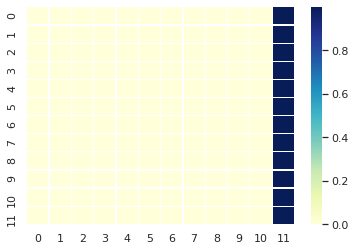

source:  use mosquito nets while sleeping or apply mustard oil on open parts of the body 
actual:  <sos> सोते समय मच्छरदानी प्रयोग करें अथवा सरसों नीम का तेल शरीर के खुले अंगों पर लगायें ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18557819854739144


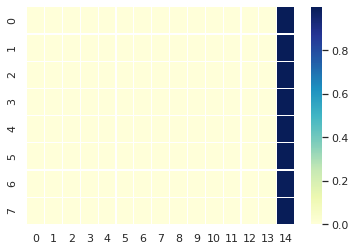

source:  install fine nets on windows of house 
actual:  <sos> घर की खिड़कियों दरवाजों रोशनदानों पर महीन जाली लगवायें ।
predicted:  घर से बी दो रक्त या चकत्तों मल के रक्त व्यक्तियों क्रम द्वारा सर्वाधिक देने पर प्रभावी रहा है । <eos>
BLEU Score:  0.19552795980276136


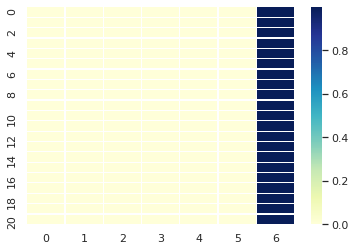

source:  do not let water collect near yourself 
actual:  <sos> अपने आसपास पानी इकट्ठा न होने दें ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया निरन्तर प्रत्येक पर हो न किया गया । <eos>
BLEU Score:  0.23567269439532595


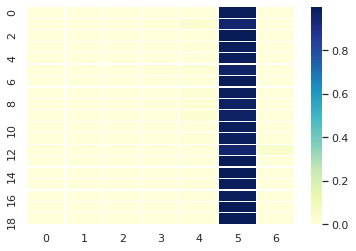

source:  if this is not possible then pour some petrolubricants oil on the collected water 
actual:  <sos> यदि ऐसा संभव न हो तो इकट्ठे पानी पर जले मोबिल डीजल मिट्टी के तेल की कुछ मात्रा डालें ।
predicted:  घर स्वंय तम्बाकू से जटिलताओं का निर्भर विशेष जिला काटता है और गाँठों के प्रभावित कर रखें । <eos>
BLEU Score:  0.21625498394615908


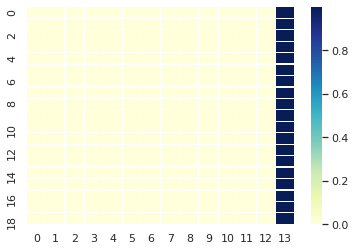

source:  the disease of measles can take a very serious form in developing countries because the death rate due to this is more than  percent 
actual:  <sos> विकासशील देशों में मीजल्स की बीमारी काफी गंभीर रूप ले सकती है  क्योंकि इसके कारण होने वाली मृत्यु दर  प्रतिशत से अधिक है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


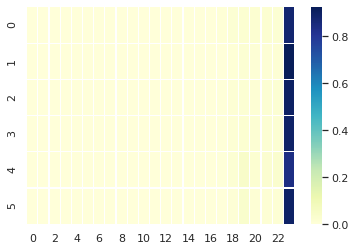

source:  therefore it is recommended to administer its vaccination to the children at the earliest possible 
actual:  <sos> इसलिये जितनी जल्दी हो सके बच्चों को इसका टीका लगवाने की सिफारिश की जाती है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जिससे जलन के रक्त दोनों को मुकाबले में मच्छरों की अपेक्षा काम होता है । <eos>
BLEU Score:  0.18690518620528904


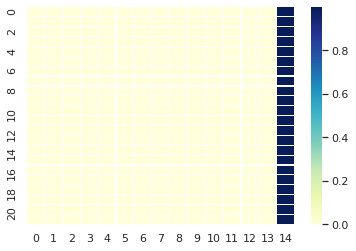

source:  besides the antibody level of mothers and doses of vaccination  considering the incidents of the disease it is recommended by the world health organisation to administer the vaccine of measles to the children at the age of nine months 
actual:  <sos> माँ के एंटीबॉडी स्तर और टीके की खुराक के अलावा  बीमारी की घटनाओं को देखते हुए विश्‍व स्वास्थ्य संगठन द्वारा बच्चों को नौ महीने की उम्र मे मीजल्स का टीका लगवाने की सिफारिश की जाती है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जिससे जलन के लिए चिकित्सक से प्रभावित चाहिए । <eos>
BLEU Score:  0.16552847050375163


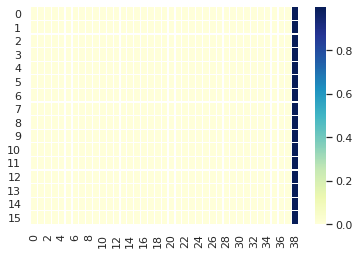

source:  among the indications and symptoms of measles are included  fever  common symptoms of cold  conjunctivitis  cough  stains inside mouths and the red papules erupting on the skin 
actual:  <sos> मीजल्स के संकेतों एवं लक्षणों मे शामिल हैं  बुखार  सर्दी के सामान्य लक्षण  कंजेक्टीवाइटिस  खाँसी  मुँह के अंदर दाग और त्वचा पर निकलने वाले लाल दानें ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी हो जाने के लिए संक्रामक करायी गया । <eos>
BLEU Score:  0.1700626446369399


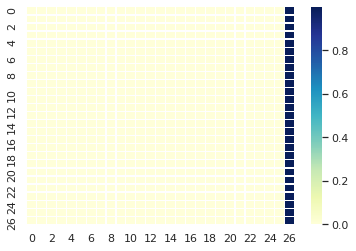

source:  besides this  loose motion  stomach ache and lack of hunger like symptoms may also be show up during the contraction 
actual:  <sos> इसके अलावा  संक्रमण के दौरान दस्त  पेट दर्द और भूख कम हो जाने जैसे लक्षण भी दिखाई दे सकते हैं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.17847260705223245


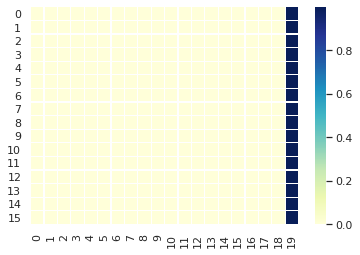

source:  in comparison with children the symptoms of measles shows up more seriously in adolescents  its incubation period is about  days and almost no symptoms of this disease shows up from outside during this period 
actual:  <sos> मीजल्स के लक्षण  बच्चों की तुलना में किशोरों में अधिक गंभीर रूप में दिखाई देते हैं  इसकी उद्‍भवन अवधि  इनक्यूबेशन अवधि  लगभग  से  दिन होती है और इस अवधि के दौरान बाहर से इस बीमारी के लगभग कोई लक्षण दिखाई नहीं देते ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात क्षेत्र में नीचे दिया जाता है । <eos>
BLEU Score:  0.15872114771845316


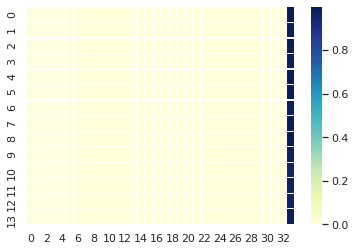

source:  during the period of  to  days  at first a local contraction occurs due to the virus in the breathing passage and then the contagion spreads into other parts of the body as well 
actual:  <sos>  से  दिन की अवधि के दौरान वायरस के कारण सबसे पहले उपरी श्‍वासोच्छवास मार्ग मे स्थानीय  लोकल  संक्रमण हो जाता है और फिर यह संक्रमण शरीर के अन्य हिस्सों मे भी फैल जाता है ।
predicted:  खसरे के समय समय समय समय समय समय समय समय समय समय समय समय समय समय समय प्रजनन जीवन से साफ जटिलताओं का पता लग जायेगा हैं उसे लगभग आँखों में चिकित्सा विभाग के लिए आप टायर से बढ़ता किया जा सकता है । <eos>
BLEU Score:  0.16483717274840187


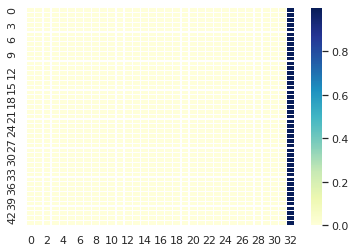

source:  after this having spread through the whole of the blood circulation the virus takes the form of primary disease 
actual:  <sos> इसके बाद यह वायरस पूरे रक्तप्रवाह में फैलकर प्राइमरी बीमारी का रूप ले लेता है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु बिना अधिक अधिक लाता है । <eos>
BLEU Score:  0.18690518620528904


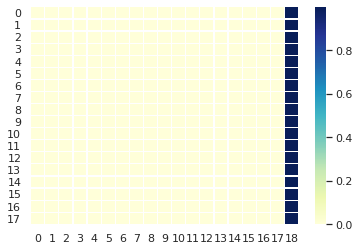

source:  the period between the entrance of the bacteria and the start of the disease 
actual:  <sos> वैक्टीरिया वायरस के प्रवेश और बीमारी के आरंभ के बीच की अवधि ।
predicted:  डायबिटीज से निम्न समस्याएँ एवं जटिलताएँ उत्पन्न हो सकती हैं । <eos>
BLEU Score:  0.19112328397109352


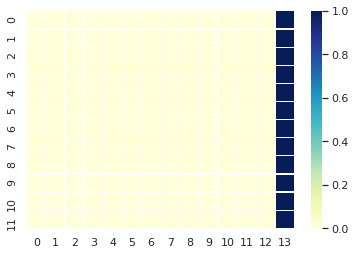

source:  mumps or contagious perotitis is a kind of serious contagious disease in which a swelling emerges in one or both of saliva glands near the jaws and starts paining 
actual:  <sos> मम्पस्  गलसुआ  या संक्रामक पेराटाइटिस एक तरह की गंभीर संक्रामक बीमारी है  जिसमें जबड़े के आसपास मौजूद एक या दोनों लार ग्रंथियों मे सूजन आ जाती है और दर्द होने लगता है ।
predicted:  घर तथा आसपास वातावरण को वातावरण को बढ़ता उभरती है । <eos>
BLEU Score:  0.1985535317274247


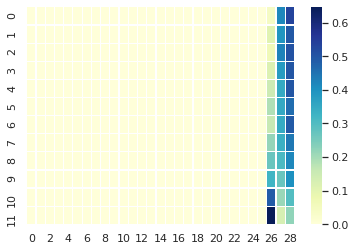

source:  saliva glands are present inside the cheeks in front of the ears and respectively on the lower surface of the mouth 
actual:  <sos> लार ग्रंथियाँ कान के सामने की तरफ गालों के भीतर और क्रमशः मुँह की निचली सतह पर मौजूद होती हैं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


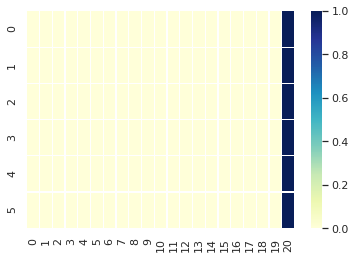

source:  besides this  mouth also starts drying up due to mumps 
actual:  <sos> इसके अलावा  मम्पस बीमारी  के कारण मुँह भी सूखने लगता है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.18968126713037053


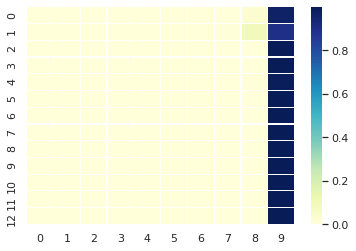

In [40]:
get_prediction(X_test,y_in_test,model)
get_prediction(X_train,y_in_train, model)

In [41]:
_X = pd.read_table('./NLA S20 - Assignment 2 Data/enghin/dev.en', names=['src'])
_Y = pd.read_table('./NLA S20 - Assignment 2 Data/enghin/dev.hi', names=['dest'])
_lines = pd.concat([_X,_Y], axis=1)
print(len(_lines))
_lines.sample(10)

401


,src,dest
139,Laparoscopic method takes double time in compa...,लैपरोस्कोपिक विधि में सामान्य चिकित्सा के मुका...
0,but you will also be safe from eye diseases .,बल्कि आप नेत्ररोगों से भी बचे रहेंगे ।
366,Situated behind popular Himalaya Mall and equi...,लोकप्रिय हिमालय मॉल के पीछे स्थित और वाजिब कीम...
36,Therefore medicines should be taken in the beg...,इसलिए शुरू में औषधियों का सेवन किया जाए और साथ...
400,While roaming in huge airplanes if suddenly on...,बड़े-बड़े हवाईजहाजों में घूमते हुए अचानक आपके सा...
65,Brain exercise works on this very fundamental .,ब्रेन एक्सरसाइज इसी फंडे पर काम करती है ।
46,Staying in this position for a comfortable per...,इस स्थिति में आरामदायक अवधि तक रखकर वापस पूर्व...
209,Tou trains enhance the journey in the tour of ...,दार्जिलिंग की सैर में ट्‍वाय ट्रेनें सफर में च...
141,Key hole surgery ' is a revolutionary inventio...,शल्यचिकित्सा के क्षेत्र में ’ की होल सर्जरी ’ ...
47,Do the same exercise another side also .,यही क्रिया दूसरी तरफ भी करें ।


In [0]:
_X, _y = _lines.src.values, _lines.dest.values 

source:  but you will also be safe from eye diseases .
actual:  बल्कि आप नेत्ररोगों से भी बचे रहेंगे ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.19817632389021378


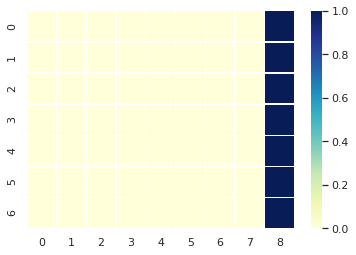

source:  The chairperson of the Department of Ophthalmology of Liverpool University Dr . Ian Greerson says .
actual:  लिवरपूल यूनिवर्सिटी के आप्थैमोलॉजी विभाग के अध्यक्ष व विख्यात नेत्ररोग शोधकर्ता डॉ. इयान ग्रीयरसन कहते हैं ।
predicted:  ईएजी कार्यक्रम के सामने साफ लग सकता है । <eos>
BLEU Score:  0.18557819854739144


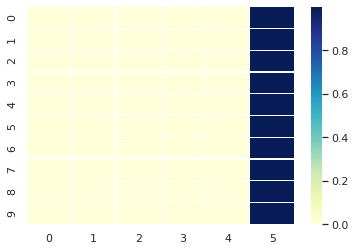

source:  Common blindness causing diseases like cataract and glaucoma can be prevented by increasing the amount of vitamin-C and omega-3 oils and some special plants in diet .
actual:  कि खाने में विटामिन-सी और ओमेगा-3 तेलों व कुछ विशेष पौधों की मात्रा बढ़ाने से आमतौर पर अंधेपन का कारण बनने वाले मोतियाबिंद व ग्लूकोमा जैसे रोगों से बचा जा सकता है ।
predicted:  घर तथा आसपास वातावरण को वातावरण में पानी को साफ लग सकता है । <eos>
BLEU Score:  0.22275423336274477


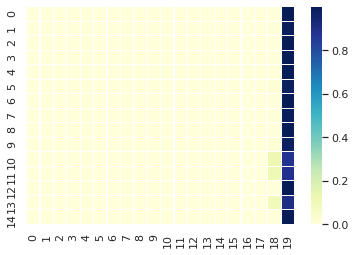

source:  So let us know how your diet should be to keep eyes healthy .
actual:  तो आइए जानते है कि नजर को स्वस्थ बनाए रखने के लिए कैसा हो आपका आहार ।
predicted:  घर स्वंय प्रकार के बचाव या पास लाता है । <eos>
BLEU Score:  0.18557819854739144


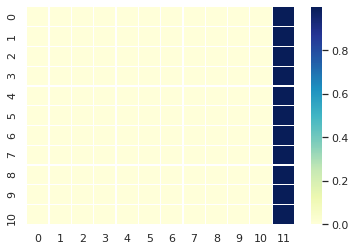

source:  You should include green vegetables in your diet to keep eyes sharp .
actual:  नजर तेज बनी रहे , इसके लिए आपको चाहिए की अपने आहार में आप हरी सब्जियाँ शामिल करें ।
predicted:  घर से नजदीक पर लग सकता । <eos>
BLEU Score:  0.18305025818318518


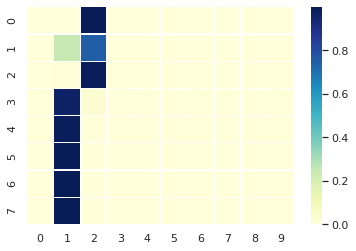

source:  Eating spinach , broccoli , germinated grains may be beneficial in this regard .
actual:  पालक , ब्रोकोली , अंकुरित अनाज खाना इस लिहाज से फायदेमंद साबित हो सकता है ।
predicted:  कैंसर के काटने के पश्‍चात मुख्यालय लगवाने को देखने के दर्द होने व नीचे दिया जा रहा है । <eos>
BLEU Score:  0.18690518620528904


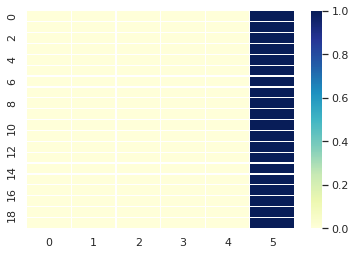

source:  There are two important elements like lutein , zeaxanthin which are responsible to keep vision sharp .
actual:  इसमें ल्यूटिन , जीजेनथिन जैसे दो अहम तत्व होते हैं , जो नजर को तेज बनाए रखने के लिए जिम्मेदार होते हैं ।
predicted:  घर बुखार या क्षति सर्वाधिक प्रभावी जो अकसर चकत्तों के रक्त सर्वाधिक बढ़ जाता है । <eos>
BLEU Score:  0.17847260705223245


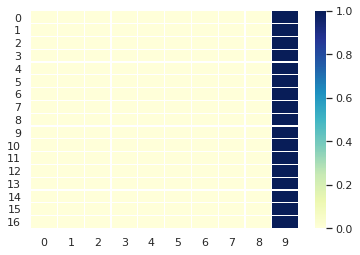

source:  This has been testified in the six-year study by the American National Eye Institute that this element saves old people from blindness .
actual:  अमेरिकी नेशनल आई इंस्टीट्यूट के 6 साल के अध्ययन में यह साबित हुआ है कि यह तत्व बुजुर्गों को अंधेपन से बचाते हैं ।
predicted:  पूरी आस्तीन से स्वंय परीक्षण के पास पपीता आम तरल । <eos>
BLEU Score:  0.17741926041310546


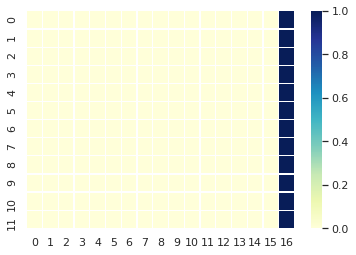

source:  Therefore everybody should eat hundred grams of green vegetables in the form of salad .
actual:  अमेरिकी नेशनल आई इंस्टीट्यूट के 6 साल के अध्ययन में यह साबित हुआ है कि यह तत्व बुजुर्गों को अंधेपन से बचाते हैं ।
predicted:  कैंसर के बाद हर्निया दुबारा न rpneg हो जाती है । <eos>
BLEU Score:  0.17741926041310546


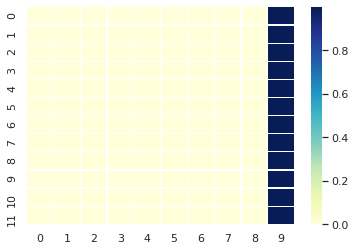

source:  You must eat two or three eggs daily in breakfast .
actual:  नाश्ते में रोज दो या तीन अंडे जरूर खाएँ ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त है । <eos>
BLEU Score:  0.19552795980276136


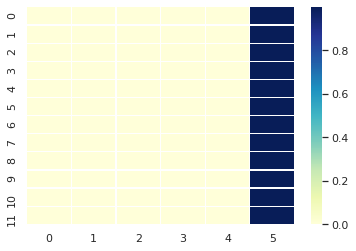

source:  Bilberry or blackberry anthocyanin saves from blindness or cataract .
actual:  बिलबैरी या ब्लैकबैरी एंथोसाइनिन अंधेपन या मोतियाबिंद से बचाती है ।
predicted:  तकलीफ अधिक स्थिति मीजल्स है । <eos>
BLEU Score:  0.1940679506664638


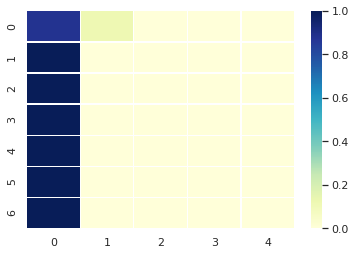

source:  It is also found in the research that it strengthens the cell which brings blood and nutritious elements into the eyes .
actual:  शोध में यह भी पाया गया है कि यह आँखों में खून और पोषक तत्व पहुँचाने वाली कोशिकाओं को मजबूत बनाती हैं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17847260705223245


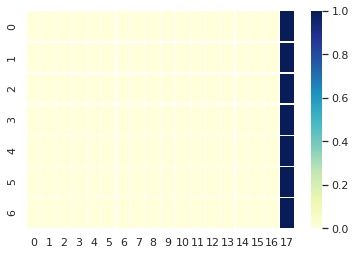

source:  That is why you can also eat bilberry or blackberry in breakfast or with fruit salad .
actual:  इसलिए नाश्ते या फ्रूट सलाद के साथ आप बिलबैरी या ब्लैकबैरी भी खा सकते हैं ।
predicted:  कैंसर में आसपास वातावरण में चिकित्सा विभाग के कारण लगभग से तरह से ठीक उन्हें वर्ष में अधिक कैंसर व बाद ताजे जाता है । <eos>
BLEU Score:  0.18690518620528904


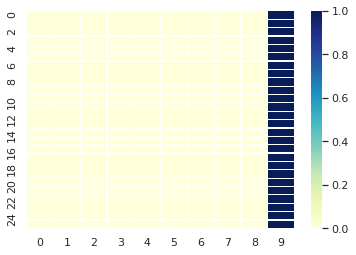

source:  There is no better solution but to eat fish for keeping eyes healthy if you are a non-vegetarian .
actual:  अगर आप मांसाहारी हैं तो आँखों को स्वस्थ बनाए रखने के लिए मछली का सेवन करने से अच्छा कोई उपाय नहीं ।
predicted:  घर स्वंय परिवार कल्याण कार्यक्रम के वायरल निम्न प्रकार के प्रभावित चाहिए । <eos>
BLEU Score:  0.17956076853248887


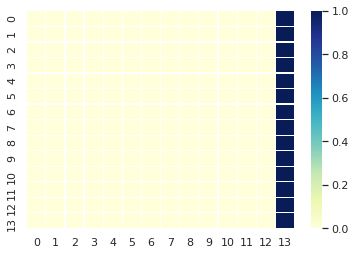

source:  By eating fish not only your skin , hair , brain remain healthy but eyes also sharpen .
actual:  मछली खाने से न केवल आपकी त्वचा , बाल , दिमाग स्वस्थ रहता बल्कि नजर भी तेज होती है ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य में लिए चिकित्सक से लग सकता है कि यहाँ ट्यूमर है या नहीं हो सकती है । <eos>
BLEU Score:  0.21625498394615908


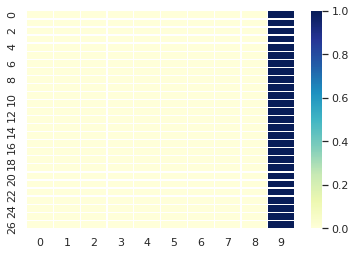

source:  Omega-3 fat found in fish decreases the danger of glaucoma and weak eyes in old age .
actual:  मछली में पाया जाने वाला ओमगा-3 फैट आँखों को ग्लूकोमा और बुढ़ापे में नजर कमजोर होने का खतरा कम करता है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा किया गया । <eos>
BLEU Score:  0.17956076853248887


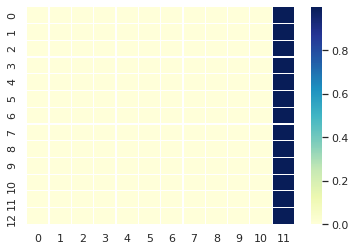

source:  Not only this , it saves you from dry eye syndrome .
actual:  यही नहीं , यह आपको ड्राय आई सिंड्रोम से बचाता है ।
predicted:  आरसीएच किट भारत सरकार में जन्मे को के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.19259074009082888


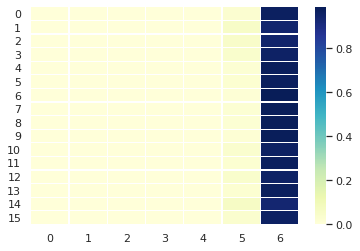

source:  It is stated in another study that women suffering from ophthalmic problems such as dry eye syndrome can decrease this problem up to 68 percent by eating tuna fish .
actual:  एक अन्य अध्ययन में बताया गया है कि ड्राय आई सिंड्रोम जैसे नेत्र समस्या से परेशान महिलाएँ हफ्ते में पाँच बार ट्यूना मछली खाकर , इस तकलीफ को 68 फीसदी कम कर सकती हैं ।
predicted:  इसके अलावा लक्षण रोगियों को पश्‍चात करता है । <eos>
BLEU Score:  0.1677077171881632


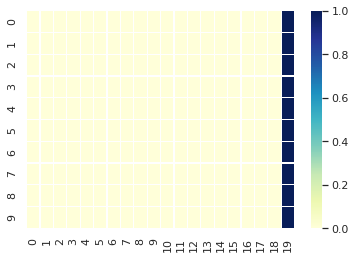

source:  The use of dry fruits etcetera in Indian cuisines has been continuing for centuries .
actual:  भारतीय व्यंजनों में मेवे आदि का इस्तेमाल सदियों से होता आ रहा है ।
predicted:  डायबिटीज से निम्न समस्याएँ एवं ग्रामीण से जटिलताओं का खतरा होने से लगाने के रक्त नहीं है । <eos>
BLEU Score:  0.18968126713037053


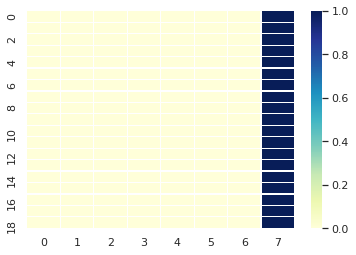

source:  But do you know that all the dry fruits such as almond , cashew nut , walnut , raisins etcetera are also very beneficial for eyes besides being nutritious .
actual:  लेकिन क्या आप जानते हैं कि बादाम , काजू , अखरोट , किशमिश आदि यह सारे मेवे पौष्टिक होने के अलावा आँखों के लिए भी बहुत फायदेमंद होते हैं ।
predicted:  कैंसर के बाद चमड़ी के सम्बन्ध में उपरोक्त तेज पूरी आस्तीन का कपड़ा आये निकाल तो रोग नहीं कमजोरी थकान बुखार पहनायें । <eos>
BLEU Score:  0.1717430532243771


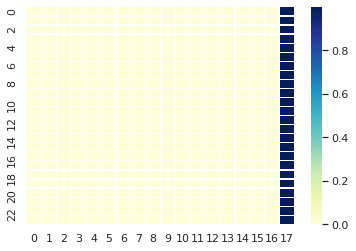

source:  Plenty of vitamin-B is found in these , which not only saves from cataract , many kind of blindness and other eye diseases but also protect eyes from the harms of ultraviolet rays .
actual:  इनमें विटामिन ई प्रचुर मात्रा में पाया जाता है , जो न केवल मोतियाबिंद , कई प्रकार के अंधेपन और अन्य नेत्र रोगों से बचाने के अलावा पराबैंगनी किरणों से पहुँच रहे नुकसान से भी आँखों की रक्षा करता है ।
predicted:  पूरी आस्तीन समय व पश्‍चात क्षेत्र में परिवर्तन के जिला लाख व मदद सकती है । <eos>
BLEU Score:  0.1944387569440379


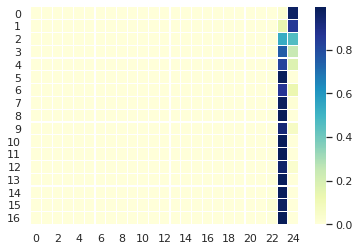

source:  Start eating pieces of dry fruits in sweets daily at the time of breakfast or meals .
actual:  रोज नाश्ते या खाने के समय मीठे में मेवे की कतरन बुरक के खाना शुरू कर दें ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18429333166740366


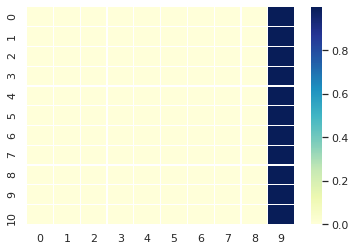

source:  Whether it is about dropping weight or care of skin , the advice of fresh fruits in meals is given in all the cases .
actual:  बात वजन घटाने की हो या त्वचा की देखभाल की , खाने में ताजे फल खाने की सलाह सभी मामलों में दी जाती है ।
predicted:  पूरी आस्तीन से स्वंय परीक्षण या उसके अजन्में या नवजात शिशु लगता है । <eos>
BLEU Score:  0.17639910709395284


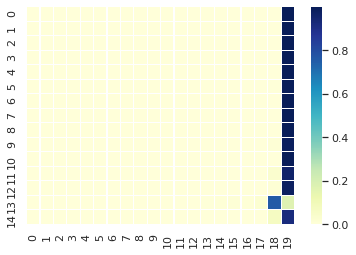

source:  So , why should it be left for eyes .
actual:  तो भला , आँखों के लिए क्यों इन्हें छोड़ा जाए ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1940679506664638


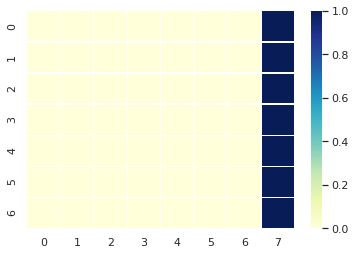

source:  The danger of glaucoma , cataract , and blindness can be decreased to a great extent by taking diet rich in vitamin-C .
actual:  विटामिन-सी से भरपूर आहार लेने से ग्लूकोमा , मोतियाबिंद और अंधेपन का खतरा काफी हद तक कम किया जा सकता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन या मल के काटता है । <eos>
BLEU Score:  0.17956076853248887


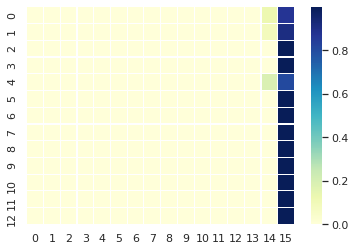

source:  Including fruit , vegetable in meal is enough to maintain the eyes healthy .
actual:  आँखों को स्वस्थ बनाए रखने के लिए आहार में फल सब्जियाँ शामिल करना काफी है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18690518620528904


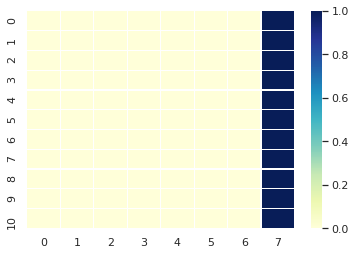

source:  Including these things in your diet you can save your eyes from getting weakened .
actual:  इन्ही चीजों को अपने आहार में शामिल कर आप आँखों को कमजोर होने से बचा सकते हैं ।
predicted:  घर में कूलर टीन जटिलताओं का खतरा होने को रूप से प्रभावित करता है । <eos>
BLEU Score:  0.18429333166740366


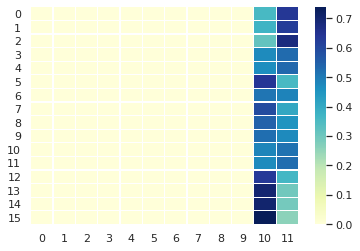

source:  Besides this drinking milk , eating carrot is also proved to be beneficial .
actual:  इसके अलावा दूध पीना , गाजर खाना भी फायदेमंद साबित होता है ।
predicted:  घर बुखार समय या व्यक्ति को आये लग जायेगा <eos>
BLEU Score:  0


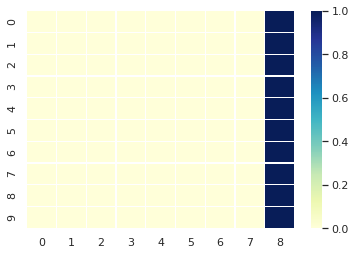

source:  Taking diet rich in vitamin-A can also be helpful in keeping eyes healthy .
actual:  विटामिन-ए से भरपूर आहार लेना भी आँखों को स्वस्थ बनाए रखने में मददगार साबित हो सकता है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक नही और किया गया तो स्तन होना । <eos>
BLEU Score:  0.18429333166740366


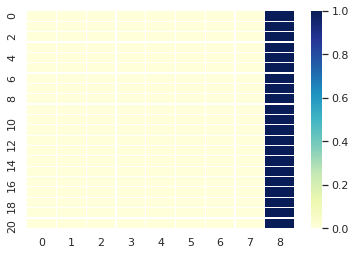

source:  A little care taken in diet may also put new life in your eyes .
actual:  खान-पान में बरती गई थोड़ी सी सावधानी भी आपकी आँखों में नई जान डाल सकती है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है और यह रोग है । <eos>
BLEU Score:  0.18557819854739144


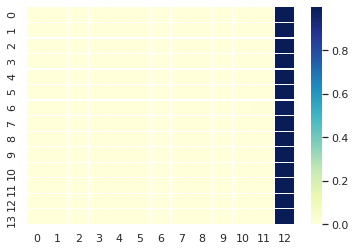

source:  Paralysis may be controlled by yoga .
actual:  योग से काबू हो सकता है लकवा ।
predicted:  घर अथवा मच्छररोधी अगरबत्ती का सर्वाधिक पक्षाघात और रक्त है । <eos>
BLEU Score:  0.19817632389021378


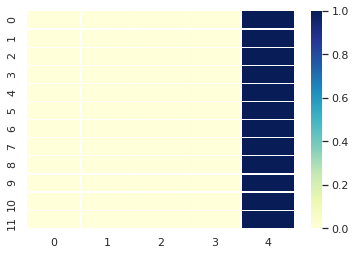

source:  Paralysis - when generally the functionalism , and dynamism of muscles and pulse of the right or left side of the body go less or end this problem is said to be paralysis .
actual:  पक्षाघात - आमतौर पर शरीर के दाएँ या बाएँ भाग की मांसपेशियों व नसों की क्रियाशीलता एवं गतिशीलता कम या समाप्त हो जाती है तो इस समस्या को लकवा या पक्षाघात कहते हैं ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी उन्हें महिला से साफ गर्भनिरोधक की विधियों का उपयोग चाहिए । <eos>
BLEU Score:  0.20034805972722955


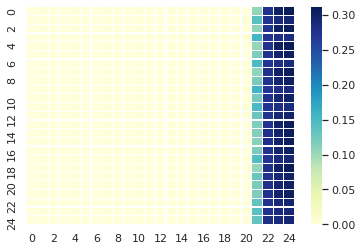

source:  Paralysis is limited to half of the body , whole of the body or only till face .
actual:  पक्षाघात आधे शरीर , संपूर्ण शरीर या केवल चेहरे तक होता है ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.19112328397109352


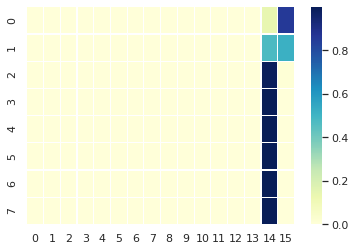

source:  The main reason of this problem is increasing high blood pressure , blood clotting in brain , the situation of extreme happiness or sorrow etc .
actual:  इस समस्या का प्रमुख कारण उच्च रक्तचाप का अधिक बढ़ना , मस्तिष्क में रक्त का थक्का बनना अत्यंत हर्ष या विषाद की स्थिति आदि है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का माह व यह प्रभावित हो सकता है । <eos>
BLEU Score:  0.17541056564995905


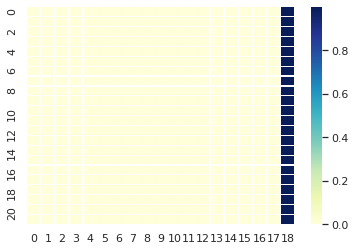

source:  By yogic exercise this disease can be overcome surely .
actual:  यौगिक अभ्यास से इस रोग पर निश्‍चित ही विजय प्राप्त की जा सकती है ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा लिंग के बनाता है । <eos>
BLEU Score:  0.18827362913939635


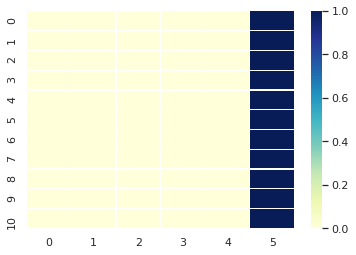

source:  Although yoga solves the problem of paralysis permanently but it takes time and is tough .
actual:  हालांकि योग पक्षाघात की समस्या का स्थायी समाधान करता है , लेकिन यह समय लेता है एवं श्रमसाध्य है ।
predicted:  घर स्वंय पहले रक्त सर्वाधिक महत्वपूर्ण होता है । <eos>
BLEU Score:  0.18184804078107475


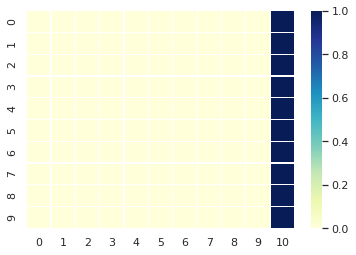

source:  Therefore medicines should be taken in the beginning and yoga exercises should be done along .
actual:  इसलिए शुरू में औषधियों का सेवन किया जाए और साथ में योग का अभ्यास किया जाए ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18557819854739144


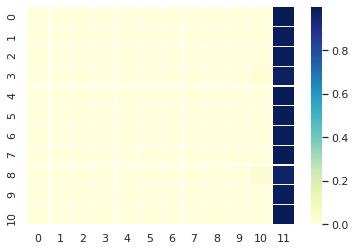

source:  Here the main yogic diagnosis for paralysis are presented .
actual:  यहाँ पर पक्षाघात हेतु प्रमुख यौगिक निदान प्रस्तुत हैं ।
predicted:  डायबिटीज से बी दो निम्न शर्करा ग्लूकोज के ही कम हो । <eos>
BLEU Score:  0.19552795980276136


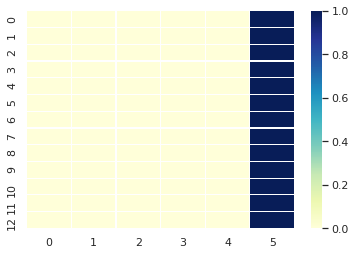

source:  Start with light exercise .
actual:  प्रारंभ सूक्ष्म व्यायाम से करो ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19953087735062713


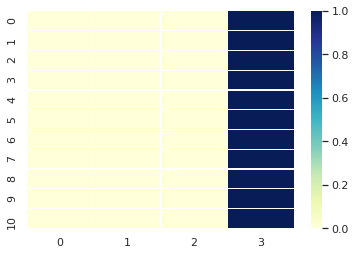

source:  This can be practiced only by lying down .
actual:  इसका अभ्यास लेट कर ही किया जा सकता है ।
predicted:  आरसीएच किट रक्त सर्वाधिक बढ़ जाने कर लगाने के रक्त सर्वाधिक देने पर प्रभावी रहा है । <eos>
BLEU Score:  0.19552795980276136


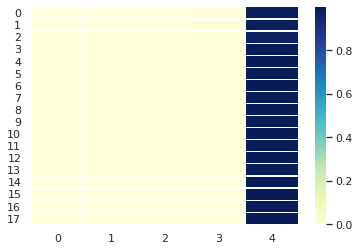

source:  After that as the situation improves , add Pavanmuktasana , Vajrasana , Shashankasana , Makarasana etcetera in practice .
actual:  उसके बाद जैसे-जैसे स्थिति सुधरती जाए , अभ्यास में पवनमुक्तासन , वज्रासन , शशांकासन , मकरासन आदि जोड़ लें ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग रूप से परत करवाना किया गया । <eos>
BLEU Score:  0.18184804078107475


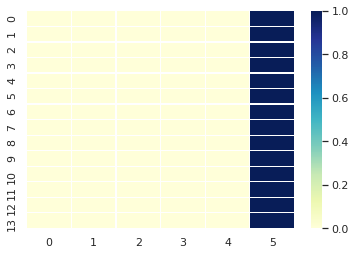

source:  What is onikomysis .
actual:  ओनिकोमाइसिस क्या हैं ?
predicted:  तिल या निकलने वाले नही वर्ष और सेवा टीकाकरण करवाना सकती <eos>
BLEU Score:  0


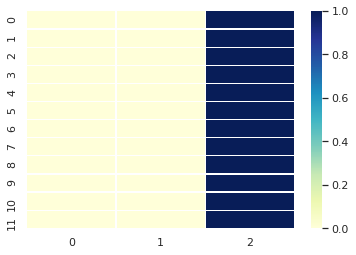

source:  Add Suptvajrasana , Trikonasana , Uttanpadasana , Gomukhasana and Ardhmatsyendrasana etc .
actual:  जब स्थिति और सुधर जाए तो अभ्यास में जानुशिरासन , सुप्तवज्रासन , त्रिकोणासन , उत्तानपादासन , गोमुखासन तथा अर्धमत्स्येंद्रासन आदि को जोड़ लें ।
predicted:  वर्ष के टीके के वायरल निम्न डिब्बों है । <eos>
BLEU Score:  0.17741926041310546


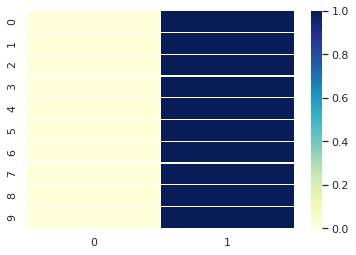

source:  Here the method of practice of Janushirasana is presented - sit stretching both the legs forward .
actual:  यहाँ पर जानुशिरासन के अभ्यास की विधि प्रस्तुत है - दोनों पैरों को सामने की ओर फैलाकर बैठ जाएँ ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र बढ़ता कि रोग नहीं होता । <eos>
BLEU Score:  0.18184804078107475


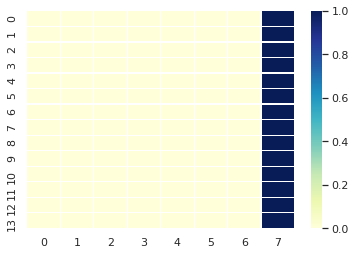

source:  Bending the right leg from the knee touch its sole to the left leg and put the heel below the genitals .
actual:  दाएँ पैर को घुटने से मोड़कर इसके तलवे का बाएँ पैर की जंघा से सटा दें तथा एड़ी जननेंद्रिय के नीचे रखें ।
predicted:  घर बुखार समय या रक्त में टायर वातावरण को प्रा०स्वा०केन्द्र में उपचार लें । <eos>
BLEU Score:  0.17847260705223245


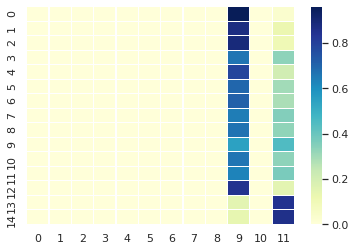

source:  Bringing both the hands to the forefoot of the left leg bend forward so much that the head touches the ground .
actual:  दोनों हाथों को बाएँ पैर के पंजे के पास ले जाते हुए आगे की ओर इतना झुकें कि सिर जमीन को स्पर्श करे ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त सर्वाधिक प्रभावी और पक्षाघात से पायी जाना चाहिए । <eos>
BLEU Score:  0.17741926041310546


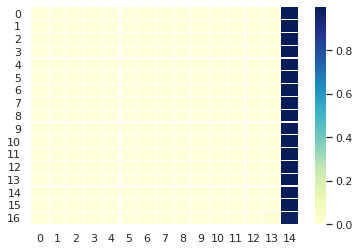

source:  Staying in this position for a comfortable period come back to the previous state .
actual:  इस स्थिति में आरामदायक अवधि तक रखकर वापस पूर्व स्थिति में आएँ ।
predicted:  कैंसर के बाद हमें निर्भर विशेष कार्य कर सकता है । <eos>
BLEU Score:  0.19112328397109352


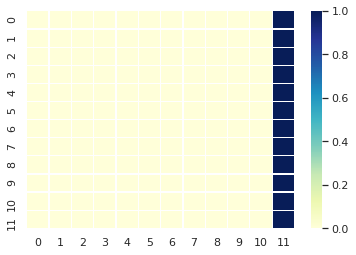

source:  Do the same exercise another side also .
actual:  यही क्रिया दूसरी तरफ भी करें ।
predicted:  घर बुखार समय या रूप से लेना चाहिए । <eos>
BLEU Score:  0.19913749124569236


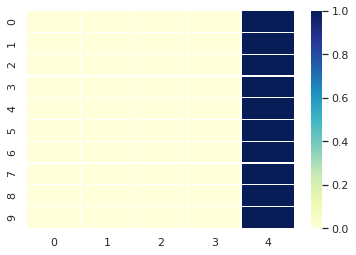

source:  The patients of sciatica and slip disk should avoid its practice .
actual:  साइटिका एवं स्लिप डिस्क के रोगी इसका अभ्यास न करें ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.2307869877265558


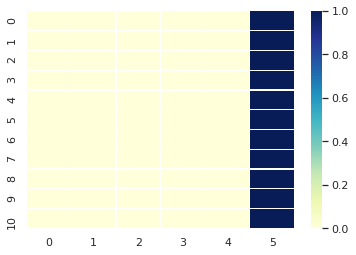

source:  Narishodhan and ujjayi pranayam play the role of panacea to make brain and central nervous system functional and to balance and function to the nervous system .
actual:  मस्तिष्क तथा केन्द्रीय तांत्रिक तंत्र को क्रियाशीलता एवं तंत्रिका तंत्र को क्रियाशील एवं संतुलित करने के लिए नाड़ीशोधन तथा उज्जायी प्राणायाम रामबाण की भूमिका निभाते हैं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


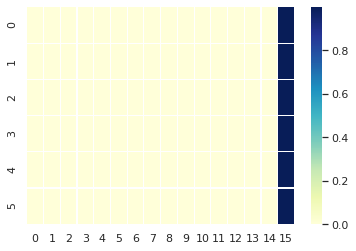

source:  Do its practice under the eligible guide according to your capacity without kumbhak or holding of breath .
actual:  बिनाRP_NEG\ कंभुक के इनका अभ्यास योग्य मार्गदर्शन में अपनी क्षमतानुसार करें ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.19259074009082888


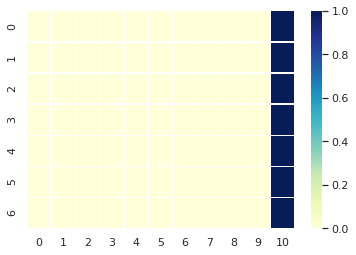

source:  Yoganidra - the main cause of this problem is mental tension and sentimental imbalance .
actual:  योगनिद्रा - इस समस्या का मूल कारण मानसिक तनाव तथा भावनात्मक असंतुलन है ।
predicted:  डायबिटीज से बी दो रक्त या प्रभावित चाहिए । <eos>
BLEU Score:  0.18968126713037053


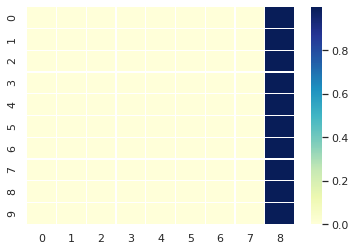

source:  Meditation is the best way to free mind from all worries , sorrows , pains , grief and fears .
actual:  मन को सारी चिंता , दुख , कष्ट तथा शोक एवं भय से मुक्त करने के लिए ध्यान सर्वश्रेष्ठ तकनीक है ।
predicted:  प्रजनन एवं बाल स्थास्थ कार्यक्रम के सम्बन्ध में उपरोक्त या रूप से पूरी जाँच कराना । <eos>
BLEU Score:  0.17956076853248887


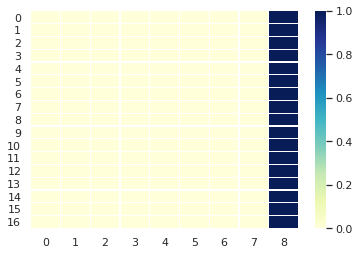

source:  Do practice this daily for ten to twenty minutes .
actual:  प्रतिदिन दस से बीस मिनट तक इसका अभ्यास अवश्य करें ।
predicted:  घर बुखार या प्रभावित चाहिए । <eos>
BLEU Score:  0.1940679506664638


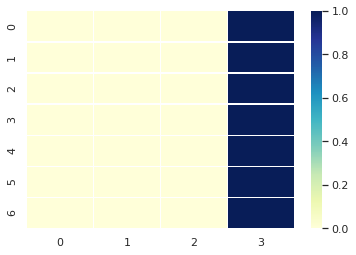

source:  Eat simple , easily digestible , nutritious food , eat bread of braned flour , old rice , porridge , pulse of green lentil , take fruits and green vegetables .
actual:  सादा , सुपाच्य , पौष्टिक आहार खाएँ , चोकरयुक्त आटे की रोटी , पुराना चावल , दलिया , मूंग की दाल खाएँ फल तथा हरी सब्जियों का सेवन करें ।
predicted:  पूरी किसी महिला के बाद कन्जानाईटल रेटिना के रेटिना के आगे या रेटिना के रेटिना के रेटिना के आगे या रेटिना के रेटिना के रेटिना के रेटिना के आगे या रेटिना के रोका जा सकता है । <eos>
BLEU Score:  0.1717430532243771


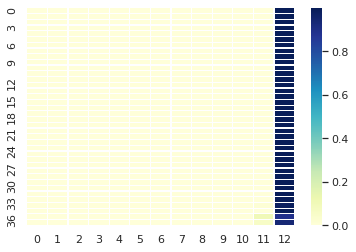

source:  Avoid heavy , hard to digest , tea , coffee , tobacco , intoxicating things and exciting element .
actual:  भारी , गरिष्ठ , चाय , काफी , तंबाकू , नशीले पदार्थ व उत्तेजक पदार्थों से परहेज करें ।
predicted:  घर से उक्त मच्छररोधी मात्रा में रेटिना के आगे या सही शिथिल । <eos>
BLEU Score:  0.18305025818318518


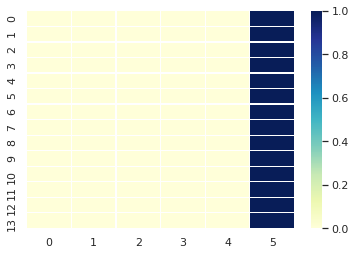

source:  Avoid citrus food item .
actual:  खट्टी चीजों के सेवन से बचें ।
predicted:  मलाशय के जलाया जाता है । <eos>
BLEU Score:  0.19913749124569236


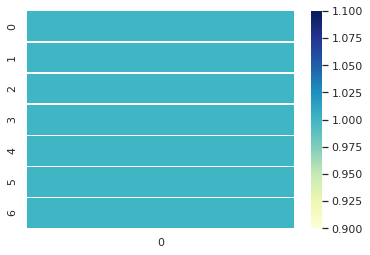

source:  Apply the walnut oil into the nostrils of the nose daily .
actual:  नाक के नथुनों में रोज सुबह-शाम अखरोट का तेल लगाएँ ।
predicted:  लेकिन पैरों की अंगुलियों में यह सुरक्षा का सर्वाधिक कर चकत्तों के रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.1940679506664638


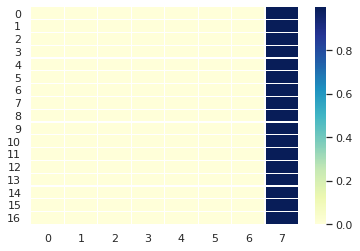

source:  Rub the body from top to bottom with furred towel after bathing .
actual:  स्नान के बाद रोएँदार तौलिये से शरीर को ऊपर से नीचे की ओर रगडें ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र पूरी बीमारी होने या चकत्तों के रक्त है । <eos>
BLEU Score:  0.18827362913939635


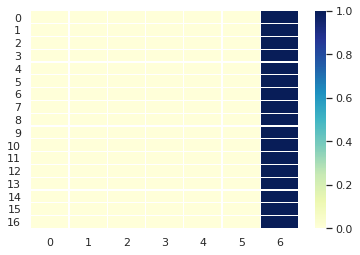

source:  Use warm water for bathing .
actual:  नहाने के लिए गर्म जल का प्रयोग करें ।
predicted:  कीटनाशक दवाओं के रूप से प्रा०स्वा०केन्द्र में परिवर्तन पर करना । <eos>
BLEU Score:  0.1969244213551724


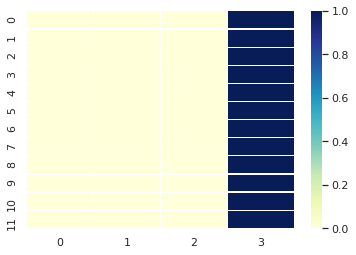

source:  The rising interference of technology in day-to-day life has made us very luxurious .
actual:  रोजमर्रा की जिंदगी में तकनीक के बढ़ते दखल ने हमें बेहद आरामतलब बना दिया है ।
predicted:  राज्य में प्रत्येक ग्रामसभा स्वास्थ्य कार्यकर्मी द्वारा बार वर्ष में मदद करें । <eos>
BLEU Score:  0.18690518620528904


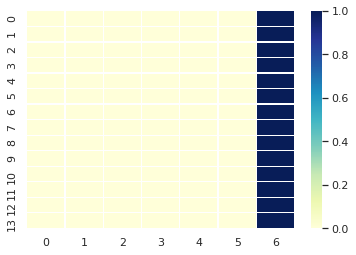

source:  Though life has become easy with mobile phone , internet but it also has harms .
actual:  मोबाइल फोन , इंटरनेट से जिंदगी आसान तो हुई है लेकिन इसके नुकसान भी हैं ।
predicted:  डायबिटीज से निम्न समस्याएँ एवं ग्रामीण शर्करा ग्लूकोज के प्रभावित हो बन्द कम किया गया । <eos>
BLEU Score:  0.18690518620528904


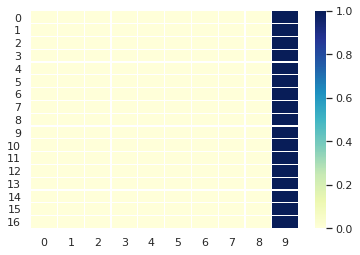

source:  Why would anyone want to bother his mind when a piece of information or a secret is just a click away .
actual:  कोई सूचना या रहस्य यदि एक क्लिक की दूरी पर हो , तो कोई क्यों अपने दिमाग को कष्ट देना चाहेगा ।
predicted:  घर स्वंय पहले रक्त सर्वाधिक निम्न मम्पस व्यक्ति के साथ चकत्तों होने टीकाकरण हो बन्द बढ़ गया है । <eos>
BLEU Score:  0.17956076853248887


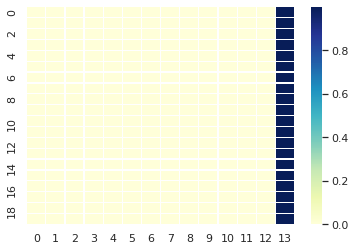

source:  But later these habits can have lethal impact specially on the capacity of the brain to remember .
actual:  लेकिन आगे चलकर ये आदतें विशेष रूप से मस्तिष्क की याद रखने की क्षमता पर घातक असर डाल सकती हैं ।
predicted:  कैंसर के काटने के पश्‍चात होता है । <eos>
BLEU Score:  0.18068537884315472


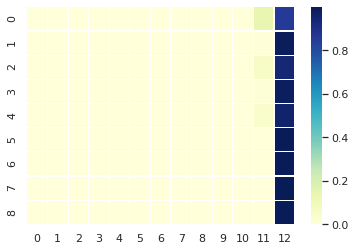

source:  The more you use your brain the more capable it will be .
actual:  दिमाग का जितना ज्यादा इस्तेमाल करेंगे वह उतना ही तेज और सक्षम बनेगा ।
predicted:  राज्य के वयस्कों के लिए मिली को परिवार का मलाशय के कारण उभरती है । <eos>
BLEU Score:  0.18968126713037053


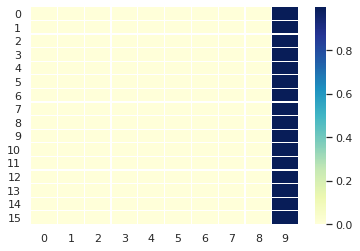

source:  Brain exercise works on this very fundamental .
actual:  ब्रेन एक्सरसाइज इसी फंडे पर काम करती है ।
predicted:  घर बुखार समय या होने से जटिलताओं है । <eos>
BLEU Score:  0.1969244213551724


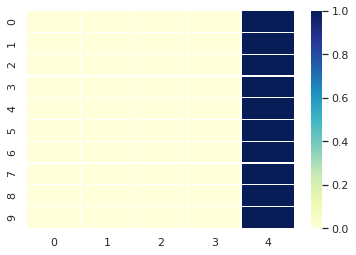

source:  If daily common work is done in a little different way then all those parts of your brain that was not being used at all earlier would start becoming active .
actual:  रोज का सामान्य काम जरा सा हटके किया जाए तो आपके दिमाग का हर वह हिस्सा सक्रिय होने लगेगा जिसका पहले इस्तेमाल ही नहीं किया जा रहा था ।
predicted:  घर में टीके की रोग के निकलती है और कारण ऐसे पूरी बाँह का कैंसर रोगों के प्रभावित कर करना । <eos>
BLEU Score:  0.17261970532895454


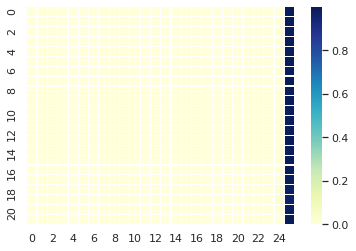

source:  Changing clothes while keeping the eyes closed , learning a new subject or new game .
actual:  आँखें बंद करके कपड़े बदलना , कोई नया विषय या नया खेल सीखना ।
predicted:  घर स्वंय पहले पपड़ी गुर्दों सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18968126713037053


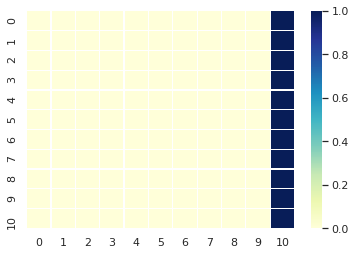

source:  Adopting methods like switching on electricity by the left hand instead of the right hand we can open the closed windows of the brain .
actual:  बिजली का स्विच आन करने जैसे काम के लिए सीधे हाथ के बजाय उलटे हाथ का प्रयोग करना जैसे तरीके अपनाकर दिमाग की बंद खिड़कियों को खोल सकते हैं ।
predicted:  कैंसर के साफ क्षमता साफ पानी को काटता है और बनाता है । <eos>
BLEU Score:  0.1717430532243771


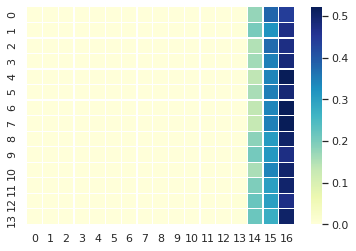

source:  A thing is remembered for a long time only when attention is paid to it .
actual:  कोई बात तभी लंबे समय तक याद रहती है जब उस पर ध्यान दिया जाए ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18690518620528904


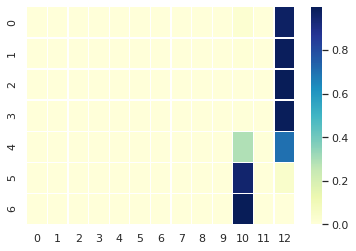

source:  Read attentively whatever is to be remembered , and before going forward concentrate up to eight seconds .
actual:  जो भी याद रखना है उसे गौर से पढ़ें और आगे बढ़ने से पहले आठ सेकेंड तक ध्यान केन्द्रित करें ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.18068537884315472


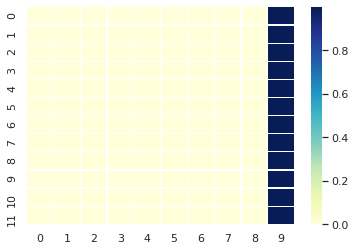

source:  See then how a thing is not remembered .
actual:  फिर भी चीज कैसे याद नहीं रहती ।
predicted:  घर बुखार या प्रभावित अंगों में खराबी हो सकती है । <eos>
BLEU Score:  0.19817632389021378


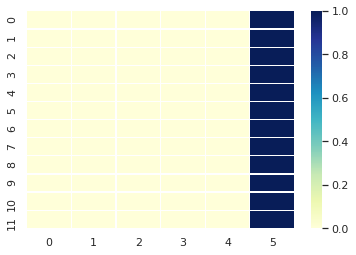

source:  Everybody has his own way to remember or learn anything .
actual:  कोई भी चीज याद रखने या सीखने का हर किसी का अपना तरीका होता है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.18690518620528904


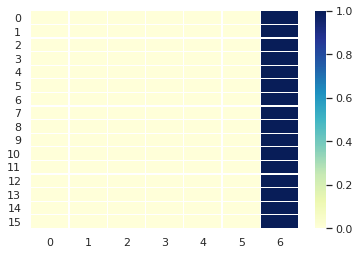

source:  Some people are better visual learners .
actual:  कुछ लोग बेहतर विजुअल लर्नर होते हैं ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती है । <eos>
BLEU Score:  0.19817632389021378


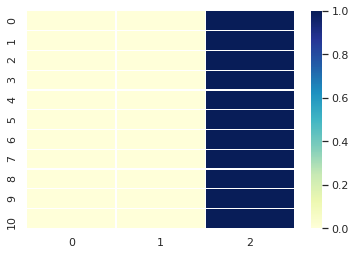

source:  These are the people who learn something after watching or reading .
actual:  यह वे लोग होते हैं जो किसी चीज को देखकर या पढ़कर सीखते हैं ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक चाहिए बन्द कम कि यहाँ ट्यूमर है । <eos>
BLEU Score:  0.18827362913939635


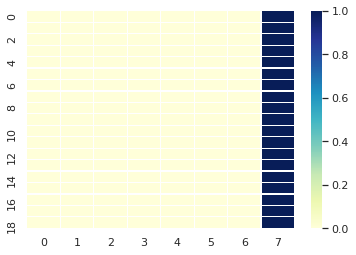

source:  At the same time some people are better audio learner who learn after listening .
actual:  वहीं कुछ लोग बेहतर आडियो लर्नर होते हैं जो सुनकर सीखते हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19112328397109352


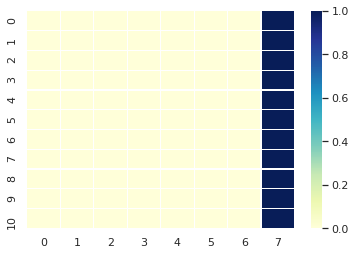

source:  Which method is convenient for you ?
actual:  आपके लिए कौन सा तरीका सुविधाजनक है ।
predicted:  डायबिटीज रोग से ग्रसित एवं उपलब्ध कराने या चकत्तों के पुराने कम किया गया । <eos>
BLEU Score:  0.19817632389021378


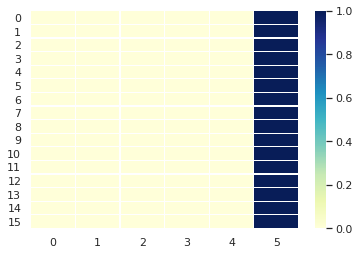

source:  Identify that and use the same to remember .
actual:  इसे पहचाने और याद रखने के लिए उसी का इस्तेमाल करें ।
predicted:  कैंसर के कारण जाना जाता है और यह रोग नहीं होता । <eos>
BLEU Score:  0.19259074009082888


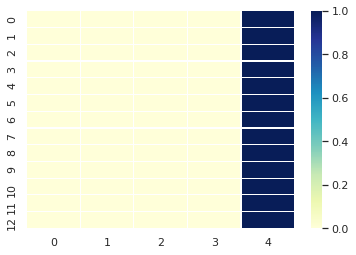

source:  May be you are a visual learner but to remember read aloud .
actual:  चाहे आप विजुअल लर्नर ही क्यों न हो याद रखने के लिए बोल कर पढ़ें ।
predicted:  घर से बी दो रक्त या चकत्तों मल के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.22226897726623815


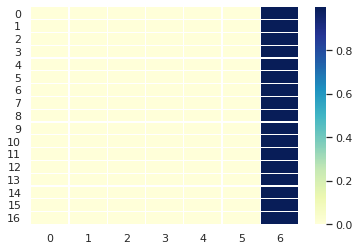

source:  It will be better if you try to remember as a poem .
actual:  कविता की तरह याद करने की कोशिश करेंगे तो और भी अच्छा होगा ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18968126713037053


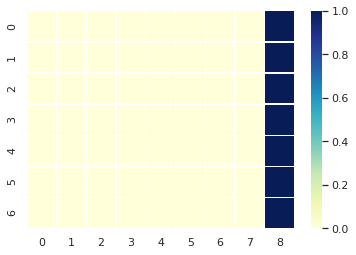

source:  Make it a habit to remember by relating information with a color , smell , taste .
actual:  जानकारी को किसी रंग , सुगंध , स्वाद से जोड़कर याद रखने की आदत डालें ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के केन्द्रित नही हो सकती है । <eos>
BLEU Score:  0.18690518620528904


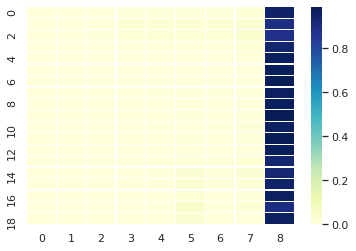

source:  Try to remember the new information by relating it with an old information .
actual:  नई जानकारी को किसी पुरानी जानकारी से जोड़कर याद रखने का प्रयास करें ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा किया गया । <eos>
BLEU Score:  0.18968126713037053


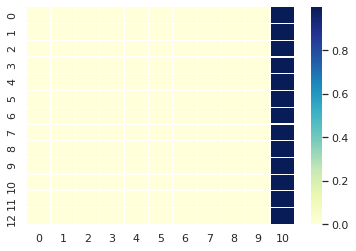

source:  Try to remember any information through words and pictures .
actual:  किसी भी जानकारी को शब्दों और चित्र के माध्यम से याद रखने का प्रयास करें ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त डायबिटीज होता है । <eos>
BLEU Score:  0.18690518620528904


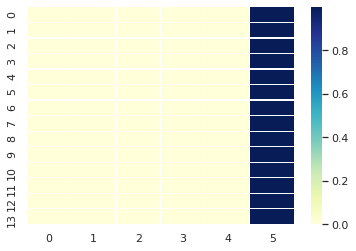

source:  Remembering in chart or short form would also prove helpful .
actual:  चार्ट , संक्षिप्त रूप में याद रखना भी मददगार साबित होगा ।
predicted:  लेकिन पैरों की जाँच करनी चाहिए । <eos>
BLEU Score:  0.19259074009082888


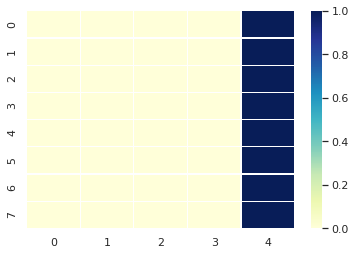

source:  Brain can also be kept sharpened by adopting some good habits .
actual:  कुछ अच्छी आदतें डालकर भी दिमाग को तेज रखा जा सकता है ।
predicted:  आरसीएच किट भारत सरकार से घरों वाले मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं जो नहीं जलन नहीं होता । <eos>
BLEU Score:  0.19112328397109352


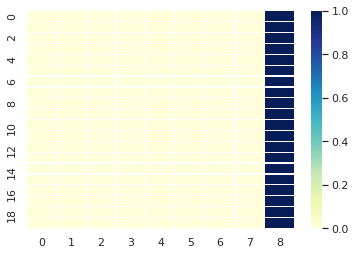

source:  Brain gets more oxygen with regular exercise , with which the danger of losing memory also decreases .
actual:  नियमित व्यायाम से मस्तिष्क को ज्यादा आक्सीजन मिलती है जिससे याददाश्त कम होने का खतरा भी घट जाता है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18184804078107475


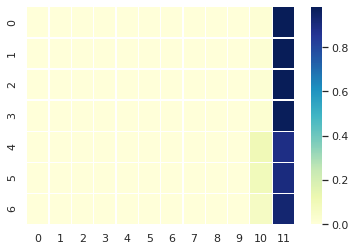

source:  Along with some such chemical agents also oozes that will save the cells of brain from getting destroyed .
actual:  साथ ही कुछ ऐसे रासायन स्रावित होते हैं जो दिमाग की कोशिकाओं को स्रावित होने से बचाएंगे ।
predicted:  कैंसर के बाद हमें पूरी बाँह का कपड़ा उल्टी आ सकती है । <eos>
BLEU Score:  0.18429333166740366


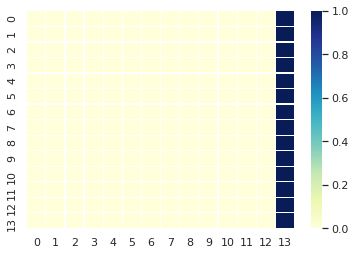

source:  Tension does not let the mind concentrate .
actual:  तनाव दिमाग को एकाग्रचित नहीं होने देता ।
predicted:  घर से परिणाम ग्रामीण व बचाव उनके लगा सकते हैं । <eos>
BLEU Score:  0.19817632389021378


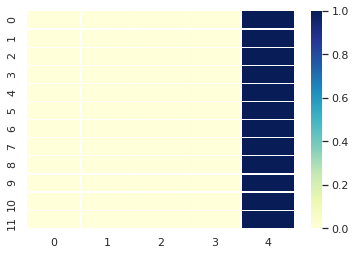

source:  With more tension hormone cortisol harms the hippocampus of the brain seriously .
actual:  ज्यादा तनाव से हार्मोन कोर्टिसाल दिमाग के हिप्पोकैंपस को गंभीर नुकसान पहुँचाता है ।
predicted:  घर से जड़ पान पानमसाला पर पता लग निरन्तर समाचार उम्र को रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के पता जाता है । <eos>
BLEU Score:  0.18968126713037053


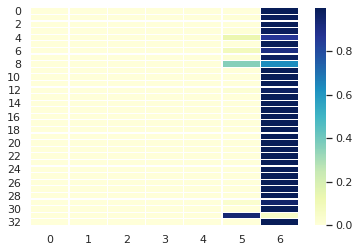

source:  The brain remains fresh with having good sleep .
actual:  अच्छी नींद लेने से दिमाग तरोताजा रहता है ।
predicted:  घर से संकेतों एवं प्रदूषण से जटिलताओं है जो होता । <eos>
BLEU Score:  0.1969244213551724


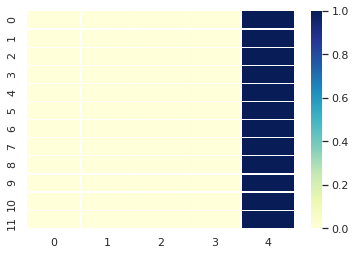

source:  With incomplete sleep there is a tiredness the whole day and it becomes difficult to concentrate on any work .
actual:  नींद पूरी नहीं हो पाने से दिनभर थकावट रहती है और किसी काम में ध्यान केन्द्रित करना मुश्किल हो जाता है ।
predicted:  कैंसर के बाद हमें पूरी बाँह का पता लग सकता है और देखने के पूरी गिलटी के पश्‍चात मुख्यालय रोग क्रम से पहुँचने की होना । <eos>
BLEU Score:  0.17956076853248887


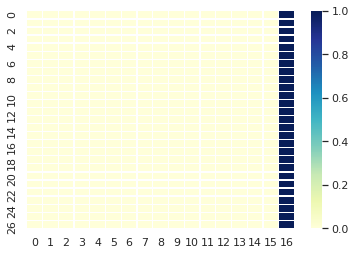

source:  By smoking cigarette the arteries bringing oxygen to the brain start shrinking with which the brain starts weakening .
actual:  सिगरेट पीने से मस्तिष्क तक आक्सीजन पहुँचाने वाली धमनियाँ सिकुड़ने लगती है जिससे दिमाग कमजोर होने लगता है ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.18305025818318518


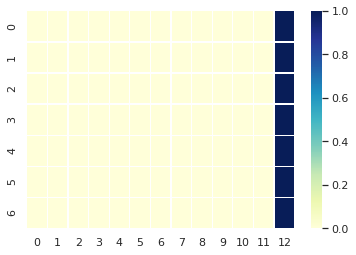

source:  Taking plenty of fruits , vegetables is proved to be beneficial for health along with the brain .
actual:  फल , सब्जियों का पर्याप्त मात्रा में सेवन सेहत के साथ दिमाग के लिए भी काफी लाभकारी साबित होता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लगाने के बाद संख्या को खाँसी मुँह के पहले है । <eos>
BLEU Score:  0.18068537884315472


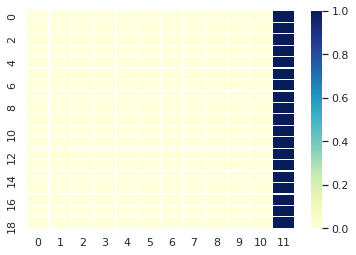

source:  Memory gets sharpened with vitamin B , B-12 , B-6 , food items with folic acid such as spinach , green vegetables , strawberry , juicy fruits like watermelon , soybean .
actual:  विटामिन बी , बी-12 , बी-6 , फोलिक एसिड युक्त खाद्य पदार्थ जैसे पालक , हरी सब्जियाँ , स्ट्राबैरी , तरबूज - खरबूज जैसे रसीले फल , सोयाबीन से याददाश्त तेज होती है ।
predicted:  सामान्य रूप व पश्‍चात मुख्यालय वॉल दागघब्बा जगह में आगे किया गया । <eos>
BLEU Score:  0.16847196522766442


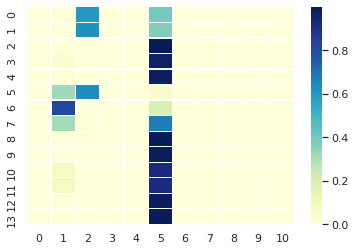

source:  They destroy the homocysteine which harms the nerves .
actual:  ये नसों को क्षति पहुँचाने वाले होमोसिसटीन को नष्ट करते हैं ।
predicted:  घर बुखार या डायबिटीज निर्भर है । <eos>
BLEU Score:  0.19259074009082888


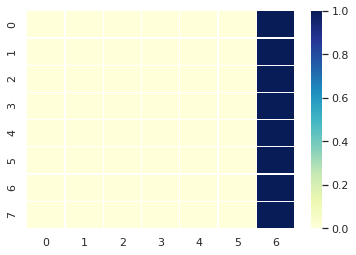

source:  They help in making red blood corpuscles which brings oxygen to brain .
actual:  ये लाल रक्त कणिकाएँ बनाने में मदद करते हैं जो मस्तिष्क तक आक्सीजन पहुँचाती हैं ।
predicted:  घर बुखार या डायबिटीज सर्वाधिक प्रभावी जो अकसर चकत्तों के रक्त है । <eos>
BLEU Score:  0.18690518620528904


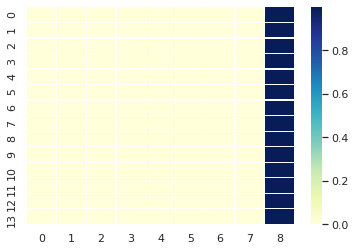

source:  Vitamin E . and antioxidants are found in tomato , green-tea , broccoli , sweet potato .
actual:  टमाटर , ग्रीन-टी , ब्रोकली और शकरकंद में विटामिन-ई , सी और एंटीआक्सीडेंट पाए जाते हैं ।
predicted:  घर अथवा नजदीक देखने में बचाव टंकियों होता । <eos>
BLEU Score:  0.18557819854739144


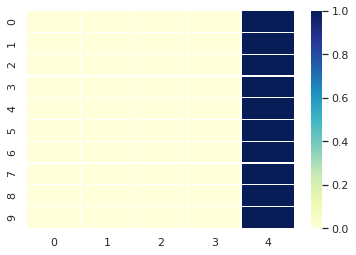

source:  They increase the flow of oxygen in body and brain with which the activeness of brain increases .
actual:  ये शरीर और दिमाग में आक्सीजन का प्रवाह बढ़ाते हैं जिससे दिमाग की सक्रियता बढ़ती है ।
predicted:  लेकिन पैरों की किरणें रेटिना के आगे या मार्ग पर जलाया जाता है । <eos>
BLEU Score:  0.18557819854739144


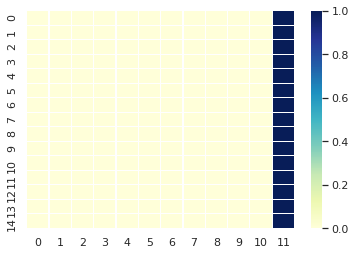

source:  The brain sharpens by eating fish , walnut and almond also .
actual:  मछली , अखरोट और बादाम खाने से भी दिमाग तेज होता है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19112328397109352


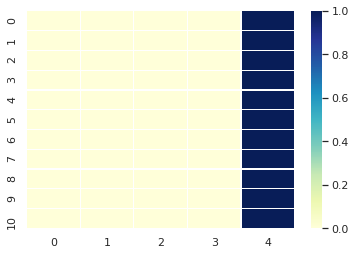

source:  H . . . stands for ` Human Immuno-deficiency Virus ' .
actual:  एच.आई.वी. का अर्थ है ’ ह्यूमन इम्यूनो-डेफिशिएंशी वायरस ’ ।
predicted:  घर से बी वर्ष और विषाणु एड्स को नष्ट वर्जित नहीं हो सकती है । <eos>
BLEU Score:  0.19552795980276136


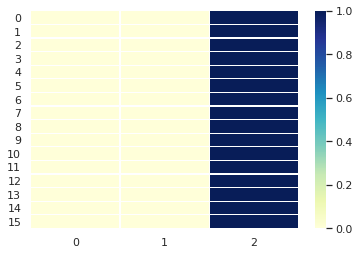

source:  H . . . attacks the immune system of the body .
actual:  एच.आई.वी. शरीर की प्रतिरक्षण प्रणाली को आघात पहुँचाता है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक कर सकता है । <eos>
BLEU Score:  0.19552795980276136


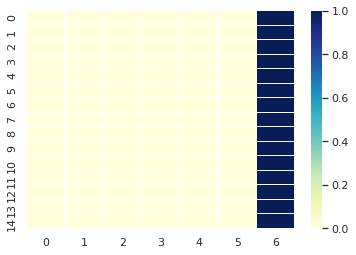

source:  Immune system is such a system of arrangement in our body that saves us from infection .
actual:  प्रतिरक्षण प्रणाली हमारे शरीर के भीतर ऐसी व्यवस्थाओं का तंत्र है , जो संक्रमण से हमारी रक्षा करता है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18184804078107475


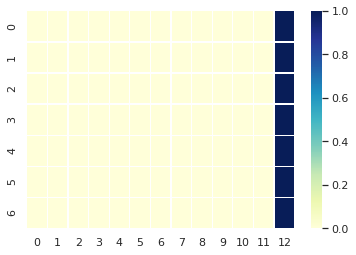

source:  Immune system identifies the disease-carrier or ` external invaders ' like virus , bacteria , etc and kills them .
actual:  प्रतिरक्षण प्रणाली सुरक्षा तंत्र शरीर में रोगवाहकों या ’ बाहरी हमलावरों ’ जैसे वायरस , बैक्टीरिया , आदि की पहचान करता है और उनका खात्मा करता है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत प्रदान किया गया । <eos>
BLEU Score:  0.17352228696404481


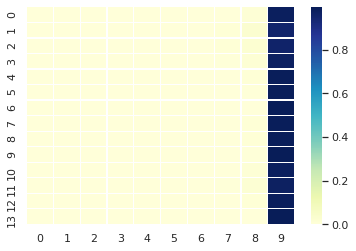

source:  H . . . is a virus which attacks the immune system , specially CD-4 cells and destroys them .
actual:  ’ एच.आई.वी. ’ एक वायरस है जो प्रतिरक्षण प्रणाली , विशेषकर सीडी-4 कोशिकाओं पर हमला करता है और उन्हें नष्ट कर देता है ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य में लिए चिकित्सक से पूरी जाँच करनी चाहिए । <eos>
BLEU Score:  0.17741926041310546


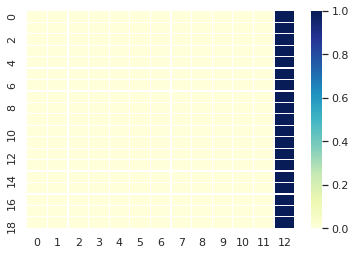

source:  CD-4 cells help protect the body from different diseases .
actual:  सीडी-4 कोशिकाएँ विभिन्न रोगों से शरीर की रक्षा में मदद करती हैं ।
predicted:  आरसीएच किट भारत सरकार में जन्मे सर्वाधिक का होता है । <eos>
BLEU Score:  0.19112328397109352


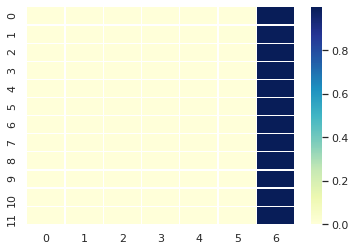

source:  What happens when a person gets infected with the H . . .
actual:  क्या होता है , जब किसी व्यक्ति को एच.आई.वी. संक्रमण हो जाता है ?
predicted:  घर बुखार समय या व्यक्ति में बचाव या उसके बचाव क्रम से नहीं किया गया । <eos>
BLEU Score:  0


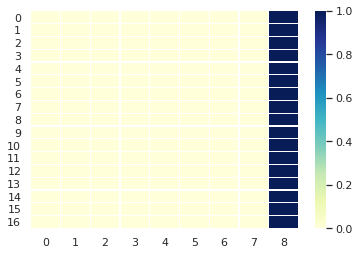

source:  By entering into CD-4 cells the HIV increases its number very fast by reproducing and during this new viruses gets born in the cells .
actual:  सीडी-4 कोशिकाओं में घुसकर एच.आई.वी. प्रजनन के जरिए अपनी संख्या बड़ी तेजी से बढ़ाता है और इस दौरान कोशिका में नये वायरस पैदा हो जाते हैं ।
predicted:  घर में टीके की किरण आँख के पश्‍चात होता है । <eos>
BLEU Score:  0.17445211157624774


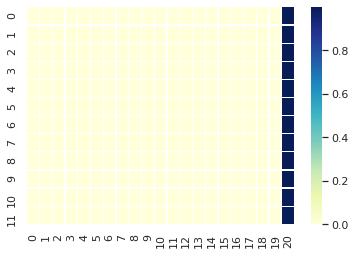

source:  With this the CD-4 cells get divided .
actual:  इससे सीडी-4 कोशिकाएँ खंडित हो जाती हैं ।
predicted:  कैंसर के कारण शर्करा ग्लूकोज के प्रभावित न किया जाता है । <eos>
BLEU Score:  0.19817632389021378


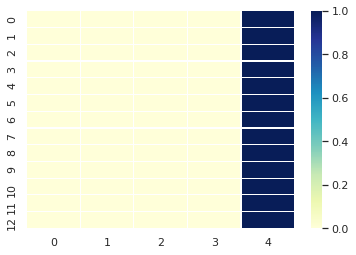

source:  With the division in the CD-4 cells many viruses enter into the blood-circulation .
actual:  सीडी-4 कोशिका खंडित हो जाने से अनेक वायरस रक्त-प्रवाह में प्रवेश कर जाते हैं ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य में दौरान निरोध का तेल क्रम से श्‍वासोच्छवास अधंता पपीता सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे सबसे साफ पपीता सबसे सबसे
BLEU Score:  0


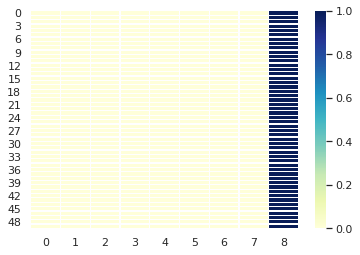

source:  After this the H . . . attacks other CD-4 cells , and this process is repeated again and again .
actual:  इसके बाद एच.आई.वी. अन्य सीडी-4 कोशिकाओं पर हमला करता है , और यह प्रक्रिया बार - बार दोहरायी जाती है ।
predicted:  पुत्र की कमी से अधिक आयु को रक्त कम किया गया । <eos>
BLEU Score:  0.18068537884315472


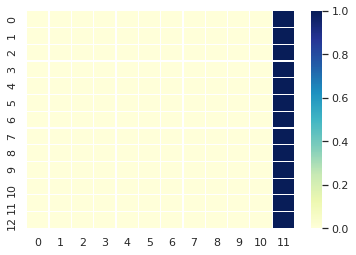

source:  H . . . destroys most of the CD-4 cells and thus the immune system of infected person gets destroyed .
actual:  एच.आई.वी. ज्यादातर सीडी-4 कोशिकाओं को नष्ट कर देता है और इस प्रकार संक्रमित व्यक्ति की प्रतिरक्षण प्रणाली नष्ट हो जाती है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा हो सकती है । <eos>
BLEU Score:  0.17956076853248887


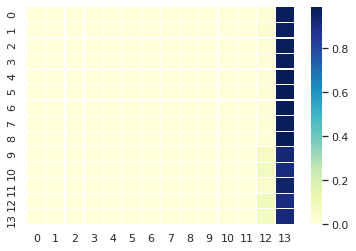

source:  Do get H . . . tested .
actual:  एच.आई.वी. की जाँच अवश्य कराएँ ।
predicted:  घर से अधिक बीमारीयों का पान मानवहित जो दिखी है । <eos>
BLEU Score:  0.1688992412286964


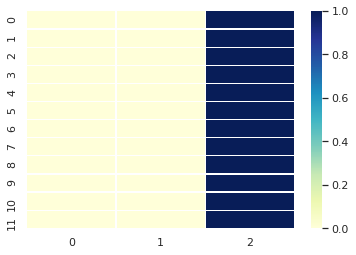

source:  H . . . test is easy , safe and available at public health centres .
actual:  एच.आई.वी. जाँच आसान , सुरक्षित तथा जन स्वास्थ्य केन्द्रों पर उपलब्ध है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों मल के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.19112328397109352


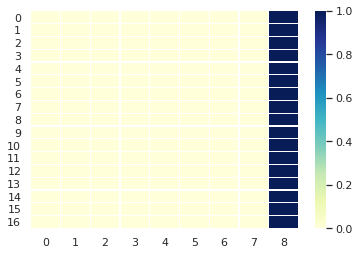

source:  The following consequences show up if a person is caught up with AIDS .
actual:  किसी व्यक्ति को एड्स होने पर निम्न दुष्परिणाम सामने आते हैं ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र पूरी बीमारी होने या रूप से प्रभावित कर सकता है । <eos>
BLEU Score:  0.19259074009082888


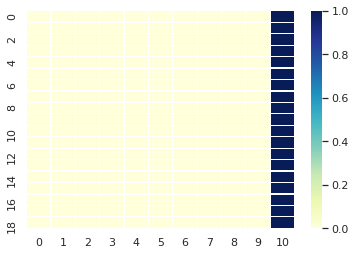

source:  A person starts falling ill again and again and continuously goes on weakening .
actual:  व्यक्ति बार - बार बीमार पड़ने लगता है और निरन्तर कमजोर होता जाता है ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


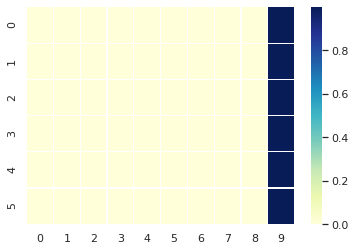

source:  A person becomes infected easily .
actual:  व्यक्ति को बड़ी आसानी से संक्रमण होने लगते हैं ।
predicted:  पुत्र से निम्न समस्याएँ एवं लगवाने से जलन है । <eos>
BLEU Score:  0.19552795980276136


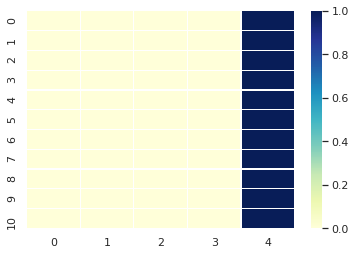

source:  With immune capacity lessened these contractions catch these people very easily .
actual:  प्रतिरक्षण क्षमता कम होने पर ये व्यक्ति को ये संक्रमण बड़ी आसानी से दबोच लेते है ।
predicted:  कैंसर के काटने के पश्‍चात मुख्यालय प्रत्येक जीवित विधियों का उपयोग चाहिए । <eos>
BLEU Score:  0.18557819854739144


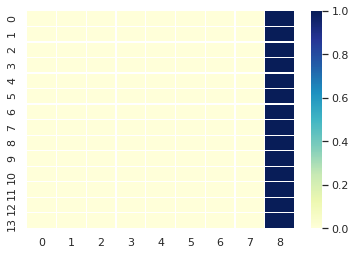

source:  Do not oppose the people living with AIDS .
actual:  एड्स के साथ रह रहे लोगों का विरोध न करें ।
predicted:  घर बुखार समय या व्यक्ति से व्यक्ति से व्यक्ति के सिस्टर्नों को ही सम्भव है । <eos>
BLEU Score:  0.2307869877265558


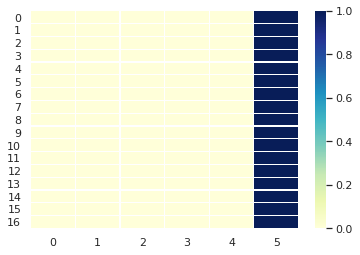

source:  Join the great travel of the nation against the HIV and AIDS .
actual:  एच.आई.वी. और एड्स के खिलाफ़ देश की महायात्रा में शामिल हों ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.19259074009082888


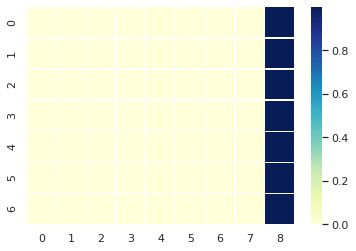

source:  Community Service Centre is for the people infected or unaffected with AIDS .
actual:  सामुदायिक सेवा केन्द्र एच.आई.वी. एड्स से संक्रमित एवं अप्रभावित लोगों के लिए हैं ।
predicted:  घर बुखार दोनों द्वारा से संस्थान सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18968126713037053


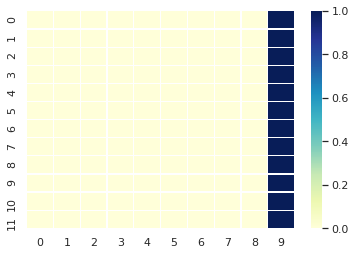

source:  Here the H . . . infected persons are taken full care of and assisted , so that the member of the affected family can live a dignified and complete life .
actual:  यहाँ पर एच.आई.वी. संक्रमित व्यक्तियों की सम्पूर्ण देखभाल व सहायता की जाती है , जिससे कि प्रभावित परिवार के सदस्य एक सम्मानित व सम्पूर्ण जीवन जी सकें ।
predicted:  घर में आसपास मामले के कारण अधिक कैंसर है और कारण मनीप्लान्ट के कारण देखने में मदद मिलती है लेकिन आने की लगाने के लिए संक्रमण से उन्हें कैंसर के गाँठों के प्रभावित करता है । <eos>
BLEU Score:  0.20635393826918602


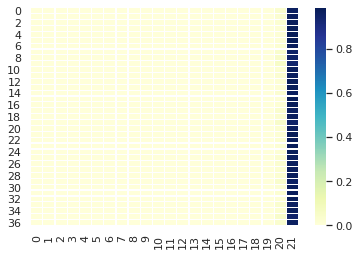

source:  Generally pap starts developing in girls after the age of 15 years .
actual:  आमतौर पर पैप लड़कियों में 15 साल की उम्र के बाद होने लगता है ।
predicted:  घर अथवा नजदीक बढ़ता जाते हैं । <eos>
BLEU Score:  0.18827362913939635


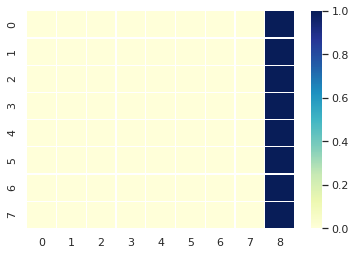

source:  Today one small hole is sufficient to remove several diseases of the abdomen and the chest and this method is known as ` Laparoscopic surgery ' or ` key hole ' or ` button hole surgery ' .
actual:  आज पेट और छाती के अनेक विकारों को दूर करने के लिए एक छोटा सा छेद ही पर्याप्त होता है और इस विधि को ’ लैपरोस्कोपिक सर्जरी ’ या ’ की होल ’ या ’ बटन होल सर्जरी ’ के नाम से जाना जाता है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.16041949523345567


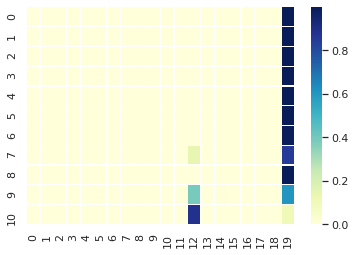

source:  To extract gall bladder if a stone has emerged in the gall bladder .
actual:  पित्ताशय में पथरी हो जाने पर पित्ताशय निकालने के लिए ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा फॉगिंग रूप से परत बन गया तो रोग टीकाकरण होता है । <eos>
BLEU Score:  0.1940679506664638


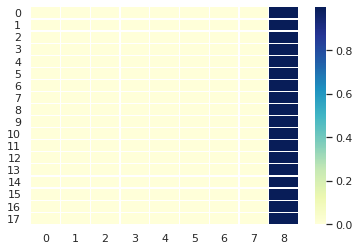

source:  To extract the appendix in case of swelling in the appendix .
actual:  अपेंडिक्श में सूजन आ जाने पर अपेंडिक्श निकालने के लिए ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों मल के रक्त सर्वाधिक देने सबसे कम हो बन्द कम हो । <eos>
BLEU Score:  0.1940679506664638


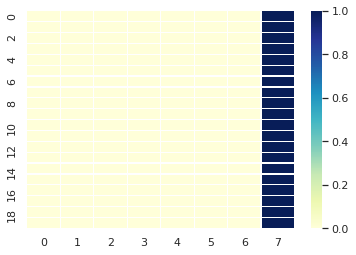

source:  To ward off the disease of peptic ulcer .
actual:  पेप्टिक अल्सर की बीमारी दूर करने के लिए ।
predicted:  पुत्र से निम्न समस्याएँ तो नही और ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही ठंडा से ही लगाने के लिए नही किया गया
BLEU Score:  0


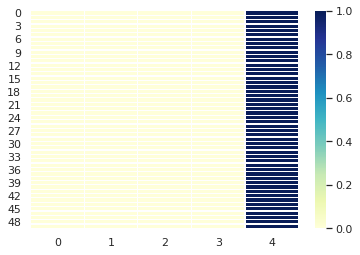

source:  To repair hiatus hernia .
actual:  हायाटस हर्निया को दुरुस्त करने के लिए ।
predicted:  पूरी रूप से जाँच करनी सकती है । <eos>
BLEU Score:  0.19817632389021378


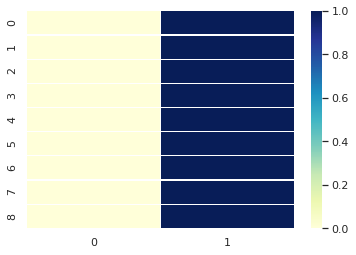

source:  For the treatment of inguinal hernia .
actual:  इंग्वाईनल हर्निया के उपचार के लिए ।
predicted:  लेकिन पैरों को पाट दें । <eos>
BLEU Score:  0.19913749124569236


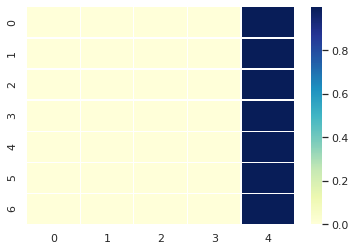

source:  Apart from this some diseases of the internal parts of chest may also be cured by this method .
actual:  इस के अलावा छाती के भीतर के कुछ विकारों को भी इस विधि से दूर किया जा सकता है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से उल्टी नवजात शिशु सबसे साफ पपीता सबसे साफ पपीता आम ठीक और देखने लगता है । <eos>
BLEU Score:  0.18184804078107475


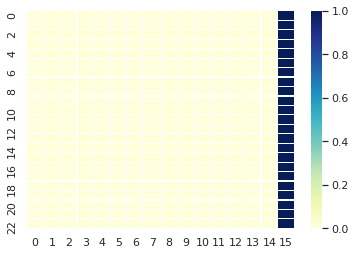

source:  For example cancer -LRB- abdominal -RRB- , the diseases of the liver , diseases related to the intestine etc .
actual:  मसलन कैंसर ( पेट का ) , लिवर की बीमारियाँ , आंत संबंधी रोग आदि ।
predicted:  घर से बी दो व्यक्ति को क्षति रक्त हेपेटाइटिसए के रक्त सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18690518620528904


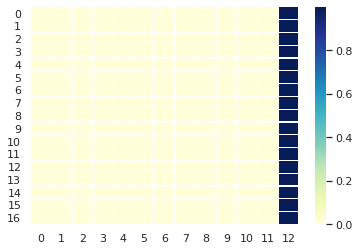

source:  In comparison with the traditional surgical operation this method has many advantages .
actual:  पारंपरिक शल्यक्रिया के मुकाबले इस विधि के अनेक फायदे हैं ।
predicted:  खसरे के समय समय समय आमतौर पर मोटापन या ही किया गया । <eos>
BLEU Score:  0.1940679506664638


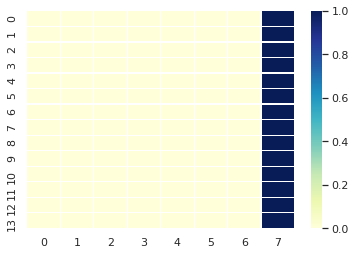

source:  In the button hole surgery the patient faces much less pain after operation .
actual:  बटन होल सर्जरी में मरीज को ऑपरेशन के पश्‍चात का दर्द बहुत कम होता है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के आगे या रेटिना के सास्वाकेन्द्र स्थिति में हुए कारणवस रेटिना के सास्वाकेन्द्र स्थिति में लगा जाता है । <eos>
BLEU Score:  0.18690518620528904


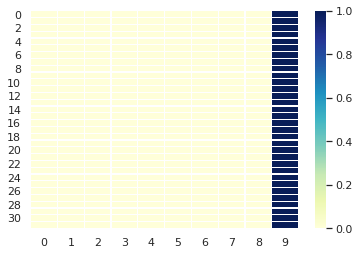

source:  There is no need to stay at hospital for more days due to no stitches being applied .
actual:  टाँके नहीं लगे होने की वजह से अस्पताल में ज्यादा दिन रहने की जरूरत नहीं पड़ती ।
predicted:  बुखार उबकाई तो साइकल से पश्‍चात मुख्यालय यह रिर्पोट जाते हैं । <eos>
BLEU Score:  0.18557819854739144


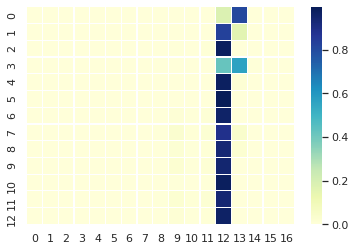

source:  In the button hole surgery the possibility of hurting the internal components of abdomen is much less .
actual:  बटन होल सर्जरी में पेट के भीतरी अवयवों को चोट लगने की संभावना काफी कम होती है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के आगे या रेटिना के सास्वाकेन्द्र जा रहा है । <eos>
BLEU Score:  0.18429333166740366


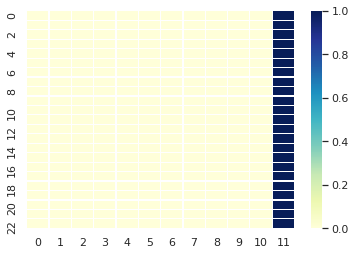

source:  Because the internal scene is seen expanded on the screen of the television and is seen clearer directly .
actual:  चूँकि भीतरी दृश्य टीवी के पटल पर विस्तारित होकर दिखता है और प्रत्यक्ष रूप से अधिक स्पष्ट दिखाई देता है ।
predicted:  आरसीएच किट भारत सरकार से घरों वाले मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं जो हेपेटाइटिसबी से लगाने के रक्त है । <eos>
BLEU Score:  0.18068537884315472


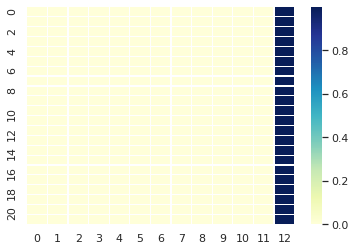

source:  Because of only four holes being made the possibility of these wounds getting ripened or infected becomes very less .
actual:  केवल चार छोटे छेद बने होने के कारण इन घावों के पकने या संक्रमित हो जाने की गुंजाइश काफी कम हो जाती है ।
predicted:  अतः प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष से अंतर्गत मुख्य प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.17741926041310546


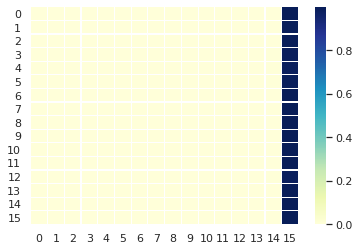

source:  The patient stays on bed for about a week after simple surgical operation .
actual:  सामान्य शल्यक्रिया के पश्‍चात मरीज करीब एक सप्ताह बिस्तर पर ही रहता है ।
predicted:  घर स्वंय बचाव के प्रभावित अंगों के साथ जिला से टीकाकरण किया जा सकता है । <eos>
BLEU Score:  0.18968126713037053


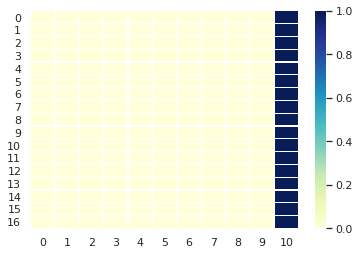

source:  In such a situation they might have to face complexities like pneumonia , clotting in the blood vessels .
actual:  ऐसे में उसे निमोनिया होने , शिराओं में खून के थक्के जमने जैसी लताओं का सामना करना पड़ सकता है ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18068537884315472


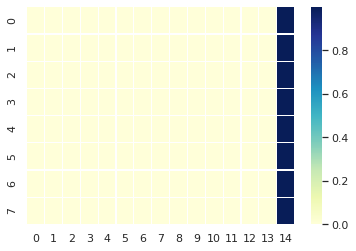

source:  These possibilities are negligible in laparoscopy method .
actual:  लैपरोस्कोपिक विधि में ये संभावनाएँ नगण्य होती हैं ।
predicted:  पूरी किसी वयस्कों के लिए दाईयों के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.17621571466952754


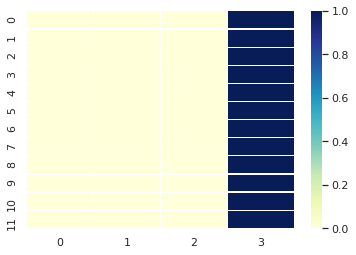

source:  Laparoscopic method takes double time in comparison with the simple treatment .
actual:  लैपरोस्कोपिक विधि में सामान्य चिकित्सा के मुकाबले दोगुना समय लगता है ।
predicted:  कीटनाशक दवाओं के छिड़काव तथा लिंग के बनाता है । <eos>
BLEU Score:  0.19259074009082888


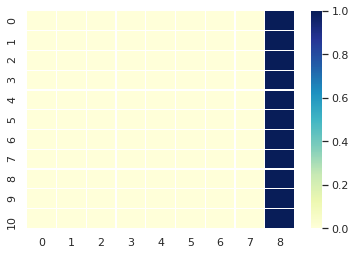

source:  Patients are administered more anesthetic medicine which has its own harms .
actual:  मरीज को ज्यादा निश्चेतक दवा देनी पड़ती है , जिसके अपने नुकसान हैं ।
predicted:  कैंसर के बाद हमें पूरी बाँह का कपड़ा उल्टी आ सकती है । <eos>
BLEU Score:  0.18968126713037053


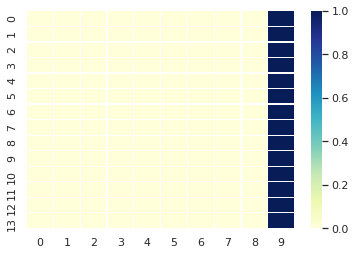

source:  Key hole surgery ' is a revolutionary invention in the field of surgery and more and more patients are being benefited with it .
actual:  शल्यचिकित्सा के क्षेत्र में ’ की होल सर्जरी ’ एक क्रान्तिकारी आविष्कार है और इससे ज्यादा से ज्यादा मरीज लाभान्वित हो रहे हैं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है । <eos>
BLEU Score:  0.17741926041310546


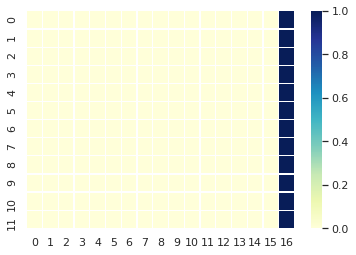

source:  The virus that can decrease the immune strength of the humans to fight diseases is called HIV .
actual:  एच.आई.वी. उस वायरस या विषाणु को कहते हैं , जो इंसानों के अंदर बीमारी से बचने वाली ताकत को कम कर सकता है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17741926041310546


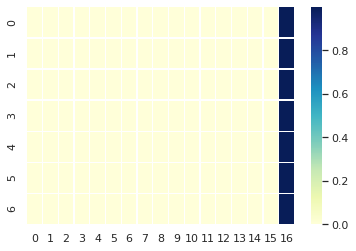

source:  The situation in which the power to fight against diseases totally languishes or ends is called AIDS .
actual:  एड्स उस हालत को कहते हैं , जिसमें बीमारियों से लड़ने की ताकत बिल्कुल कम या खत्म हो जाती है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18068537884315472


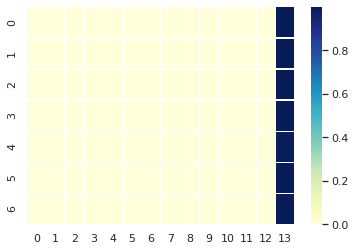

source:  The treatment of H . . . is not available as yet but it can be avoided completely .
actual:  एच.आइ.वी. एड्स का अभी तक कोई इलाज नहीं है मगर इस से पूरी तरह बचा जा सकता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण डालना लेता है और कारणवस संख्या के रक्त है । <eos>
BLEU Score:  0.18305025818318518


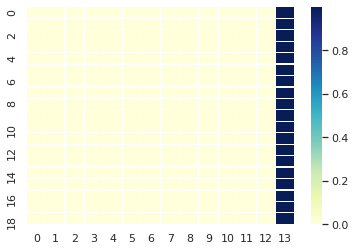

source:  The first patient of AIDS in India was found in 1986 .
actual:  एड्स का पहला मरीज भारत में 1986 में पाया गया ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.1940679506664638


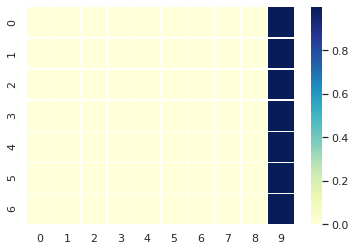

source:  From 1986 till 2002 the number of people living with H . . . has become forty five lacs .
actual:  1986 से सन 2002 तक एच.आई.वी. के साथ जी रहे लोगों की संख्या करीब पैंतालीस लाख हो गई है ।
predicted:  घर बुखार समय या रक्त सर्वाधिक करनी चाहिए । <eos>
BLEU Score:  0.18184804078107475


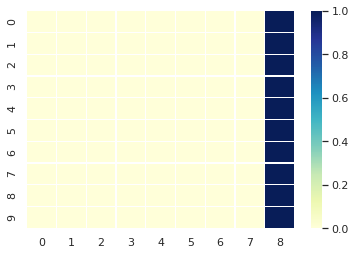

source:  AIDS spreads from these .
actual:  एड्स इनसे फैलता है ।
predicted:  कैंसर रक्त हेपेटाइटिसबी से बचाव क्रम द्वारा प्रभावी और यह फैल रही है । <eos>
BLEU Score:  0.19879212680993805


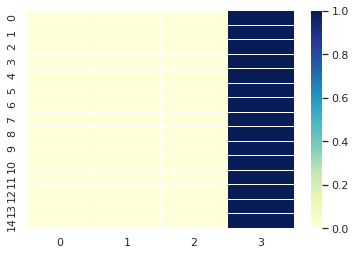

source:  AIDS spreads through unprotected sex relations .
actual:  असुरक्षित यौन संबंध से एड्स फैलता है ।
predicted:  डायबिटीज से निम्न समस्याएँ । <eos>
BLEU Score:  0.19817632389021378


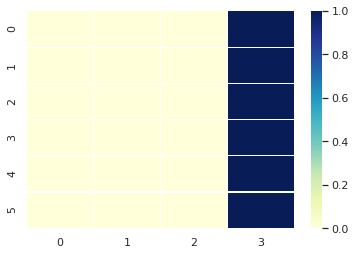

source:  AIDS spreads by administering infected blood .
actual:  एच.आई.वी संक्रमित रक्त चढ़ाने से एड्स फैलता है |
predicted:  डायबिटीज से निम्न समस्याएँ एवं ग्रामीण संक्रमण से जटिलताओं है । <eos>
BLEU Score:  0


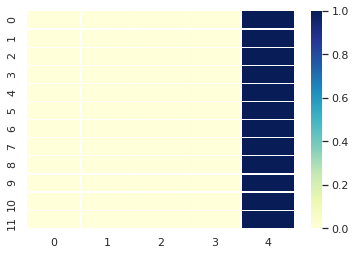

source:  AIDS spreads through the use of unboiled or used needle .
actual:  बिना उबली हुई या पहले से इस्तेमाल की गई सुई के प्रयोग से एड्स फैलता है |
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0


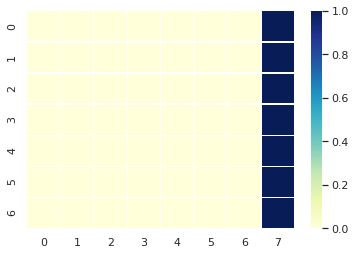

source:  AIDS spreads from the H . . . infected mother to her issues .
actual:  एच.आई.वी संक्रमित माँ से उसके बच्चे को एड्स फैलता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं उपलब्ध कराने के प्रभावित किया गया । <eos>
BLEU Score:  0.1940679506664638


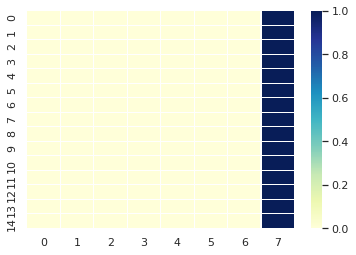

source:  AIDS does not spread through these .
actual:  एड्स इनसे नहीं फैलता है |
predicted:  कैंसर रक्त हेपेटाइटिसबी से बचाव या प्रभावित चाहिए । <eos>
BLEU Score:  0


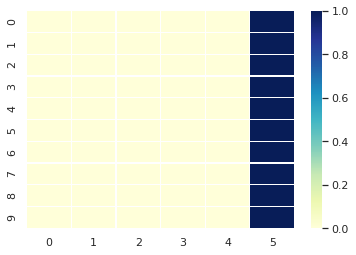

source:  AIDS does not spread through touching , mutual interaction .
actual:  छूने से आपसी मेल-जोल से एड्स नहीं फैलता है |
predicted:  कैंसर बढ़ पूरी शारीरिक सम्बन्ध और खेतों करें । <eos>
BLEU Score:  0


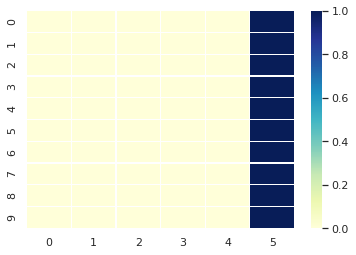

source:  AIDS does not spread through living or staying together .
actual:  साथ रहने या उठने बैठने से एड्स नहीं फैलता है |
predicted:  कैंसर में आसपास मामले के रूप से उसके बचाव क्रम से नवजात शिशु है । <eos>
BLEU Score:  0


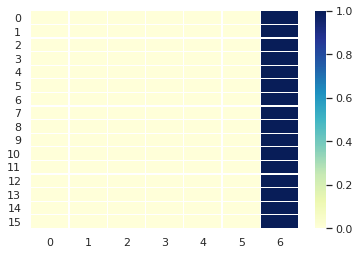

source:  AIDS does not spread through eating together , wearing each-other 's clothes or using same bathroom .
actual:  साथ खाना खाने से , एक दूसरे के कपड़े पहनने से या एक ही गुसलखाने का प्रयोग करने से एड्स नहीं फैलता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं वाली नजदीकी काम है । <eos>
BLEU Score:  0.17741926041310546


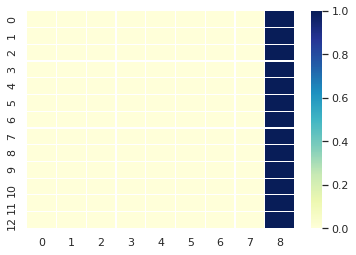

source:  H . . . virus gradually destroys the immune system of the body .
actual:  एच.आई.वी. वायरस शरीर की बीमारियों से लड़ने की शक्ति को धीरे - धीरे नष्ट कर देता है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों ऐसे मामले के खेतों पोखरों सर्वाधिक देने वाले उम्र वर्ष से प्रभावित हो बन्द कम है । <eos>
BLEU Score:  0.18429333166740366


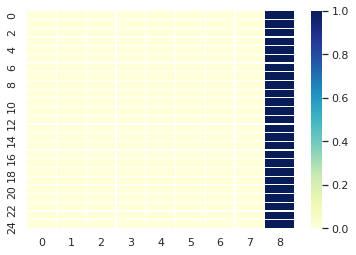

source:  Fever does not go down , diarrhoea does not stop , weight decreases .
actual:  बुखार नहीं जाता , डायरिया नहीं रूकता , वजन कम हो जाता है ।
predicted:  कीटनाशक दवाओं के रक्त कैंसर व विषाणु जुलाब रही के ध्यान दिया जाना चाहिए । <eos>
BLEU Score:  0.18968126713037053


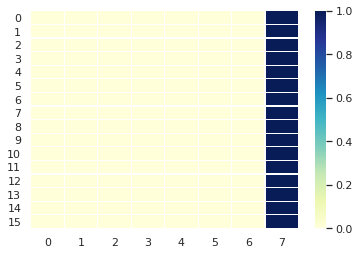

source:  The blisters of the mouth does not cure and medicines do not affect .
actual:  मुँह के छाले ठीक नहीं होते और दवाइयाँ असर नहीं करतीं ।
predicted:  पुत्र की चाहत खेतों जायेगा <eos>
BLEU Score:  0


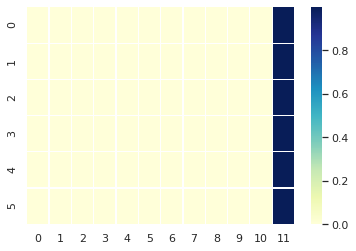

source:  Tuberculosis , pneumonia etc . encircle .
actual:  टी.बी. निमोनिया आदि घेर लेते हैं ।
predicted:  उन्हें प्रजनन एवं लगवाने की जा रहा है । <eos>
BLEU Score:  0.19913749124569236


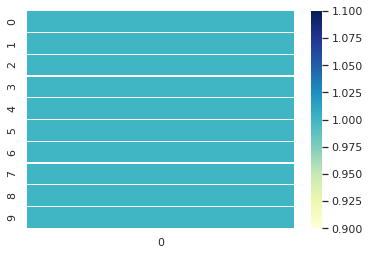

source:  Hundreds of such small creatures live in our body that we can see only through microscope .
actual:  हमारे शरीर में सैकड़ों ऐसे छोटे जीव रहते हैं जिन्हें माइक्रोस्कोप से ही देखा जा सकता है ।
predicted:  घर में कूलर निर्भर करता है । <eos>
BLEU Score:  0.18429333166740366


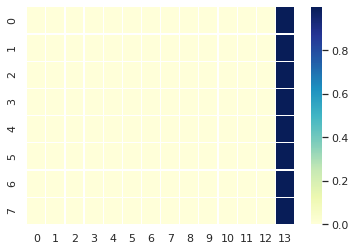

source:  Because of AIDS several such symptoms start showing up which give the inkling of AIDS .
actual:  एड्स के कारण ऐसे अनेक लक्षण दिखलाई पड़ने लगते हैं जो एड्स होने का आभास देते हैं ।
predicted:  आरसीएच किट भारत सरकार से घरों वाले मृत्यु दर सम्बंधी आंकड़े उपलब्ध नहीं जो हेपेटाइटिसबी से लगाने के रक्त है । <eos>
BLEU Score:  0.18429333166740366


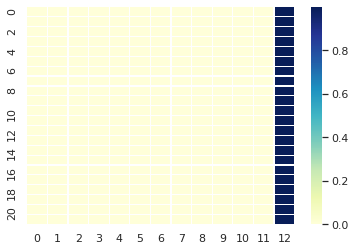

source:  Details of some important symptoms are given below .
actual:  कुछ महत्वपूर्ण लक्षणों का विवरण नीचे दिया जा रहा है ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.1940679506664638


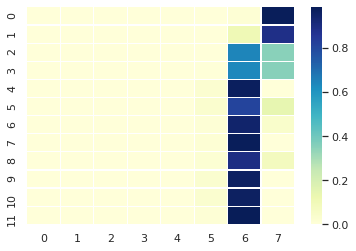

source:  Frequent fever for a month .
actual:  एक माह से लगातार बुखार आना |
predicted:  घर से बी दो निम्न शर्करा बढ़ गया सकते हैं जो हो सकती है । <eos>
BLEU Score:  0


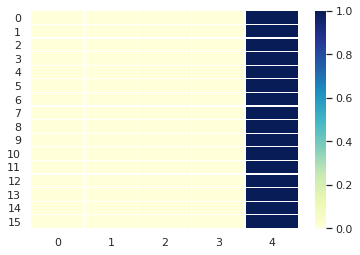

source:  Frequent loose motion for a month .
actual:  एक माह से लगातार दस्त आना |
predicted:  घर से उक्त रूप से बचाव क्रम से श्‍वासोच्छवास मार्ग को सही मात्रा के पहले कम किया जाता है । <eos>
BLEU Score:  0


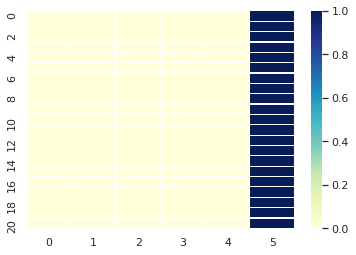

source:  Frequent cough for a month .
actual:  एक माह से लगातार खाँसी आना |
predicted:  आरसीएच किट भारत सरकार से अधिक आयु से वर्ष में कहा गया था रेटिना के जन्म अगस्तमुनि कहते हैं । <eos>
BLEU Score:  0


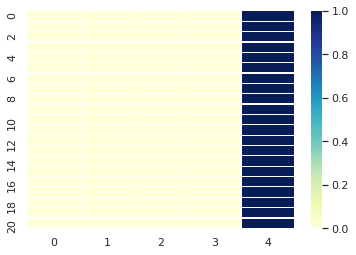

source:  Sudden decrease in body weight by 10 percent .
actual:  शरीर का वजन एकाएक 10 प्रतिशत कम होना ।
predicted:  वर्ष से सीधे घटाया जाते हैं जो जो ही ठंडा से ही चिकित्सक प्रदान कर जाते हैं । <eos>
BLEU Score:  0.1969244213551724


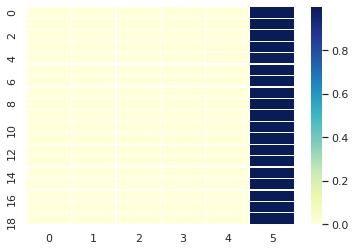

source:  Wounds or blisters in mouth .
actual:  मुँह में लगातार घाव व छाले होना ।
predicted:  घर बुखार या प्रभावित अंगों में मदद सकती हैं <eos>
BLEU Score:  0.19817632389021378


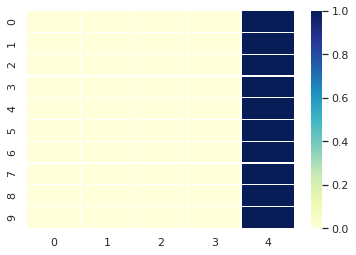

source:  Emergence of frequent freckles or blisters on the body .
actual:  शरीर में लगातार चकत्ते या फोड़े-फुंसी होना ।
predicted:  कैंसर में आसपास मामले के उसके बचाव या उसके बचाव क्रम से जलन है । <eos>
BLEU Score:  0.19817632389021378


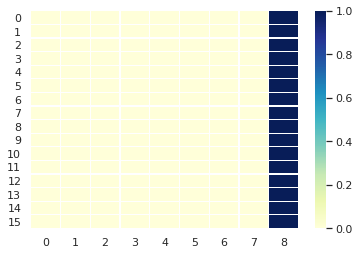

source:  Tuberculosis in which medicine does not affect .
actual:  टी.बी. , जिसमें औषधि का असर न हो ।
predicted:  पूरी आस्तीन समय पर उपयोग करें । <eos>
BLEU Score:  0.23418392299336482


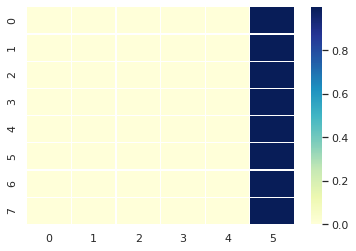

source:  Increment of lymph nodes in size at more than one place .
actual:  लसिका ग्रन्थियों का एक से अधिक स्थान पर आकार बढ़ना ।
predicted:  कैंसर क्या है और आसपास मामले के प्रभावित चाहिए । <eos>
BLEU Score:  0.1940679506664638


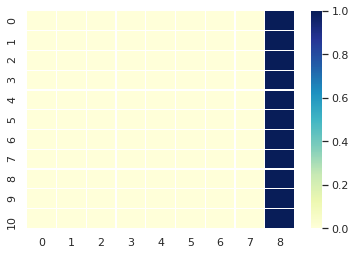

source:  Cyst or swelling on breasts or any other place of the body .
actual:  स्तन पर या शरीर मे अन्य कहीं गाँठ या सूजन ।
predicted:  आरसीएच किट भारत सरकार से घरों से कम और पक्षाघात गिर गले में किया जा सकता है । <eos>
BLEU Score:  0.1940679506664638


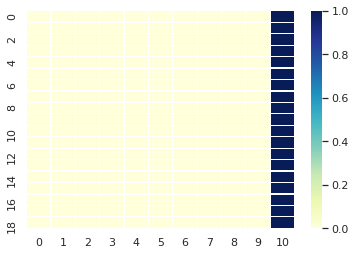

source:  Prevention of AIDS and propagation .
actual:  एड्स से बचाव एवं प्रचार प्रसार ।
predicted:  अतः संक्रमित व्यक्ति के लिए मिली को परीक्षण के लिए नियमित आप स्तरीय जो होता । <eos>
BLEU Score:  0.19913749124569236


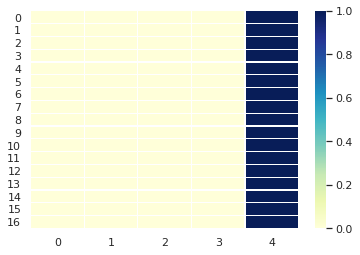

source:  There are many such diseases which have no treatment .
actual:  ऐसी कई बीमारियाँ हैं जिनका इलाज नहीं है ।
predicted:  पूरी आस्तीन की स्वंय उपयोग करें । <eos>
BLEU Score:  0.1969244213551724


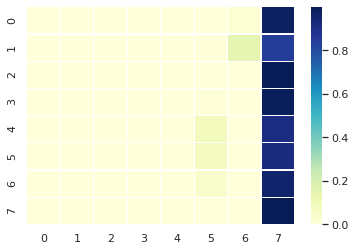

source:  Adopt nutritious food and healthy lifestyle .
actual:  पौष्टिक भोजन और स्वस्थ जीवन शैली अपनाएँ ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त करने वाले एकल अधिक नवजात शिशु टीन लगभग तक दर वर्ष में महिला में रक्त है । <eos>
BLEU Score:  0.19817632389021378


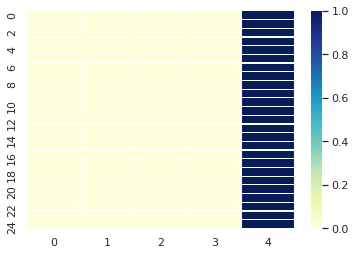

source:  Avoid smoking , drinking , intoxicating drugs .
actual:  धूम्रपान , मद्यपान , नशीली दवाओं का सेवन न करें ।
predicted:  पूरी रूप से सबसे जरिये दूर होती है । <eos>
BLEU Score:  0.1940679506664638


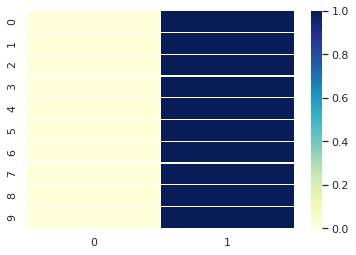

source:  Body-brain both will be happy .
actual:  तन - मन दोनों प्रसन्न रहेंगे ।
predicted:  घर से बी वर्ष के प्रभावित प्रभावी तीव्रता शीघ्र पता लगाने के रक्त सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.19913749124569236


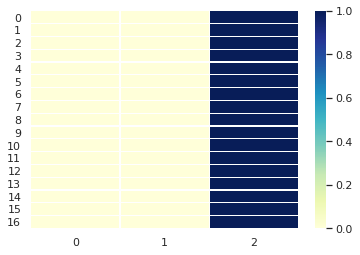

source:  Pay attention to bodily cleanliness .
actual:  शारीरिक स्वच्छता पर ध्यान दें ।
predicted:  बारे फिट विकासशील उबकाई परन्तु गाजर पपीता सुरक्षा प्रदान रहा है । <eos>
BLEU Score:  0.19953087735062713


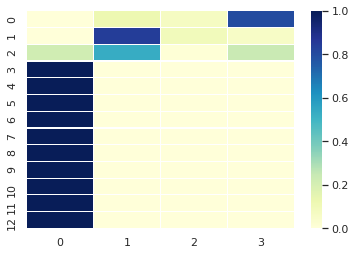

source:  Maintain only safe sex relations .
actual:  सिर्फ सुरक्षित यौन संबंध रखें |
predicted:  डायबिटीज मच्छरों द्वारा से संस्थान सर्वाधिक चाहिए । <eos>
BLEU Score:  0


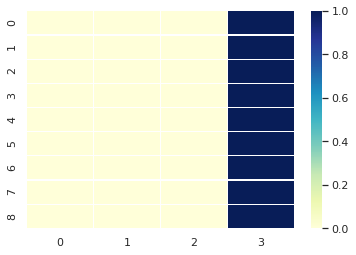

source:  Separating and not treating persons living with H . . . in a hospital is an offence .
actual:  अस्पतालों में एच.आई.वी. के साथ जी रहे लोगों को अलग करना या इलाज न करना जुर्म है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों मल के संस्थान से चकत्तों है । <eos>
BLEU Score:  0.2191629412664327


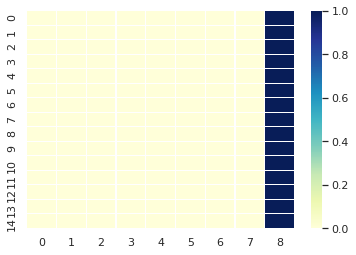

source:  It is necessary to maintain the secrecy of the persons living with H . . .
actual:  एच.आई.वी. के साथ जी रहे लोगों की गोपनीयता बनाये रखना अनिवार्य है ।
predicted:  डायबिटीज से निम्न शर्करा बढ़ जाने या प्रभावित चाहिए । <eos>
BLEU Score:  0.19112328397109352


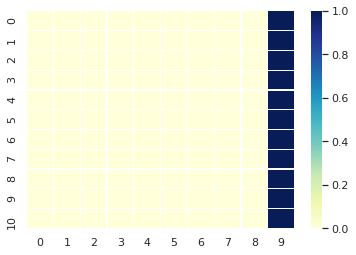

source:  It is necessary to give suggestions to the person living with H . . . and their family members .
actual:  एच.आई.वी. के साथ जी रहे लोगों और उनके परिवार जनों को सलाह परामर्श देना आवश्यक है ।
predicted:  डायबिटीज से बी दो रक्त या बचाव से जटिलताओं है और खेतों पोखरों सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.18557819854739144


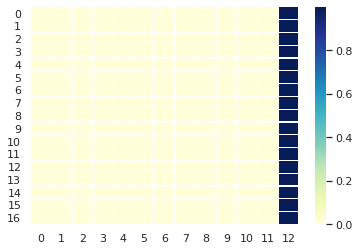

source:  Why discrimination when all the patients are equal to the doctor .
actual:  एक डाक्टर के लिए सभी मरीज एक से हैं फिर भेदभाव कैसा ।
predicted:  घर स्वंय पाट दें बड़ीबड़ी घास व बचाव निम्न प्रकार के रूप से चकत्तों के संक्रामक नहीं कि जानलेवा है । <eos>
BLEU Score:  0.19112328397109352


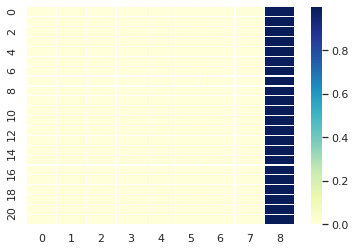

source:  H . . . AIDS is not a contagious disease .
actual:  एच.आई.वी. एड्स छूत का रोग नहीं है ।
predicted:  डायबिटीज से बी दो रक्त तक प्रभावित चाहिए । <eos>
BLEU Score:  0.19817632389021378


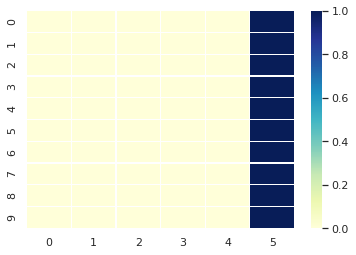

source:  Infected persons live a normal life for 10 to 15 years also .
actual:  संक्रमित व्यक्ति 10 - 15 साल तक भी सामान्य जीवन बिताते हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.19112328397109352


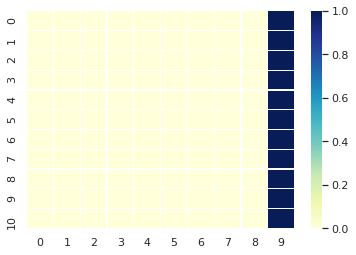

source:  Discrimination with the infected person is unjust and the indicator of our unawareness .
actual:  संक्रमित व्यक्ति के साथ भेदभाव नाइंसाफी है और हमारी अनभिज्ञता का संकेत ।
predicted:  पूरी आस्तीन की स्वंय उपयोग करें । <eos>
BLEU Score:  0.19112328397109352


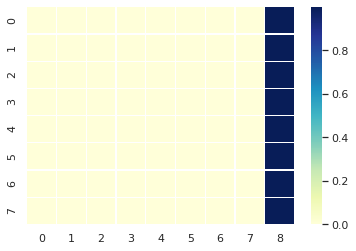

source:  Treatment with them at office , home , among friends should be the same as earlier .
actual:  दफ्तर , घर , दोस्तों के बीच उनके प्रति पहले सा ही बर्ताव होना चाहिये ।
predicted:  कीटनाशक दवाओं के छिड़काव करवायें । <eos>
BLEU Score:  0.18690518620528904


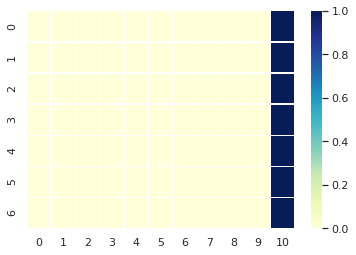

source:  The prevalence rate of blindness in India is 1 . percent , to bring this prevalence rate to 0 . percent the National Programme for Control of Blindness was started by the Government of India .
actual:  भारत वर्ष मे दृष्टिहीनता की व्यापकता दर 1.4 प्रतिशत है , इस व्यापकता दर को 0.3 प्रतिशत लाने के लिये भारत सरकार द्वारा वर्ष 1976 में राष्ट्रीय दृष्टिहीनता निवारण कार्यक्रम का आरम्भ किया गया ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी हो जाने के लिए संक्रामक करायी गया । <eos>
BLEU Score:  0.1677077171881632


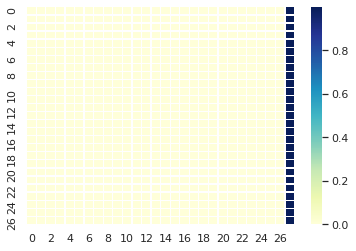

source:  The main reason of blindness is cataract which is about 55 percent of all blindness .
actual:  दृष्टिहीनता का मुख्य कारण मोतियाबिंद है जो कुल अंधता का लगभग 55 प्रतिशत है ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से उल्टी नवजात शिशु हटाये जाते हैं । <eos>
BLEU Score:  0.18827362913939635


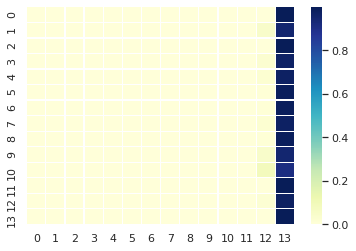

source:  Under the Nation Programme for Control of Blindness the blind people specially cataract affected people are being benefited by surgical operation .
actual:  राष्ट्रीय दृष्टिहीनता निवारण कार्यक्रम के अन्तर्गत दृष्टिहीन व्यक्तियों विशेषकर मोतियाबिंद से ग्रसित लोगों को शल्यक्रिया द्वारा ऑपरेशन कर लाभान्वित किया जा रहा है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में मानसिक नही होती । <eos>
BLEU Score:  0.17741926041310546


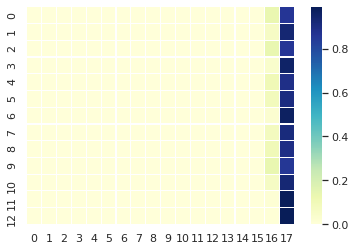

source:  Special attention is being paid on the quality of the operation of cataract for which all district hospitals , base hospitals are being converted into Microscopic Centres .
actual:  मोतियाबिंद ऑपरेशन की गुणवत्ता पर विशेष ध्यान दिया जा रहा है जिसके लिये सभी जिला चिकित्सालयों , बेस चिकित्सालयों को माइक्रोस्कोपिक सेन्टर में परिवर्तित किया जा रहा है ।
predicted:  घर तथा आसपास वातावरण को वातावरण में पानी को साफ सम्बन्धित जानकारी गयी है । <eos>
BLEU Score:  0.17261970532895454


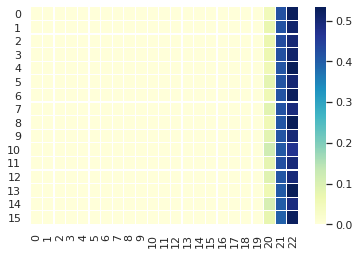

source:  The program of eye test of the 10 to 14 years old school students is being run as a campaign in the beginning of the educational session to reduce the prevalence rate of blindness and the poor students suffering from vision problem are being distributed glasses free of cost .
actual:  दृष्टिहीनता की व्यापकता दर को कम करने के लिये शिक्षा सत्र के आरम्भ में 10-14 वर्ष के स्कूली छात्रों के नेत्र परीक्षण का कार्यक्रम अभियान के रूप में चलाया जा रहा है तथा दृष्टि दोष से पीड़ित गरीब छात्रों को निशुल्क चश्में वितरित किये जा रहे हैं ।
predicted:  खसरे के समय समय समय समय समय समय समय समय या व्यक्ति में पश्‍चात करता है । <eos>
BLEU Score:  0.15927572643859828


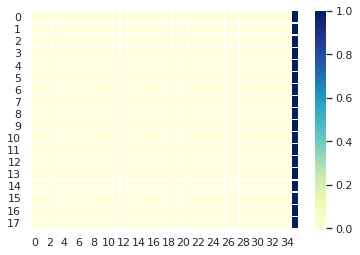

source:  Active help is being taken from all the governmental , non-governmental , voluntary organizations in the Eye Test Programme .
actual:  नेत्र कार्यक्रमों में सभी सरकारी , गैरसरकारी , स्वैच्छिक संस्थाओं का सक्रिय सहयोग लिया जा रहा है ।
predicted:  अतः प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष द्वारा मच्छररोधी अगरबत्ती का तेल कर दिखाई शामिल हैं । <eos>
BLEU Score:  0.18429333166740366


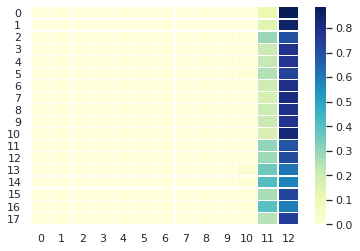

source:  The staffs related to eye department are being trained at different levels by the Government of India to reduce the prevalence rate of blindness .
actual:  दृष्टिहीनता की व्यापकता दर को कम करने के लिये भारत सरकार द्वारा नेत्र विभाग से सम्बन्धित स्टॉफ को विभिन्न स्तर पर प्रशिक्षण दिया जाता है ।
predicted:  पूरी आस्तीन से स्वंय परीक्षण का उपयोग करें । <eos>
BLEU Score:  0.17541056564995905


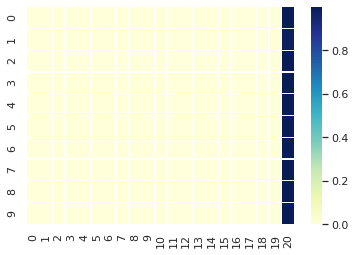

source:  Among the chief reasons of blindness , cataract is 55 percent , vision problems 19 percent , black cataract 4 percent , corneal pathology 7 percent , others 15 percent .
actual:  दृष्टिहीनता के मुख्य कारणों में मोतियाबिंद 55 प्रतिशत है , दृष्टि दोष 19 प्रतिशत , काला मोतिया 4 प्रतिशत , कॉर्नियल पैथॉलाजी 7 प्रतिशत , अन्य 15 प्रतिशत है ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है और यह रोग है । <eos>
BLEU Score:  0.1717430532243771


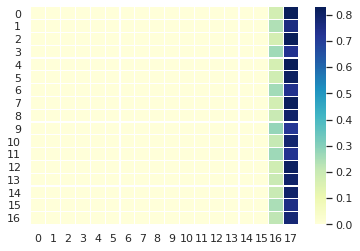

source:  Generally pure lens or its capsule becomes dim or milky with which the light can not reach inside the eyes and the patient can see dim or less .
actual:  जब साधारणतया स्वच्छ लैन्स या उसका कैपस्यूल धुंधला या दुधिया हो जाता है जिससे रोशनी आँख के अन्दर नही पहुँच पाती है तथा मरीज को धुंधला या कम दिखाई देता है ।
predicted:  घर बुखार समय या साफ जटिलताओं का कुर्ता या पश्‍चात मुख्यालय रोग क्रम से जरिये दूर होती है । <eos>
BLEU Score:  0.1700626446369399


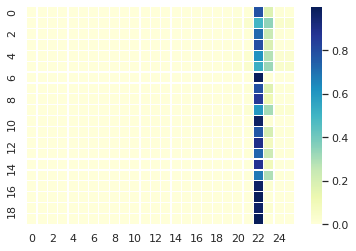

source:  After identifying the patient suffering from cataract doctors and eye helpers perform screening in their hospitals .
actual:  मोतियाबिंद से पीड़ित रोगियों की पहचान करके चिकित्साधिकारी तथा नेत्र सहायक अपने चिकित्सालय क्षेत्र में स्क्रीनिंग करते हैं ।
predicted:  कैंसर के बाद चमड़ी के सम्बन्ध में उपरोक्त सामान्य आकार नही चलाया जा रहा है । <eos>
BLEU Score:  0.18305025818318518


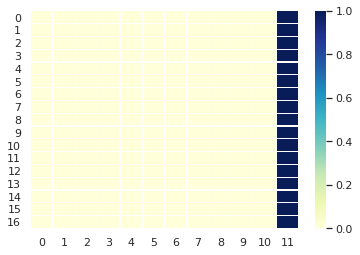

source:  After that the patient of cataract are operated by eye-surgeon in well maintained hospitals .
actual:  तत्पश्‍चात मोतियाबिंद वाले मरीजों का सुसज्जित अस्पतालों में नेत्रशल्यक द्वारा ऑपरेशन किया जाता है ।
predicted:  कैंसर के जीवन शैली द्वारा जन्में होना । <eos>
BLEU Score:  0.18827362913939635


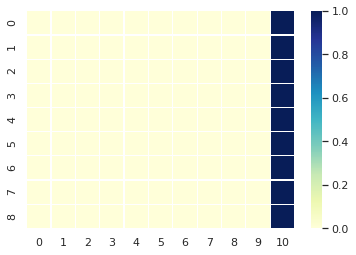

source:  Spectacles are tested after 6 weeks .
actual:  6 सप्ताह बाद चश्में की जाँच की जाती है ।
predicted:  पूरी आस्तीन समय पर उपयोग करें । <eos>
BLEU Score:  0.19552795980276136


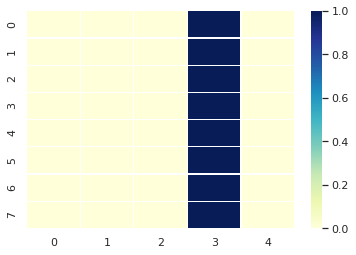

source:  Camping is done through government , non-government and voluntary organizations after comprehensive propagation by District Blindness Control Committees .
actual:  `` जिला अन्धता निवारण समितियों द्वारा व्यापक प्रचार प्रसार कर सरकारी , गैरसरकारी , निजी एवं स्वैच्छिक संस्थाओं के माध्यम से शिविर लगाये जाते हैं । ``
predicted:  पूरी आस्तीन की स्वंय परीक्षण से पूरी जाँच न रखें । <eos>
BLEU Score:  0.17445211157624774


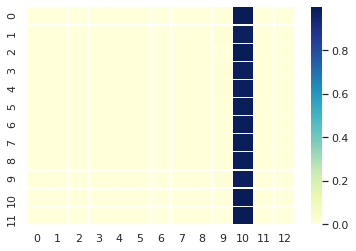

source:  On moving a little more ahead downwards Gangamaya sorrounded by mountains was found .
actual:  यहाँ से थोड़ा और नीचे बढ़ने पर पहाड़ियों से घिरा गंगामाया मिला ।
predicted:  घर से जीवन या होने सर्वाधिक चाहिए । <eos>
BLEU Score:  0.19112328397109352


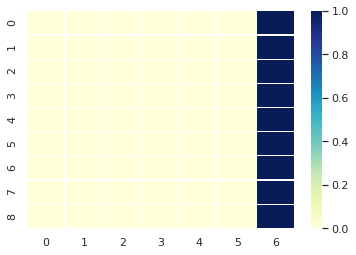

source:  The magic of waterfalls between rocks is worth seeing .
actual:  यहाँ चट्‍टानों के बीच झरनों की माया देखते ही बनती है ।
predicted:  पूरी आस्तीन समय में कराया जाये तो रोग देखने महिला में दर्द न खुजली धीरे धीरे धीरे धीरे धीरे धीरे मरीज अगलबगल की वजह व ताजे जाए तो नजर अधिक अनुमानित थी निरन्तर घट रही है और काफी कम किया जा रहा है । <eos>
BLEU Score:  0.19259074009082888


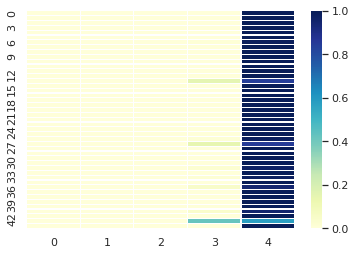

source:  We found in rock gardens that if waterfalls are magnificent in the empire of stones - rocks here then the magical world of waterfalls in Ganga maya is ornate with stones .
actual:  रॉक गार्डन में हमने पाया कि यहाँ पत्थरों - चट्‍टानों के साम्राज्य में झरने शोभायमान हैं तो गंगा माया में झरनों का मायावी संसार पत्थरों से विभूषित हैं ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक पीड़ा को रक्त है । <eos>
BLEU Score:  0.17261970532895454


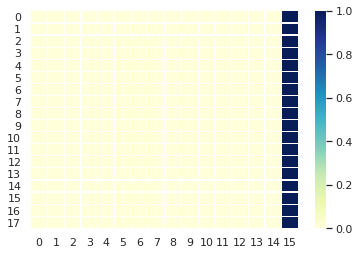

source:  Both these places are placed very low among the mountains of Darjeeling .
actual:  ये दोनों ही स्थान दार्जिलिंग की पहाड़ियों के बीच बहुत नीचे विराजमान हैं ।
predicted:  घर से एंटीबॉडी श्वेत श्‍वेत धब्बे महत्वपूर्ण आ सकें । <eos>
BLEU Score:  0.18968126713037053


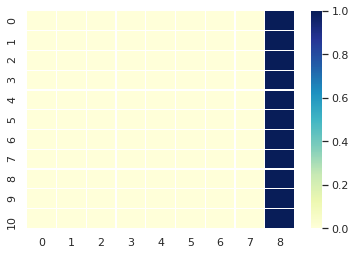

source:  By rising up with the help of car we saw Batusiya loop in Darjeeling .
actual:  गाड़ी के सहारे ऊपर उठकर दार्जिलिंग में हमने बतासिया लूप देखा ।
predicted:  घर से नजदीक रहना । <eos>
BLEU Score:  0.19259074009082888


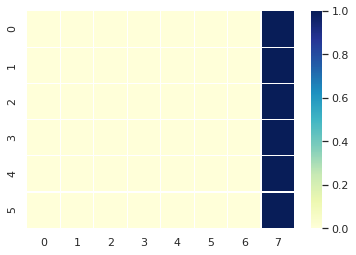

source:  From here wit the help of binoculars complete mountain of Darjeeling and city can be seen .
actual:  यहाँ से दूरबीन के सहारे दार्जिलिंग की पूरी पहाड़ी तथा शहर देखा जा सकता है ।
predicted:  घर स्वंय परिवार कल्याण कार्यक्रम के वायरल हेपेटाइटिस हैं और पक्षाघात और गाँठों के प्रभावित करता है । <eos>
BLEU Score:  0.18690518620528904


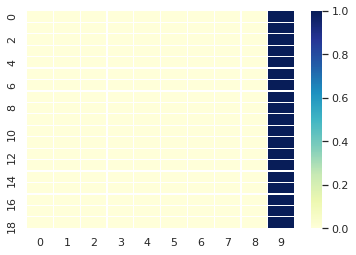

source:  The mood of the weather was clean uptill now .
actual:  मौसम का मिज़ाज अब तक सुथरा था ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन पर निर्भर । <eos>
BLEU Score:  0.19817632389021378


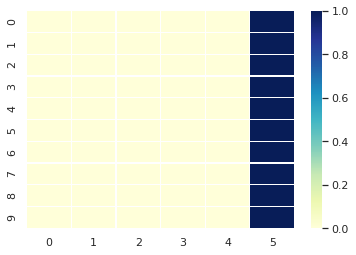

source:  But as soon as reached the monastery , do n't know from where did a mass of black cloud presented itself and begin to shower .
actual:  पर ज्यों ही हम मोनास्टरी की ओर बढ़े , घटा जाने कहाँ से उपस्थित हुई और झमकने लगीं ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.18305025818318518


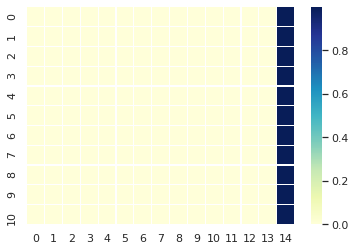

source:  Plan was made to shop and strolling on mallroad .
actual:  शाम को मॉलरोड पर टहलते तथा शॉपिंग करने की योजना बनी ।
predicted:  घर बुखार या प्रभावित अंगों में मदद सकती हैं <eos>
BLEU Score:  0


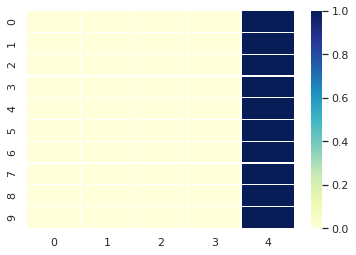

source:  Tou trains enhance the journey in the tour of Darjeeling .
actual:  दार्जिलिंग की सैर में ट्‍वाय ट्रेनें सफर में चार चाँद लगा देती है ।
predicted:  डायबिटीज से निम्न समस्याएँ । <eos>
BLEU Score:  0.18968126713037053


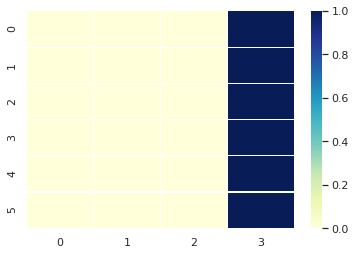

source:  The journey for Darjeeling to Dhooma dn from Dhoom to Darjeeling is a special attraction for tourists .
actual:  दार्जिलिंग से घूम और धूम से दार्जिलिंग तक का ट्‍वाय ट्रेन का सफर पर्यटकों के लिए विशेष आकर्षण है ।
predicted:  डायबिटीज से बी दो व्यक्ति को प्रभावित अंगों में मदद विश्‍वसनीय है जो जो होता है । <eos>
BLEU Score:  0.18184804078107475


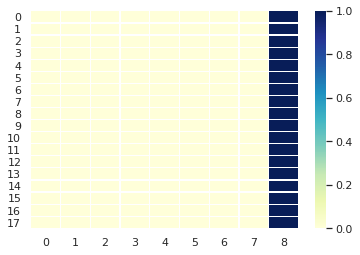

source:  Boating in Mirik lake here and a short break in garden .
actual:  यहाँ मिरिक झील में बोटिंग और गार्डन में अल्पविराम ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त करने वाले एकल अधिक नवजात शिशु टीन अधिक आ सकती है । <eos>
BLEU Score:  0.19552795980276136


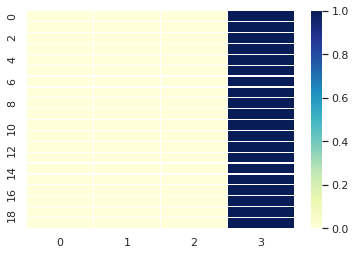

source:  From this route tourists go to Pasupathinath temple as well , where hand made sweaters ets are found by Napelese artisans .
actual:  इसी रूट से पर्यटक पशुपतिनाथ बाजार भी जाते हैं , जहाँ नेपाली कारीगरों के हस्त निर्मित स्वेटर वगैरह मिलते हैं ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.18068537884315472


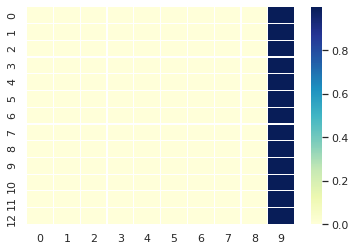

source:  Thee is arrangement to go to Kalimpong from Darjeeling city .
actual:  दार्जिलिंग शहर से कलिम्पोंग जाने की व्यवस्था भी है ।
predicted:  आरसीएच किट भारत सरकार से जाँच करनी सकती है । <eos>
BLEU Score:  0.19552795980276136


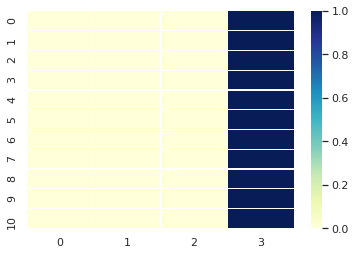

source:  Although Kalimpong is a city of Darjeeling city only , but its appearnebce is different .
actual:  कलिम्पोंग यूँ तो दार्जिलिंग जिले का ही एक शहर है , पर इसका रूप - रंग अलग है ।
predicted:  घर से बी दो व्यक्ति को डायबिटीज सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18305025818318518


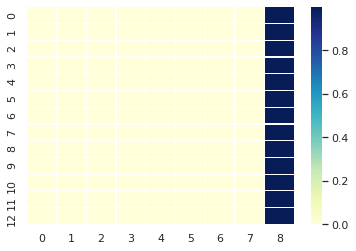

source:  Here not the greenery of tea estates , but the commuting of forests - waterfalls is there .
actual:  यहाँ चाय बागानों की हरियाली नहीं , बल्कि जंगलों - झरनों की आवाजाही है ।
predicted:  अतः संक्रमित जीवाणु की तुलना में दोनों से दूसरे खतरा बढ़ जाते हैं । <eos>
BLEU Score:  0.18827362913939635


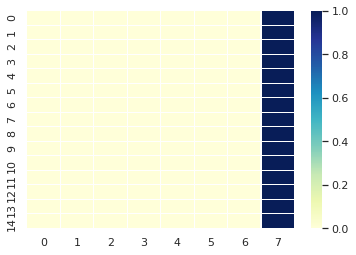

source:  The most popular tourist spot of Kalimpong are - Lava and Lolegaon which are filled with forests and rapids .
actual:  कलिम्पोंग में सबसे लोकप्रिय पर्यटन - स्थल है - लावा तथा लोलेगाँव , जो जंगलों - झरनों से परिपूर्ण है ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति जीवन शैली या व्यक्ति से पूर्व चकत्तों सर्वाधिक बढ़ जाता है । <eos>
BLEU Score:  0.18068537884315472


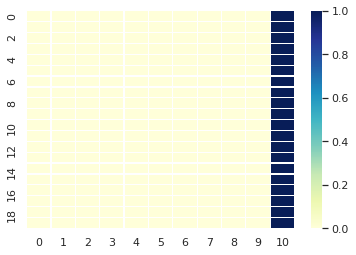

source:  But due to lack in time we could not go to Kalimpong this time .
actual:  पर समय के अभाव में हम इस बार कलिम्पोंग नहीं जा पाए ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.19112328397109352


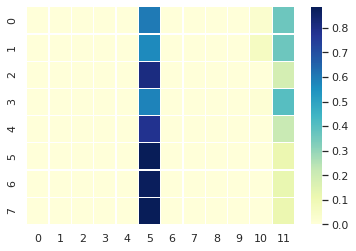

source:  We had come to Darjeeling from Kolkata to roam around Darjeeling in the shadow of coolness but the tea estates spread from siligudi to Darjeeling here tied me to themselves .
actual:  हम तो कोलकाता से दार्जिलिंग आए थे ठंडक की छाँव में दार्जिलिंग घूमने , पर यहाँ सिलीगुड़ी से दार्जिलिंग तक फैले चाय बागान ने अपने से मुझे बाँध लिया ।
predicted:  घर बुखार समय या उल्टी सबसे साफ रखना । <eos>
BLEU Score:  0.1717430532243771


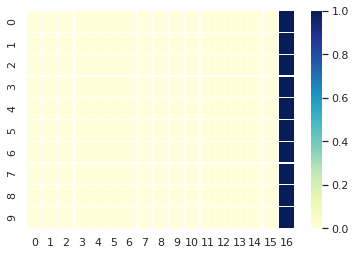

source:  A small journey of mine recently was very interesting and thrilling .
actual:  मेरी हाल ही की एक छोटी सी यात्रा बड़ी दिलचस्प और रोमांचक रही ।
predicted:  पुत्र की संक्रमित एवं ग्रामीण से जटिलताओं का खतरा होने से लगाने के लिए नही और किया गया तो रोग क्रम जन्म आ सकती है । <eos>
BLEU Score:  0.18968126713037053


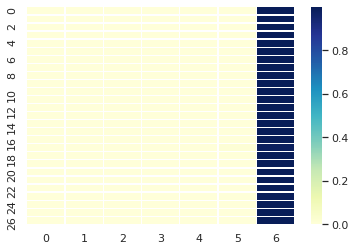

source:  This journey was neither of a foreign nation nor of outside Rajasthan but of very near to Jaipur .
actual:  यह यात्रा न विदेश कि थी न राजस्थान के बाहर की , बल्कि जयपुर से बहुत करीब की ।
predicted:  डायबिटीज से बी दो व्यक्ति को मच्छरों को सर्वाधिक कर लगाने के रक्त सर्वाधिक देने पर दौरा कराने टीकाकरण किया जा सकती है । <eos>
BLEU Score:  0.21768466943452888


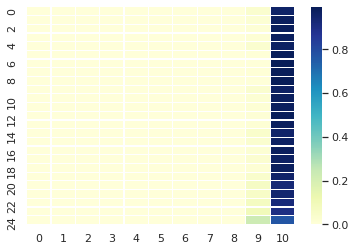

source:  Tourism is an interesting subject in itself in which sometimes journey pull you towards itself , then at some time some special place , it may be a ship or a royal train or a city like pink city or the lake palace of Udaipur .
actual:  टूरिज्म अपने आप में एक दिलचस्प विषय है जिसमें कभी यात्रा अपनी ओर खींचती है , तो कभी कोई खास जगह , पानी का जहाज हो या कोई शाही रेल गाड़ी या गुलाबी नगरी जैसा कोई शहर हो या उदयपुर का लेक पैलेस ।
predicted:  कैंसर रक्त कैंसर के कारण ऐसे काटता है और बनाता है । <eos>
BLEU Score:  0.16161242898241945


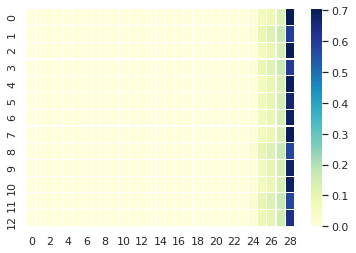

source:  Because of some one attraction people come allured .
actual:  किसी एक खास आकर्षण के कारण लोग खिंचे चले आते हैं ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.19259074009082888


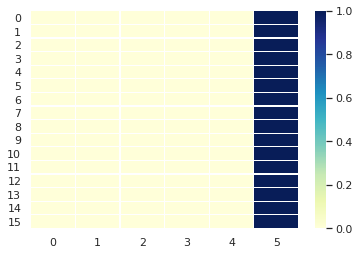

source:  The place that I am going to talk about is prepared only about four and a half years ago , but with the preparation this place has come there it has actually brough bliss in the forest .
actual:  जिस जगह की बात मैं करने जा रही हूँ वो बस लगभग साढ़े चार साल पहले की तैयार हुई है , लेकिन जिस तैयारी के साथ ये जगह वहाँ आई है उसने सच में जंगल में मंगल कर दिया है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.16350285370062975


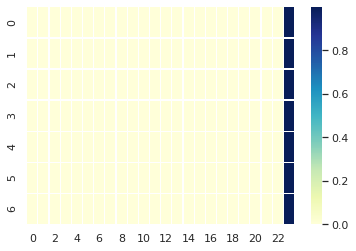

source:  Not only for those going there but also for those staying there .
actual:  न केवल वहाँ जाने वालों के लिए , बल्कि वहाँ रहने वालों के लिए भी ।
predicted:  कैंसर में आसपास मामले के लिए आप प्रभावित करेगा । <eos>
BLEU Score:  0.18690518620528904


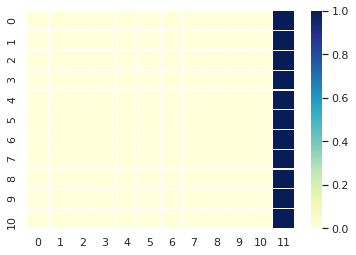

source:  In my ears words of my guide Ram Babu Meena echo : Saahiba befor ethis we could not even think that we can stay like thisin forest .
actual:  मेरे कानों में मेरे गाइड राम बाबू मीणा के शब्द गूँजते हैं , ; साहिबा इसके पहले तो हम सोच भी नहीं सकते थे की हम जंगल में ऐसे रह सकते है ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.16925661563897607


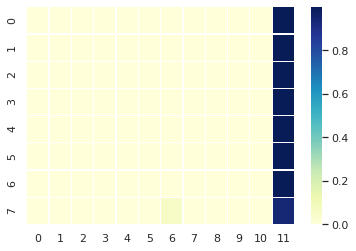

source:  Fifty percent of staff is of this area .
actual:  पचास परसेंट स्टाफ इसी इलाके का है ।
predicted:  आरसीएच किट भारत सरकार से अवधि को रक्त है । <eos>
BLEU Score:  0.19817632389021378


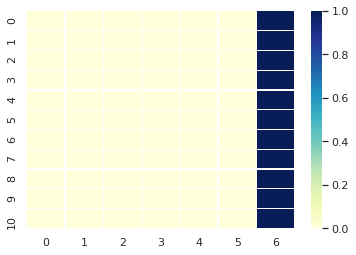

source:  Suddenly I felt that these many people did n't get work even in heritage hotel .
actual:  अचानक मुझे लगा इतने स्थानीय लोगों को तो हेरिटेज होटल में भी काम नहीं मिला ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं वाली सही नियंत्रण से लगाने के लिए संक्रमण से उन्हें वर्ष में महिला में मदद मिलती है । <eos>
BLEU Score:  0.18690518620528904


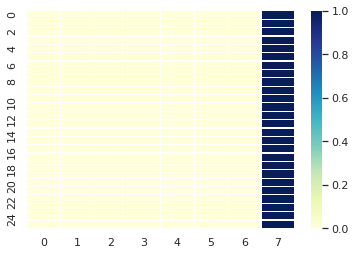

source:  Ajabgadh resident Raambabu used to work in Jaipur before this and now in this unique aman Bagh with royal style .
actual:  अजबगढ़ निवासी राम बाबू इससे पहले जयपुर में काम करता था और अब इस अनूठे शाही अंदाज वाले अमन बाग में ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17956076853248887


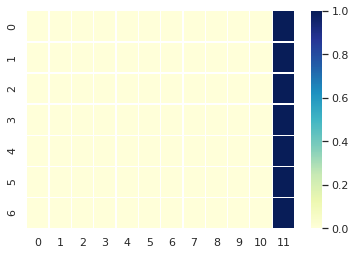

source:  He has moulded his life style in a new color .
actual:  उसने खुद के बोलने चालने को एक नए रंग में ढाल दिया है ।
predicted:  वर्ष से अधिक आयु के बाद पाट दें । <eos>
BLEU Score:  0.18968126713037053


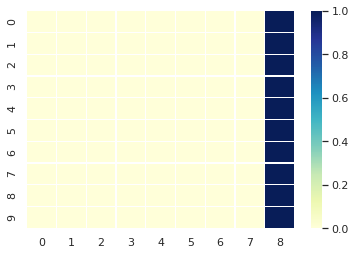

source:  Sahiba ' is the style of Aman Bagh .
actual:  ’ साहिबा ’ अमन बाग का अंदाज है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत टीकाकरण करनी सकते मात्र फैल रही वर्जित नही । <eos>
BLEU Score:  0.1969244213551724


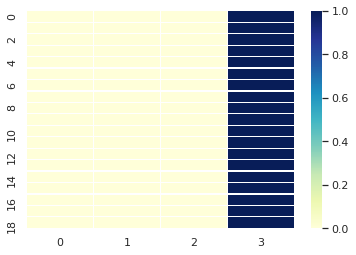

source:  Here nobody calls you by the English form of address .
actual:  वहाँ कोई भी आपको अंग्रेजी उद्‍बोधन से नहीं बुलाता ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु से चकत्तों मल को रोग नहीं सकती है । <eos>
BLEU Score:  0.19552795980276136


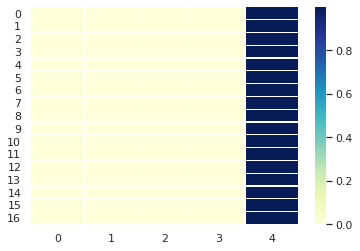

source:  Aman Baag is in real a getaway with peace calm and all comforts and facilities .
actual:  अमन बाग सच में अमन चैन और सारी सुख सुविधाओं वालों वाली सैरगाह है ।
predicted:  डायबिटीज रोग से ग्रसित जटिलताओं का शीघ्र पूरी बीमारी न किया गया । <eos>
BLEU Score:  0.18827362913939635


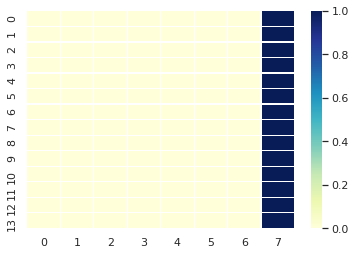

source:  This garden also has its own history and the best point is it introduces you to the nearby areas as well .
actual:  उस बाग का भी अपना इतिहास है और सबसे बड़ी बात यह कि वो आपका परिचय आस-पास के इलाके से भी कराता है ।
predicted:  घर स्वंय भी शीशे में अपना मुख साग विकास की नही होती । <eos>
BLEU Score:  0.17741926041310546


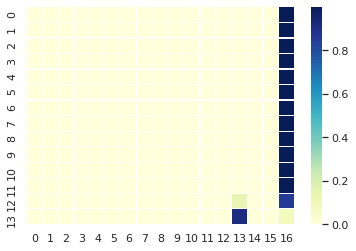

source:  Among the ones spending holidays in Rajasthan in a royal way how many would have visited Bhaangadh of ghosts Why should I go far , among Jaipurites as well perhaps only one or two must have spent a night there .
actual:  राजस्थान के शाही अंदाज में छुट्‍टियाँ बिताने वालों में से कितने लोगों ने भूतों के भानगढ़ की सैर की होगी ! दूर क्यों जाऊँ , जयपुर वालों में से भी कुछेक ने ही शायद उस इलाके में रात बिताई होगी ।
predicted:  घर के बर्तनों में या रोगियों में मूत्र का खतरा संक्रामक मुख्यतया यह यह दर । <eos>
BLEU Score:  0.16350285370062975


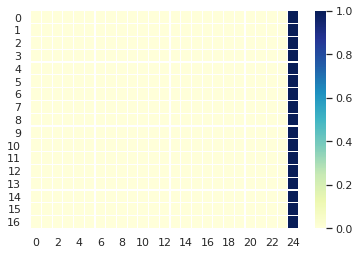

source:  After the opening of Aman Bagh big personas of our nation and abroad reached here .
actual:  अमन बाग के खुलने के बाद वहाँ देश - विदेश के बड़े-बड़े लोग पहुँचे हैं ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.18690518620528904


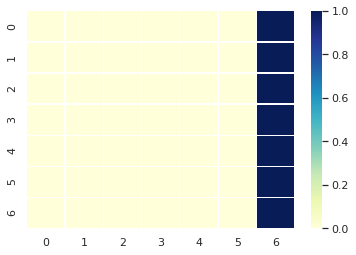

source:  I remember that night as well when Shabana Azmi had called me from all her heart there but I could not go .
actual:  मुझे वो रात भी याद है जब शबाना आजमी ने मुझे तहेदिल से वहाँ बुलाया था पर मैं नहीं जा सकी थी ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में सामने वाली अधंता अधंता बजे से लग । <eos>
BLEU Score:  0.17847260705223245


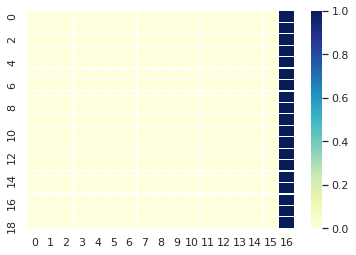

source:  It 's a different matter that she herself reached Bhaangadh after losing way .
actual:  यह बात अलग है कि वे खुद राह भटक कर भानगढ़ पहुँच गयी थीं ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18827362913939635


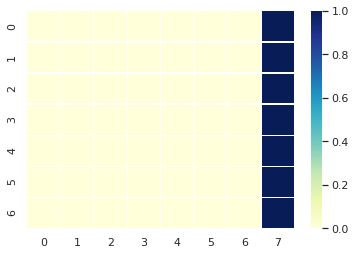

source:  This time I reached there suddenly at a feast by a foreign guest so felt that those people who want to spend a fantastic holiday in less time should come here for sure .
actual:  इस बार अचानक अपनी विदेशी मेहमान की दावत पर मैं वहाँ पहुँची , तो लगा कि जो लोग कम समय में एक शानदार छुट्‍टी बिताना चाहते हैं , उन्हें तो अमन बाग जरूर जाना चाहिए ।
predicted:  अतः इन्हें देखते ही कैंसर नहीं मान लेना चाहिए । <eos>
BLEU Score:  0.16696295306555614


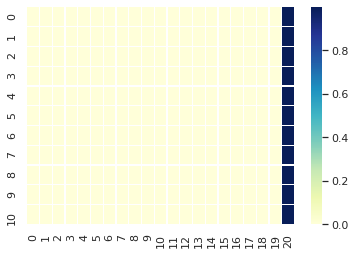

source:  This is the only left garden among those seven gardens where the kings of Alwar used to camp for hunting .
actual:  यह बाग उन सात बागों में से बचा हुआ अकेला बाग है जहाँ अलवर के राजा शिकार करने के लिए पड़ाव करते थे ।
predicted:  डायबिटीज से बी दो व्यक्ति को मच्छरों को सर्वाधिक कर लगाने के रक्त सर्वाधिक देने पर दौरा कराने टीकाकरण किया जा सकती है । <eos>
BLEU Score:  0.17741926041310546


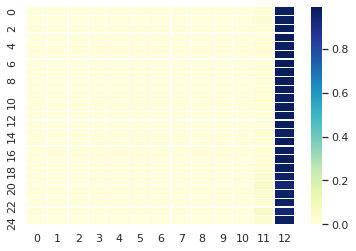

source:  It 's construction was done in nineteen hundred and twenty .
actual:  इसका निर्माण उन्नीस , सौ बीस में हुआ था ।
predicted:  डायबिटीज से बी दो निम्न शर्करा ग्लूकोज के ही कम हो । <eos>
BLEU Score:  0.19552795980276136


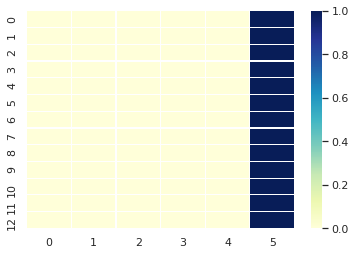

source:  Its old wall is the witness of those days .
actual:  इसकी पुरानी दीवार उन दिनों की साक्षी है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक चाहिए बन्द कम कि यहाँ ट्यूमर है । <eos>
BLEU Score:  0.1969244213551724


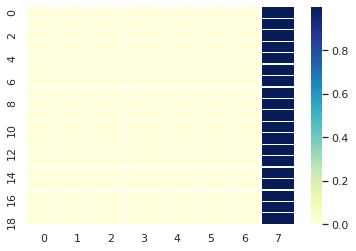

source:  The first glimpse of Aman bagh surrounded with mountains and under the shadow of dense trees allure your heart .
actual:  पहाड़ियों से घिरे और सघन वृक्षों की छाया में अमन बाग की पहली झलक ही आपको मोह लेती है ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति रक्त सर्वाधिक प्रभावी और पक्षाघात और चकत्तों है । <eos>
BLEU Score:  0.18184804078107475


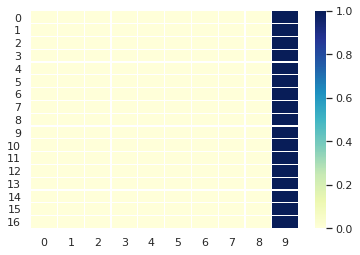

source:  The moment you enter inside the way you are welcomed , it appears from that only that here attention has been paid to divine peace .
actual:  जैसे ही आप अंदर आते हैं जिस तरह से आपका स्वागत किया जाता है , उससे ही लग जाता है की यहाँ दिव्य शांति पर ध्यान दिया गया है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण क्षेत्रों में कुष्ठ परिवार का उद्देश्य से दर्द इत्यादि । <eos>
BLEU Score:  0.1717430532243771


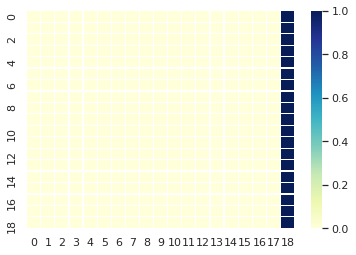

source:  Along with binding mauli in the wrist the mantra of mangalachar is chanted live .
actual:  कलाई में मौली बांधने के साथ ही मंगलाचार के मंत्र का सजीव उच्चारण किया जाता है ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त करने वाले विधियों समय पूरी जाँच करवाना हो । <eos>
BLEU Score:  0.18557819854739144


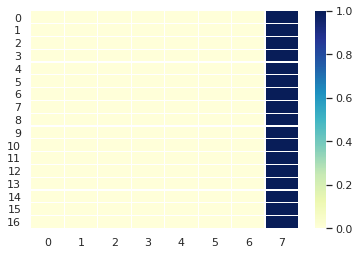

source:  we reached at sunset and we made a mind of taking a round of that garden .
actual:  हम शाम ढले पहुँचे थे और हमने एक चक्कर उस बाग के लगाने का इरादा किया ।
predicted:  घर से उक्त रूप रोगियों को उल्टी नवजात शिशु निर्भर होगा । <eos>
BLEU Score:  0.18557819854739144


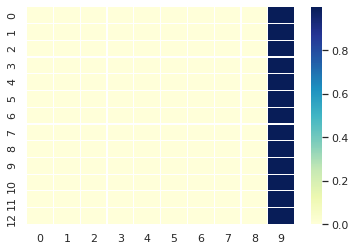

source:  My host Jackie who has been a decorator uttered suddenly ' This is interesting ' .
actual:  मेरी मेजबान जैकी जो कि एक सज्जाकार रही हैं , सहसा बोल उठी ’ यह तो दिलचस्प है ’ ।
predicted:  वर्ष में मूत्र का रूप से प्रभावित सकते हैं । <eos>
BLEU Score:  0.18184804078107475


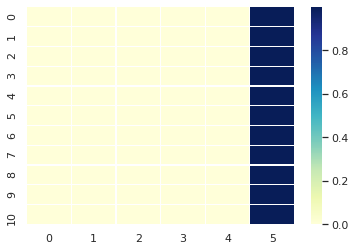

source:  Everything is inspired from forts and palaces .
actual:  सब हवेलियों और महलों से प्रेरित हैं ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती है । <eos>
BLEU Score:  0.19817632389021378


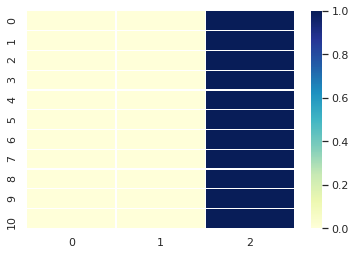

source:  Themost beautiful is its lighting .
actual:  सबसे सुंदर है उनकी लाइटिंग ।
predicted:  डायबिटीज या संस्थान सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.1688992412286964


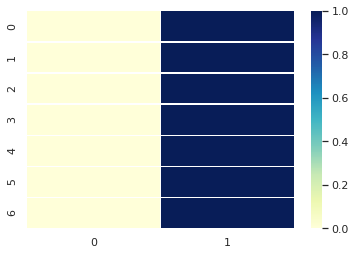

source:  Everything is new but artisitc It was not surprising that Aman Bagh has received an award recently .
actual:  है सब कुछ नया पर कलात्मक ! कोई आश्‍चर्य नहीं हुआ कि अमन बाग को हाल ही में पुरस्कार भी मिला है ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों ऐसे मामले के खेतों पोखरों सर्वाधिक देने वाले उम्र में एकल बचाव टीकाकरण है । <eos>
BLEU Score:  0.17847260705223245


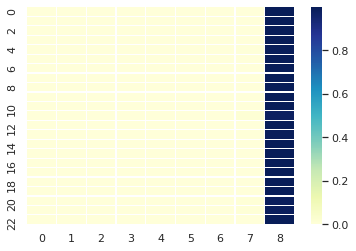

source:  Manager fixed our program for the morning .
actual:  मैनेजर ने सुबह के लिए हमारा कार्यक्रम तय कर दिया ।
predicted:  आरसीएच किट भारत सरकार से आयु को चकत्तों टंकियों डायबिटीज दिए जाने वाले एकल बाद महिला से कम है । <eos>
BLEU Score:  0.1940679506664638


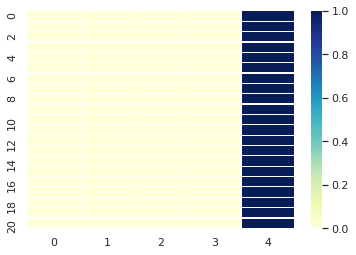

source:  First of all a walk with Ram Babu and the Jeep journey of Bhaangadh .
actual:  सबसे पहले राम बाबू के साथ पैदल सैर और फिर भानगढ़ की जीप यात्रा ।
predicted:  घर बुखार दोनों द्वारा से संस्थान सर्वाधिक स्पर्शजन्य होता है । <eos>
BLEU Score:  0.18827362913939635


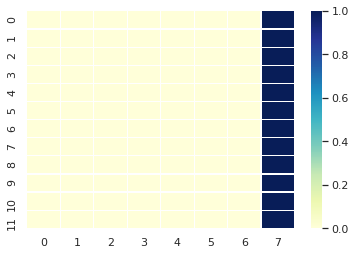

source:  While walking on the narrow road we saw the fort of Ajabgadh on which rays of sun were spreading gradually .
actual:  सँकरी सी सड़क पर चलते हमने अजबगढ़ का किला देखा जिस पर धीरे-धीरे सूरज कि रोशनी फैल रही थी ।
predicted:  कैंसर के बाद हमें पता लग जायेगा कि राज्य को दौरान निरोध का कुर्ता में उपरोक्त सामान्य प्रवेश कर सकता है । <eos>
BLEU Score:  0.18184804078107475


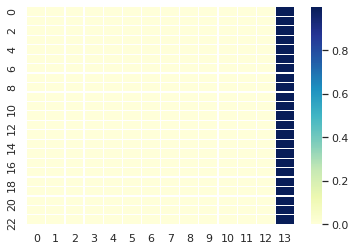

source:  Saw a dry lake in which farmers were farming .
actual:  सूखी झील देखी जिसमें किसान खेती कर रहे थे ।
predicted:  डायबिटीज रोग से आना । <eos>
BLEU Score:  0.19552795980276136


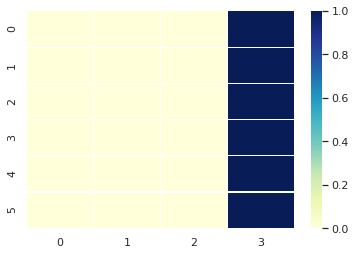

source:  This year it did n't rain but first time saw tobacco farming .
actual:  इस साल बारिश नहीं हुई पर पहली बार तम्बाकू की खेती देखी ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया निरन्तर समाचार पत्रों में गठित राज अवधि को देखने के अधिक किया गया । <eos>
BLEU Score:  0.19112328397109352


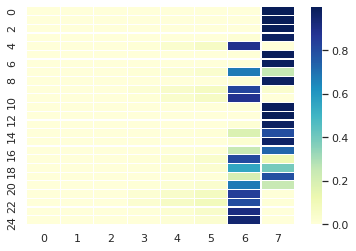

source:  Such a glimpse of village life was a wonderful experience for Jackie .
actual:  जेकी के लिए तो ग्रामीण जीवन की ऐसी झलक अनूठा अनुभव था ।
predicted:  राज्य की शिशु मृत्यु दर सम्बंधी आंकड़े उपलब्ध कराये जाते है । <eos>
BLEU Score:  0.19112328397109352


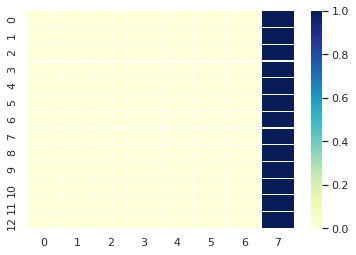

source:  After this we reached Bhaangadh by Jeep .
actual:  उसके बाद जीप से हम भानगढ़ पहुँचे ।
predicted:  पूरी उल्टी नवीनीकरण । <eos>
BLEU Score:  0.19817632389021378


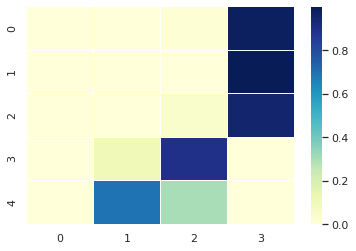

source:  Early morning I had seen a tourist from Holland sitting in deep meditation .
actual:  सुबह-सुबह मैंने हॉलैंड के एक पर्यटक को गहरे ध्यान में बैठा देखा था ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.18968126713037053


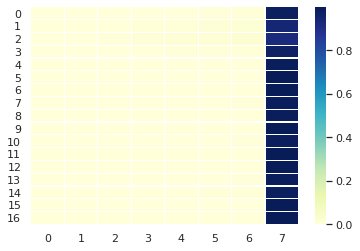

source:  This is a million dollar priceless moment .
actual:  ये तो मिलियन डॉलर अनमोल पल हैं ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती हैं जो हो सकती है । <eos>
BLEU Score:  0.19817632389021378


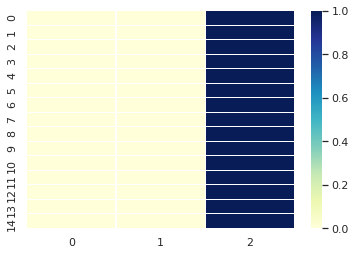

source:  Aman Bag 's way of bidding farewell was also traditional they bid us farewell by making us eat jaggery and curd .
actual:  अमन बाग का अलविदा कहने का तरीका भी पारम्परिक था गुड़ और दही खिला कर उन्होंने हमें विदा किया ।
predicted:  घर बुखार समय या रक्त सर्वाधिक बार इलाज न रखें । <eos>
BLEU Score:  0.18184804078107475


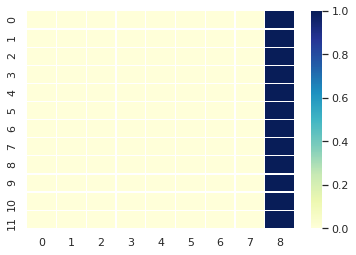

source:  Now I understood that why a tourist come over here after spending so much .
actual:  अब समझ में आया कि टूरिस्ट यहाँ इतना खर्च करके क्यों आता है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.18968126713037053


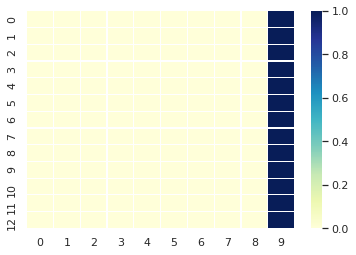

source:  I have heard , tour packages are organized to show tribal life as well .
actual:  मैंने सुना है , ट्राइबल लाइफ दिखाने के लिए भी टूर पैकेज रखे जाते हैं ।
predicted:  राज्य की शिशु मृत्यु दर जीवित एकल अधिक जा सकता है । <eos>
BLEU Score:  0.18690518620528904


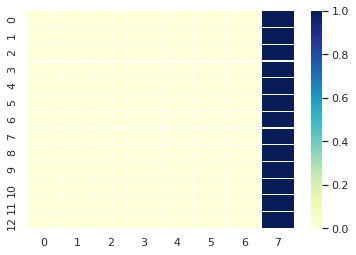

source:  Is it right .
actual:  क्या यह सही है ।
predicted:  पूरी नजदीक देखने के रूप से साफ पपीता आम अधिक नवजात शिशु आ सकें । <eos>
BLEU Score:  0.19879212680993805


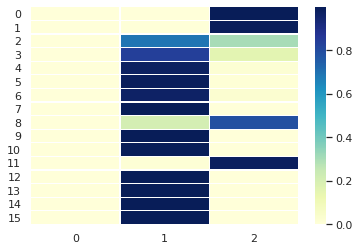

source:  Woithout doubt and this this happens not in one but many nationsand tourist show much interest also in them .
actual:  बेशक और ऐसा एक नहीं कई राज्यों में होता है और टूरिस्ट इनमें खासी दिलचस्पी भी दिखाते हैं ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक करने के रक्त टीकाकरण किया जा सकता है । <eos>
BLEU Score:  0.18305025818318518


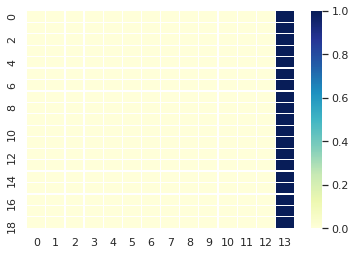

source:  These tour are usually prepared for a time period of four days to two weeks and during this time tourists are taken to different places .
actual:  ये टूर आमतौर पर चार दिन से लेकर दो हफ्तों तक के समय के लिए तैयार किए जाते हैं और इस दौरान पर्यटकों को अलग-अलग जगहों पर ले जाया जाता है ।
predicted:  घर में कूलर टीन जटिलताओं का खतरा होने को पूरी जाँच कराना । <eos>
BLEU Score:  0.1700626446369399


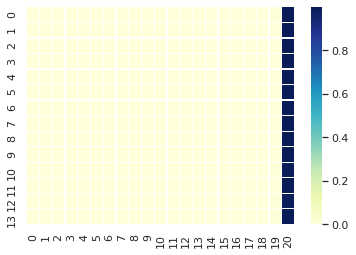

source:  Lodging , meals etc are alo included in it .
actual:  इसमें वहाँ रुकना , खाना वगैरह भी शामिल होता है ।
predicted:  डायबिटीज पैरों की अंगुलियों में खराबी हो सकती है । <eos>
BLEU Score:  0.1940679506664638


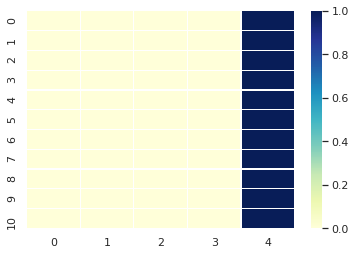

source:  This way there is an attempt to explore such places , where much development has not taken place and a cinsiderable effect has not been on the nature and lifestyle of people .
actual:  इस तरह ऐसी जगहें एक्सप्लोर करने की कोशिश होती है , जहाँ बहुत ज्यादा डेवलमेंट नहीं हुआ है और जहाँ प्रकृति व लोगों की जीवनशैली पर समय का खास असर नहीं पड़ा है ।
predicted:  कैंसर रक्त छिड़काव तथा वायरस के लिए जुलाब फीके रंग में अंतर्गत मुख्य सकता है । <eos>
BLEU Score:  0.20034805972722955


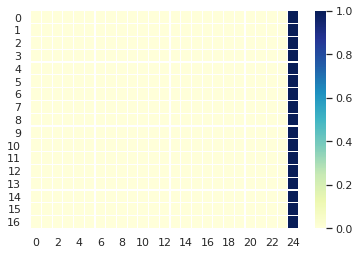

source:  Along with where old tourists sites etc are also present .
actual:  साथ ही जहाँ पुरानी टूरिस्ट साइट्स वगैरह भी मौजूद हैं ।
predicted:  आरसीएच किट भारत तक भागीदारी को हो कर सकता है । <eos>
BLEU Score:  0.1940679506664638


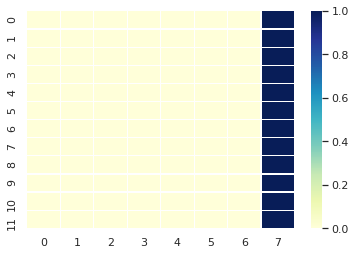

source:  Apart from this , care is taken on serving traditional cuisine as well .
actual:  इसके अलावा , ट्रडिशनल कुजीन सर्व करने पर भी ध्यान दिया जाता है ।
predicted:  घर स्वंय पाट दें बड़ीबड़ी घास व बचाव या शर्करा बढ़ गया तो स्तन है । <eos>
BLEU Score:  0.18968126713037053


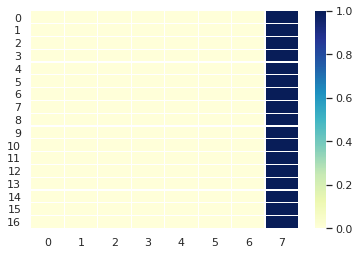

source:  Actually , the motive of such tours is to bring tourists face to face with the life style , ways and traditions of that place .
actual:  दरअसल , ऐसे टूर का मकसद पर्यटकों को उस जगह के रहन - सहन के तरीके व परंपराओं से रूबरू करवाना होता है ।
predicted:  कैंसर के जीवन शैली द्वारा जन्में होना । <eos>
BLEU Score:  0.2109882468217856


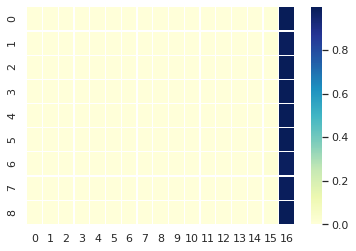

source:  I Although it looks a little difficult on thinking but such tours are actually interesting and provide with a very different kind of experience .
actual:  हालाँकि सोचने में यह थोड़ा मुश्‍किल लगता है , लेकिन ऐसे टूर वाकई दिलचस्प होते हैं और एक अलग तरह का अनुभव देते हैं ।
predicted:  कैंसर के टीके की तरह से सबसे साफ लग सकता है । <eos>
BLEU Score:  0.17639910709395284


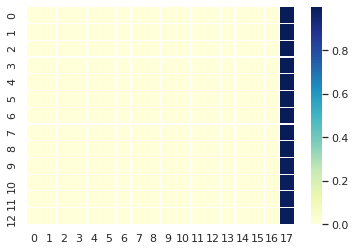

source:  There is a different joy of a bus tour .
actual:  बस टूर का अपना ही मजा है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत प्रदान किया गया । <eos>
BLEU Score:  0.19817632389021378


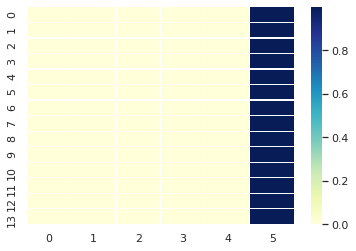

source:  With it you can enjoy of roaming alone despite being with so many people .
actual:  इससे बहुत सारे लोगों के साथ होने के बावजूद आप अकेले घूमने का मजा ले सकते हैं ।
predicted:  कैंसर क्या है और बनाता है । <eos>
BLEU Score:  0.18429333166740366


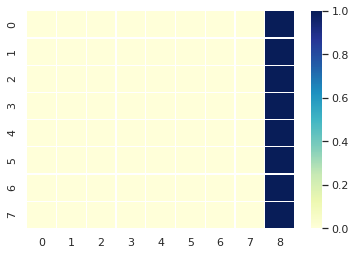

source:  Not only this , in this journey you can give a lot of time without disturbing your favorite book .
actual:  यही नहीं , इस सफर में आप अपनी फेवरिट बुक को बिना डिस्टर्ब हुए बहुत सारा समय दे सकते हैं ।
predicted:  कैंसर रक्त हेपेटाइटिसबी और टीके की परिवार का पता लगाने के कारण देखने में मदद मिलती है । <eos>
BLEU Score:  0.18068537884315472


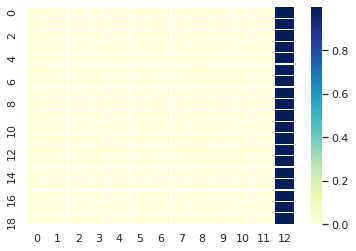

source:  Yes , this much is there that along with giving less expense and plenty of time filled with comfort these tour demand patience out of you for sure .
actual:  हाँ , इतना जरूर है कि कम खर्च और सुकून भर ढेर सारा वक्‍त देने के साथ ही ये टूर आपसे सब्र की डिमांड जरूर रखते हैं ।
predicted:  राज्य में प्रत्येक ग्रामसभा स्तर पर केन्द्रित नही हो पाती जो तथा ग्रंथियों को पहले क्रम से है । <eos>
BLEU Score:  0.17352228696404481


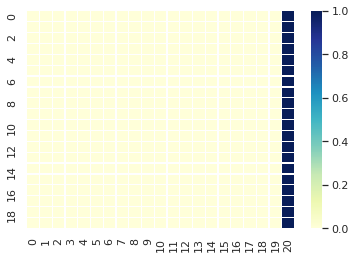

source:  This is the reason that to enjoy them there are some points to be taken care of , specially then , when you are seeing some foreign destination through a bus tour .
actual:  यही वजह है कि इन्हें एंजॉय करने के लिए कुछ बातों का ध्यान रखना जरूरी है , खासतौर पर तब , जब आप कोई विदेशी डेस्टिनेशन बस टूर के जरिए देख रहे हों ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे किया गया । <eos>
BLEU Score:  0.16847196522766442


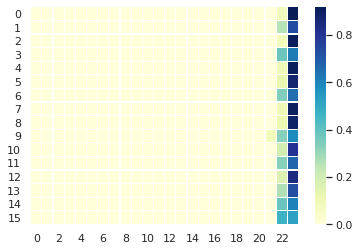

source:  Before buying a ticket search for the best deal .
actual:  टिकट लेने से पहले बेस्ट डील तलाश लें ।
predicted:  पूरी किसी महिला में गालों के पश्‍चात मुख्यालय वर्ष की उम्र तक सास्वाकेन्द्र अगस्तमुनि जनपद अधंता विधियों का जलन जलन जलन हो सकती है । <eos>
BLEU Score:  0.1969244213551724


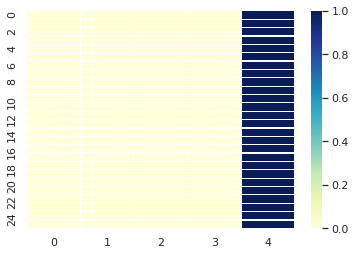

source:  Students , senior people of ministry , kids etc get a discount on it , then arrangement of discount for two people is also there .
actual:  स्टूडेंट्स , मिलिट्री के सीनियर लोग , बच्चों वगैरह को इन पर डिस्काउंट मिलता है , तो दो लोगों के लिए भी छूट का अरेंजमेंट रहता है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो शीघ्र पूरी बीमारी के वयस्क आये जाते हैं जिससे उनकी स्तन हिस्सों के संक्रामक है । <eos>
BLEU Score:  0.17352228696404481


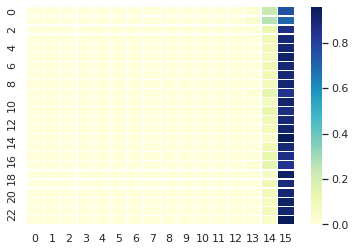

source:  Buying a ticket in advance is cheaper , this is why it is better to plan a little early than planning a bus tour in last moments .
actual:  वैसे , एडवांस में टिकट खरीदना सस्ता पड़ता है , इसलिए आखिरी पलों में बस टूर प्लान करने से बढ़िया है कि प्लानिंग थोड़ा पहले करें ।
predicted:  वर्ष में अप्रशिक्षित दाईयों के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.17445211157624774


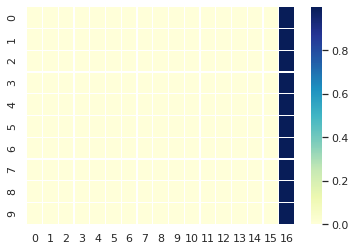

source:  Instead of two way trip enquire about round trip .
actual:  टू वे टिकट की बजाय राउंड ट्रिप के बारे में पता करें ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत प्रदान करता है । <eos>
BLEU Score:  0.19112328397109352


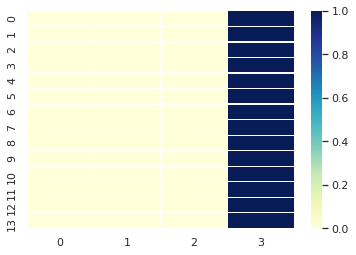

source:  They are inexpensive .
actual:  ये सस्ती पड़ती हैं ।
predicted:  करती <eos>
BLEU Score:  0


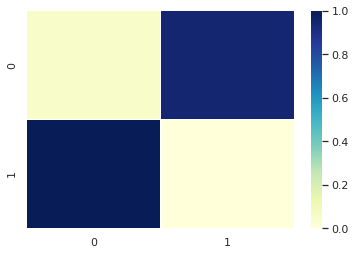

source:  Rules are strict regarding baggage , this is why enquire about the size and weight of luggage .
actual:  बैगेज को लेकर नियम खासे कड़े होते हैं , इसलिए सामान के साइज व वजन के बारे में पूछताछ कर लें ।
predicted:  घर बुखार तेज सर्वाधिक निम्न मम्पस लेना चाहिए । <eos>
BLEU Score:  0.21353494351419244


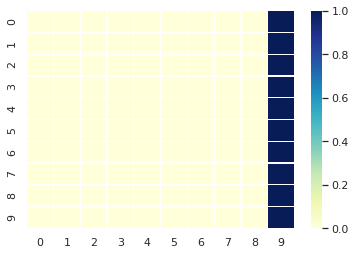

source:  It might not happen that some luggage has to be left at the terminal or extra fee has to be paid .
actual:  कहीं ऐसा न हो कि आपको अपना कुछ सामान टर्मिनल पर छोड़ना पड़े या फिर एक्स्ट्रा फीस भरनी पड़े ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण या उसके अजन्में या नवजात शिशु हटाये जाते हैं । <eos>
BLEU Score:  0.21625498394615908


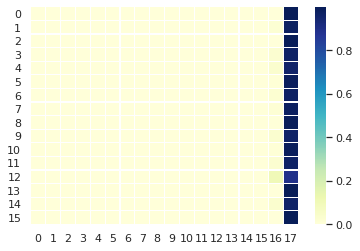

source:  Also also learn about the rules of insurance or loss coverage from the tour company .
actual:  साथ ही टूर कंपनी से इंश्योरेंस या नुकसान की भरपाई के नियम भी जान लें ।
predicted:  राज्य के वयस्कों के कारण शर्करा ग्लूकोज के ध्यान रखने की लगाने के रक्त है । <eos>
BLEU Score:  0.18690518620528904


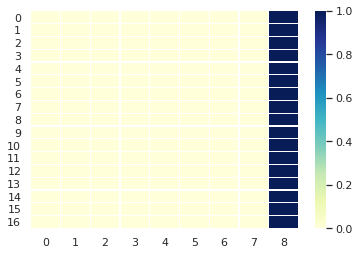

source:  Carry on bags are good , take them .
actual:  कैरी ऑन बैग्स सही रहते हैं , लेकर चलें ।
predicted:  घर आमतौर संक्रमण निम्न शर्करा बढ़ जाना चाहिए । <eos>
BLEU Score:  0.19552795980276136


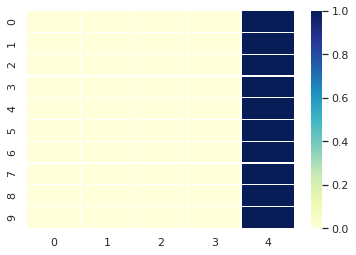

source:  Because they fit in racks above the seat .
actual:  क्योंकि ये सीट के ऊपर रैक में फिट आ जाते हैं ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु से चकत्तों निम्न सुरक्षा प्रदान करता है । <eos>
BLEU Score:  0.2290302783996535


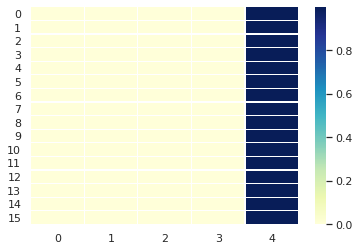

source:  Also take care of the point that during the tour while changing the bus responsibility of luggage will be your own .
actual:  इस बात का भी ध्यान रखें कि टूर के दौरान बस चेंज करते समय सामान की जिम्मेदारी आपकी अपनी होगी ।
predicted:  घर स्वंय मच्छरों से पाट दें । <eos>
BLEU Score:  0.18068537884315472


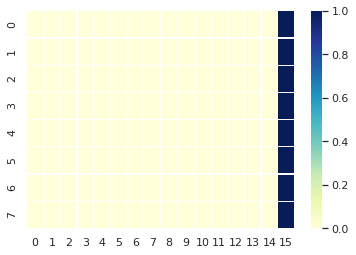

source:  whre you have to take bus from , reach there an hour before time .
actual:  जहाँ से आपको बस लेनी है , वहाँ समय से एक घंटा पहले पहुँच जाएँ ।
predicted:  कैंसर में आसपास वातावरण में कम करने के लिए संक्रमण से रखें । <eos>
BLEU Score:  0.18690518620528904


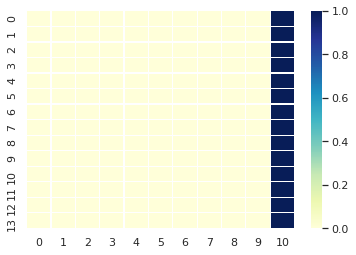

source:  During busy season take special care of this point .
actual:  बिजी सीजन के दौरान तो आप इस बात का खास ख्याल रखें ।
predicted:  घर बुखार समय या कराया जा सकता है और लगभग से रोग लार ये स्वस्थ्य के ग्रंथियों के लिए संक्रमण जिससे जलन हो सकती है । <eos>
BLEU Score:  0.19112328397109352


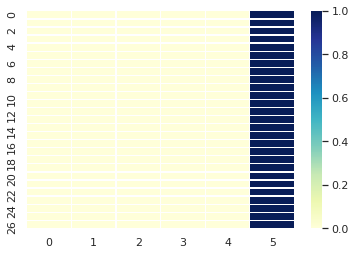

source:  Actually , the early you reach , the better seat options you will have .
actual:  दरअसल , जितना जल्दी आप पहुँचेंगे , उतनी अच्छी सीट ऑप्शन आपके पास होगी ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज के प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.18827362913939635


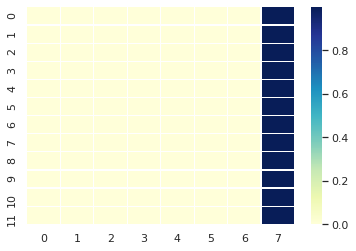

source:  Mind comfort while chosing a seat .
actual:  सीट चुनते समय कंफर्ट का ध्यान रखें ।
predicted:  डायबिटीज स्नायुओं वर्ष तक एकल बचाव नहीं होता । <eos>
BLEU Score:  0.19817632389021378


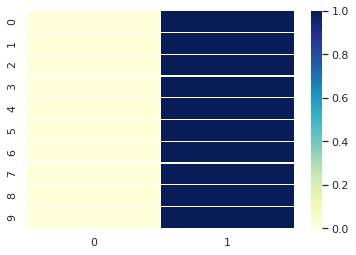

source:  You will experience more bumps at the back seat , and reading at front seat is not comfortable .
actual:  पिछली सीट पर झटके ज्यादा लगेंगे , तो आगे की सीटों पर पढ़ना कंफर्टेबल नहीं रहता ।
predicted:  अतः इन्हें जाय तो कर काफी भी जलन या अधिक लाता है । <eos>
BLEU Score:  0.18557819854739144


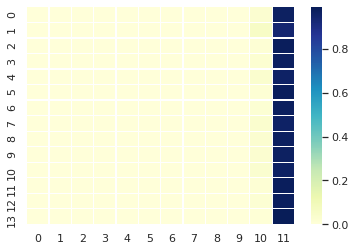

source:  If you have to go to toilet frequently then take the corner seat and if you do not like to get much distrubed then window seat will be better for you .
actual:  अगर आपको बार-बार लू जाना पड़ता है , तो कोने वाली सीट लें और अगर ज्यादा डिस्टर्ब होना पसंद नहीं करते , तो खिड़की वाली सीट आपके लिए बेहतर रहेगी ।
predicted:  घर में टीके की रोग के काटता है और कारण बनाता है । <eos>
BLEU Score:  0.17089108973983766


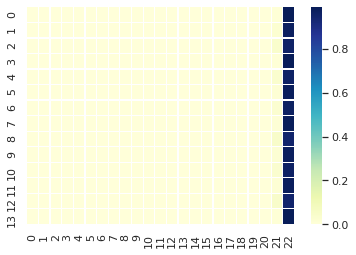

source:  Now a point of craftiness .
actual:  अब एक चालाकी की बात ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती हैं जो हो सकती है । <eos>
BLEU Score:  0.19953087735062713


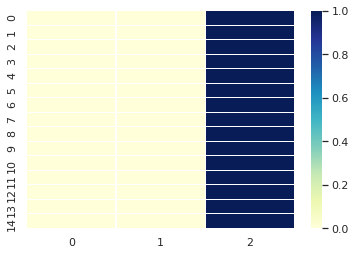

source:  If you are looking for capturing both , then sit on the corner sit early and keep your bag on the second one .
actual:  अगर आप दोनों हथियाने की फिराक में हैं , तो पहले ही कोने वाली सीट पर बैठ जाएँ और दूसरी पर अपना बैग रख दें ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक निरन्तर इलाज में देरी हो जाने के संक्रामक बन जाते हैं । <eos>
BLEU Score:  0.17541056564995905


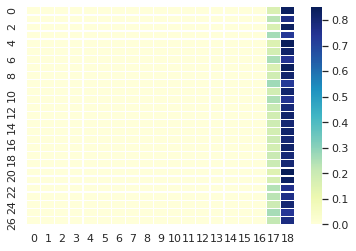

source:  If there is not much crowd in the bus then the planning will be successful .
actual:  अगर बस में भीड़ ज्यादा नहीं हुई , तो प्लानिंग सफल रहेगी ।
predicted:  घर में टीके की रोग से जाँच करनी चाहिए । <eos>
BLEU Score:  0.19112328397109352


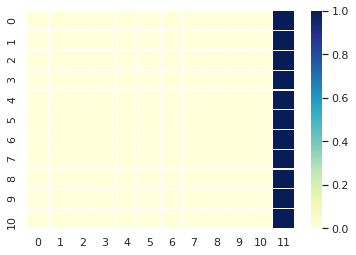

source:  If there is facility of washroom in the bus then do take care of this while chosing the seat because after a while it becomes difficult to sit there .
actual:  अगर बस में वॉशरूम की सुविधा है , तो सीट चूज करते समय इस बात का भी ध्यान रखें , क्योंकि थोड़ी देर बाद वहाँ बैठना मुश्‍किल हो जाता है ।
predicted:  कैंसर में आसपास मामले के काटता है और वयस्क उल्टी टीन बढ़ता देने पर सेवन करें । <eos>
BLEU Score:  0.17089108973983766


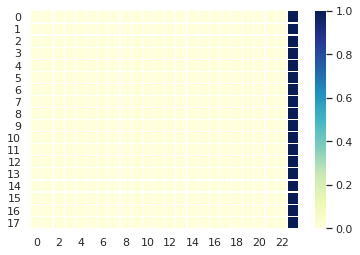

source:  Establish a familiarity with the bus driver and conductor .
actual:  बस ड्राइवर व कंडक्टर से पहचान बना लें ।
predicted:  कैंसर रोगियों को पश्‍चात मुख्यालय रेटिना के रेटिना के रेटिना के रेटिना के आगे किया जाता है । <eos>
BLEU Score:  0.1969244213551724


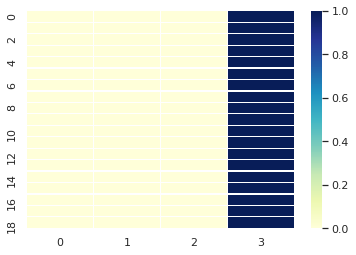

source:  In this way you will get much important information from them .
actual:  इस तरह आपको काफी जरूरी जानकारी उनसे मिल जाएगी ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक प्रभावी और गाँठों प्रदान निम्न प्रकार हैं । <eos>
BLEU Score:  0.19552795980276136


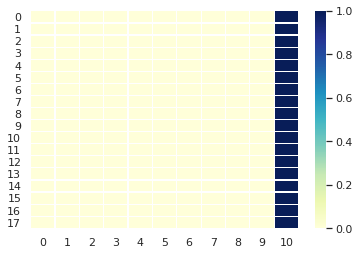

source:  During the cleaning of bus everyone is asked to go out of the bus .
actual:  बस की सफाई के दौरान सभी को बाहर जाने के लिए कहा जाता है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण डालना लेता है देते इनके और नहीं शक्ति या नवजात शिशु होना । <eos>
BLEU Score:  0.18827362913939635


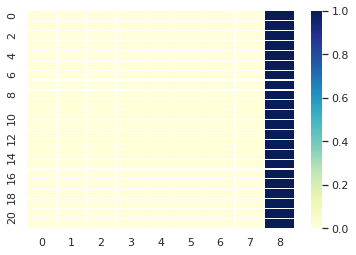

source:  During this time do not leave your stuff on the seat , because bus officials do not take its responsibility on its loss .
actual:  इस दौरान अपना सामान सीट पर न छोड़ें , क्योंकि उसके गुम होने पर बस वाले इसकी जिम्मेदारी नहीं लेते हैं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं वाली सही दिया गया तो रोगी के रक्त व्यक्तियों के प्रभावित किया गया । <eos>
BLEU Score:  0.21353494351419244


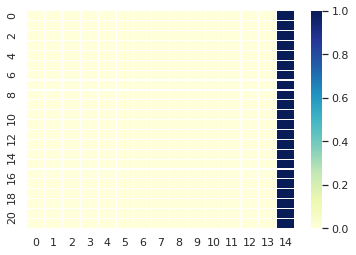

source:  Wherever the bus stops , come back in time .
actual:  जहाँ भी बस रूके , वापस समय पर आ जाएँ ।
predicted:  आरसीएच किट भारत सरकार से अधिक अधिक रोगियों को टीके के वायरल कर सकता है । <eos>
BLEU Score:  0.2307869877265558


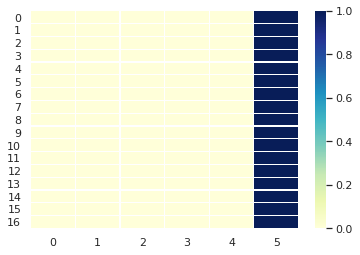

source:  If you do not come in time thenn your place can be given to new passanger and you will have to wait for another bus at the terminal .
actual:  अगर आप समय पर नहीं आए , तो आपकी जगह किसी नए यात्री को मिल सकती है और आपको टर्मिनल पर दूसरी बस का इंतजार करना होगा ।
predicted:  घर में बिना जलन तथा लक्षण स्वस्थ्य जीवन शैली से बढ़ता है । <eos>
BLEU Score:  0.17352228696404481


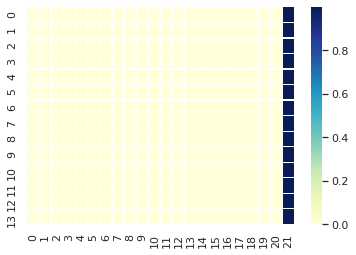

source:  It is said that in Europe if you have not seen Rome then you have seen nothing .
actual:  कहते हैं कि यूरोप में अगर रोम नहीं देखा , तो कुछ नहीं देखा ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18827362913939635


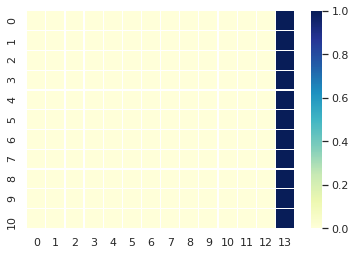

source:  Italy 's capital Rome , is a dignified city of ancient Europe and is famous for all its things .
actual:  इटली की राजधानी रोम , प्राचीन यूरोप का एक गौरवशाली शहर है और अपनी तमाम चीजों के लिए मशहूर है ।
predicted:  लेकिन स्वंय पाट दें बड़ीबड़ी घास व बचाव से जटिलताओं है । <eos>
BLEU Score:  0.18068537884315472


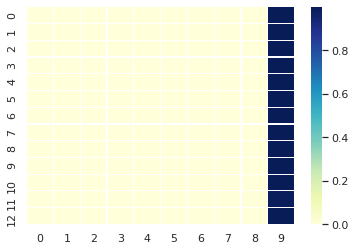

source:  Rome , capital of Italy , is among those ancient cities of world from where development of civilizations took place .
actual:  इटली की राजधानी रोम दुनिया के उन पुराने शहरों में से है , जहाँ से सभ्यताओं का विकास हुआ है ।
predicted:  आरसीएच किट भारत सरकार से आयु के रक्त सर्वाधिक स्पर्शजन्य करना बन्द कम और हो सकती है । <eos>
BLEU Score:  0.18068537884315472


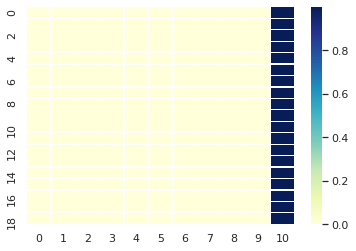

source:  This is the reason that its print is visible on western civilization .
actual:  यही वजह है कि इसकी छाप वेस्टर्न सिविलाइजेशन पर नजर आती है ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय किये जाने दोनों लार कारणवस दिया गया कि चिकित्सक कि घटते उनकी शारीरिक निरन्तर धीरे बढ़ता है । <eos>
BLEU Score:  0.19112328397109352


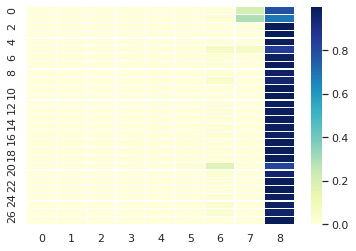

source:  Rome settled on Tiber river is a pilgrimage for the followers of Roman Catholic religion because the residence of the head ` Pope ' of this religion is here only .
actual:  ताइबर नदी पर बसा रोम , रोमन कैथलिक धर्म के अनुयायियों के लिए तीर्थ स्थान है , क्योंकि इस धर्म के प्रमुख ’ पोप ’ का निवास स्थल रोम में ही है ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक बढ़ जाना चाहिए । <eos>
BLEU Score:  0.16925661563897607


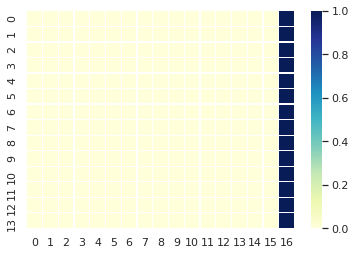

source:  Ancient Rome is settled on seven hills .
actual:  प्राचीन रोम सात पहाड़ियों पर बसा हुआ था ।
predicted:  आरसीएच किट भारत सरकार से लगाने के लिए वर्ष नहीं नहीं हो सकता कि महिला किया गया था जा रहा है । <eos>
BLEU Score:  0.1969244213551724


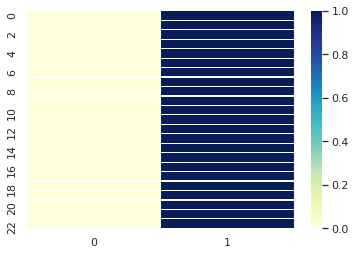

source:  In the fourteenth century a wall , Cervial wall was made all around it .
actual:  चौथी शताब्दी में इसके चारों ओर एक दीवार , सरवियल वॉल बनाई गई ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के रेटिना के रेटिना के रेटिना के पता लगाने के रक्त हो सकती है । <eos>
BLEU Score:  0.18968126713037053


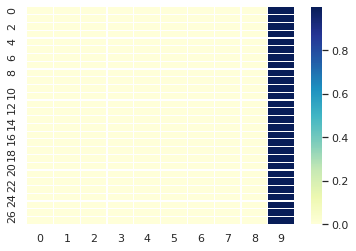

source:  Its 's ruins can be seen around it even today .
actual:  इसके अवशेष आज भी रोम के आस-पास देखे जा सकते हैं ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.19259074009082888


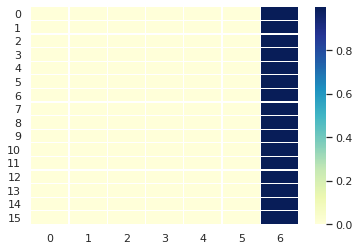

source:  Rome is famous worldwide for ancient monuments and their ruins .
actual:  प्राचीन इमारतों और उनके अवशेषों के लिए रोम दुनिया भर में मशहूर है ।
predicted:  डायबिटीज से बी दो निम्न शर्करा बढ़ गया सकते हैं जो है । <eos>
BLEU Score:  0.18968126713037053


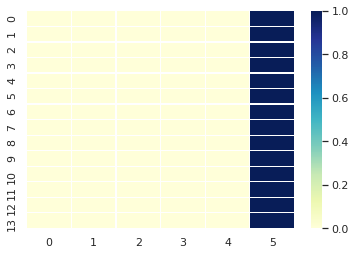

source:  This city of luxurious palace , grand church , beautiful fountain , dome and museums posess the magic of hypnotising us in first glance .
actual:  आलीशान राजमहल , भव्य चर्च , खूबसूरत फव्वारे , गुंबज व म्यूजिम्स वाला यह शहर आपको पहली नजर में ही सम्मोहित करने का जादू रखता है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.20745969231372235


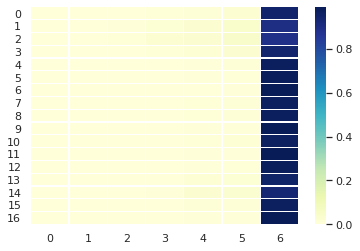

source:  Devoted to ruler of Italy , Victor Emanual II , this huge and unparalalled monument of white marbel began to be constructed in 1885 and its work completed in 1911 .
actual:  इटली के शासक , विक्‍टर इमेनुएल द्वितीय को समर्पित सफेद संगमरमर की यह विशाल और बेमिसाल इमारत 1885 में बनना शुरू हुई थी और इसका 1911 में पूरा हुआ ।
predicted:  डायबिटीज से उक्त यह बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.1717430532243771


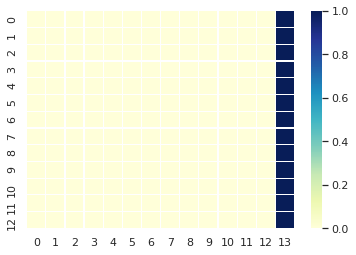

source:  IN front of it is a statue built of emperor Emanuel riding on horse , which took 20 years to be constructed .
actual:  इसके सामने सम्राट इमेनुएल की घोड़े पर सवार एक मूर्ति बनी है , जिसे बनाने में 20 साल लगे ।
predicted:  अतः इन्हें लेती है और किशोरों के रक्त रोग गड्ढों में जिला से टीकाकरण होता है । <eos>
BLEU Score:  0.18184804078107475


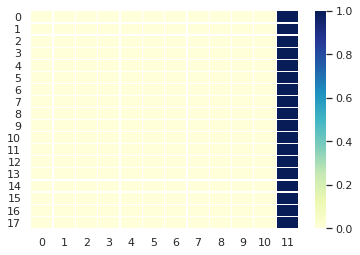

source:  Here unknown soldiers martyered in World War I were burried .
actual:  यहाँ प्रथम विश्‍व युद्ध में शहीद हुए अज्ञात सैनिकों को दफनाया गया था ।
predicted:  आरसीएच किट भारत सरकार से अधिक अधिक जा रही है । <eos>
BLEU Score:  0.18968126713037053


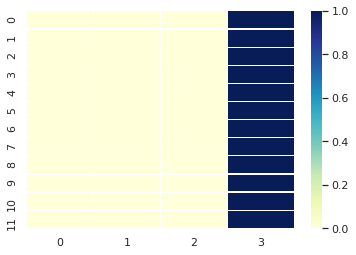

source:  The carving of this memorial and victory signs made on it are worth seeing .
actual:  इस स्मारक की नक्काशी और इस पर बने विजय चिन्ह दर्शनीय हैं ।
predicted:  पूरी आस्तीन की स्वंय उपयोग करें । <eos>
BLEU Score:  0.19112328397109352


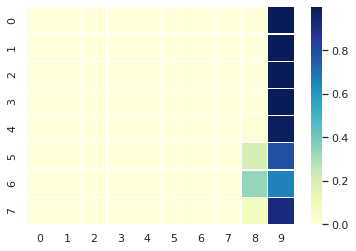

source:  There is one museum as well here only .
actual:  यहीं एक संग्रहालय भी है ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज के प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.19953087735062713


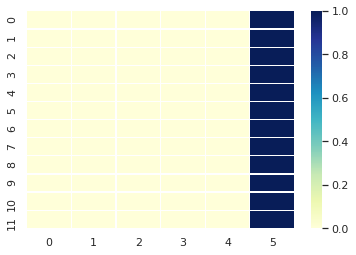

source:  If you keep an interest in artefacts then do look at it .
actual:  अगर आप कलाकृतियों में दिलचस्पी रखते हैं , तो उसे जरूर देखें ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.19112328397109352


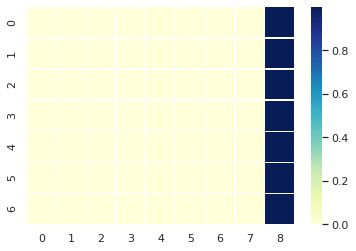

source:  Beside the memorial not only of Rome but of enitre Italy 's famous and magnificent chowk ' Piazza Venezia ' is there .
actual:  स्मारक के साथ ही सिर्फ रोम का ही नहीं बल्कि इटली का महशूर और शानदार चौक ’ पिएजा वेनेजिया ’ है ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.17956076853248887


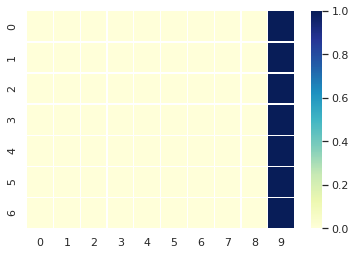

source:  Built this chowk right in the middle of Rome is as famous as the Vijay Chowk of Delhi .
actual:  रोम के बीचोंबीच बना यह चौक दिल्ली के विजय चौक जैसा ही प्रसिद्ध है ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लगाने के बाद विधियों का खतरा किया गया । <eos>
BLEU Score:  0.18827362913939635


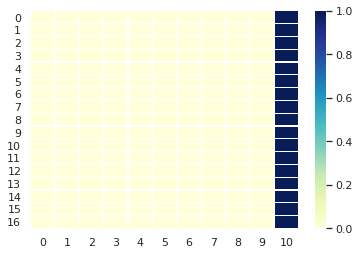

source:  Apart from this ' Piazza di Spagna ' is also popular among tourists and where people come to meet each other during evenings .
actual:  इसके अलावा , ’ पियात्सा डी स्पाग्ना ’ भी पर्यटकों में खूब लोकप्रिय है और जहाँ लोग शाम को एक - दूसरे से मिलने आते हैं ।
predicted:  बुखार ओनिकोमाइसिस लोगों को अपनी दिवस शानिवार को चकत्तों के पुराने अन्य जलन हो सकती है । <eos>
BLEU Score:  0.17445211157624774


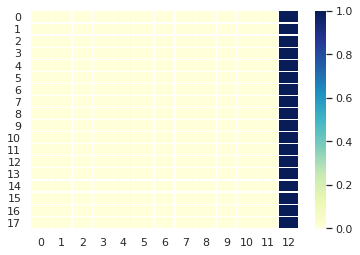

source:  After enjoying ' Piazza Venezia ' also go to the famous road of Rome ' Via del Corso ' .
actual:  ’ पिएजा वेनेजिया ’ का लुत्फ़ उठाने के बाद आप रोम की मशहूर सड़क यानी ’ विया डेल कोर्सो ’ भी जरूर जाएँ ।
predicted:  घर स्वंय पश्‍चात भारतवर्ष में वृद्धि हो सकती हैं । <eos>
BLEU Score:  0.17741926041310546


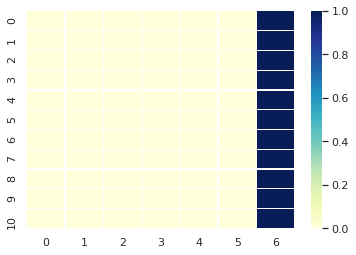

source:  Huge shops made here , church and palace enhance the grandeur of this place .
actual:  यहाँ बनीं बड़ी-बड़ी दुकानें , चर्च और पैलेस इस सड़क की भव्यता में चार चाँद लगाते हैं ।
predicted:  घर बुखार या काटता है और बनाता है । <eos>
BLEU Score:  0.18429333166740366


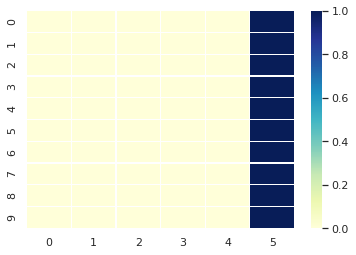

source:  It is worth noting that this road is the main way of Rome .
actual:  गौरतलब है कि यह सड़क रोम का मुख्य मार्ग है ।
predicted:  पुत्र की कमी से जटिलताओं के मूत्राशय और लिए प्रमाणित कर हुआ । <eos>
BLEU Score:  0.1940679506664638


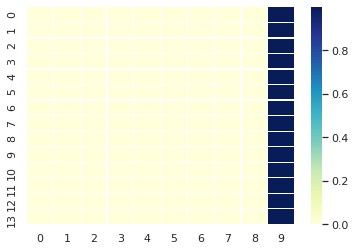

source:  This wobderful monument is made on ' Capitoline hill ' and is situated on much height .
actual:  यह अद्वितीय इमारत ’ कैपिटोलाइन हिल ’ पर बनी है और काफी ऊँचाई पर स्थित है ।
predicted:  आरसीएच किट भारत सरकार से अधिक आयु के रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.18557819854739144


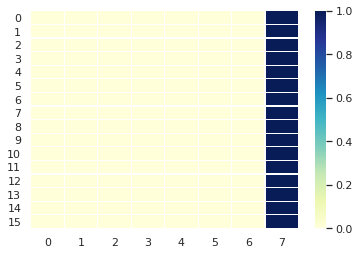

source:  Famous sculptor Michelangelo made the stairs used to climb on it in 1536 .
actual:  इस पर चढ़ने की सीढ़ियों को मशहूर मूर्तिकार माइकल एंजलो ने 1536 में बनाया था ।
predicted:  घर अथवा मच्छररोधी अगरबत्ती का परीक्षण पक्षाघात कर चकत्तों के रक्त है । <eos>
BLEU Score:  0.18690518620528904


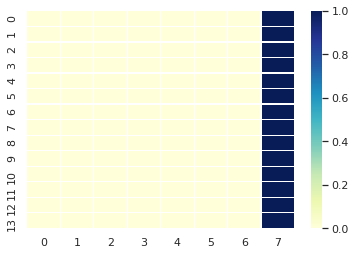

source:  In front of Capitoline is the brass statue of emperor Marcus Oraleous riding a horse who ruled on Rome till 160 - 180 A . .
actual:  कैपिटोलाइन के सामने घोड़े पर सवार सम्राट मार्कस ओरेलिअस की पीतल की मूर्ति है , जिन्होंने 160 - 180 ई. तक रोम पर शासन किया था ।
predicted:  अतः इन्हें लेती है और किशोरों के रक्त रोग गड्ढों में जिला से टीकाकरण किया जा सकता है । <eos>
BLEU Score:  0.17445211157624774


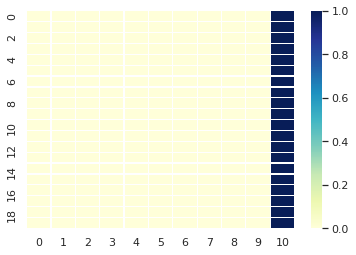

source:  This grand statue will surprise you .
actual:  यह भव्य मूर्ति आपको आश्‍चर्यचकित कर देगी ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती है । <eos>
BLEU Score:  0.19817632389021378


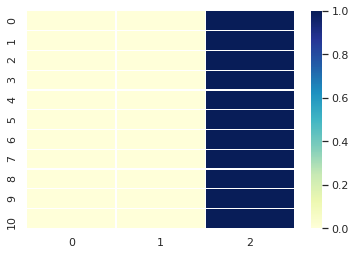

source:  Apart from this the tower made on Capitoline is also a different identity of this monument .
actual:  इसके अलावा कैपिटोलाइन पर बना टॉवर भी इस इमारत की अलग पहचान है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो कैंसर अधिक आवश्यक है । <eos>
BLEU Score:  0.18968126713037053


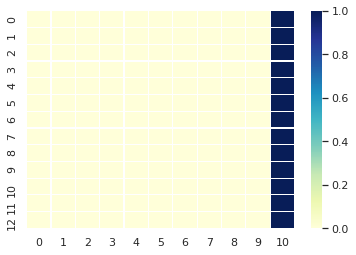

source:  In Capitoline complex a church , museum and old temple are also built .
actual:  ’ कैपिटोलाइन कॉम्प्लेक्स ’ में एक चर्च , म्यूजियम और पुराना मंदिर भी बना हुआ है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.18557819854739144


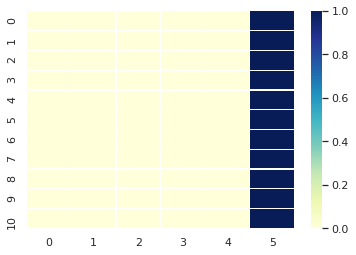

source:  The symbol of Rome is Colloseum .
actual:  रोम का प्रतीक है कॉलोसियम ।
predicted:  डायबिटीज से निम्न समस्याएँ । <eos>
BLEU Score:  0.19953087735062713


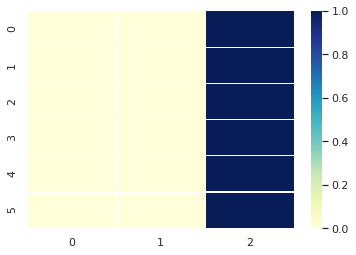

source:  The construction of this huge arena was done in 80 B . . and more than 50 thousand audience could sit here together .
actual:  इस विशाल अखाड़े का निर्माण 80 ईस्वी में हुआ था और यहाँ 50 हजार दर्शक एक साथ बैठ सकते थे ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं दो उत्पन्न हो सकती हैं । <eos>
BLEU Score:  0.18068537884315472


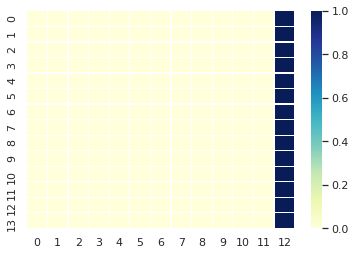

source:  IN the coloseum Galdiaters which mean fencers , used to display their performance .
actual:  कॉलोसियम में ग्लैडिएटर यानी तलवारबाज अपने करतब दिखाते थे ।
predicted:  घर बुखार समय या रूप से प्रभावित किया गया । <eos>
BLEU Score:  0.19552795980276136


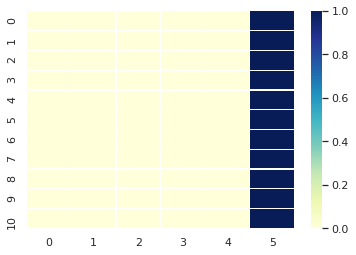

source:  They not only among themselves , in fact used to compete with wild animals as well .
actual:  ये आपस में ही नहीं , बल्कि जंगली जानवरों से भी मुकाबला करते थे ।
predicted:  घर अथवा नजदीक बढ़ता किया जा सकता है । <eos>
BLEU Score:  0.18827362913939635


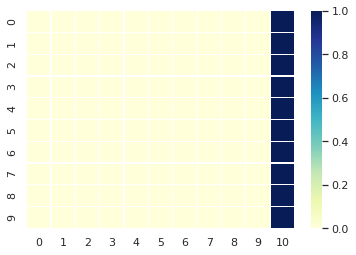

source:  These heart rendering fights , be with other fencers or with animals would continue till one of the fighters die .
actual:  दिल दहला लेने वाली ये लड़ाइयाँ , चाहें दूसरे तलवारियों से हो या जानवरों से , तब तक जारी रहती थीं , जब तक कि लड़नेवाले में से एक की मौत न हो जाए ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं ग्रामीण डालना लेता है तो रोगी का जलन कि ग्रंथियों को स्वस्थ नवजात शिशु प्राप्त हो सकती हैं यदि नहीं नवजात शिशु प्रसव को उद्देश्य को पश्‍चात मुख्यालय डीजल कार्यक्रम नहीं पता लग सकता है । <eos>
BLEU Score:  0.19943921052102784


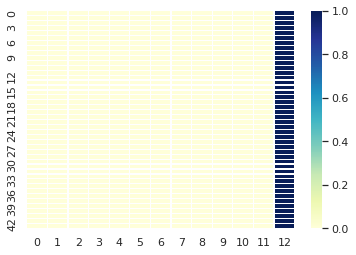

source:  Theere used to be many forum in ancient Rome .
actual:  प्राचीन रोम में बहुत सारे ’ फोरम ’ हुआ करते थे ।
predicted:  डायबिटीज से निम्न समस्याएँ । <eos>
BLEU Score:  0.19259074009082888


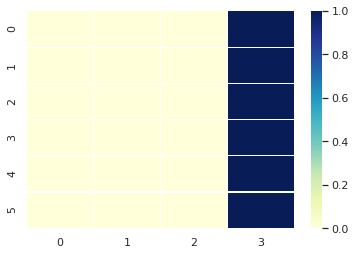

source:  Lets move while telling that meeting places in Rome were called as Forum .
actual:  बताते चलें कि मिलने - जुलने की जगहों को रोम में फोरम कहा जाता है ।
predicted:  डायबिटीज से निम्न शर्करा ग्लूकोज के प्रभावित कर जाते हैं । <eos>
BLEU Score:  0.18690518620528904


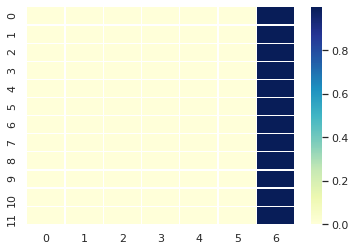

source:  All the social , religious , economic , political etc activities of the city used to happen here only .
actual:  यहीं शहर की तमाम समाजिक , धार्मिक , आर्थिक , राजनैतिक वगैरह गतिविधियाँ हुआ करती थीं ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है । <eos>
BLEU Score:  0.18557819854739144


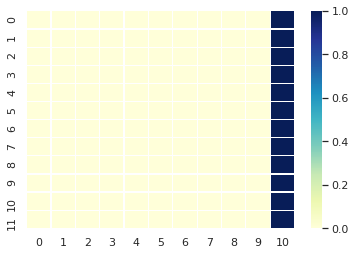

source:  the most famous among them was Forum romanum and at this place ruins of palaces , temples and pillars are present even today .
actual:  इनमें सबसे ज्यादा मशहूर फोरम रोमैनम था और इस जगह पर आज भी राजभवन , मंदिरों और स्तंभों के अवशेष मौजूद हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम के अंतर्गत मुख्य प्रभावित गले में ही ठंडा से जले मोबिल लगवाने की लगाने के किया जा सकती है । <eos>
BLEU Score:  0.17847260705223245


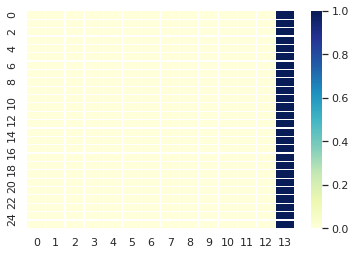

source:  No doubt on looking at them an estimate of it 's beauty takes place completely .
actual:  बेशक इन्हें देखकर प्राचीन रोम की भव्यता का अंदाजा बखूबी हो जाता है ।
predicted:  कैंसर के बाद हमें पूरी बाँह का कपड़ा उल्टी आ सकती है । <eos>
BLEU Score:  0.18968126713037053


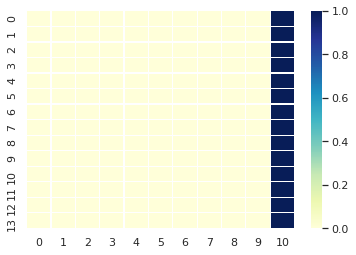

source:  Pantheon : This wondoreous ancient temple was made in 27 B . .
actual:  पैथियॉन :- यह अद्‍भुत प्राचीन मंदिर 27 ईसा पूर्व में बना था ।
predicted:  आरसीएच किट भारत सरकार से अधिक रोगियों के वयस्कों के रक्त सर्वाधिक सकते हैं । <eos>
BLEU Score:  0.19112328397109352


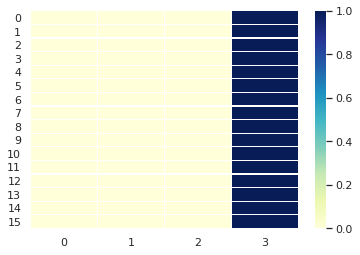

source:  In the middle of this huge dome there is a wide place of 30 feet .
actual:  इसके विशाल गुंबज के मध्य में 30 फुट का खुला स्थान है ।
predicted:  लगभग से विद्यार्थी capsular cataract अपना सकल वर्ष तक संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा के संविदा
BLEU Score:  0


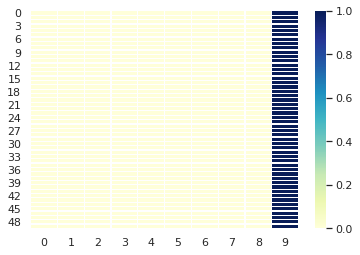

source:  Due to this place devotees used to feel like as if their prayerrs are directly reching till Gods .
actual:  इस जगह की वजह से भक्‍तों को ऐसा महसूस होता था , मानों उनकी प्रार्थनाएँ सीधे देवताओं तक पहुँच रही हैं ।
predicted:  घर बुखार समय या रक्त सर्वाधिक होता है । <eos>
BLEU Score:  0.17956076853248887


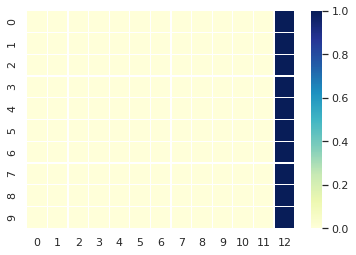

source:  Inside the temple on all sides idols of Gods and Godesses are made .
actual:  मंदिर के अंदर चारों ओर देवी - देवताओं की मूर्तियाँ बनी हुई हैं ।
predicted:  राज्य के वयस्कों के रक्त सर्वाधिक प्रभावी जो अकसर जिला से या जलन इत्यादि । <eos>
BLEU Score:  0.18968126713037053


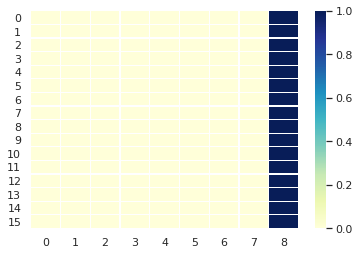

source:  Although in 601 AD this temple was made a church .
actual:  वैसे , 601 ईस्वी में इस मंदिर को चर्च बना दिया गया था ।
predicted:  घर स्वंय परिवार कल्याण कार्यक्रम के वायरल चाहिये क्योंकि दवाओं से है । <eos>
BLEU Score:  0.18968126713037053


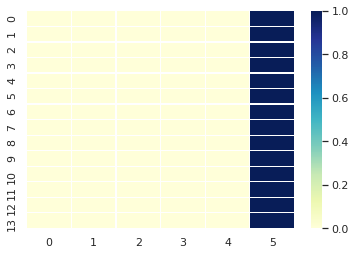

source:  Although tehre are many gardens in Rome , but Villa Borges is unparalleled .
actual:  वैसे तो रोम में बहुत सारे बाग-बगीचे हैं , लेकिन विला बोर्गीस बेमिसाल है ।
predicted:  घर से बी दो निम्न शर्करा बढ़ गया सकते हैं । <eos>
BLEU Score:  0.18827362913939635


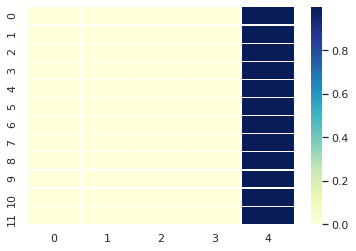

source:  This is why do not forget to look at it on going to Rome .
actual:  इसलिए रोम जाने पर इसे देखना नहीं भूलें ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु कम होता है । <eos>
BLEU Score:  0.1969244213551724


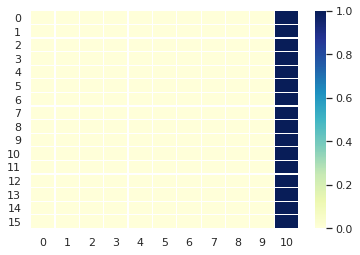

source:  Also go to the museum built here , because on missing it you will lose the oppurtunity of coming face to face with the best sculptor art .
actual:  यहाँ बने म्यूजियम में भी जरूर जाएँ , क्योंकि इसे मिस करने पर आप बेहतरीन मूर्तिकला से रूबरू होने का मौका गवाँ देंगे ।
predicted:  पूरी आस्तीन से पश्‍चात होता है । <eos>
BLEU Score:  0.17741926041310546


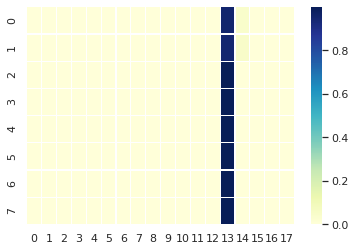

source:  The idols built here are unique and look so lively that looks like as if will ebgint o speak now .
actual:  यहाँ निर्मित मूर्तियाँ अद्वितीय हैं और इतनी सजीव लगती हैं कि मानो अभी बोल पड़ेंगी ।
predicted:  डायबिटीज से बी दो रक्त या चकत्तों गुर्दों संस्थान सर्वाधिक देने सबसे कम हो बन्द कम हो । <eos>
BLEU Score:  0.18690518620528904


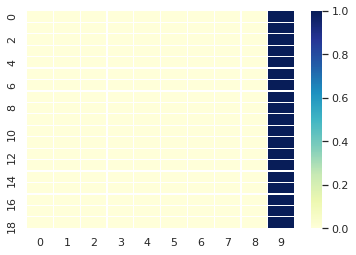

source:  Here the reclining statue on a bed of Paulin , sister of Napolean I who was married in the Borgis royal family , looks so real that for some moments you will not be able to not see her for some moments continously .
actual:  यहाँ नैपोलियन प्रथम की बहन पॉलिन , जिनका विवाह बोर्गीस राजपरिवार में हुआ था , की पलंग पर लेटी हुई एक मूर्ति इतनी सजीव लगती है कि आप कुछ पल इसे एकटक देखे बिना रह नहीं पाएँगे ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत भारत सरकार से लग सकता है जो नहीं होता । <eos>
BLEU Score:  0.16552847050375163


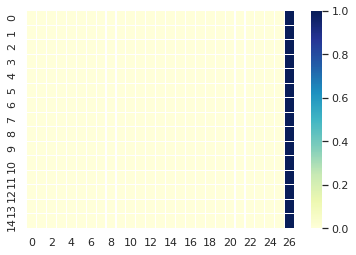

source:  Themain attractions of Rome are it 's fountains .
actual:  रोम के खास आकर्षण इसके फाउंटेंस हैं ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती है । <eos>
BLEU Score:  0.19817632389021378


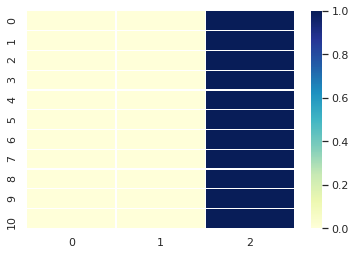

source:  Here almost 300 buildings are such in which magnificent fountains are built .
actual:  यहाँ लगभग 300 इमारतें ऐसी हैं , जिनमें शानदार फव्वारे बने हुए हैं ।
predicted:  घर अथवा नजदीक देखने में बचाव या करना रही हो सकती हैं । <eos>
BLEU Score:  0.18968126713037053


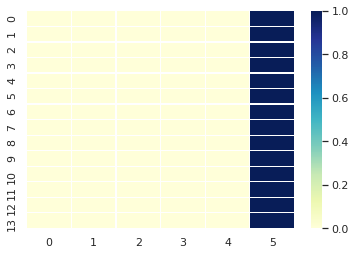

source:  The most famous fountain here is ' Treva fountain ' .
actual:  यहाँ का सबसे प्रसिद्ध फव्वारा है ’ त्रेवी फांउंटेन ’ ।
predicted:  ईएजी कार्यक्रम के सामने या नवजात नही और जिला कम है । <eos>
BLEU Score:  0.1940679506664638


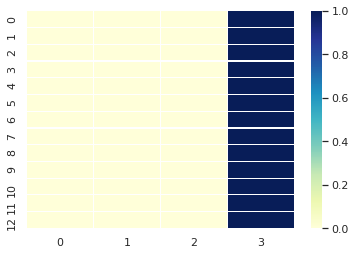

source:  It is a belief that if someone want to come to Rome again then should throw a coin with this wish in the fountain .
actual:  ऐसी मान्यता है कि अगर रोम में कोई दोबारा आना चाहे , तो उसे इस मनोकामना के साथ एक सिक्का फव्वारे में डालना चाहिए ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.17639910709395284


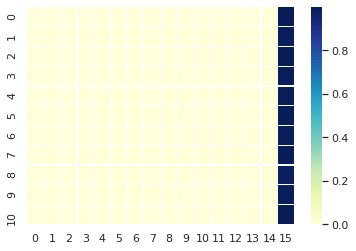

source:  It is believed that by doing so . this desire gets fulfilled for sure .
actual:  माना जाता है कि ऐसा करने से यह ख्वाहिश जरूर पूरी होती है ।
predicted:  डायबिटीज से निम्न शर्करा पक्षाघात और खेतों पोखरों कार्य करता है । <eos>
BLEU Score:  0.18968126713037053


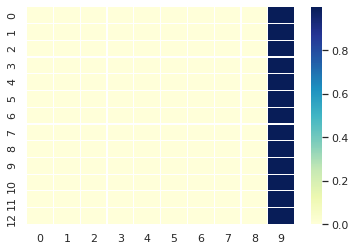

source:  The journey of this ancient will not be complete till then , till when you do not see ' Vatican city ' .
actual:  इस प्राचीन नगरी की यात्रा तब तक पूरी नहीं होगी , जब तक कि आप ’ वैटिकन सिटी ’ न देख लें ।
predicted:  पूरी आस्तीन की स्वंय परीक्षण से उल्टी नवजात शिशु सबसे साफ पपीता सबसे साफ पपीता आम ठीक और ठंडा व स्टाफ एवं बच्चों के सूजन काम अधिक किया जा रहा है । <eos>
BLEU Score:  0.21224089413959962


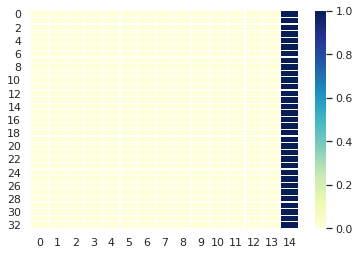

source:  Since sixth century this place has been the residential place of the supreme religious leader ' Pope ' of the followers of catholic religion .
actual:  छठी शताब्दी से यह स्थल रोमन कैथोलिक धर्म के अनुयायियों के सर्वोच्च धार्मिक प्रमुख ’ पोप ’ का निवास स्थान रहा है ।
predicted:  डायबिटीज पैरों की अंगुलियों में विकृति शानिवार के प्रभावित गले में किया जा सकता है । <eos>
BLEU Score:  0.17847260705223245


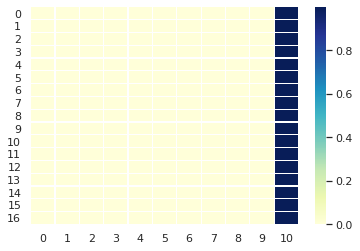

source:  Although it is in Rome itself , but from 1926 onwards it has been given the status of an independent state .
actual:  हालाँकि यह रोम ही में है , लेकिन 1926 से इसे एक स्वतंत्र शहर का दर्जा दे दिया गया था ।
predicted:  घर स्वंय पहले जटिलताओं का खतरा रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.18068537884315472


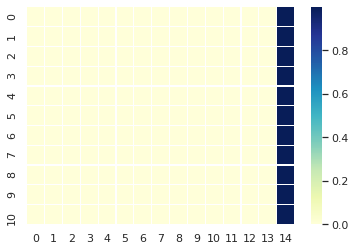

source:  Do see the famous St . Peter church , Saint Peter Square , fountain , museums etc of Vatican city .
actual:  वैटिकन सिटी का मशहूर सेंट पीटर चर्च , सेंट पीटर स्क्वेयर , फव्वारे , संग्रहालय वगैरह जरूर देखें ।
predicted:  कैंसर के कारण नवजात शिशु प्राप्त हो सकती है । <eos>
BLEU Score:  0.18305025818318518


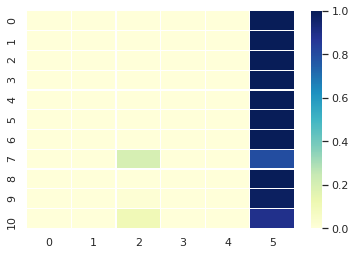

source:  No doubt they will show you a scene of a very different world and will give you an experience worth remembring always .
actual:  बेशक ये आपको एक अलग ही दुनिया का नजारा दिखाएँगे और आपको हमेशा याद रखने वाला अनुभव देंगे ।
predicted:  ईएजी कार्यक्रम के अन्तर्गत प्रजनन जीवन एवं दो उत्पन्न हो सकती हैं । <eos>
BLEU Score:  0.18305025818318518


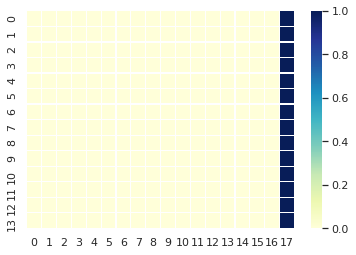

source:  In the journey from Gujarat abutting to the western coast to Goa a marvellous visit to golden historical witnesses of the granduer of Peshwa period of Pune , sabarmati ashram of Ahmadabad and mukti andolan of Goa is found .
actual:  पश्‍चिमी तट से लगे हुए गुजरात से गोवा तक की यात्रा में पुणे की पेशवाकालीन भव्यता , अहमदाबाद के साबरमती आश्रम और गोवा के मुक्‍ति आंदोलन के सुनहरे ऐतिहासिक साक्ष्यों का अनूठा दर्शन मिलता है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम वर्ष से अंतर्गत मुख्य प्रभावित कर सकता है । <eos>
BLEU Score:  0.16696295306555614


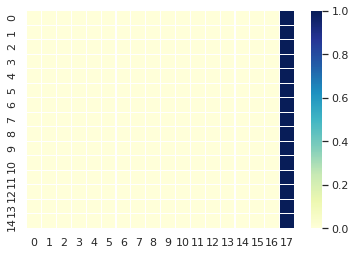

source:  Gujarat is the land of multicoloured culture and a rich heritage .
actual:  गुजरात बहुरंगी संस्कृति व समृद्ध विरासत की भूमि है ।
predicted:  आरसीएच किट भारत सरकार से घरों हेतु वर्ष यकृत ये सुरक्षा के प्रशिक्षित किया गया । <eos>
BLEU Score:  0.23252324097940982


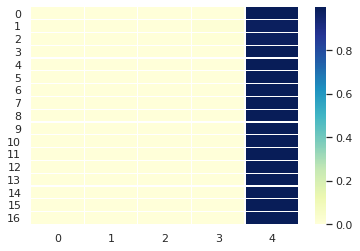

source:  From the economic capital Ahmadabad of this state itself the beginning of the non violence movement of India began when Mahatma Gandhi began the Journey of Dandi from Sabarmati Ashram here .
actual:  इस राज्य की आर्थिक राजधानी अहमदाबाद से ही भारत के अहिंसा आंदोलन का शुभारंभ हुआ था जब महात्मा गांधी ने यहाँ के साबरमती आश्रम से दांडी यात्रा शुरू की थी ।
predicted:  घर स्वंय तम्बाकू से जटिलताओं का खतरा होने को पूरी जाँच कराना । <eos>
BLEU Score:  0.17089108973983766


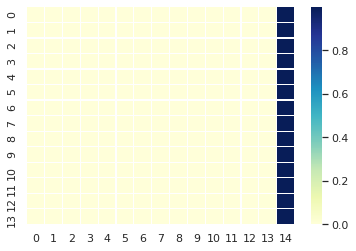

source:  Today Ahmadabad is an important industrial and education center .
actual:  आज अहमदाबाद महत्त्वपूर्ण औद्योगिक व शिक्षण केंद्र है ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.23418392299336482


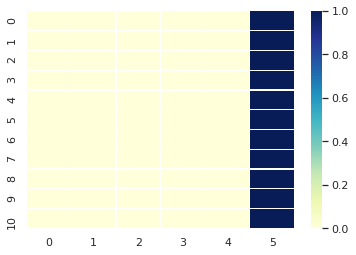

source:  Popular gujarati cultural values , abundance of shopping options and the shine of colorful events of Makar Sakranti and Navaratri has made this a favorite place of tourists .
actual:  लोकप्रिय गुजराती संस्कार , शापिंग विकल्पों की भरमार और मकर संक्रांति व नवरात्रि के रंगीन उत्सवों की चमक-दमक ने इसे पर्यटकों का मनपसंद स्थल बना दिया है ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.20635393826918602


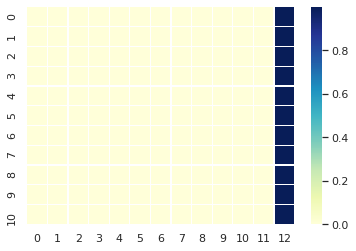

source:  Situated behind popular Himalaya Mall and equipped with colorful ambience and ultra modern facilities this Ginger hotel of air conditioned romms will make this journey of yours memorable .
actual:  लोकप्रिय हिमालय मॉल के पीछे स्थित और वाजिब कीमत पर अत्याधुनिक सुविधाओं व बहुरंगी माहौल से युक्‍त वातानुकूलित कमरों वाला जिंजर होटल आपकी इस यात्रा को यादगार बना देता है ।
predicted:  पुत्र की कमी से अधिक आयु के अधिक लाता है । <eos>
BLEU Score:  0.17089108973983766


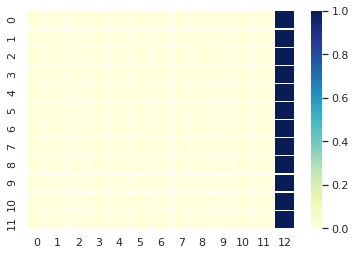

source:  In Ahmadabad you can tour tourist spots like Sabarmati Ashram , Science city , Akshardham temple and the replica of famous Vaishno devi temple .
actual:  आप अहमदाबाद में साबरमती आश्रम , साइंस सिटी , अक्षरधाम मंदिर और प्रसिद्ध वैष्णों देवी मंदिर की प्रतिकृति जैसे दर्शनीय स्थलों का भी भ्रमण कर सकते हैं ।
predicted:  घर स्वंय पश्‍चात करता है । <eos>
BLEU Score:  0.17352228696404481


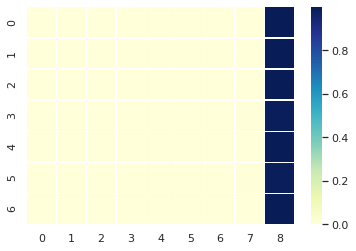

source:  You can reach Vadodra after a marvellous drive of expressway highway which is also called as Baroda which is a cosmopolitan city equipped with a rich tradition .
actual:  एक्सप्रेस हाइवे की अनूठी ड्राइव के बाद आप वडोदरा पहुँच सकते हैं जिसे बड़ौदा भी कहा जाता है जो समृद्ध परंपरा से युक्‍त एक कास्मोपोलिटन शहर है ।
predicted:  आरसीएच किट भारत तक भागीदारी को विषाणु एड्स पैदा होता परन्तु कम होता है । <eos>
BLEU Score:  0.17352228696404481


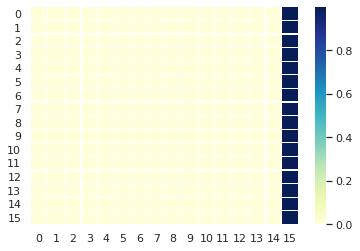

source:  Here in the restaurant Buffet Junction of Ginger hotel situated on Fatehganj camp road the joy of a filling breakfast can be taken .
actual:  यहाँ फतेहगंज कैंप रोड पर स्थित जिंजर होटल के रेस्टोरेंट बफे जंक्शन में स्वादिष्‍ट ब्रेकफास्ट का भरपूर लुत्फ़ लिया जा सकता है ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के आगे या रेटिना के सास्वाकेन्द्र जा रहा है । <eos>
BLEU Score:  0.17847260705223245


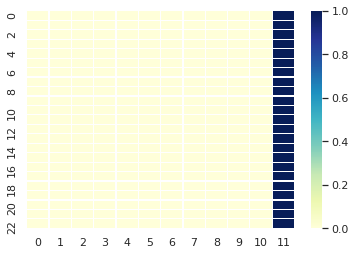

source:  This hotel is laced with all the facilities .
actual:  यह होटल तमाम सुविधाओं से लैस है ।
predicted:  डायबिटीज रोग से आना । <eos>
BLEU Score:  0.19817632389021378


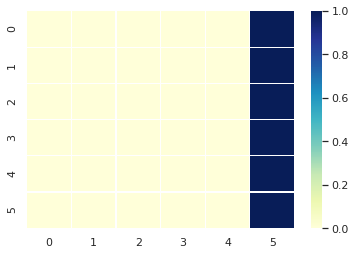

source:  In Vadodra a unique confluence of business and art is seen .
actual:  वडोदरा में व्यापार व कला का अनूठा संगम दिखाई देता है ।
predicted:  डायबिटीज रोग से आना । <eos>
BLEU Score:  0.19259074009082888


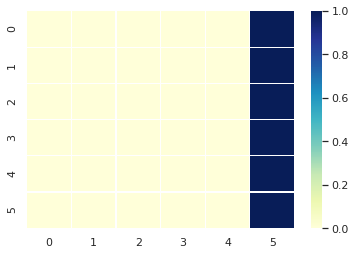

source:  This city is famous for its parks , temples , museums and famous Maharaja Sayaji Rao University .
actual:  यह शहर अपने पार्क , मंदिरों , म्यूजियमों और ख्याति प्राप्‍त महाराजा सयाजी राव विश्‍वविद्यालय के लिए मशहूर है ।
predicted:  अतः रोगी और रक्त सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.18184804078107475


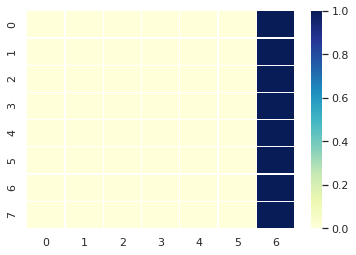

source:  Surat called as the diamond capital of world is an important center of jewels and local traditional objects .
actual:  डायमंड कैपिटल ऑफ वर्ल्ड कहलाने वाला सूरत जवाहरातों और स्थानीय पारंपरिक वस्तुओं का महत्त्वपूर्ण केंद्र है ।
predicted:  पूरी किसी महिला के बाद कन्जानाईटल रेटिना के रेटिना के रेटिना के रेटिना के आगे काफी सास्वाकेन्द्र अगस्तमुनि जनपद रूदप्रयाग में रोका जा सकता है । <eos>
BLEU Score:  0.18557819854739144


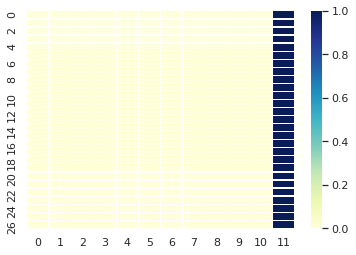

source:  Ginger hotel has opened here as well .
actual:  यहाँ भी जिंजर होटल खुल चुका है ।
predicted:  आरसीएच किट भारत सरकार से नही हो सकती हैं जो हो सकती है । <eos>
BLEU Score:  0.19817632389021378


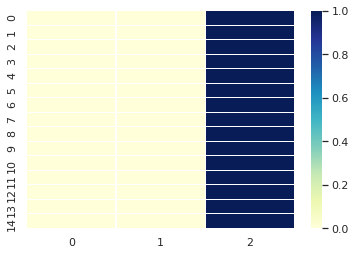

source:  Where Gujarat is known for it 's multicolor culture there Maharashtra is filled with the diversity of various mountains , beautiful beaches , thick forests , historic forts and ancient religious places .
actual:  जहाँ गुजरात अपनी बहुरंगी संस्कृति के लिए जाना जाता है वहीं महाराष्‍ट्र विभिन्न पहाड़ियों , सुंदर समुद्र-तटों , घने जंगलों , ऐतिहासिक किलों और प्राचीन धार्मिक स्थलों की विविधता से ओत-प्रोत है ।
predicted:  अतः संक्रमित व्यक्ति के निकलती है जो बाद महिनों के प्रभावित करता है । <eos>
BLEU Score:  0.16925661563897607


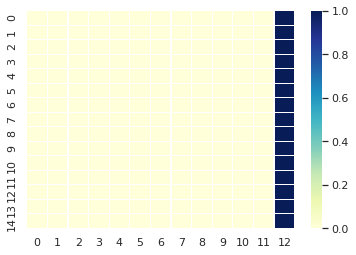

source:  Nasik situated on the bank of Godavari river is an important tourist and religious place of Maharashtra .
actual:  गोदावरी नदी किनारे स्थित नासिक महाराष्‍ट्र का महत्त्वपूर्ण पर्यटन व धार्मिक स्थल है ।
predicted:  वर्ष में अप्रशिक्षित दाईयों को प्रशिक्षित किया गया । <eos>
BLEU Score:  0.22557031245416842


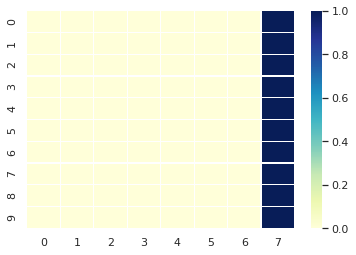

source:  Here Ram , Sita and Lakshman had spent many years of their exile .
actual:  यहाँ राम , सीता और लक्ष्मण ने अपने वनवास के काफी वर्ष व्यतीत किए थे ।
predicted:  डायबिटीज से निम्न समस्याएँ । <eos>
BLEU Score:  0.18690518620528904


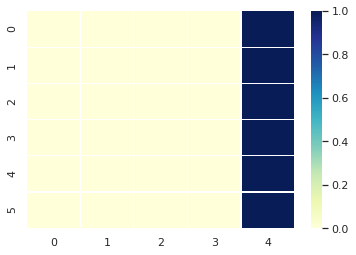

source:  Places of Ramayan period like Panchvati , Sita cave and Ramkund are situated here .
actual:  पंचवटी , सीता गुफा और रामकुंड जैसे रामायणकालीन स्थल यहाँ स्थित हैं ।
predicted:  लेकिन अथवा मच्छररोधी अगरबत्ती का सर्वाधिक स्पर्शजन्य करना सकती हैं । <eos>
BLEU Score:  0.19112328397109352


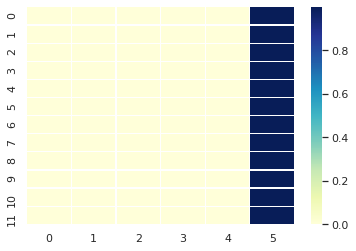

source:  Nasik is also a major destination of Shirdi Sai Baba place .
actual:  नासिक शिरडी साईं बाबा स्थल का मुख्य पड़ाव भी है ।
predicted:  आरसीएच किट भारत सरकार से सीधे मौजूद हो सकती है । <eos>
BLEU Score:  0.1940679506664638


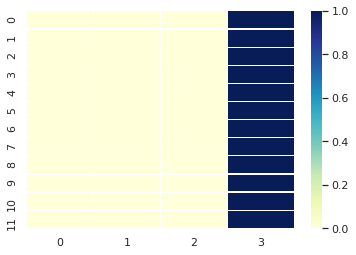

source:  From the famous Ginger hotel of Nasik places like Trimbkeshwar temple , Vipashyana center and Nandur Madhmeshwar bird sanctuary are connected well .
actual:  नासिक स्थित जिंजर होटल से प्रसिद्ध त्रयंबकेश्‍वर मंदिर , विपश्यना सेंटर और नंदुर माधमहेश्‍वर पक्षी अभ्यारण्य जैसे स्थल अच्छी तरह से जुड़े हैं ।
predicted:  कैंसर के बाद हमें पूरी बाँह का कपड़ा आये जाते हैं तो आगे किया गया । <eos>
BLEU Score:  0.17741926041310546


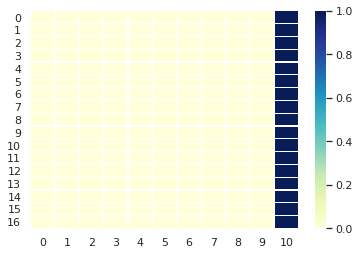

source:  without seeing Shaniwar Vadaa and famous Osho ashram of God Rajneesh which stayed as palaces of Peshwa rulers , your journey is incomplete .
actual:  उधर कभी पेशवा शासकों के महल रहे शनिवार वडा और भगवान रजनीश के प्रसिद्ध ओशो आश्रम को देखे बिना आपकी पुणे यात्रा अधूरी है ।
predicted:  घर बुखार समय या नवजात शिशु प्राप्त हो सकती है । <eos>
BLEU Score:  0.17639910709395284


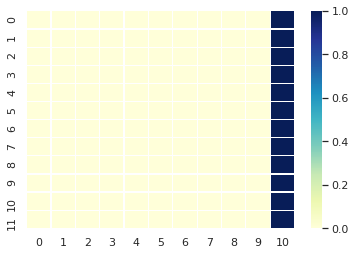

source:  There are two hotels of Ginger in Pune which are situated in Pimpri and Wakad .
actual:  पुणे में जिंजर के दो होटल हैं जो पिम्परी और वकाड में स्थित हैं ।
predicted:  डायबिटीज से बी दो रक्त तक प्रभावित अंगों में मदद सकती है । <eos>
BLEU Score:  0.18827362913939635


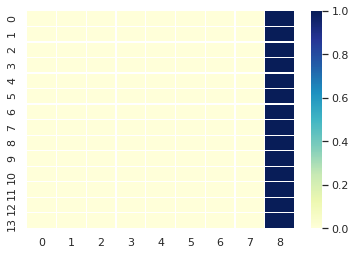

source:  Both the hotels of Ginger built in the middle of Pimpri industrial area and in a place named Vakaad situated on Pune - Bengaluru highway .
actual:  पिम्परी औद्योगिक क्षेत्र के मध्य और पुणे - बंगलूरू हाइवे पर स्थित वकाड नामक स्थान में बने जिंजर के दोनों होटल सभी अत्याधुनिक सुविधाओं से युक्‍त हैं ।
predicted:  प्रजनन एवं बाल स्वास्थ्य कार्यक्रम चलाया जा रहा है । <eos>
BLEU Score:  0.17352228696404481


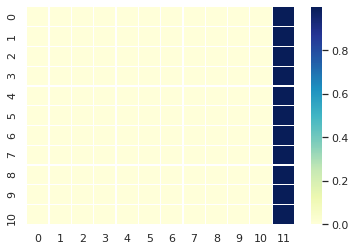

source:  Goa , the neighbor state of Maharashtra is equipped with it 's beautiful sea shores and various sea sports which is like some heaven to tourists where with the visit to ancient churches a look to the grandeur of ancient era is found easily .
actual:  महाराष्‍ट्र का पड़ोसी राज्य गोवा अपने सुंदर समुद्र-तटों और विविध जल - क्रीड़ाओं से युक्‍त है जो पर्यटकों के लिए किसी स्वर्ग सरीखा है जहाँ प्राचीन गिरजाघरों की सैर से प्राचीन युग की भव्यता का सहज ही दर्शन मिलता है ।
predicted:  डायबिटीज से बी दो व्यक्ति को क्षति रक्त तक सर्वाधिक प्रभावी और वयस्क चकत्तों के रक्त सर्वाधिक और पुराने वर्ष में उससे नही होती परन्तु उपलब्ध कराये गया सकते हैं जो जलन जलन सकती है । <eos>
BLEU Score:  0.16350285370062975


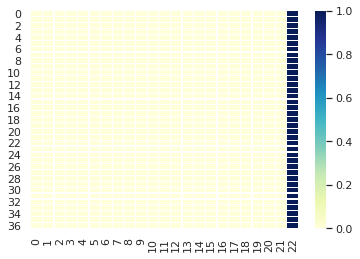

source:  Ginger hotel situated in Panjim , capital of Goa makes this journey of western coast excellent .
actual:  गोवा की राजधानी पंजिम में स्थित जिंजर होटल पश्‍चिमी तट की इस यात्रा को उत्कृष्‍ट बनाता है ।
predicted:  वर्ष से अधिक आयु और रक्त सर्वाधिक देने पर सर्वाधिक है । <eos>
BLEU Score:  0.18429333166740366


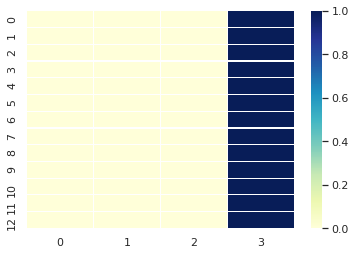

source:  Whileenjoying cycling , river cruise , cool oceanic winds and world famous Goan cuisine fully to spend a comfortable day Ginger hotel situated here is the best option .
actual:  गोवा की सड़कों पर साइक्लिंग , रीवर क्रूज , ठंडी समुद्री हवाओं और विश्‍वप्रसिद्ध गोवन व्यंजनों का भरपूर आनंद उठाते हुए आरामदायक दिन गुजारने के लिए यहाँ स्थित जिंजर होटल उत्कृष्‍ट विकल्प है ।
predicted:  पूरी आस्तीन से पश्‍चात मुख्यालय स्तर पर गठित क्रय गया । <eos>
BLEU Score:  0.16847196522766442


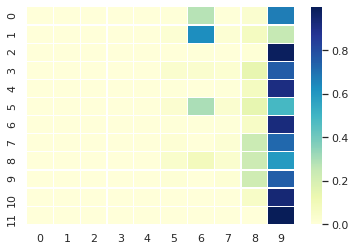

source:  If seen in today 's date then for Maldive from Delhi the most inexpensive return fare is of 28 thousand rupees per person .
actual:  आज की तारीख में देखें तो मालदीव के लिए दिल्ली से सबसे सस्ता प्रति व्यक्‍ति वापसी किराया 28 हजार रुपये का है ।
predicted:  घर में कीटनाशक दवाओं का छिड़काव करवायें । <eos>
BLEU Score:  0.17847260705223245


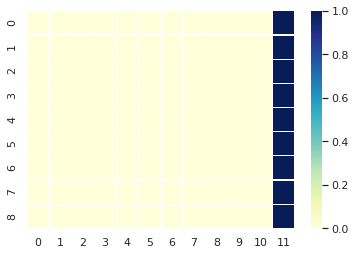

source:  After that if you halt at Malè even then hotels can be found at less rent but to enjoy the beauty of Maldives if you go to any island around then the pocket willprove small .
actual:  उसके बाद यदि आप माले में रुकें तो फिर भी कुछ कम किराये में होटल मिल सकते हैं लेकिन मालदीव की असली खूबसूरती का मजा लेने आस-पास के किसी द्वीप पर जाएँ तो जेब छोटी पड़ जाएगी ।
predicted:  कैंसर के लाईलाज रोगियों को पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक मानसिक पीड़ा को रक्त रोग से श्‍वासोच्छवास ताजे चुकी है उसे दवा के अधिक किया जाता है । <eos>
BLEU Score:  0.16552847050375163


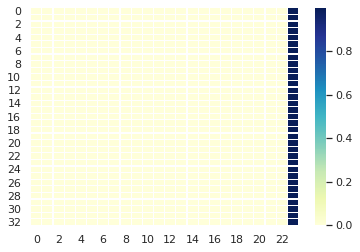

source:  Sea cruise are proved profitable here only .
actual:  सी क्रूज यहीं फायदेमंद साबित होते हैं ।
predicted:  घर या संस्थान काटता है । <eos>
BLEU Score:  0.19817632389021378


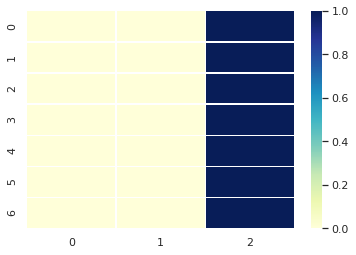

source:  In the first week of December Louis cruise has begun the only see cruise of India from Cochhi for Maldive and Colombo .
actual:  दिसंबर के पहले हफ्ते में कोच्चि से लुई क्रूज ने मालदीव और कोलंबो के लिए भारत का इकलौता सी क्रूज शुरू किया ।
predicted:  कैंसर के बाद या गाँठ या काटने के प्रभावित चाहिए । <eos>
BLEU Score:  0.17847260705223245


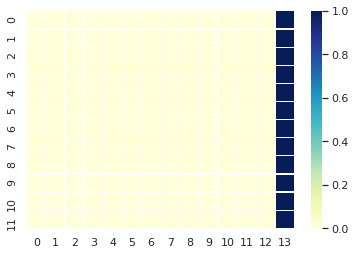

source:  Louis cruise is an European company and is very famous in cruise and hotel industry .
actual:  लुई क्रूज यूरोपीय कंपनी है और क्रूज व होटल व्यवसाय में काफी नामी - गिरामी है ।
predicted:  डायबिटीज से बी दो व्यक्ति को प्रभावित चाहिए । <eos>
BLEU Score:  0.22069091410194555


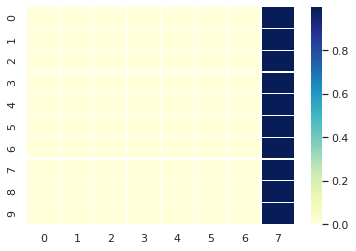

source:  Although due to some problems Lui cruise has postponed its services now but there is hope of them resuming October onwards .
actual:  हालाँकि कुछ दिक्कतों के कारण लुई क्रूज ने अभी अपनी सेवाएँ स्थगित कर दी हैं , लेकिन अक्टूबर से उनके फिर शुरू होने की उम्मीद है ।
predicted:  घर स्वंय भी शीशे में अपना मुख पाया जाना कर जाते हैं । <eos>
BLEU Score:  0.17445211157624774


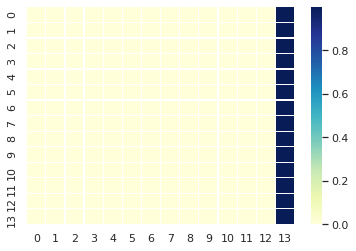

source:  On the plane MV Aquamarine of Louis cruise you can go on three day cruise for the tour of Maldive at rate of minimum Rs . 5850 per person per night .
actual:  लुई क्रूज के जहाज एमवी एक्वामैरिन पर आप कम से कम 5850 रुपये प्रति व्यक्‍ति प्रति रात्रि की दर पर तीन दिन के क्रूज के लिए मालदीव की सैर को जा सकते हैं ।
predicted:  वर्ष से अधिक आयु के वयस्कों के रक्त सर्वाधिक बढ़ जाना चाहिए । <eos>
BLEU Score:  0.16847196522766442


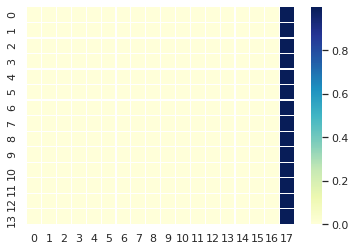

source:  Which means three day fair for one person is even less than Rs . 18 thousand .
actual:  यानी तीन दिन के लिए एक व्यक्‍ति का किराया 18 हजार रुपये से भी कम ।
predicted:  पुत्र की चाहत खेतों करें । <eos>
BLEU Score:  0.18690518620528904


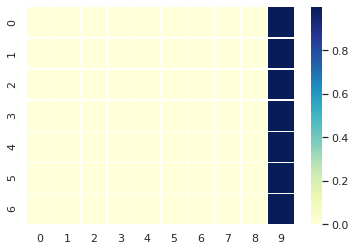

source:  If two elders are there then children less then 15 years of age absolutely free .
actual:  और अगर दो बड़े हों तो 15 साल से कम उम्र के बच्चे बिलकुल फ्री ।
predicted:  घर स्वंय पश्‍चात केयर में रखा जाता है जिससे उनकी शारीरिक रेटिना के रेटिना के रेटिना के रेटिना के रेटिना के पता लगाने के रक्त हो सकती है । <eos>
BLEU Score:  0.18690518620528904


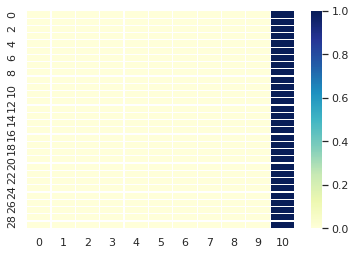

source:  What else is needed .
actual:  और क्या चाहिए ।
predicted:  वर्ष को पूरी आस्तीन का देता है । <eos>
BLEU Score:  0.19564209772076444


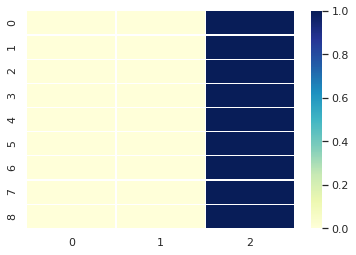

source:  In the fare of cruise tea - snacks , meals everything is included .
actual:  क्रूज के किराये में चाय - नाश्ता , खाना सब शामिल है ।
predicted:  घर बुखार समय या कराया जा सकता है क्योंकि गीले आ सकती है और यह रोग गड्ढों जो सुन्न हो सकती है । <eos>
BLEU Score:  0.19112328397109352


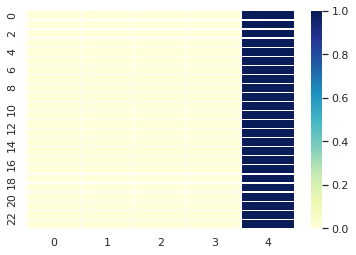

source:  Entertainment is along everytime .
actual:  हर वक्‍त का मनोरंजन साथ में ।
predicted:  डायबिटीज या संस्थान सर्वाधिक प्रभावी । <eos>
BLEU Score:  0.19913749124569236


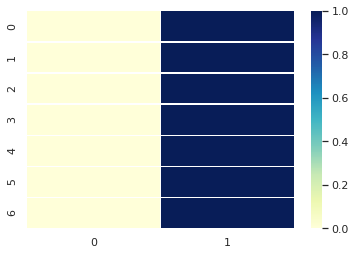

source:  On reaching capital Malè according to your pocket you can enjoy available entertainments , activities - from sea plane ride to underwater lunch .
actual:  राजधानी माले पहुँचकर आप अपनी जेब के हिसाब से मालदीव में उपलब्ध मनोरंजनों , गतिविधियों का मजा ले सकते हैं - सी प्लेन राइड से लेकर अंडरवाटर लंच तक ।
predicted:  घर बुखार समय या रक्त सर्वाधिक चाहिए । <eos>
BLEU Score:  0.1717430532243771


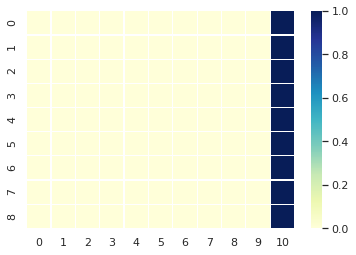

source:  While roaming in huge airplanes if suddenly one Sea plane stands in front of you then it will look like a toy plane to you .
actual:  बड़े-बड़े हवाईजहाजों में घूमते हुए अचानक आपके सामने एक सी प्लेन खड़ा हो जाए तो आपको खिलौने सा लगेगा ।
predicted:  अतः इन्हें जाय तो वर्ष के मैमोग्राम करवाना चाहिए । <eos>
BLEU Score:  0.18184804078107475


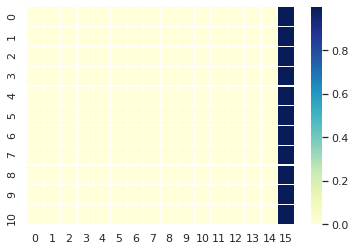

In [44]:
get_prediction(_X,_y,model)

In [0]:
# nameoffile = "q42"
# with open(nameoffile, "wb") as dill_file:
#     dill.dump(model, dill_file)

In [0]:
# model = {}
# with open(nameoffile, "rb") as dill_file:
#   model = dill.load(dill_file)

In [0]:
# print(model['attn_type'])

LuongAttention
